## 할 일
- Idea Generation
- Coding
- Experiment Design
- Execution
- Analysis
- Report
- Presentation
- F1 score가 가장 좋은 모델 선택
- 평가 방식 확인

# Project
- 작성자: 박인애 🍀
- 작성날짜: 2024. 06. 01
- 목적: Binary Classification

## 한글 인코딩
- 보통 그래프 시각화에서 한글 깨짐 현상 발생
- 정상적인 한글 표시를 위해 인코딩
- 근데 지금 영어 강의잖아
- 굳이 필요없을 듯

In [ ]:
'''
import matplotlib.font_manager as fm
import matplotlib as mpl

sys_font = fm.findSystemFonts()
print("sys_font number : {}".format(len(sys_font)))
print(sys_font)

nanum_font = [f for f in sys_font if 'Nanum' in f]
print("nanum_font number : {}".format(len(nanum_font))) # 나눔 폰트 없음.

!apt-get update -qq
!apt-get install fonts-nanum* -qq

sys_font = fm.findSystemFonts()
print("sys_font number : {}".format(len(sys_font)))

nanum_font = [f for f in sys_font if 'Nanum' in f]
print("nanum_font number : {}".format(len(nanum_font)))

fe = fm.FontEntry(fname=r'/usr/share/fonts/truetype/nanum/NanumGothic.ttf', name='NanumGothic')
fm.fontManager.ttflist.insert(0, fe)
plt.rcParams.update({'font.size': 10, 'font.family': 'NanumGothic'})
mpl.rcParams['axes.unicode_minus'] = False
'''

# 📌 데이터셋 불러오기

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
import os

root_dir = "/content/gdrive/MyDrive"

# Checking if our specified directory exists
os.path.exists(root_dir)

True

In [ ]:
import pandas as pd
train_df=pd.read_csv(f'{root_dir}/train.csv')
test_df=pd.read_csv(f'{root_dir}/test.csv')

In [ ]:
train_df

,id,age,job,marital,education,default,housing,loan,contact,month,...,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,12224,46,admin.,married,high.school,unknown,no,no,telephone,jul,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
1,36387,32,admin.,married,university.degree,no,yes,yes,cellular,jun,...,1,999,0,nonexistent,-2.9,92.963,-40.8,1.262,5076.2,yes
2,22703,36,technician,single,university.degree,no,no,no,cellular,aug,...,5,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,no
3,32742,30,services,single,high.school,no,yes,yes,cellular,may,...,1,999,2,failure,-1.8,92.893,-46.2,1.299,5099.1,no
4,40547,76,retired,divorced,basic.4y,no,no,no,cellular,aug,...,1,999,1,failure,-1.7,94.027,-38.3,0.886,4991.6,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32945,24109,37,admin.,married,university.degree,no,yes,no,telephone,nov,...,1,6,1,success,-0.1,93.200,-42.0,4.286,5195.8,no
32946,14149,56,unknown,single,basic.9y,no,no,yes,cellular,jul,...,5,999,0,nonexistent,1.4,93.918,-42.7,4.962,5228.1,no
32947,12379,55,admin.,married,high.school,no,yes,no,cellular,jul,...,3,999,0,nonexistent,1.4,93.918,-42.7,4.960,5228.1,no
32948,10138,34,services,married,high.school,no,no,no,telephone,jun,...,1,999,0,nonexistent,1.4,94.465,-41.8,4.958,5228.1,no


In [ ]:
test_df

,id,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
0,24188,54,admin.,married,university.degree,no,no,no,cellular,nov,mon,1,999,0,nonexistent,-0.1,93.200,-42.0,4.191,5195.8
1,8688,36,entrepreneur,married,university.degree,no,yes,yes,telephone,jun,wed,1,999,0,nonexistent,1.4,94.465,-41.8,4.864,5228.1
2,35789,27,unemployed,married,high.school,no,yes,no,cellular,may,mon,4,999,0,nonexistent,-1.8,92.893,-46.2,1.244,5099.1
3,20034,39,admin.,married,university.degree,no,yes,no,cellular,aug,mon,4,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1
4,11392,43,services,married,high.school,unknown,yes,no,telephone,jun,fri,2,999,0,nonexistent,1.4,94.465,-41.8,4.959,5228.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8233,26975,30,services,married,high.school,no,yes,no,telephone,nov,thu,7,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8
8234,6863,47,admin.,married,high.school,no,yes,no,telephone,may,wed,2,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0
8235,9449,37,entrepreneur,married,basic.9y,no,no,no,telephone,jun,fri,1,999,0,nonexistent,1.4,94.465,-41.8,4.967,5228.1
8236,916,47,services,married,high.school,unknown,yes,no,telephone,may,wed,1,999,0,nonexistent,1.1,93.994,-36.4,4.856,5191.0


In [ ]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [ ]:
train_df[0:100]

,id,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,12224,46,admin.,married,high.school,unknown,no,no,telephone,jul,thu,3,999,0,nonexistent,1.4,93.918,-42.7,4.966,5228.1,no
1,36387,32,admin.,married,university.degree,no,yes,yes,cellular,jun,tue,1,999,0,nonexistent,-2.9,92.963,-40.8,1.262,5076.2,yes
2,22703,36,technician,single,university.degree,no,no,no,cellular,aug,fri,5,999,0,nonexistent,1.4,93.444,-36.1,4.964,5228.1,no
3,32742,30,services,single,high.school,no,yes,yes,cellular,may,mon,1,999,2,failure,-1.8,92.893,-46.2,1.299,5099.1,no
4,40547,76,retired,divorced,basic.4y,no,no,no,cellular,aug,tue,1,999,1,failure,-1.7,94.027,-38.3,0.886,4991.6,yes
5,38368,55,entrepreneur,married,professional.course,no,yes,no,cellular,oct,mon,1,999,0,nonexistent,-3.4,92.431,-26.9,0.739,5017.5,no
6,20650,39,technician,married,professional.course,no,no,no,cellular,aug,wed,1,999,0,nonexistent,1.4,93.444,-36.1,4.965,5228.1,no
7,35509,38,technician,single,professional.course,no,no,no,telephone,may,mon,1,999,0,nonexistent,-1.8,92.893,-46.2,1.244,5099.1,no
8,40780,38,blue-collar,single,high.school,no,yes,no,cellular,sep,wed,1,6,3,success,-1.1,94.199,-37.5,0.879,4963.6,yes
9,16662,26,admin.,single,university.degree,no,yes,no,cellular,jul,wed,5,999,0,nonexistent,1.4,93.918,-42.7,4.963,5228.1,no


In [ ]:
# 끝에서 100개 출력
# default, housing, loan 등에 'unknown' 존재
train_df.tail(100)

,id,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
32850,34735,35,admin.,divorced,high.school,no,yes,no,cellular,may,thu,2,999,0,nonexistent,-1.8,92.893,-46.2,1.266,5099.1,no
32851,26877,46,blue-collar,married,basic.9y,unknown,yes,no,cellular,nov,thu,3,999,0,nonexistent,-0.1,93.200,-42.0,4.076,5195.8,no
32852,25805,35,self-employed,single,university.degree,no,yes,no,cellular,nov,wed,3,999,0,nonexistent,-0.1,93.200,-42.0,4.120,5195.8,no
32853,39553,29,services,single,unknown,no,yes,no,cellular,apr,thu,5,999,0,nonexistent,-1.8,93.749,-34.6,0.659,5008.7,yes
32854,37833,46,self-employed,married,university.degree,no,yes,no,cellular,aug,thu,2,999,0,nonexistent,-2.9,92.201,-31.4,0.829,5076.2,no
32855,5113,22,blue-collar,single,basic.6y,unknown,no,yes,telephone,may,fri,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,yes
32856,9196,37,blue-collar,married,basic.9y,no,yes,no,telephone,jun,fri,1,999,0,nonexistent,1.4,94.465,-41.8,4.967,5228.1,no
32857,9188,42,retired,married,basic.9y,unknown,no,no,telephone,jun,fri,1,999,0,nonexistent,1.4,94.465,-41.8,4.967,5228.1,no
32858,40005,26,admin.,married,high.school,no,yes,yes,cellular,jun,wed,2,999,1,failure,-1.7,94.055,-39.8,0.767,4991.6,yes
32859,5230,57,blue-collar,married,basic.4y,unknown,yes,yes,telephone,may,fri,2,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [ ]:
# 결측치가 없다고 뜬다
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32950 entries, 0 to 32949
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              32950 non-null  int64  
 1   age             32950 non-null  int64  
 2   job             32950 non-null  object 
 3   marital         32950 non-null  object 
 4   education       32950 non-null  object 
 5   default         32950 non-null  object 
 6   housing         32950 non-null  object 
 7   loan            32950 non-null  object 
 8   contact         32950 non-null  object 
 9   month           32950 non-null  object 
 10  day_of_week     32950 non-null  object 
 11  campaign        32950 non-null  int64  
 12  pdays           32950 non-null  int64  
 13  previous        32950 non-null  int64  
 14  poutcome        32950 non-null  object 
 15  emp.var.rate    32950 non-null  float64
 16  cons.price.idx  32950 non-null  float64
 17  cons.conf.idx   32950 non-null 

In [ ]:
# 데이터프레임의 각 열에서 'unknown' 값이 들어있는 개수 구하기
unknown_counts = train_df.eq('unknown').sum()
unknown_counts

id                   0
age                  0
job                257
marital             62
education         1388
default           6853
housing            799
loan               799
contact              0
month                0
day_of_week          0
campaign             0
pdays                0
previous             0
poutcome             0
emp.var.rate         0
cons.price.idx       0
cons.conf.idx        0
euribor3m            0
nr.employed          0
y                    0
dtype: int64

# 📌 EDA
- 생략하겠음

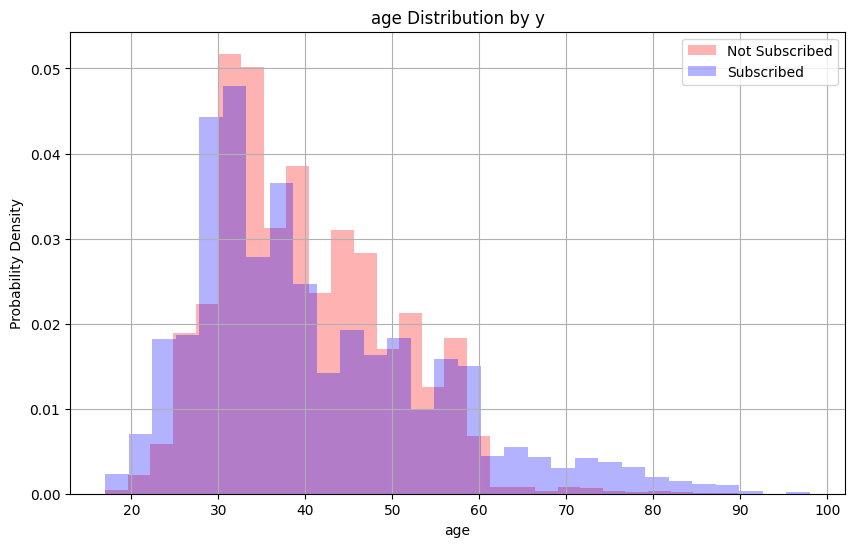

In [ ]:
train_df_original = pd.read_csv(f'{root_dir}/train.csv')
temp_df = train_df_original.copy()
target = 'y'
col = 'age'

bins = 30
density = True
alpha = 0.3

plt.figure(figsize=(10, 6))
temp_df[temp_df[target] == 'no'][col].hist(bins=bins, density=density, alpha=alpha, color="red", label="Not Subscribed")
temp_df[temp_df[target] == 'yes'][col].hist(bins=bins, density=density, alpha=alpha, color="blue", label="Subscribed")

plt.title("{} Distribution by {}".format(col, target))
plt.xlabel(col)
plt.ylabel("Probability Density")
plt.legend()
plt.show()

# 📌 전처리

## 1. 결측치 처리
#### 1-1. 숨어있는 결측치 찾기
- 'unknown' 값을 결측치로 취급
   - job
   - marital
   - education
   - default
   - housing
   - loan
- 참고로, 현재 결측치가 존재하는 columns는 모두 범주형 데이터

In [ ]:
import numpy as np

# 'unknown' 값을 NaN(결측치)으로 처리 후 반환
train_df = train_df.replace('unknown', np.nan, inplace=False)

In [ ]:
train_df.eq('unknown').sum()

id                0
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64

#### 1-2. 결측치 처리

- M1. sklearn.impute.SimpleImputer
   - SimpleImputer는 단변량 결측치 처리를 위한 간단한 전략을 제공합니다.
   - 결측치 대체 전략으로 평균, 중앙값, 최빈값, 상수값 등을 사용할 수 있습니다.
```
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')
X_imputed = imputer.fit_transform(X)
```

-
  - 다만 SimpleImputer 결과는 df가 아닌 numpy.ndarray이라서 df로 변환이 필요
```
imputer = SimpleImputer(strategy='most_frequent')  # 최빈도 값으로 대체
imputer.fit_transform(train_df)
```
```
# NumPy 배열을 Pandas DataFrame으로 변환
pd.DataFrame(imputer.fit_transform(train_df))
```

In [ ]:
from sklearn.impute import SimpleImputer

# M1
imputer = SimpleImputer(strategy='most_frequent')
imputed = pd.DataFrame(imputer.fit_transform(train_df))

# 컬럼명이 index로 변해져있음 -> 원래대로 변경
imputed.columns = train_df.columns

# df -> array로 바뀜에 따라
# 수치형 데이터의 Dtype이 모두 object로 바뀜 -> 원래대로 변경
imputed['id'] = imputed['id'].astype(int)
imputed['age'] = imputed['age'].astype(int)
imputed['campaign'] = imputed['campaign'].astype(int)
imputed['pdays'] = imputed['pdays'].astype(int)
imputed['previous'] = imputed['previous'].astype(int)

imputed['emp.var.rate'] = imputed['emp.var.rate'].astype(float)
imputed['cons.price.idx'] = imputed['cons.price.idx'].astype(float)
imputed['cons.conf.idx'] = imputed['cons.conf.idx'].astype(float)
imputed['euribor3m'] = imputed['euribor3m'].astype(float)
imputed['nr.employed'] = imputed['nr.employed'].astype(float)

print(imputed.isnull().sum())

id                0
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64
id                0
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64


In [ ]:
imputed.head(2)

,id,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,12224,46,admin.,married,high.school,no,no,no,telephone,jul,thu,3,999,0,failure,1.4,93.918,-42.7,4.966,5228.1,no
1,36387,32,admin.,married,university.degree,no,yes,yes,cellular,jun,tue,1,999,0,failure,-2.9,92.963,-40.8,1.262,5076.2,yes


In [ ]:
# 원상복구 완료
imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32950 entries, 0 to 32949
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              32950 non-null  int64  
 1   age             32950 non-null  int64  
 2   job             32950 non-null  object 
 3   marital         32950 non-null  object 
 4   education       32950 non-null  object 
 5   default         32950 non-null  object 
 6   housing         32950 non-null  object 
 7   loan            32950 non-null  object 
 8   contact         32950 non-null  object 
 9   month           32950 non-null  object 
 10  day_of_week     32950 non-null  object 
 11  campaign        32950 non-null  int64  
 12  pdays           32950 non-null  int64  
 13  previous        32950 non-null  int64  
 14  poutcome        32950 non-null  object 
 15  emp.var.rate    32950 non-null  float64
 16  cons.price.idx  32950 non-null  float64
 17  cons.conf.idx   32950 non-null 

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32950 entries, 0 to 32949
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              32950 non-null  int64  
 1   age             32950 non-null  int64  
 2   job             32950 non-null  object 
 3   marital         32950 non-null  object 
 4   education       32950 non-null  object 
 5   default         32950 non-null  object 
 6   housing         32950 non-null  object 
 7   loan            32950 non-null  object 
 8   contact         32950 non-null  object 
 9   month           32950 non-null  object 
 10  day_of_week     32950 non-null  object 
 11  campaign        32950 non-null  int64  
 12  pdays           32950 non-null  int64  
 13  previous        32950 non-null  int64  
 14  poutcome        32950 non-null  object 
 15  emp.var.rate    32950 non-null  float64
 16  cons.price.idx  32950 non-null  float64
 17  cons.conf.idx   32950 non-null 

- M2.sklearn.impute.KNNImputer
   - KNNImputer는 k-최근접 이웃 알고리즘을 사용하여 결측치를 추정합니다.
   - 각 샘플의 결측값은 훈련 세트에서 찾은 n_neighbors 개의 가장 가까운 이웃의 평균값으로 대체됩니다.
```
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
X_imputed = imputer.fit_transform(X)
```

In [ ]:
# 수치형 데이터의 결측치를 처리하는 법
# 범주형이라 에러 발생
'''
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=3)
imputed.append(imputer.fit_transform(train_df[i]))

ValueError: could not convert string to float: 'admin.'

- M3. sklearn.impute.IterativeImputer
   - IterativeImputer는 다변량 결측치 처리를 위해 각 변수를 다른 변수들의 함수로 모델링하는 반복적인 접근 방식을 사용합니다.
   - 기본 추정기로 BayesianRidge를 사용하지만, 다른 추정기로 대체할 수 있습니다.
   - https://scikit-learn.org/stable/auto_examples/impute/plot_iterative_imputer_variants_comparison.html
   - https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html#sklearn.ensemble.RandomForestRegressor
```
from sklearn.impute import IterativeImputer
from sklearn.linear_model import BayesianRidge
imputer = IterativeImputer(estimator=BayesianRidge())
X_imputed = imputer.fit_transform(X)
```

In [ ]:
'''
ImportError                               Traceback (most recent call last)
<ipython-input-44-2e7eda69ff0e> in <cell line: 1>()
----> 1 from sklearn.impute import IterativeImputer
      2 from sklearn.ensemble import RandomForestRegressor
      3 from sklearn.linear_model import BayesianRidge

/usr/local/lib/python3.10/dist-packages/sklearn/impute/__init__.py in __getattr__(name)
     16 def __getattr__(name):
     17     if name == "IterativeImputer":
---> 18         raise ImportError(
     19             f"{name} is experimental and the API might change without any "
     20             "deprecation cycle. To use it, you need to explicitly import "

ImportError: IterativeImputer is experimental and the API might change without any deprecation cycle. To use it, you need to explicitly import enable_iterative_imputer:
from sklearn.experimental import enable_iterative_imputer

---------------------------------------------------------------------------
NOTE: If your import is failing due to a missing package, you can
manually install dependencies using either !pip or !apt.

To view examples of installing some common dependencies, click the
"Open Examples" button below.
---------------------------------------------------------------------------
'''
'''
Solution: enable_iterative_imputer도 임포트해준다

from sklearn.experimental import enable_iterative_imputer
'''

In [ ]:
# 나중에 인코딩하고 사용해봐야겠네
'''
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import BayesianRidge

imputer = IterativeImputer(estimator=RandomForestRegressor())
for i in range(len(train_df_group)):
  imputed_group.append(imputer.fit_transform(train_df_group[i]))
'''
'''
imputer = IterativeImputer(estimator=BayesianRidge())
for i in range(len(train_df_group)):
  imputed_group.append(imputer.fit_transform(train_df_group[i]))
'''

ValueError: could not convert string to float: 'admin.'

In [ ]:
# 결측치가 있었던 columns에 대해
cols =  ['job', 'marital', 'education', 'default', 'housing', 'loan', 'poutcome']

# M2
df = imputed.copy()
  for col in cols:
    df[col].fillna(df[col].mode()[0], inplace=True)

  # 확인
  print(df.isnull().sum())

id                0
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64
id                0
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64


In [ ]:
# 결측치 데이터 삭제 - 비추천
df = imputed.dropna(inplace=False)
print(df.isnull().sum())

id                0
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64
id                0
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64


- 결측치 처리 전(train_df 원본), 후 비교
- 시각화

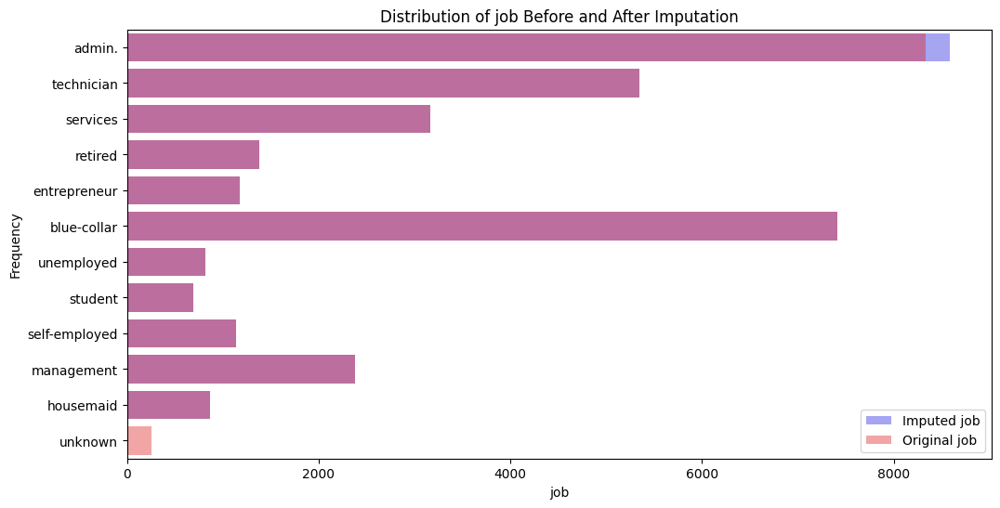

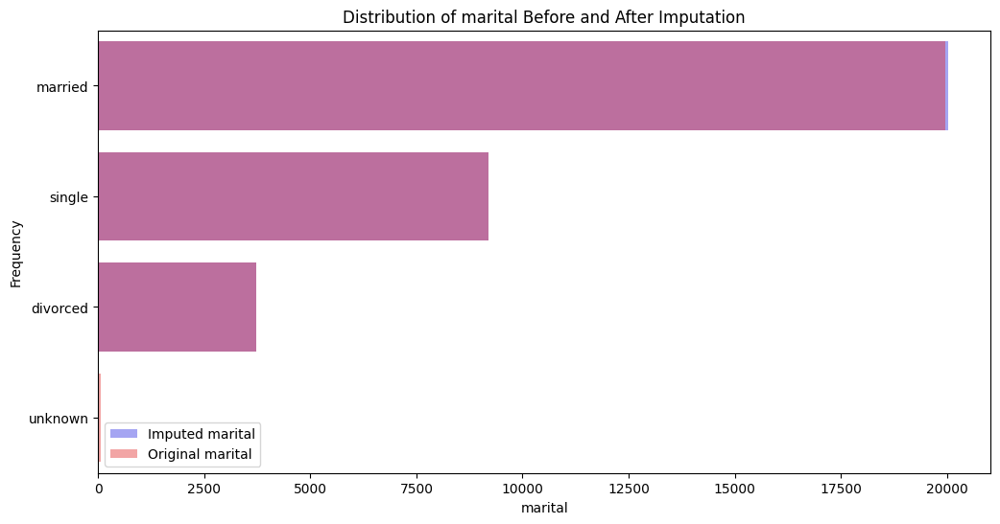

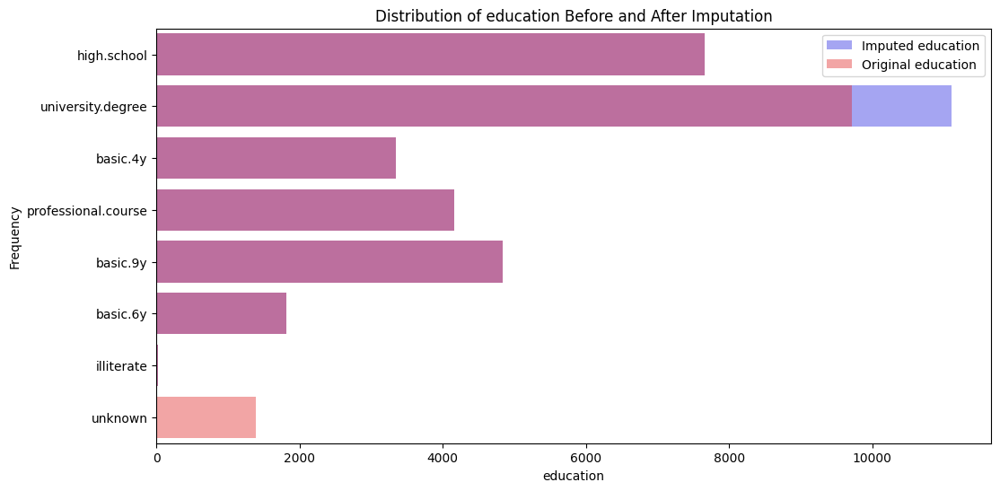

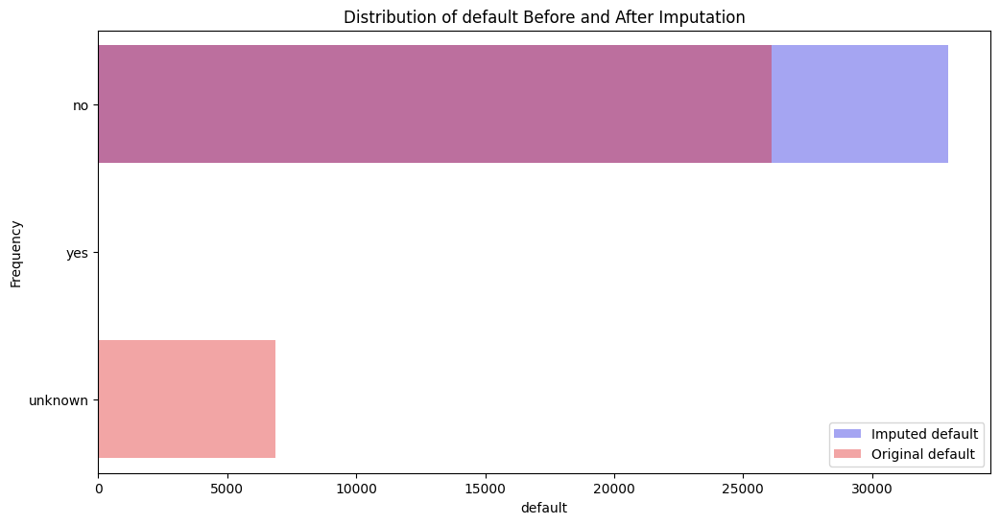

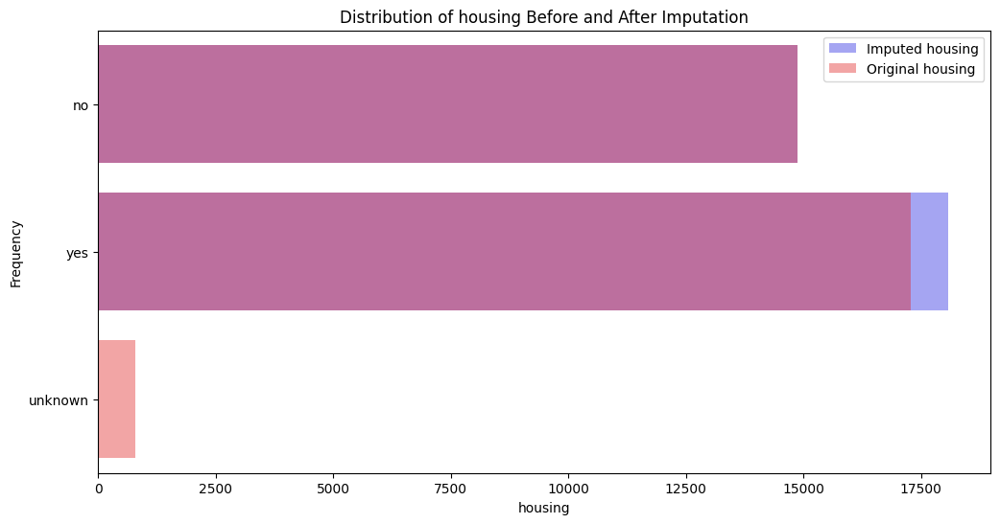

...

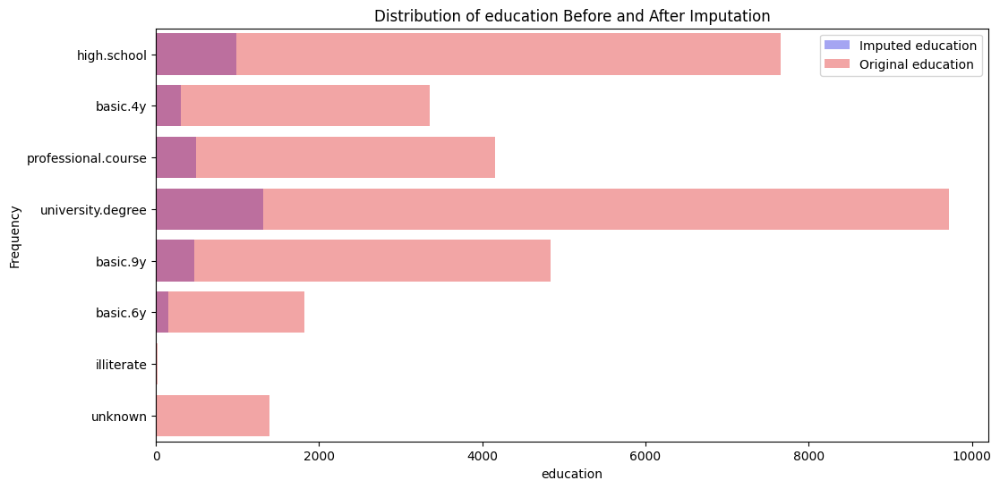

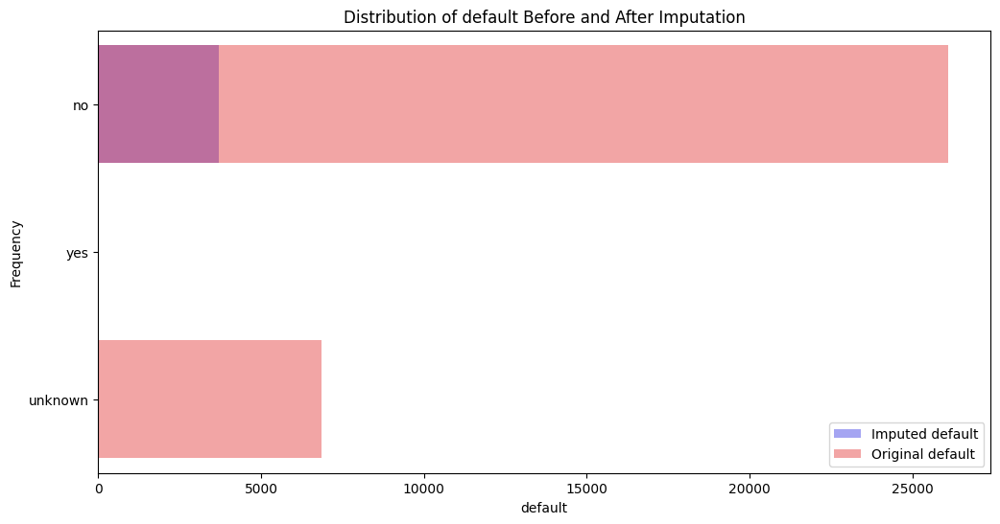

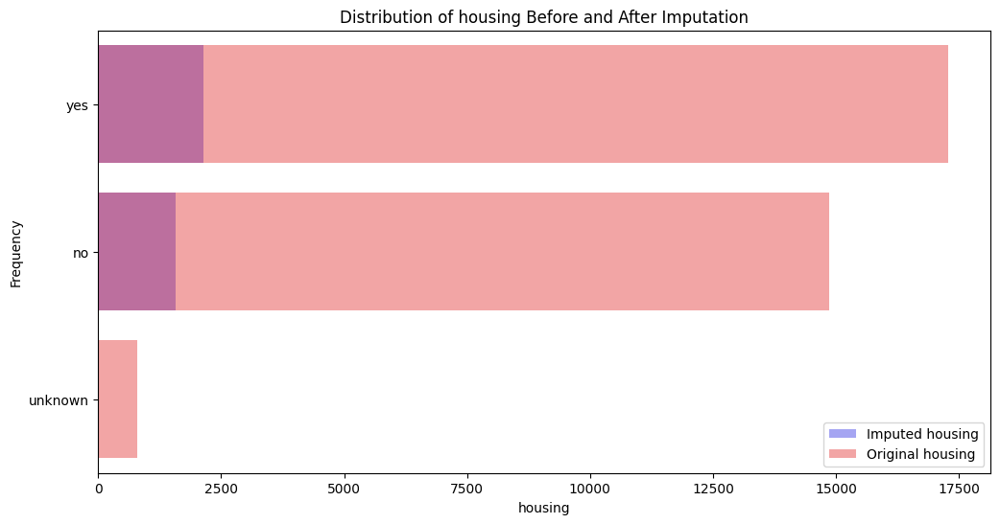

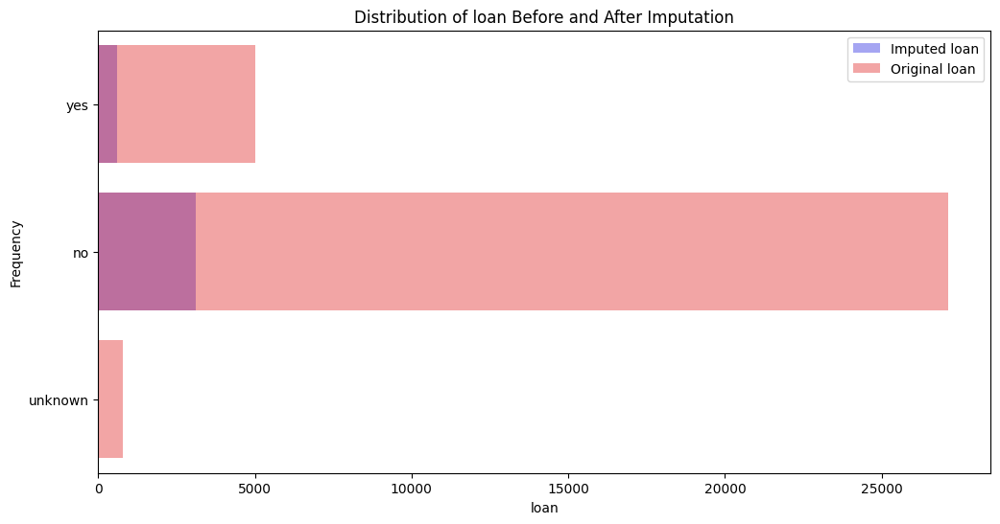

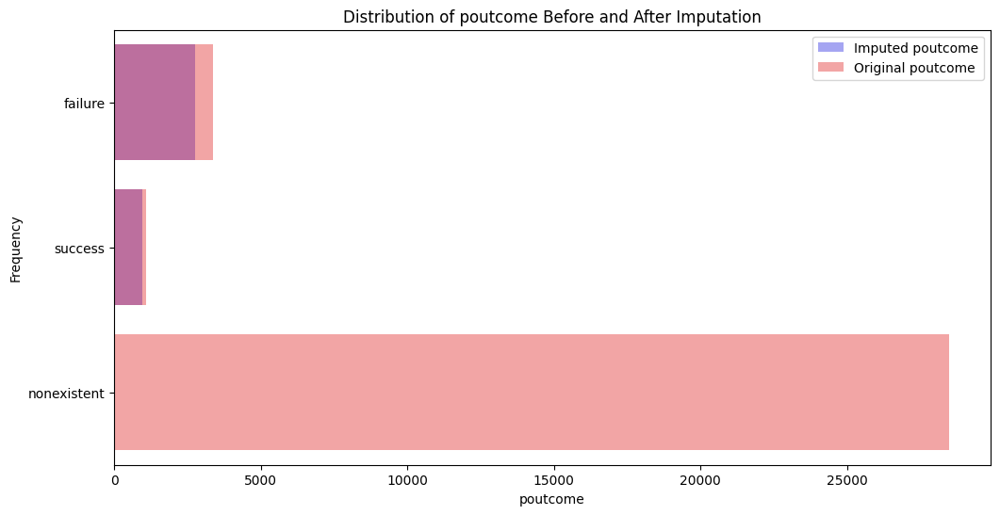

In [ ]:
# 결측치가 있던 컬럼은 피쳐에서 제외 후 실험
cols =  ['job', 'marital', 'education', 'default', 'housing', 'loan', 'poutcome']

import matplotlib.pyplot as plt
import seaborn as sns

for df in imputed_group:
  for col in cols:
    plt.figure(figsize=(12, 6))

    sns.countplot(df[col], color='blue', alpha=0.4, label=f'Imputed {col}')
    sns.countplot(train_df[col], color='red', alpha=0.4, label=f'Original {col}')

    plt.legend()
    plt.title(f'Distribution of {col} Before and After Imputation')
    plt.xlabel(f'{col}')
    plt.ylabel('Frequency')
    plt.show()

## 2. Outlier Detection
- 이상치 확인 및 시각화

#### IQR

0-th df에 대한 이상치 확인


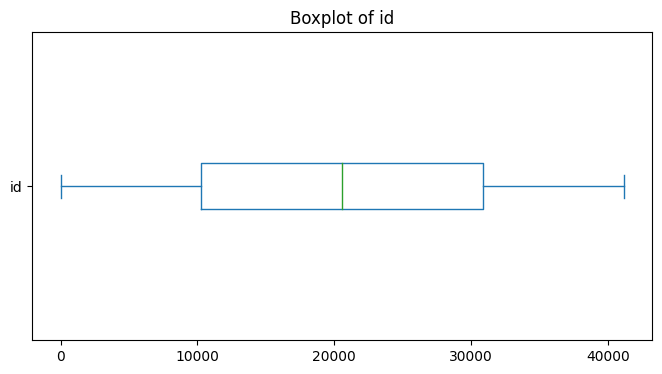

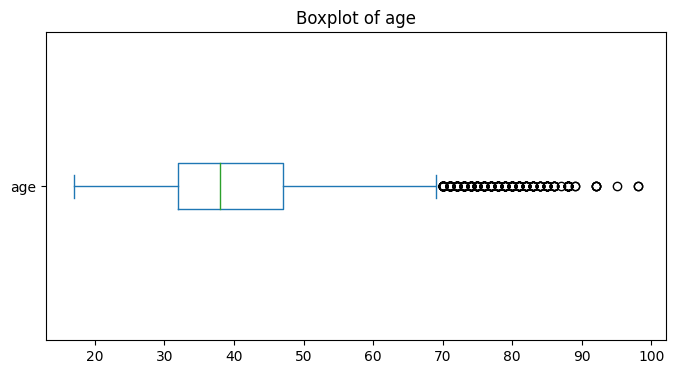

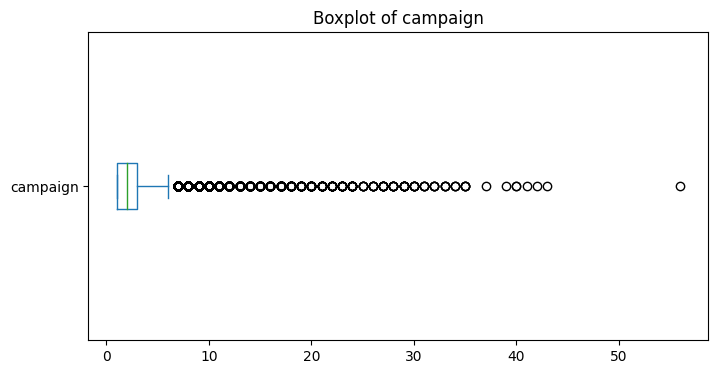

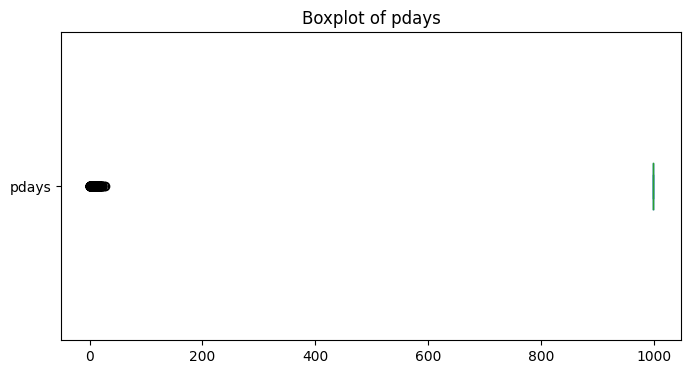

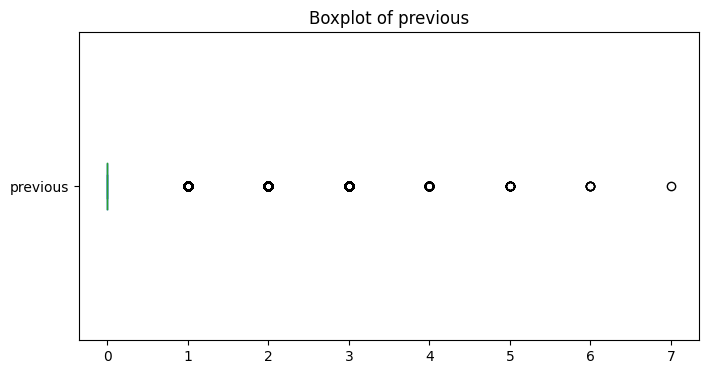

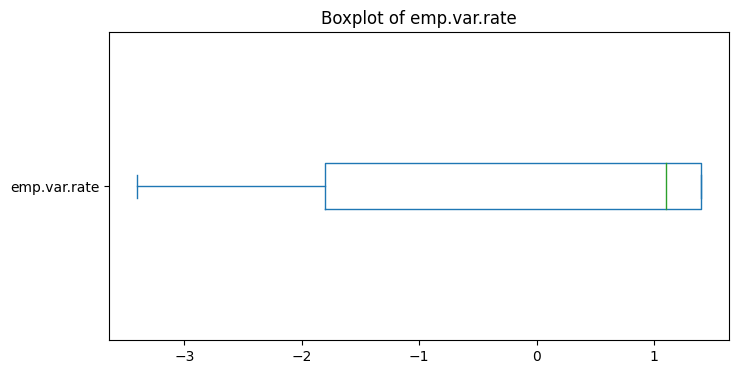

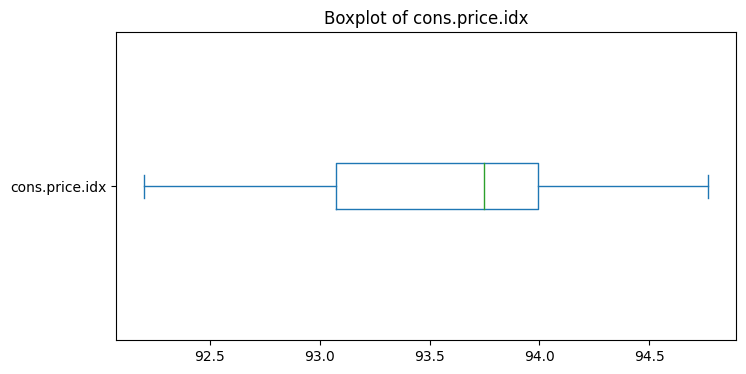

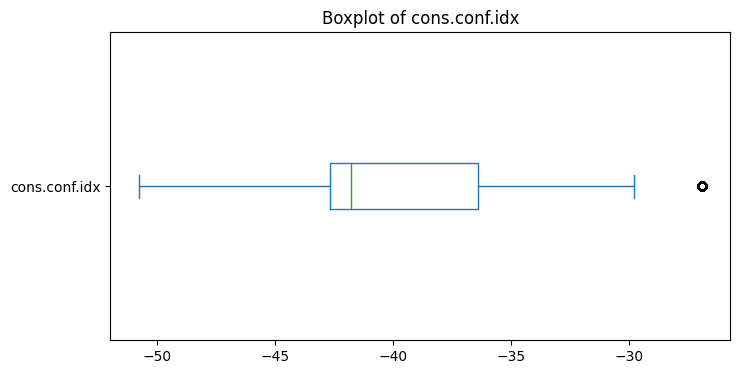

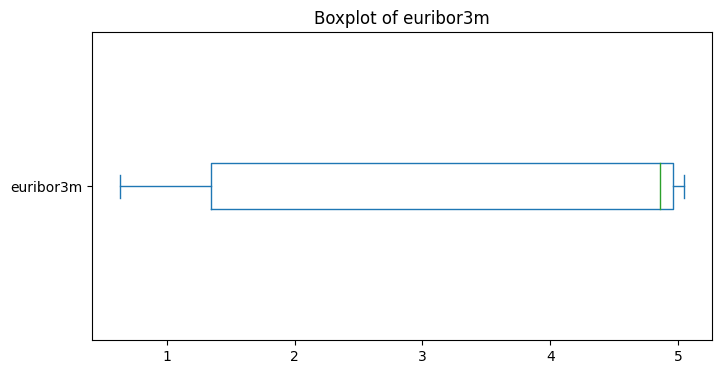

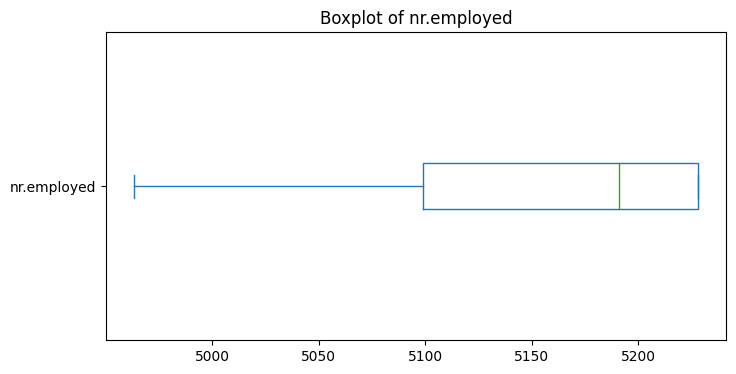

1-th df에 대한 이상치 확인


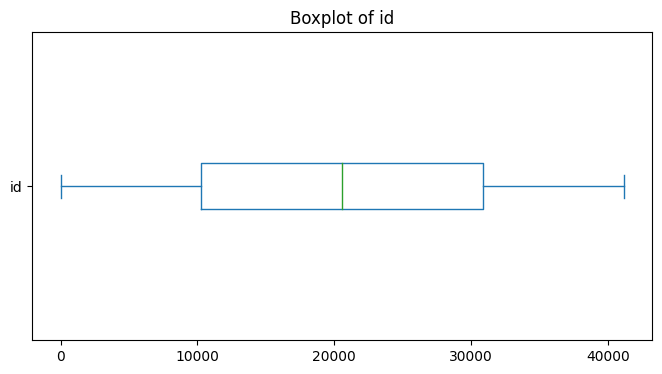

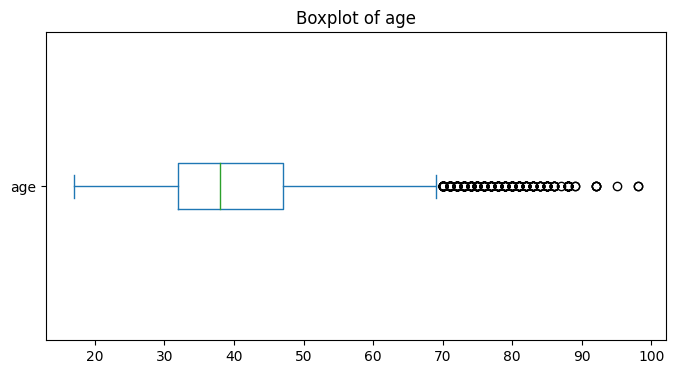

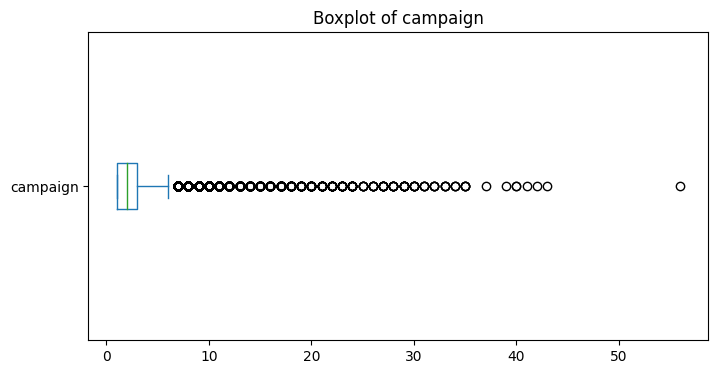

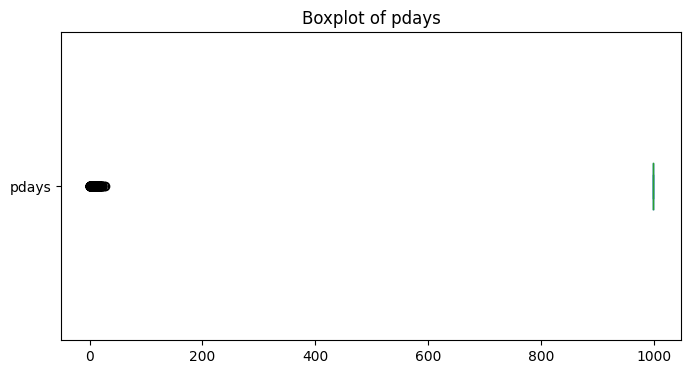

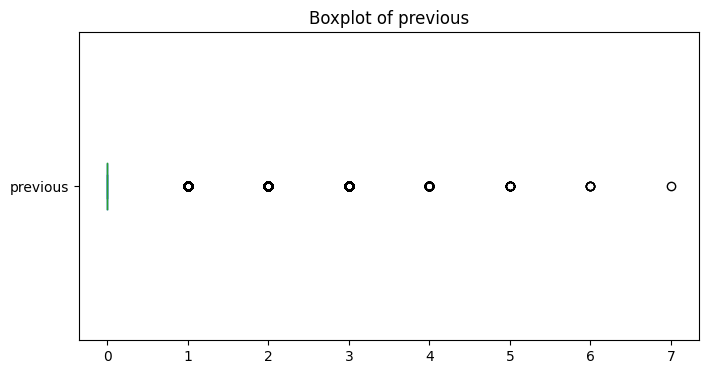

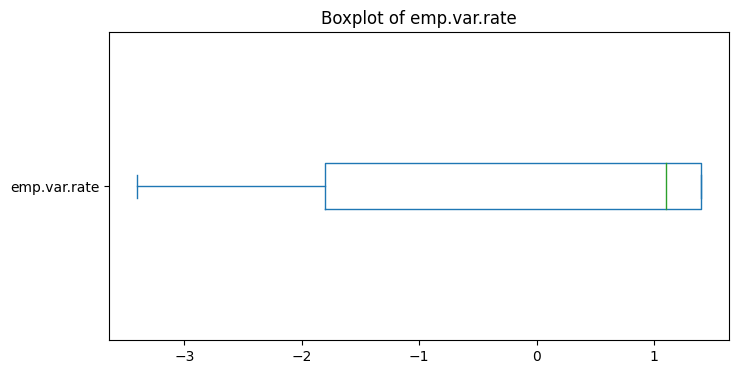

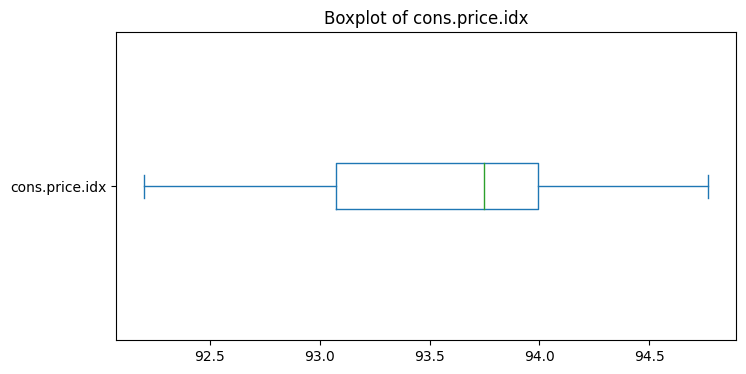

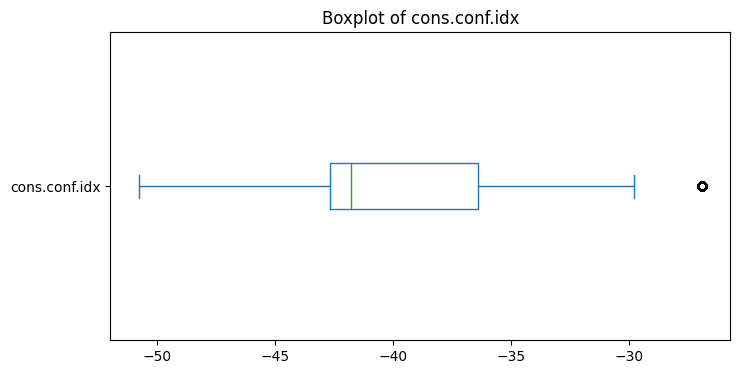

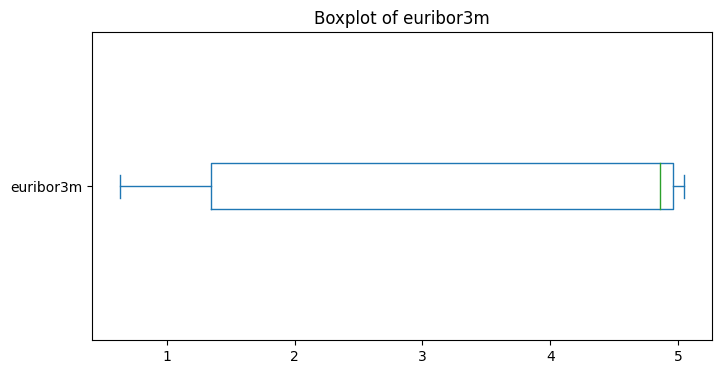

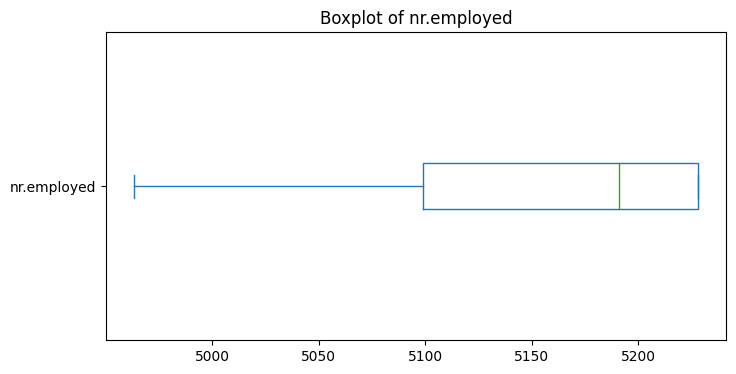

2-th df에 대한 이상치 확인


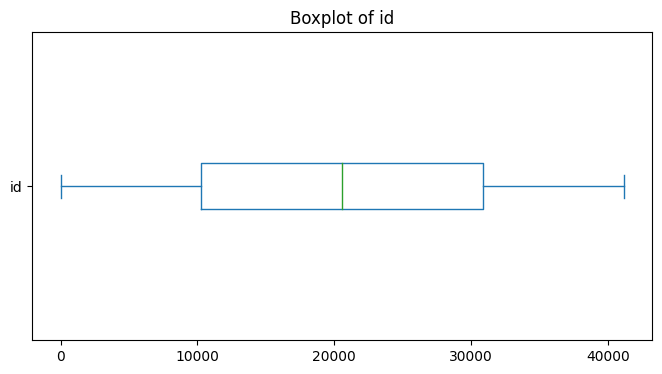

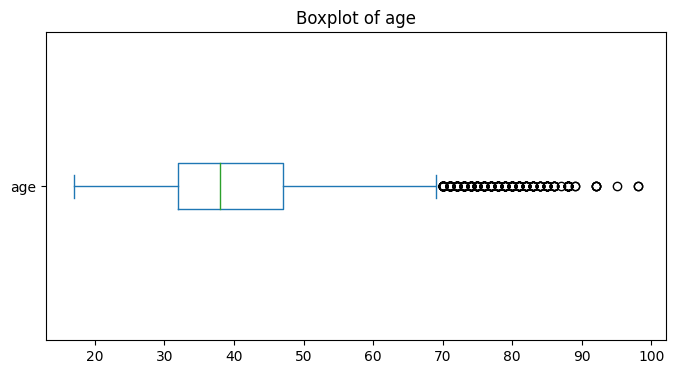

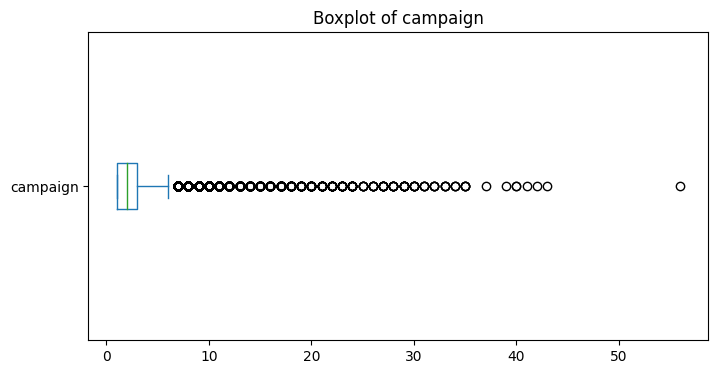

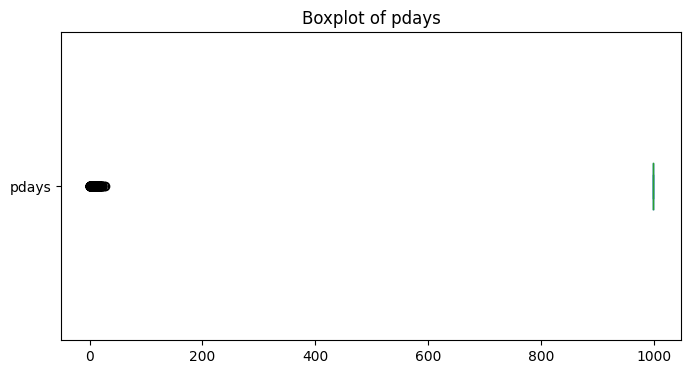

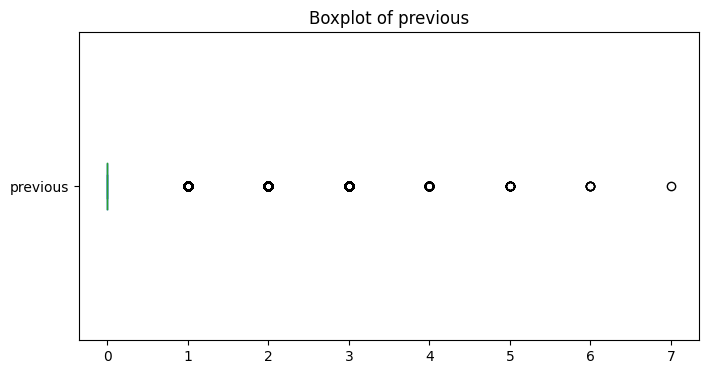

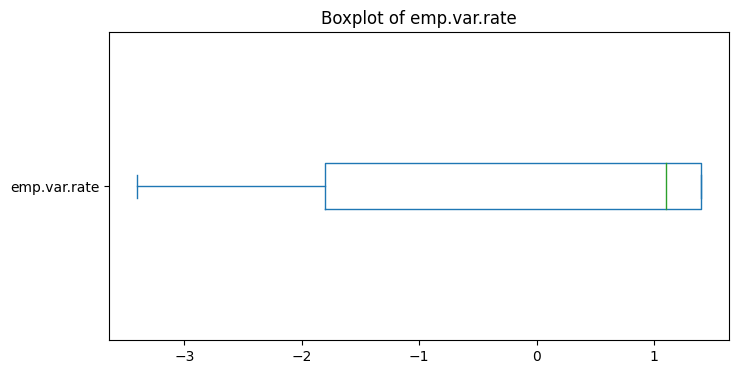

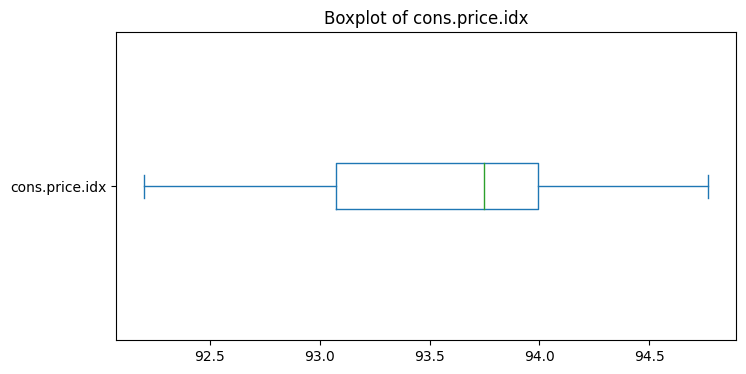

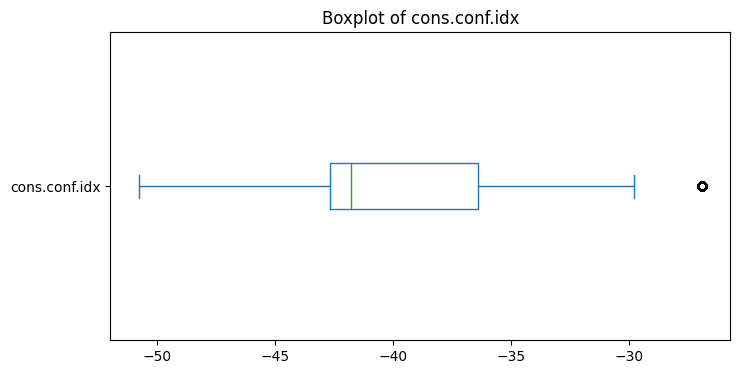

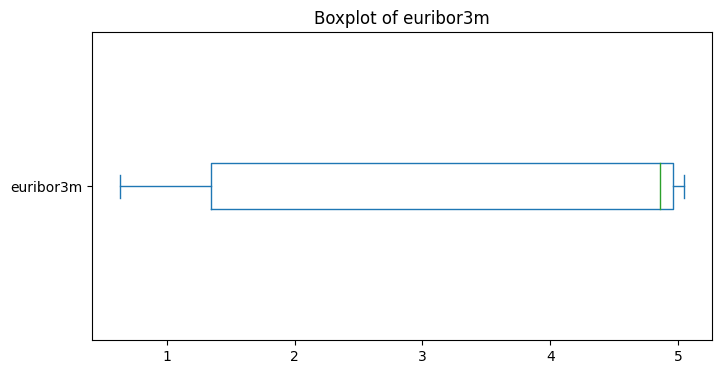

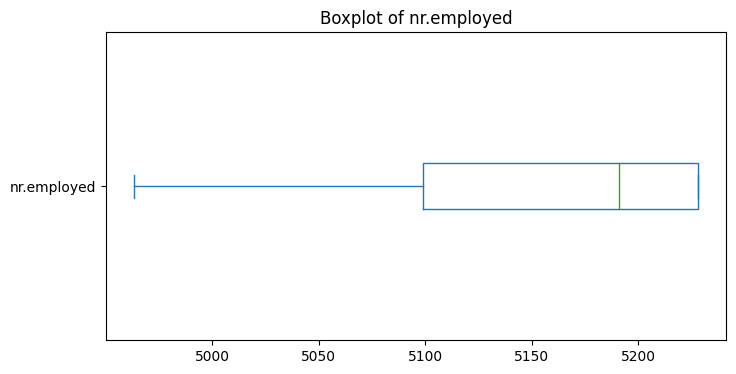

3-th df에 대한 이상치 확인


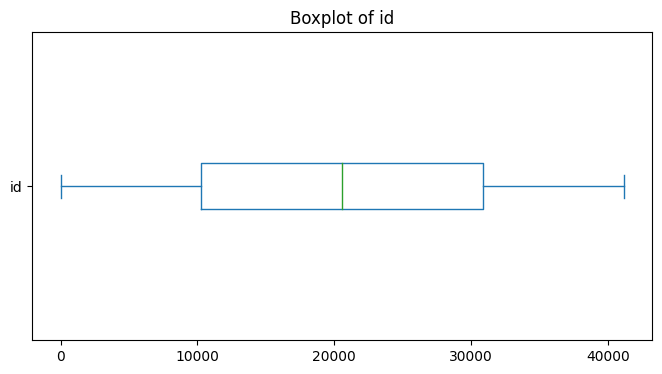

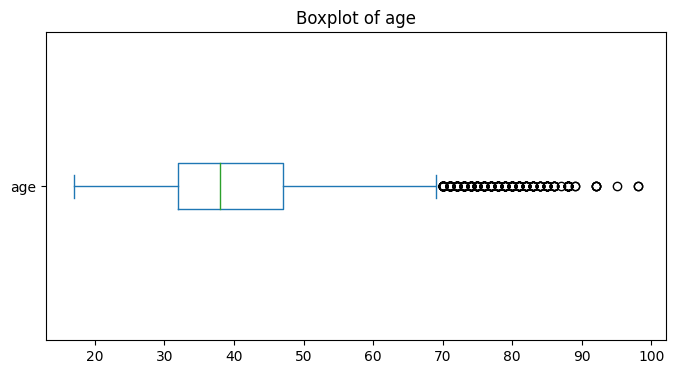

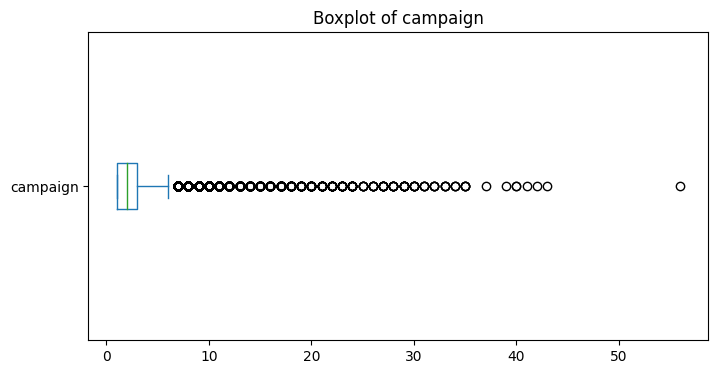

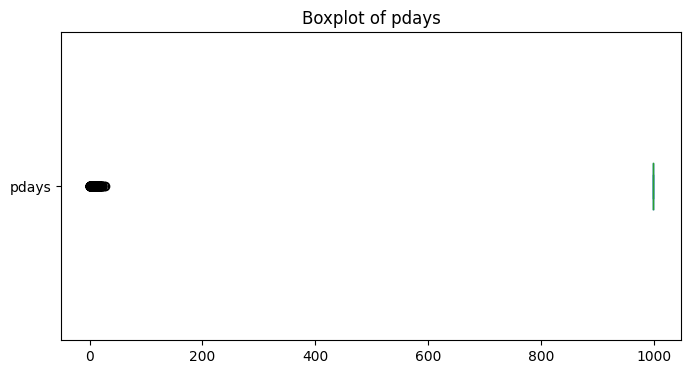

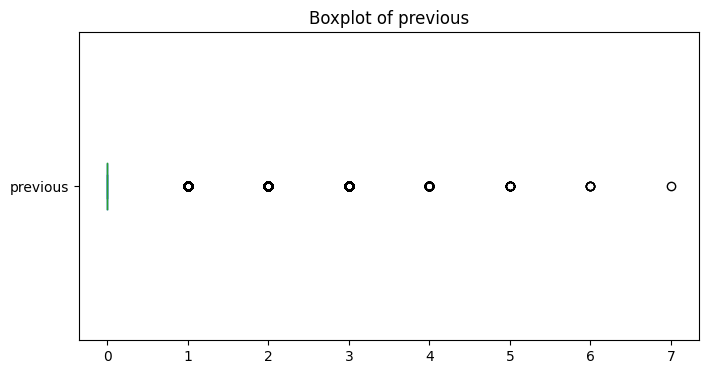

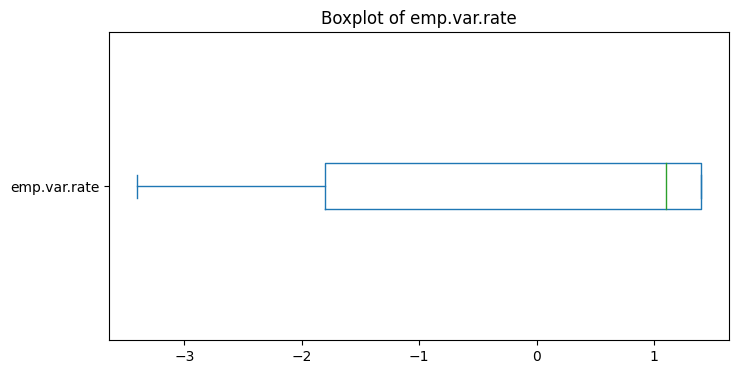

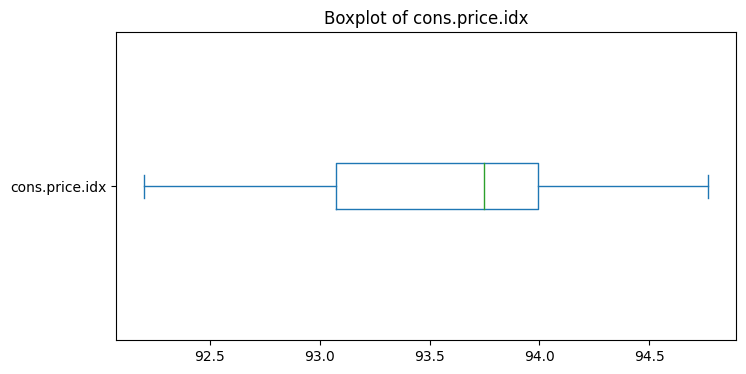

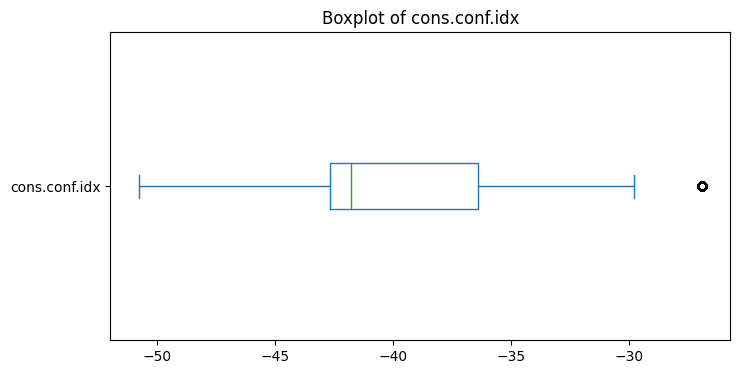

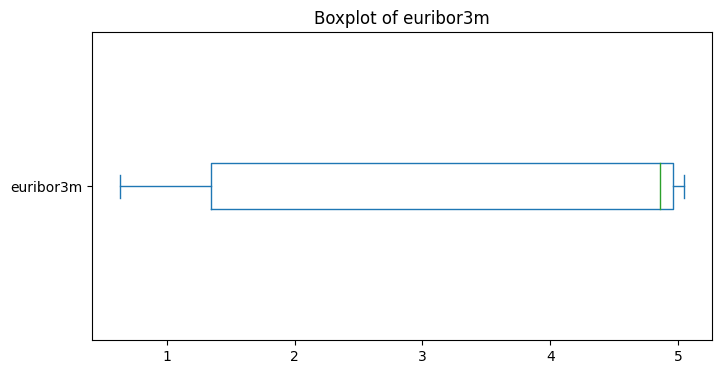

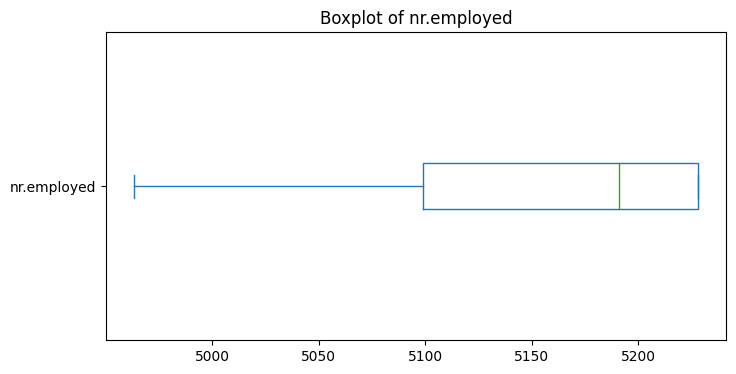

4-th df에 대한 이상치 확인


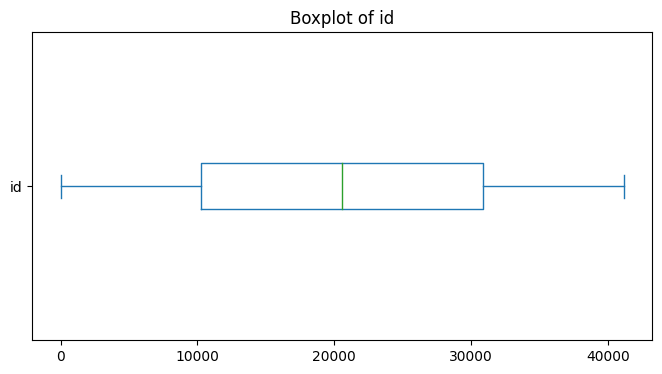

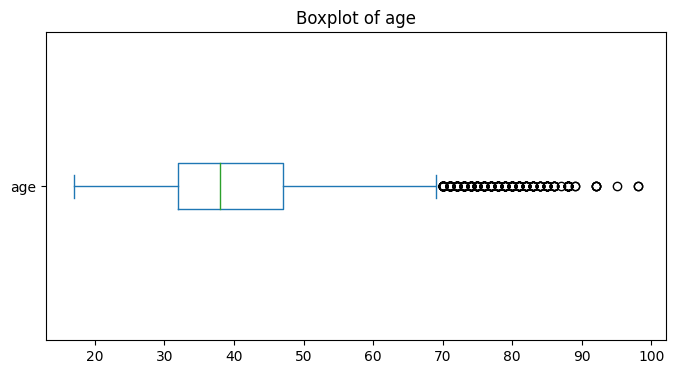

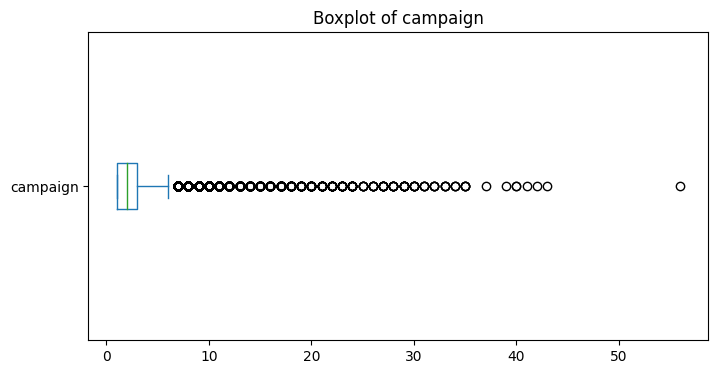

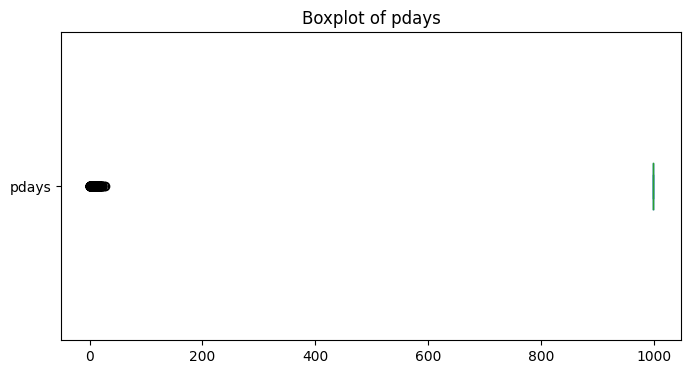

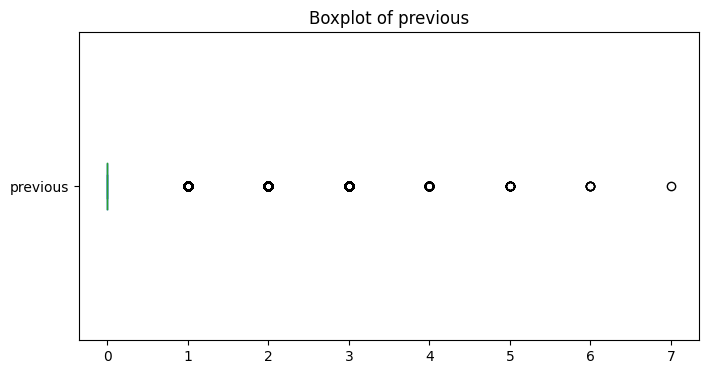

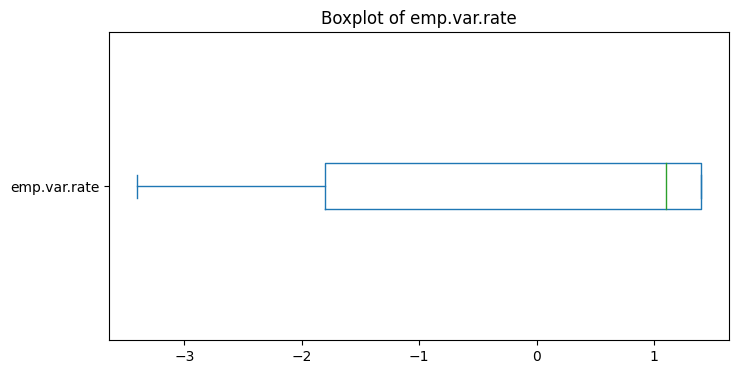

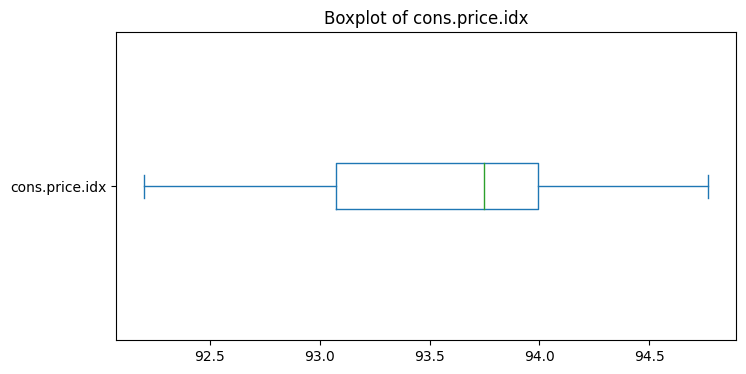

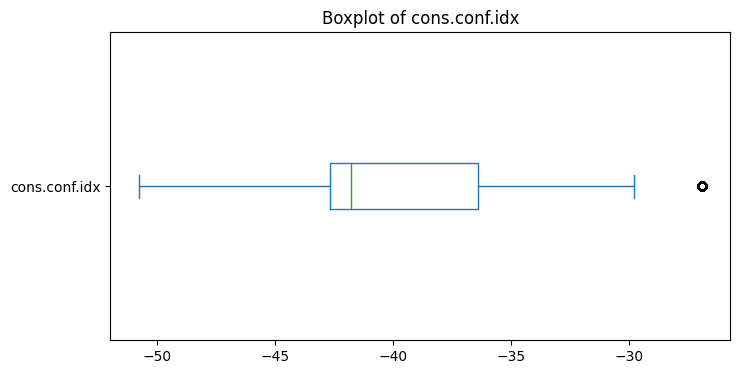

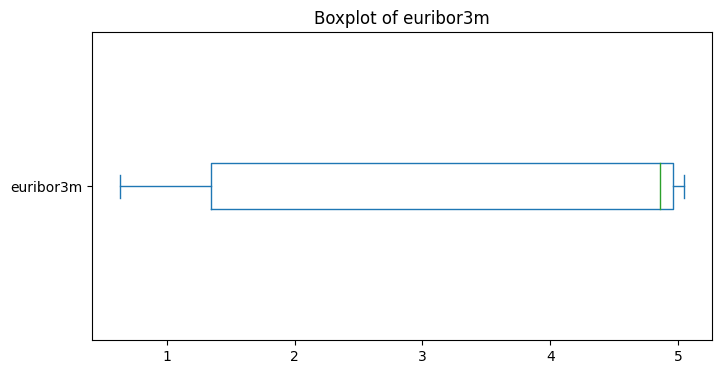

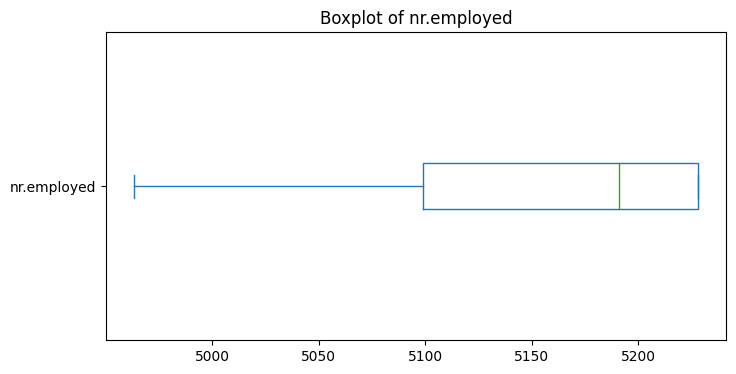

5-th df에 대한 이상치 확인


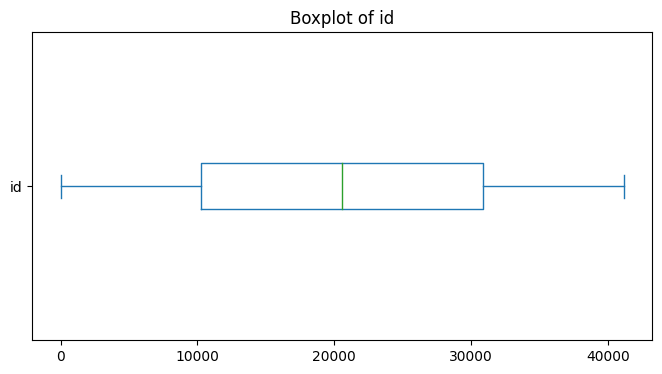

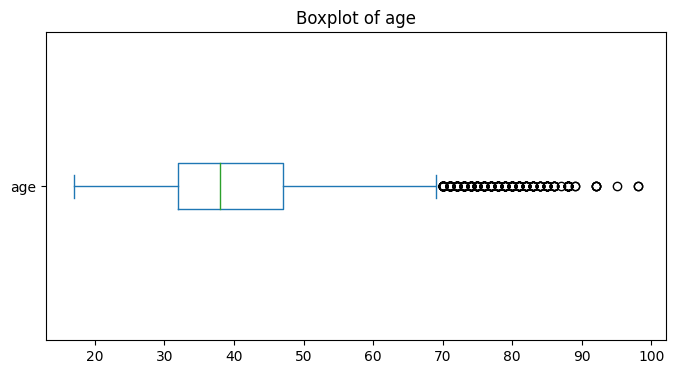

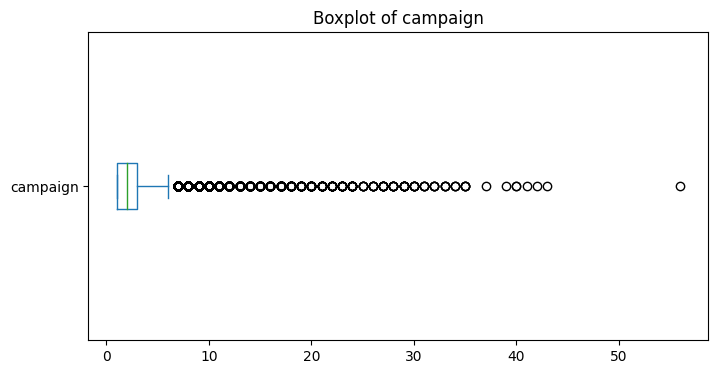

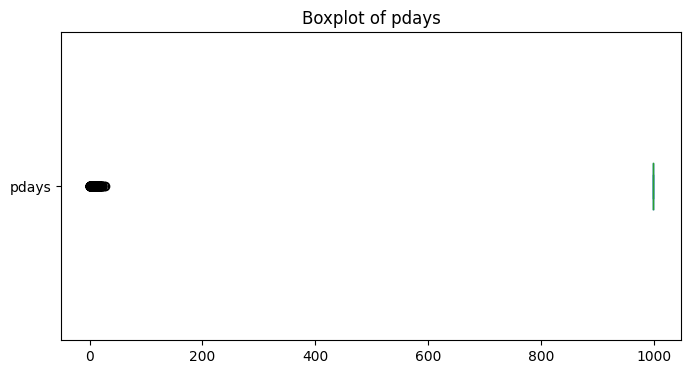

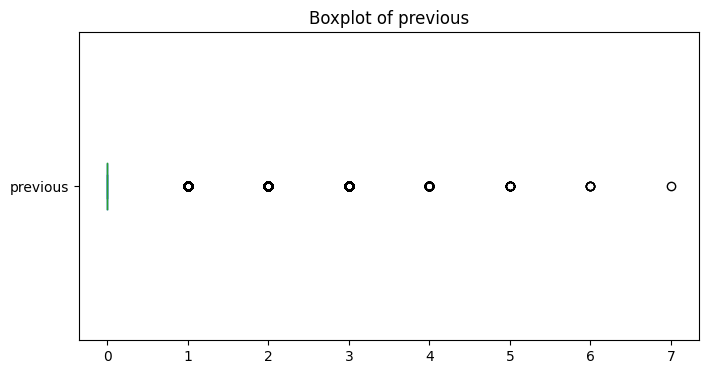

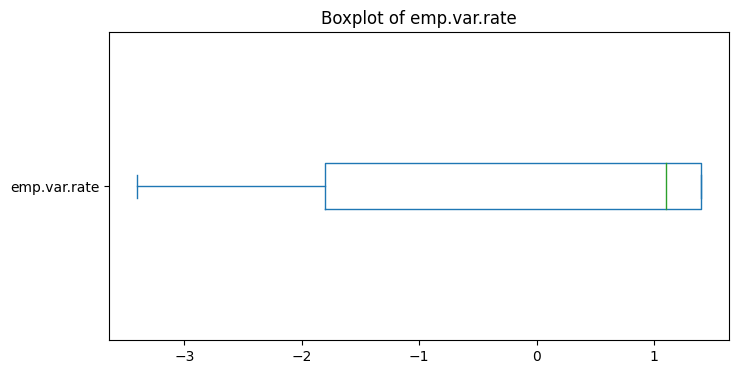

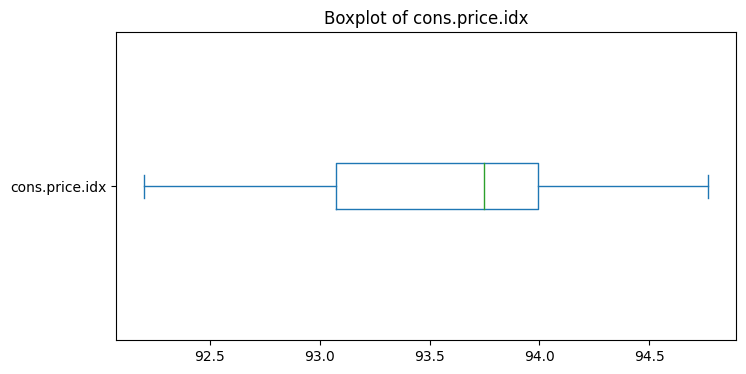

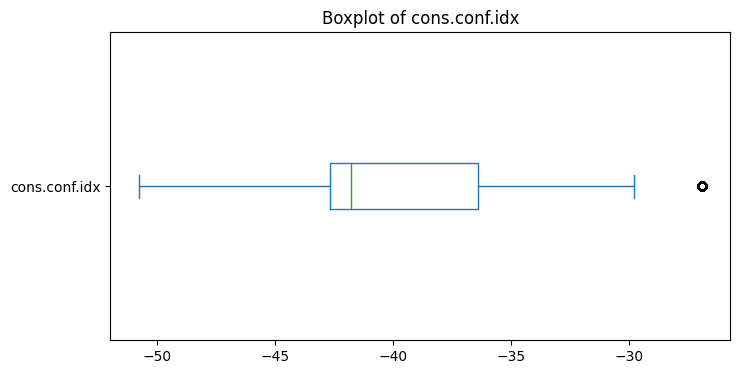

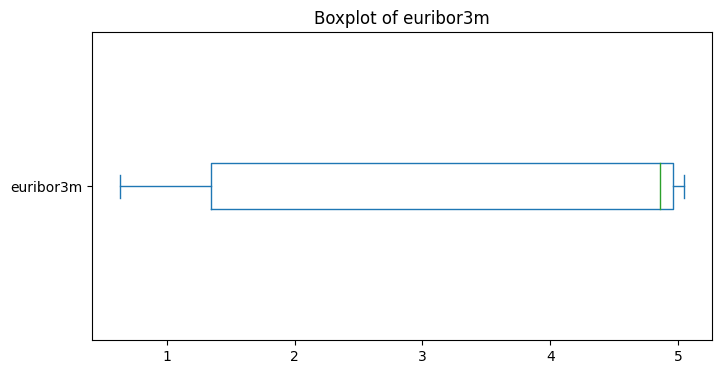

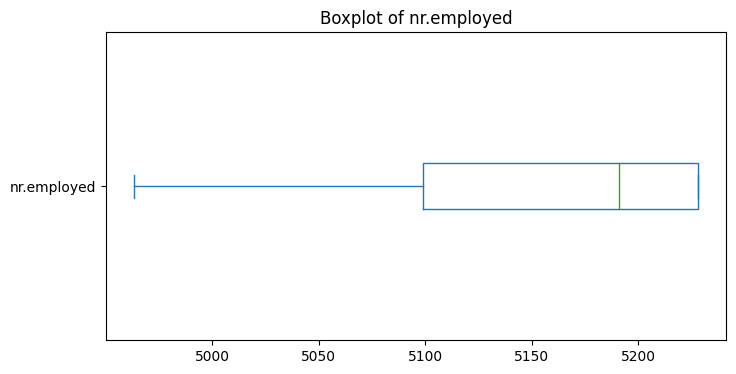

6-th df에 대한 이상치 확인


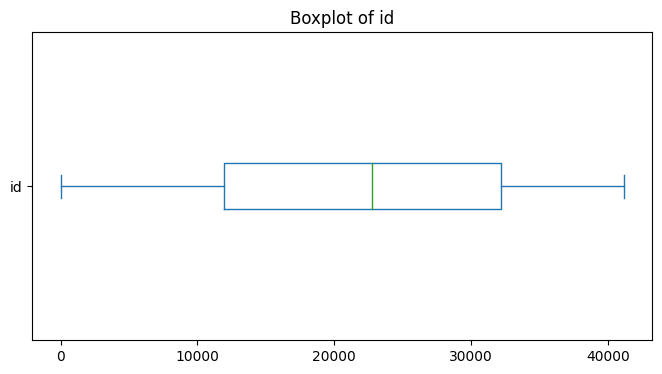

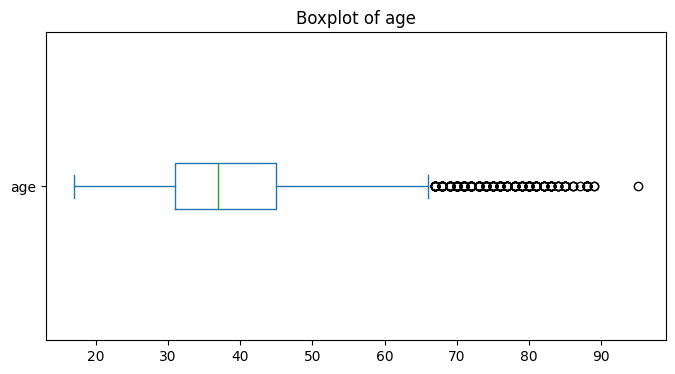

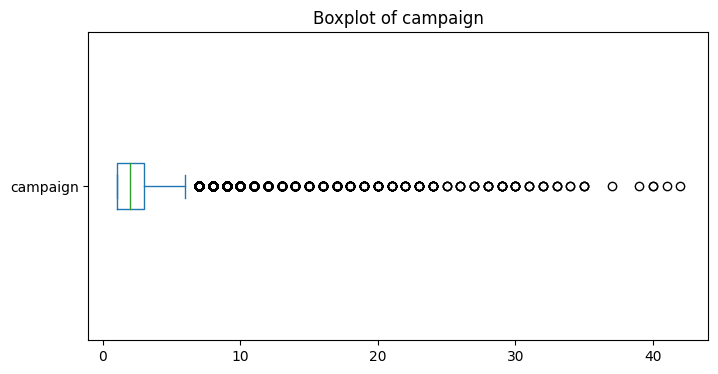

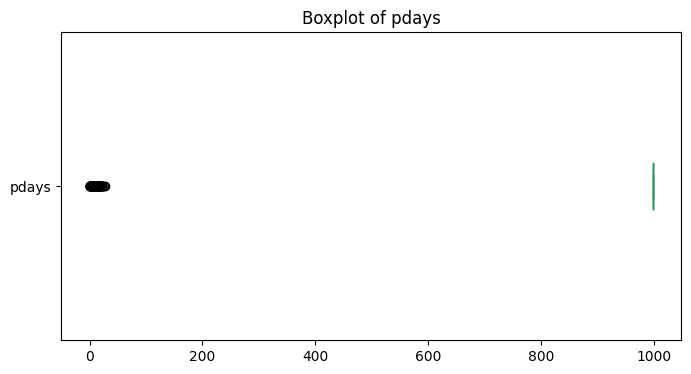

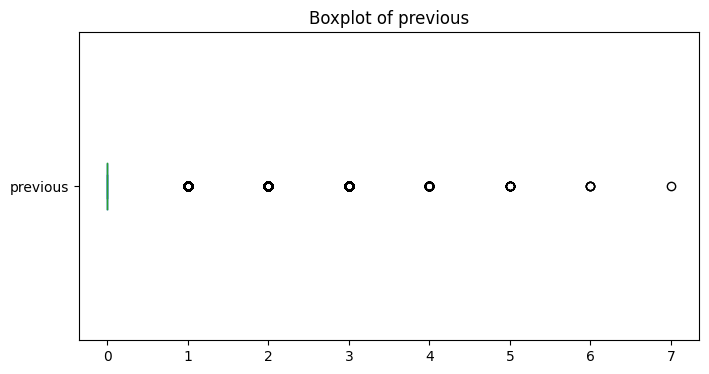

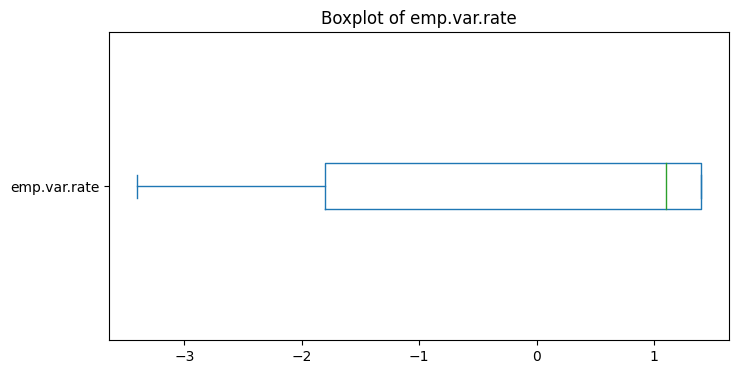

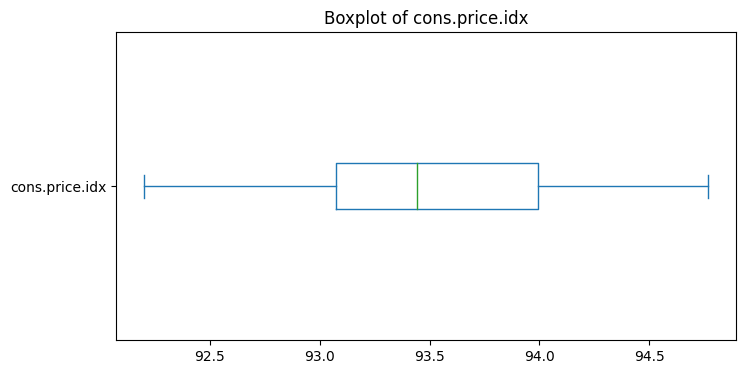

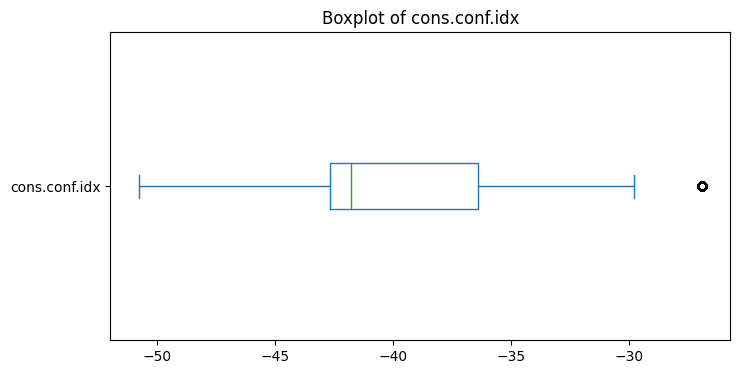

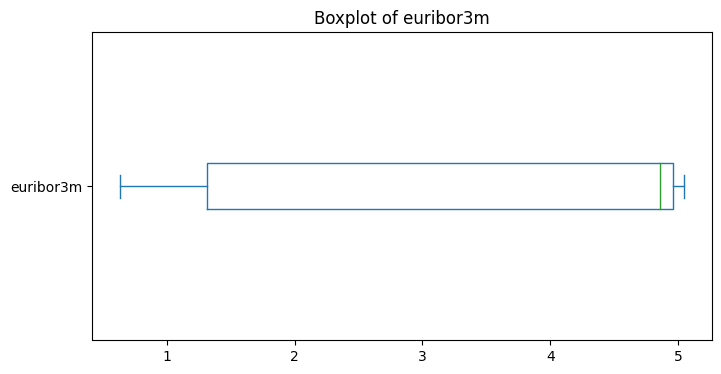

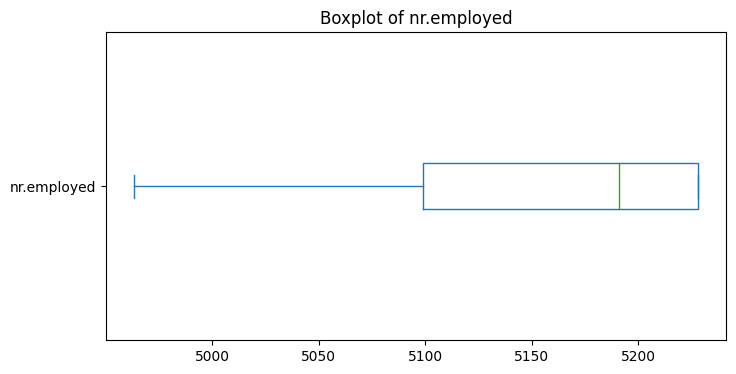

7-th df에 대한 이상치 확인


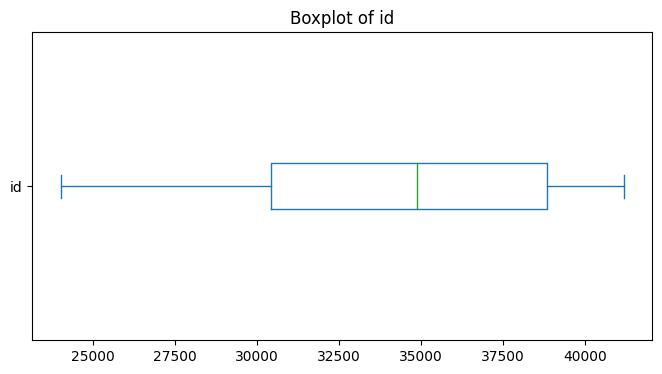

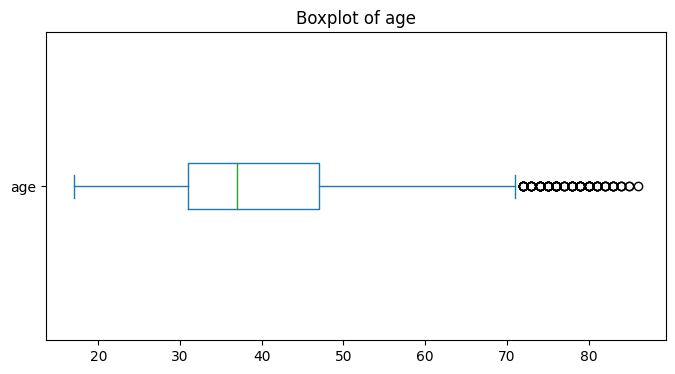

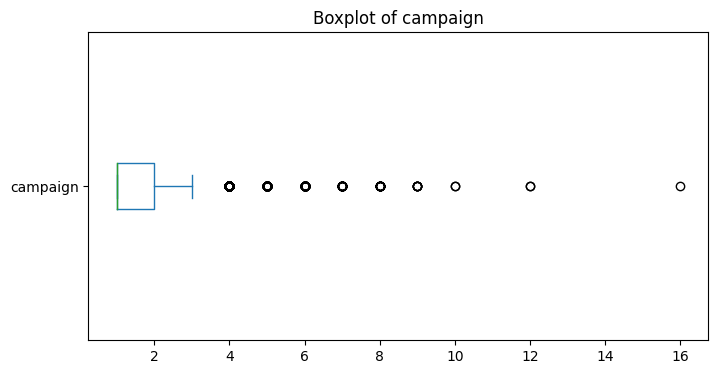

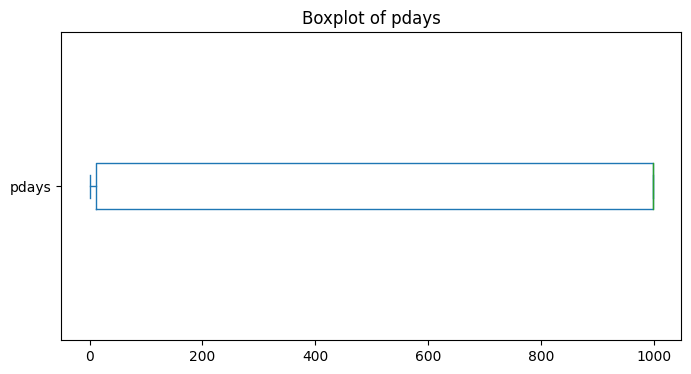

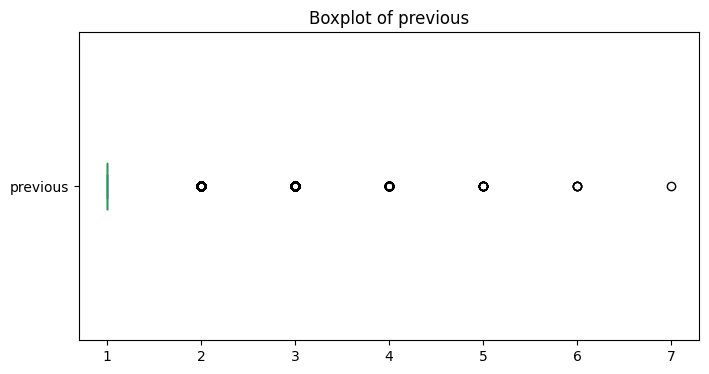

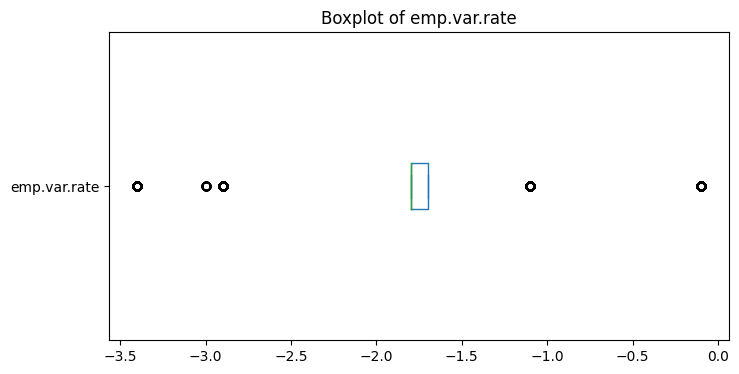

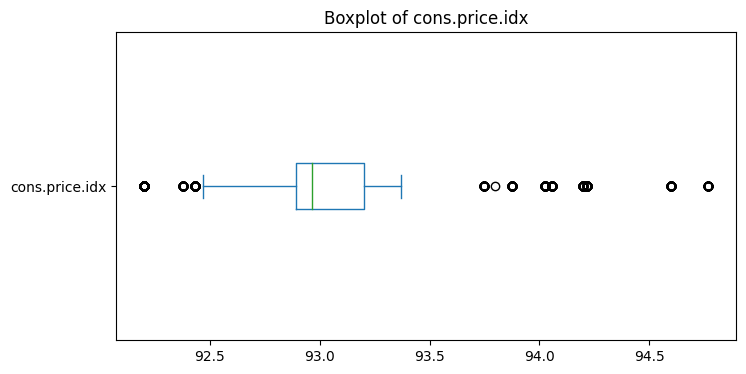

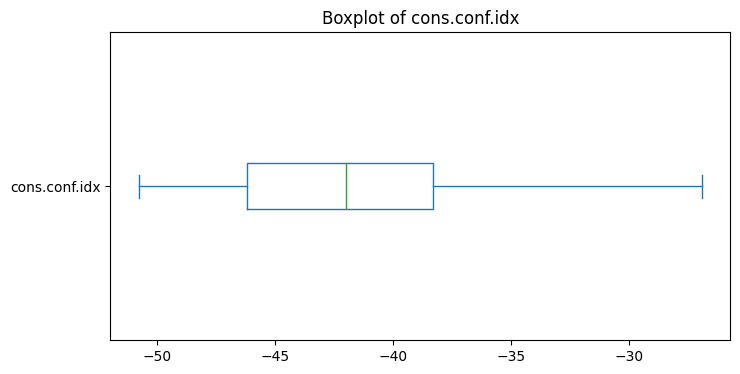

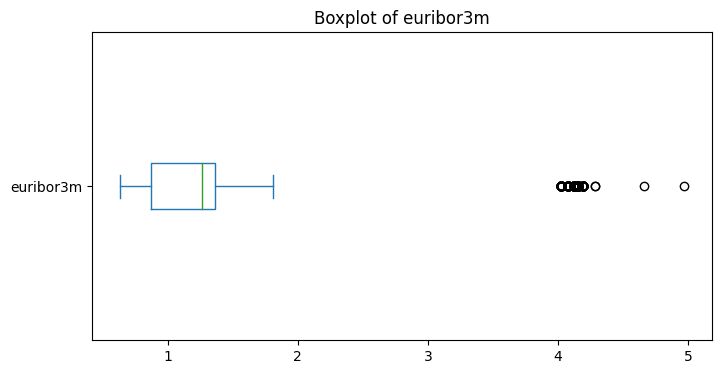

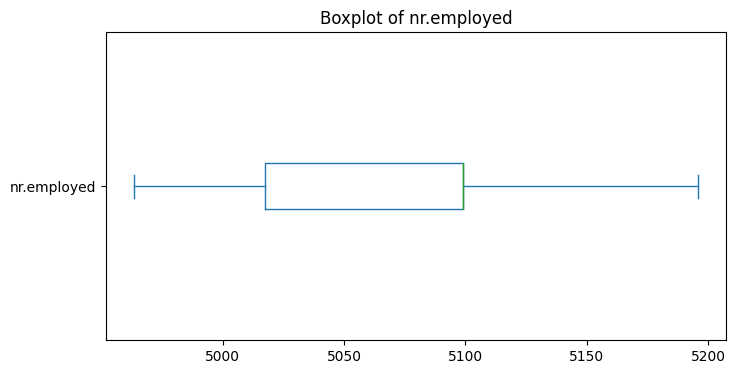

In [ ]:
for i in range(len(imputed_group)):
  print(f'{i}-th df에 대한 이상치 확인')
  df = imputed_group[i]
  for col in df.columns:
    if imputed_group[i][col].dtype == 'int64' or imputed_group[i][col].dtype == 'float64':
      plt.figure()
      df[col].plot(kind='box', vert=False, figsize=(8, 4))
      plt.title(f'Boxplot of {col}')
      plt.show()

#### IsolationForest

0-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


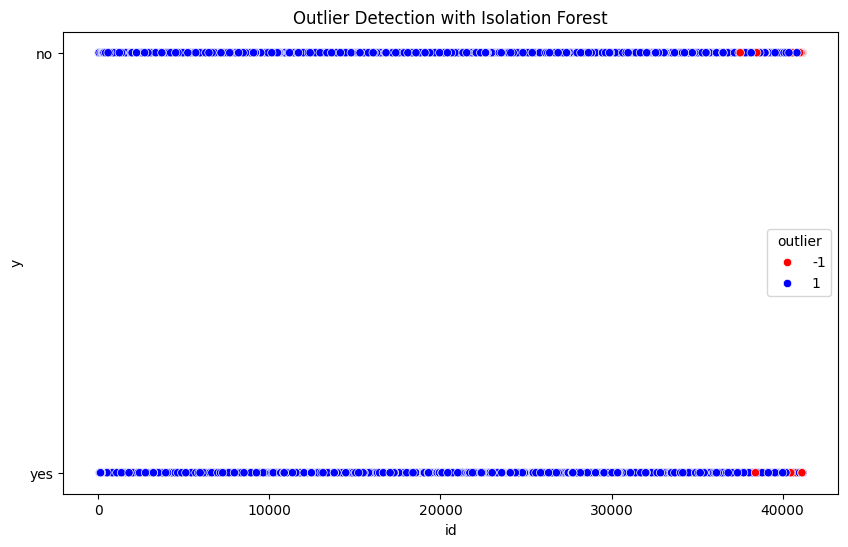

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


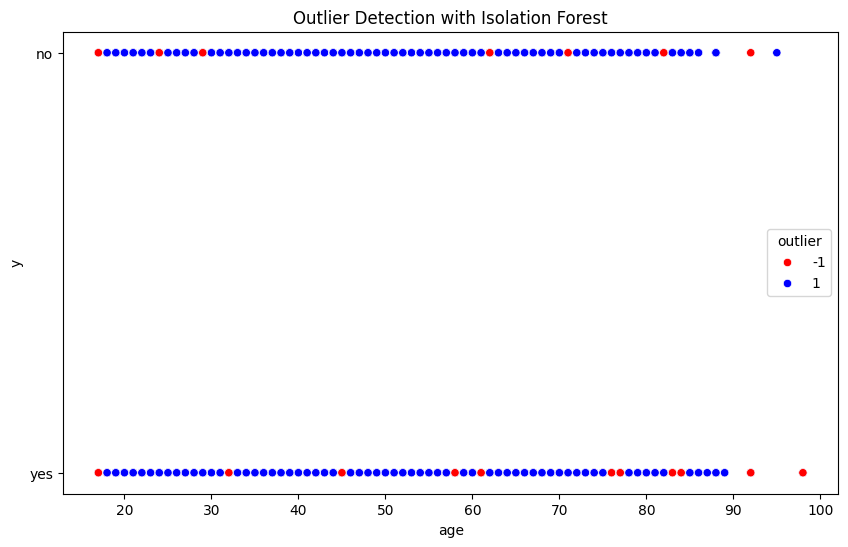

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


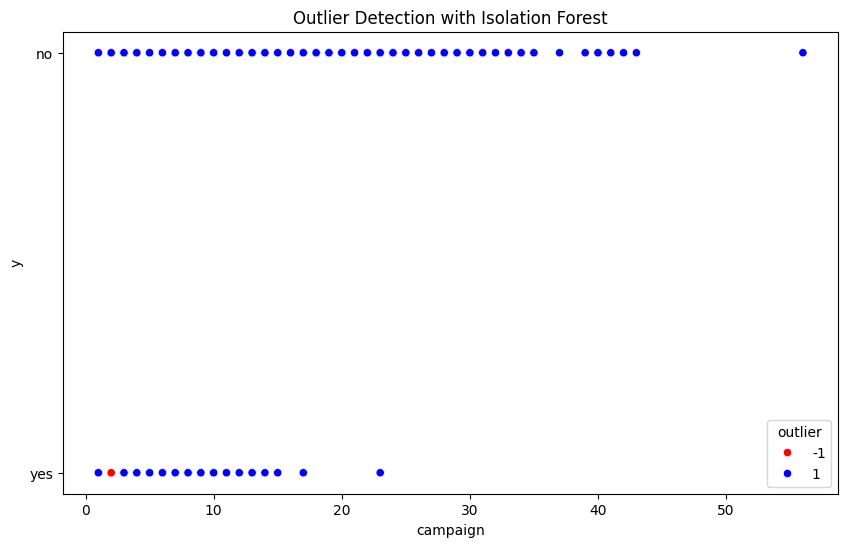

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


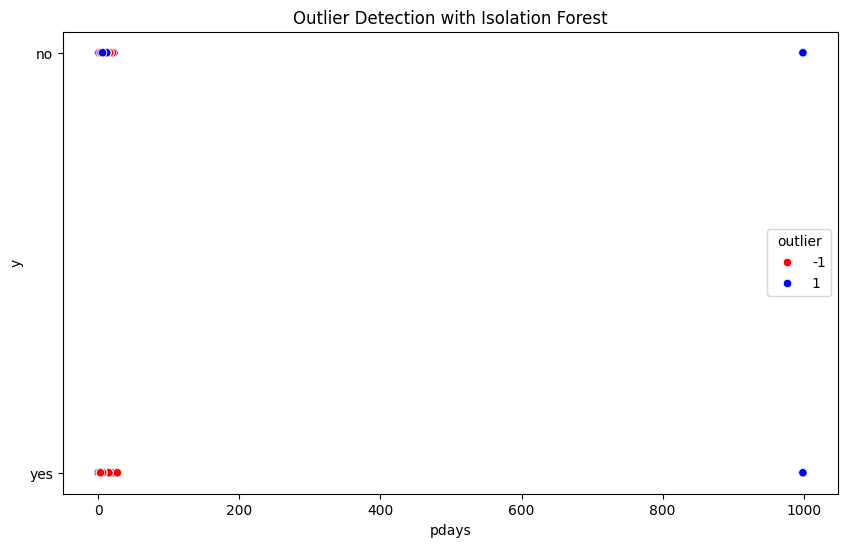

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


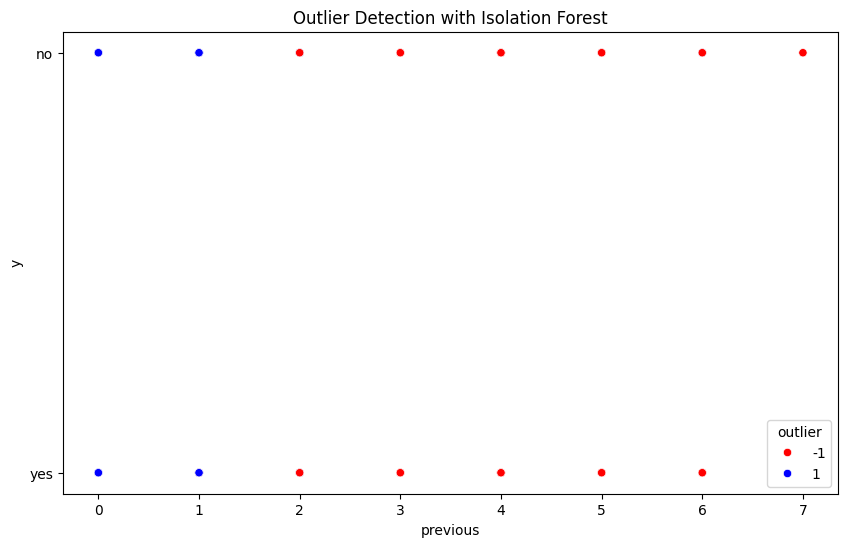

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


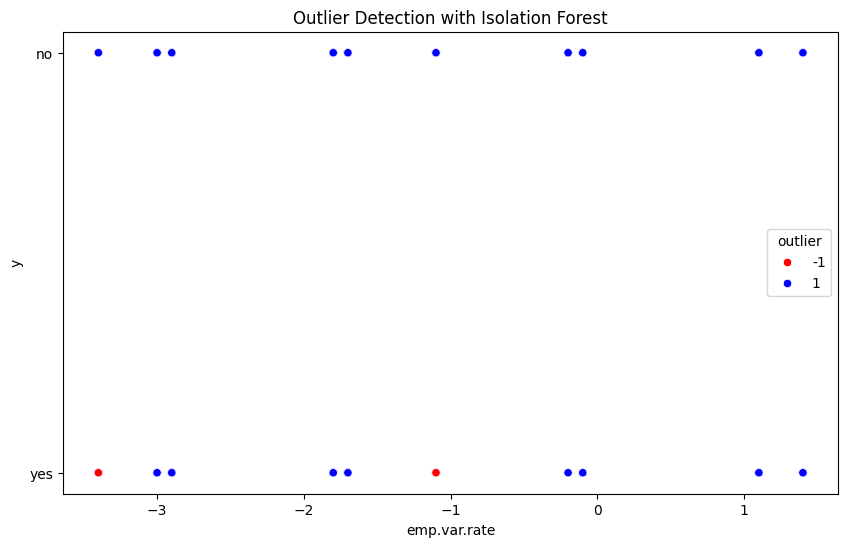

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


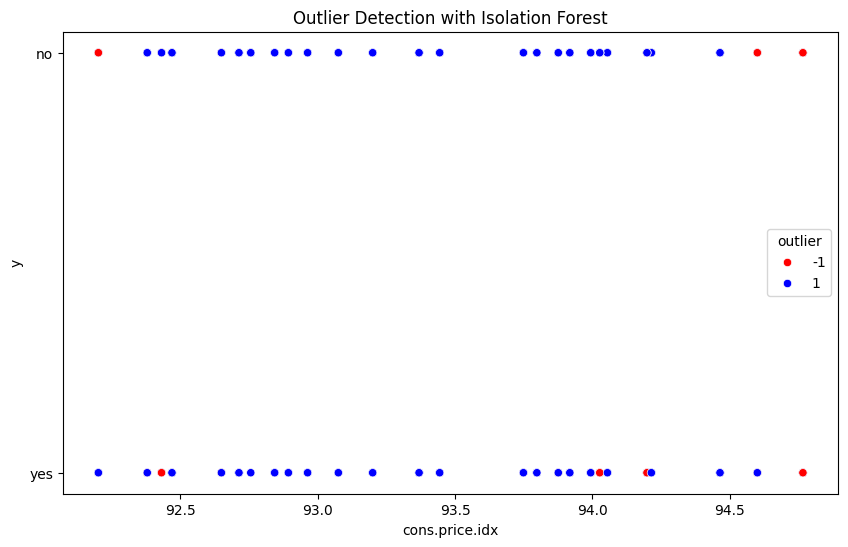

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


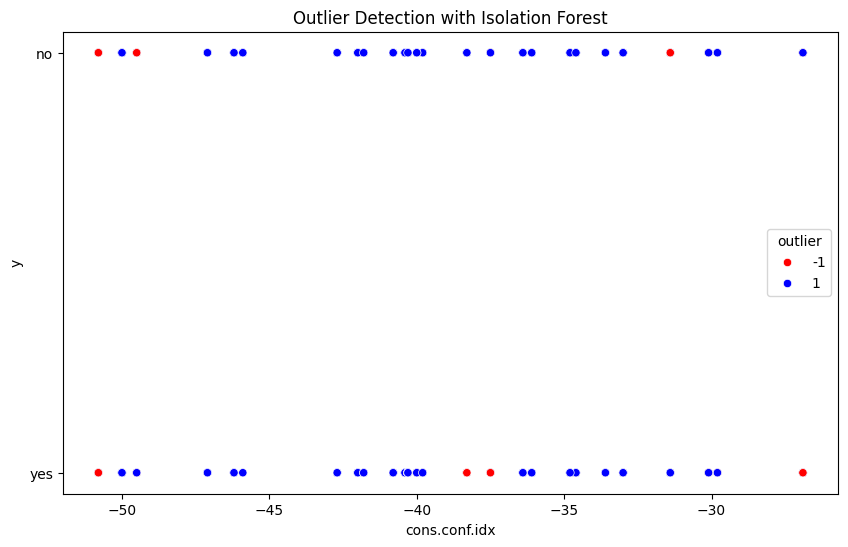

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


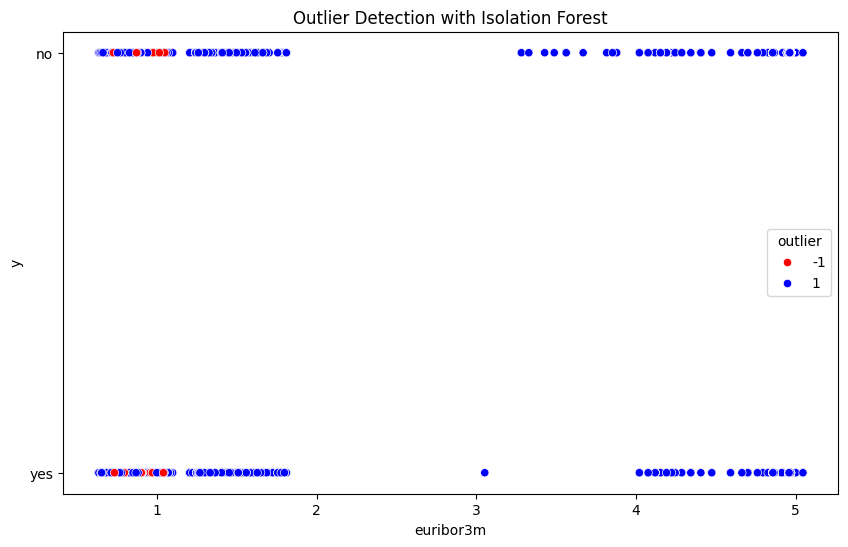

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


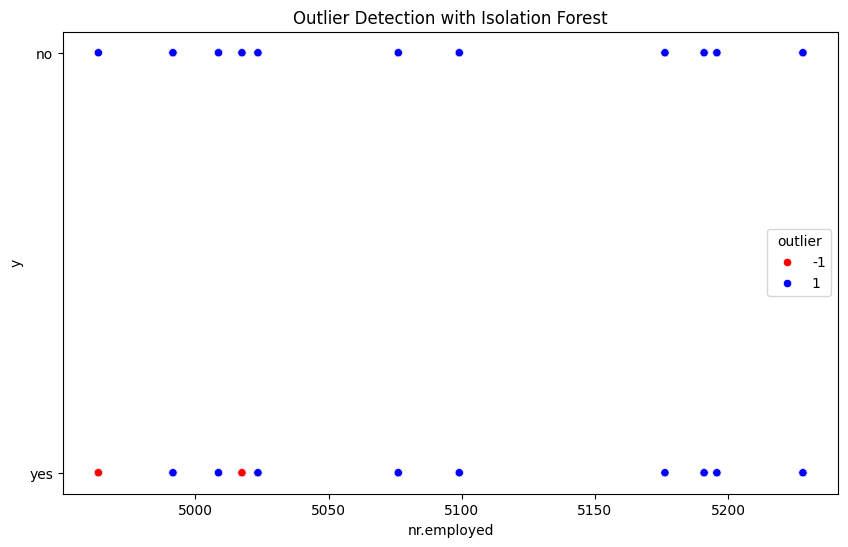

1-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


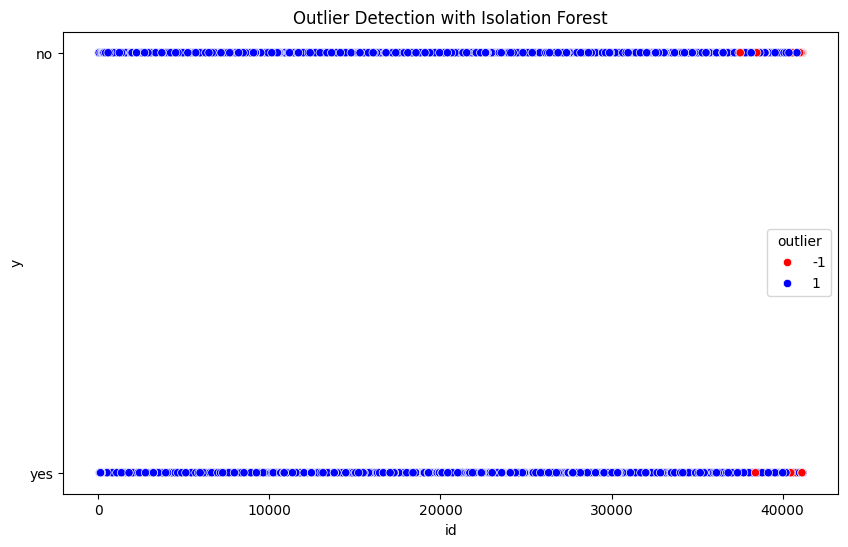

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


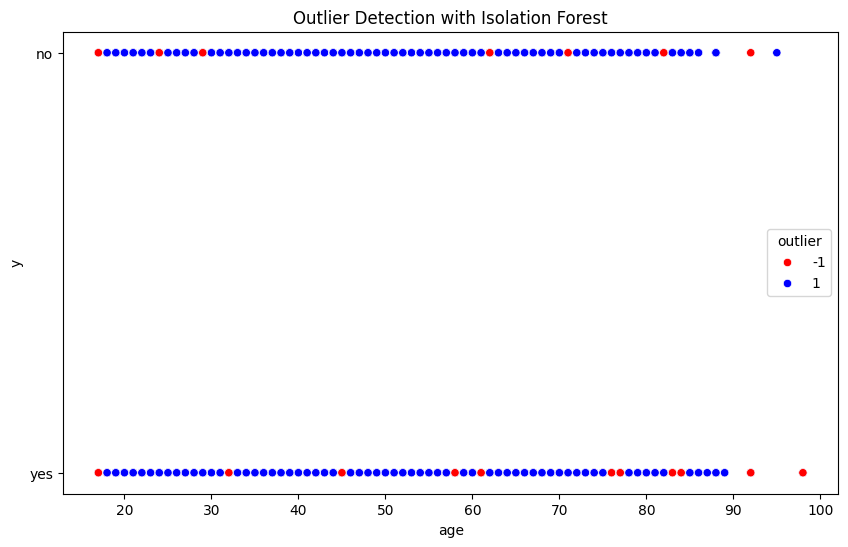

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


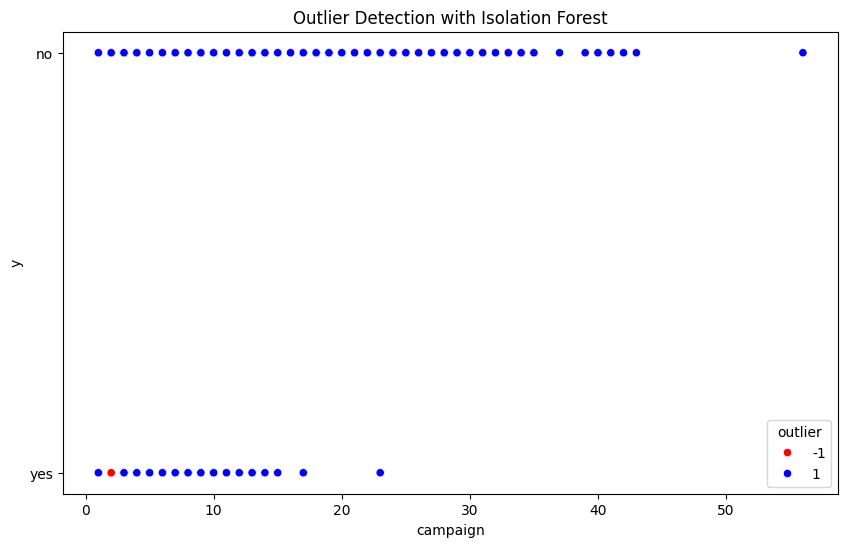

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


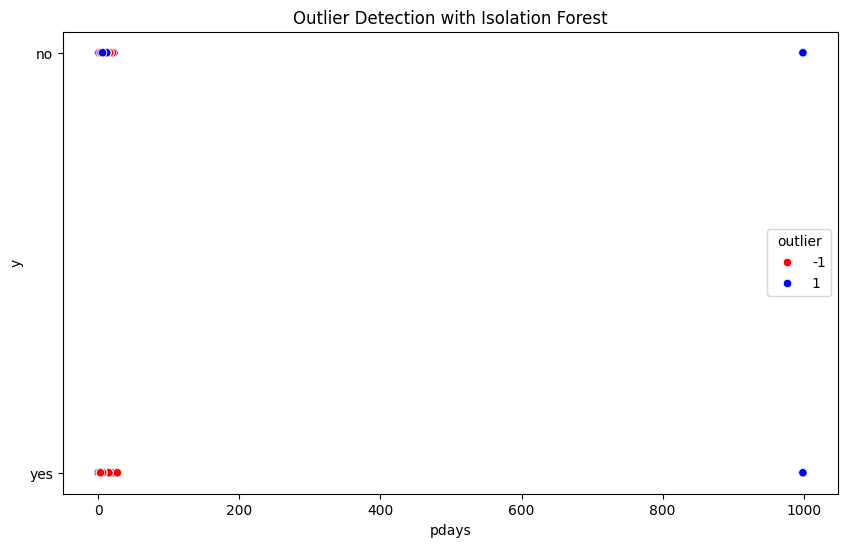

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


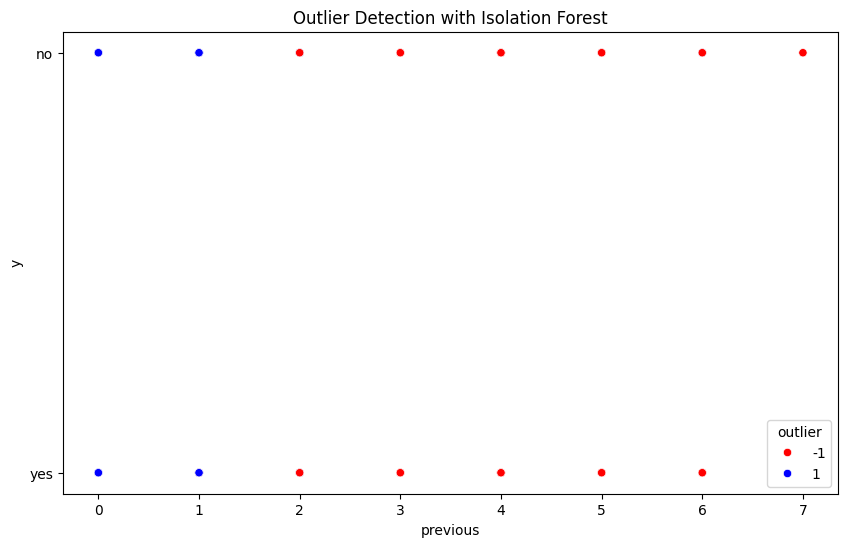

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


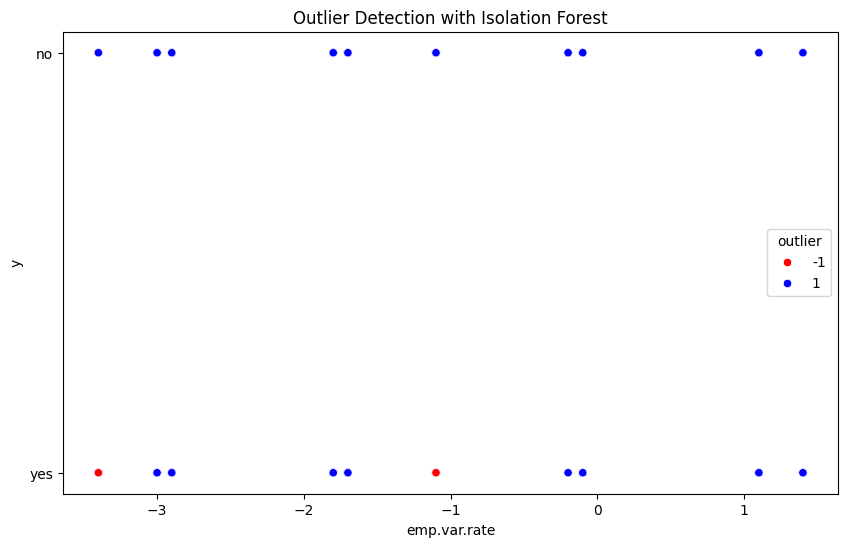

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


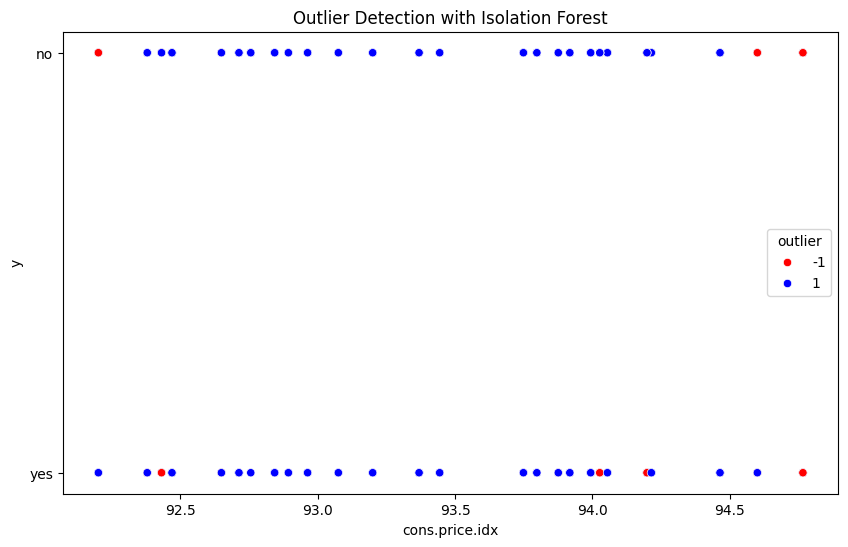

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


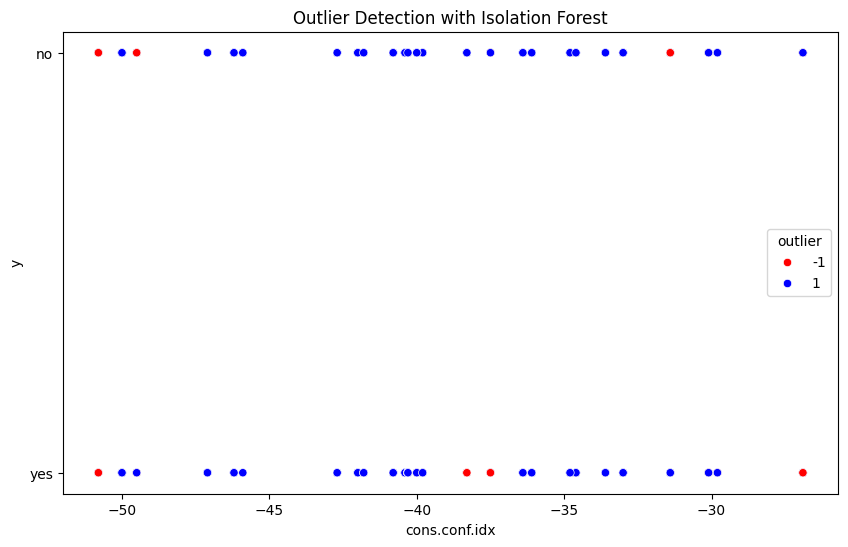

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


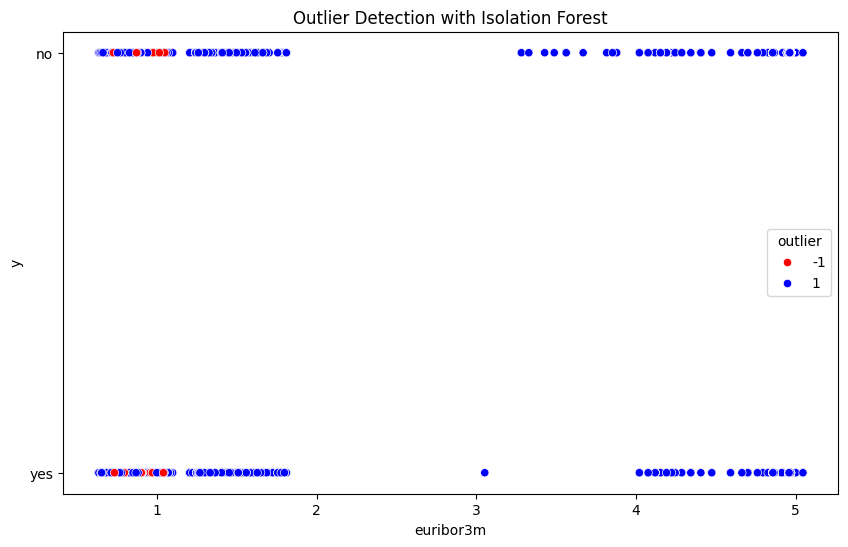

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


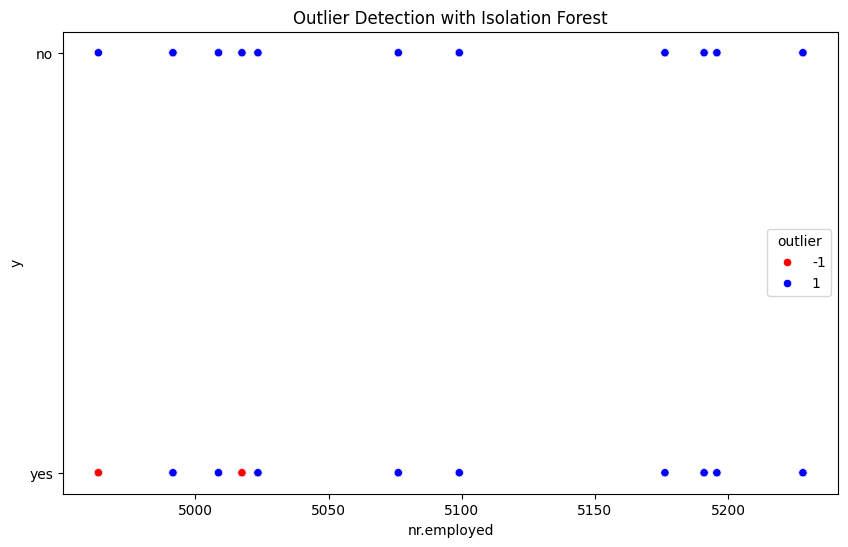

2-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


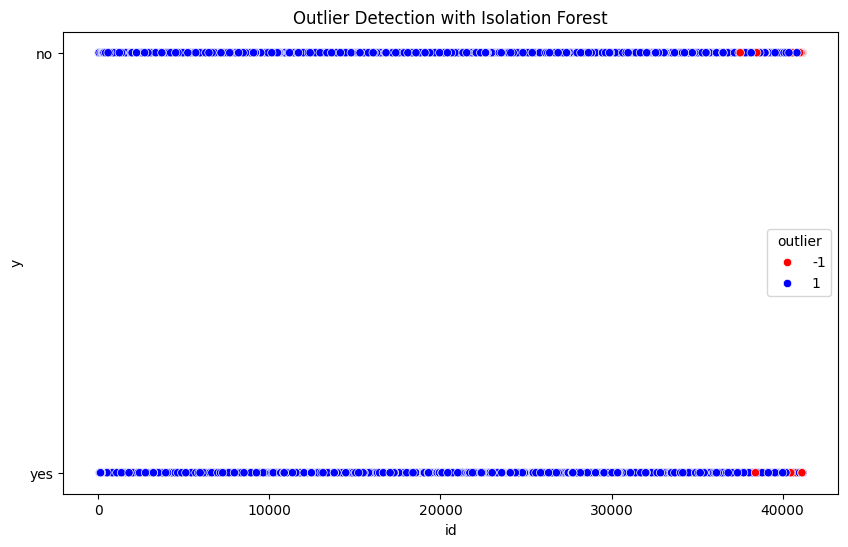

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


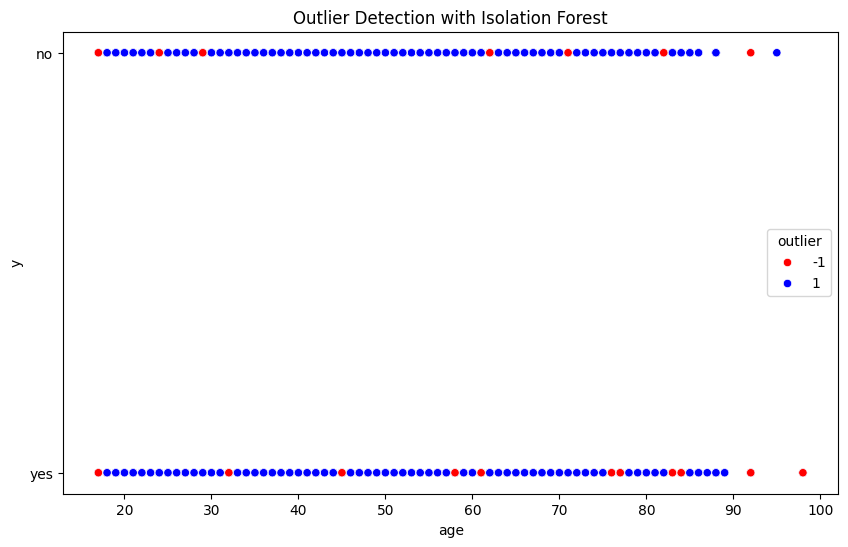

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


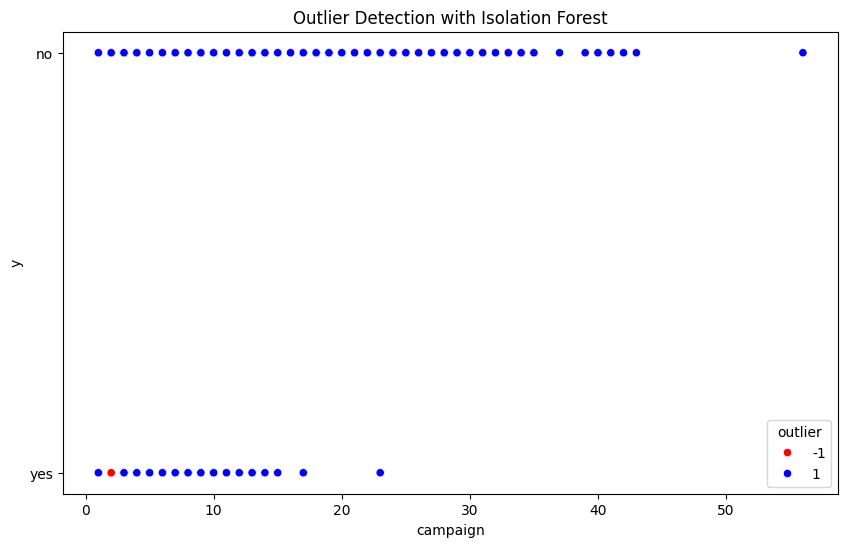

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


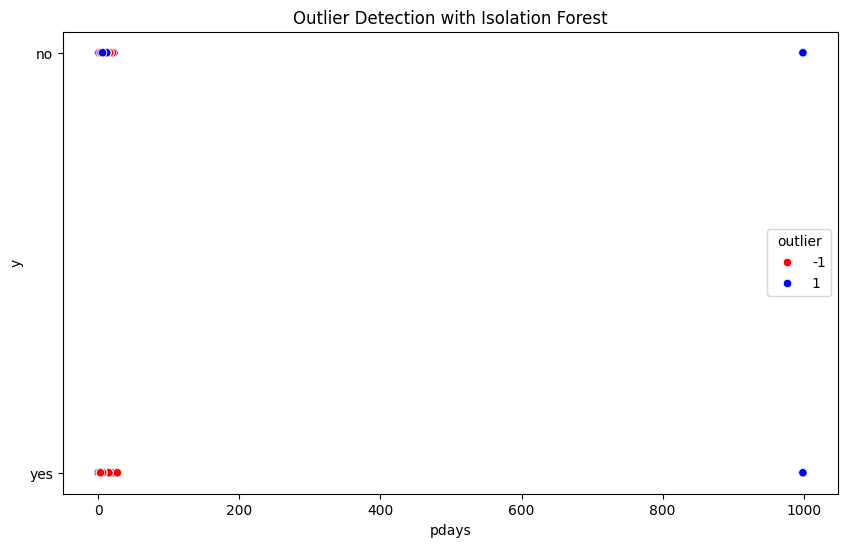

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


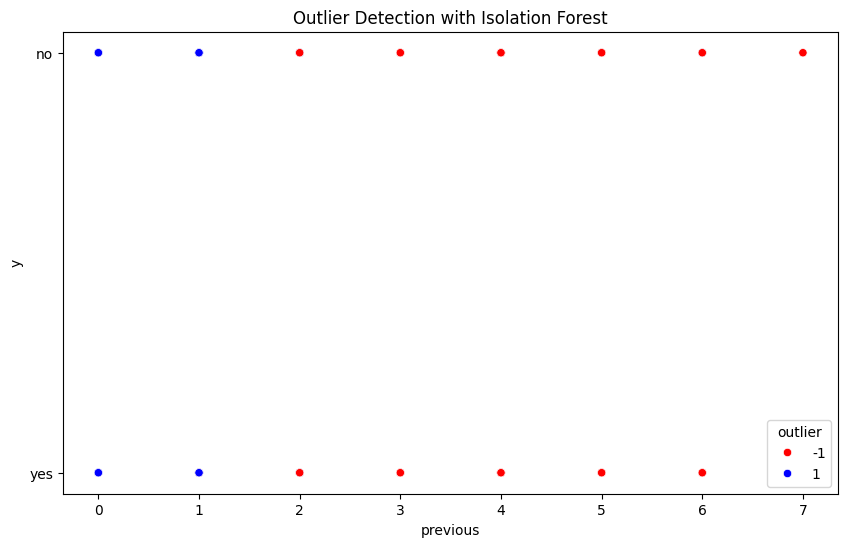

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


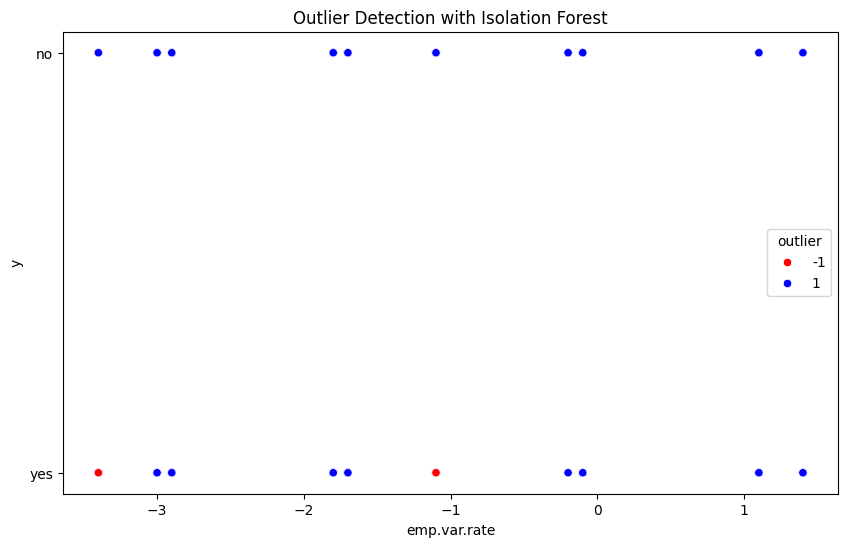

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


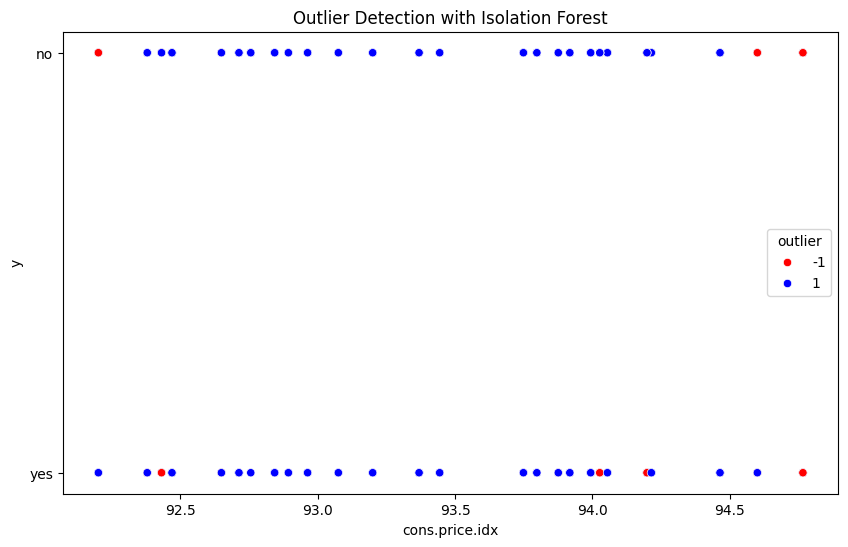

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


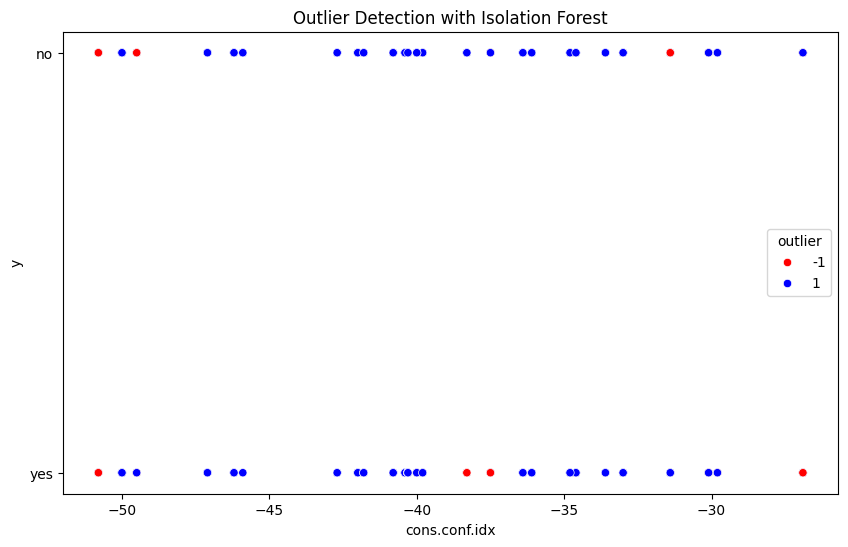

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


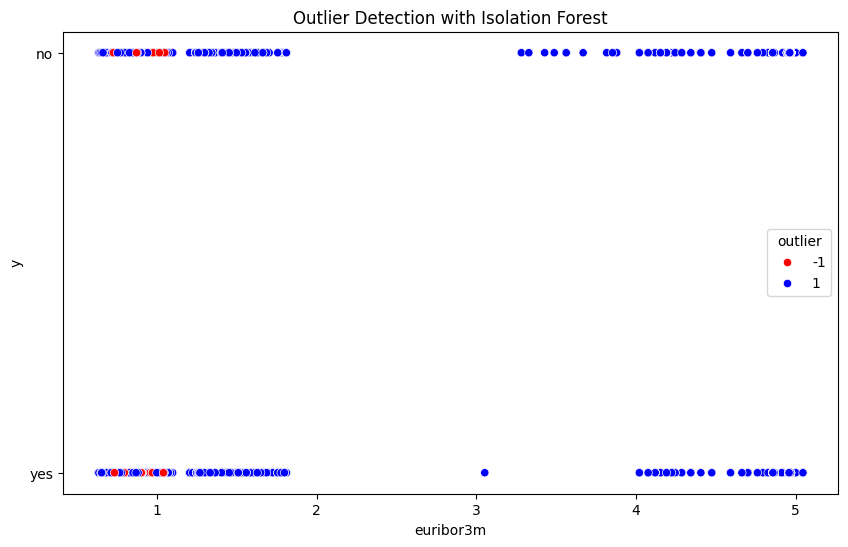

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


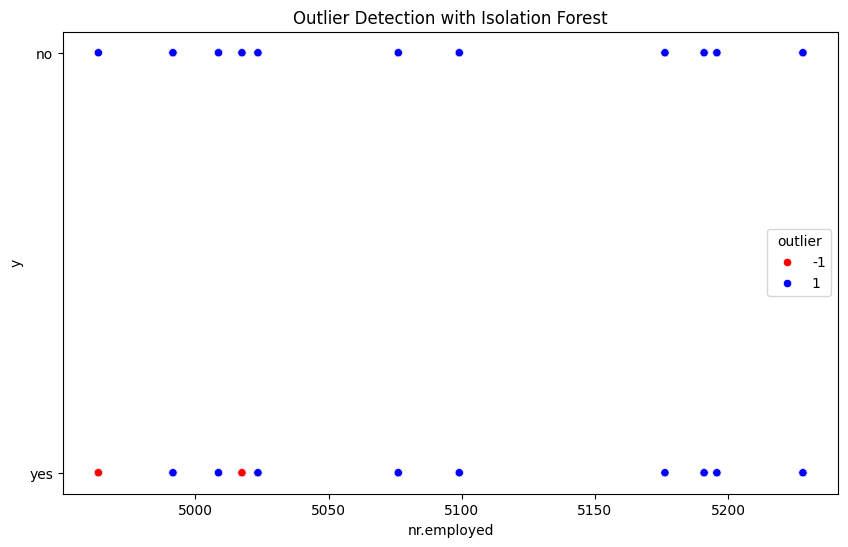

3-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


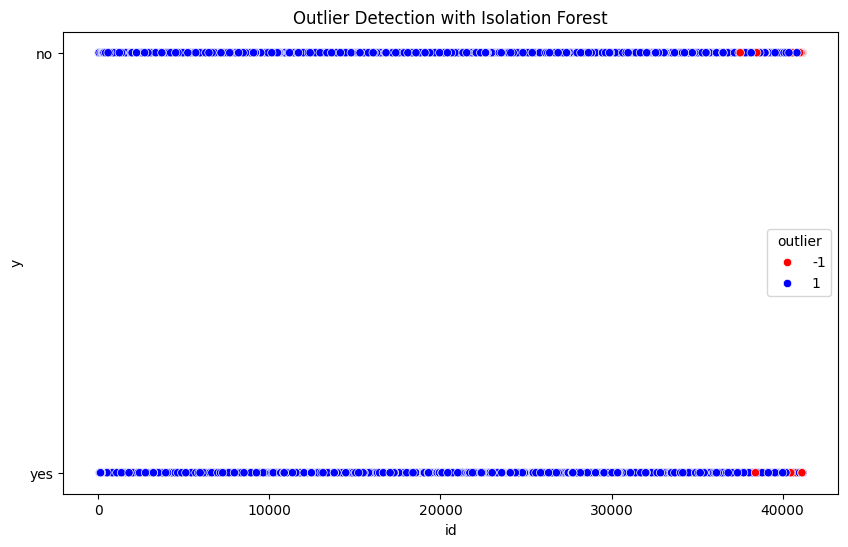

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


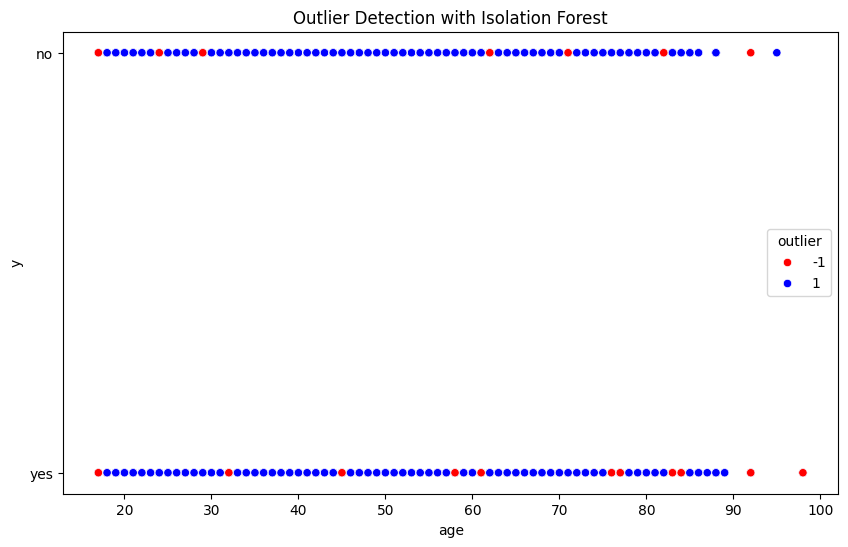

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


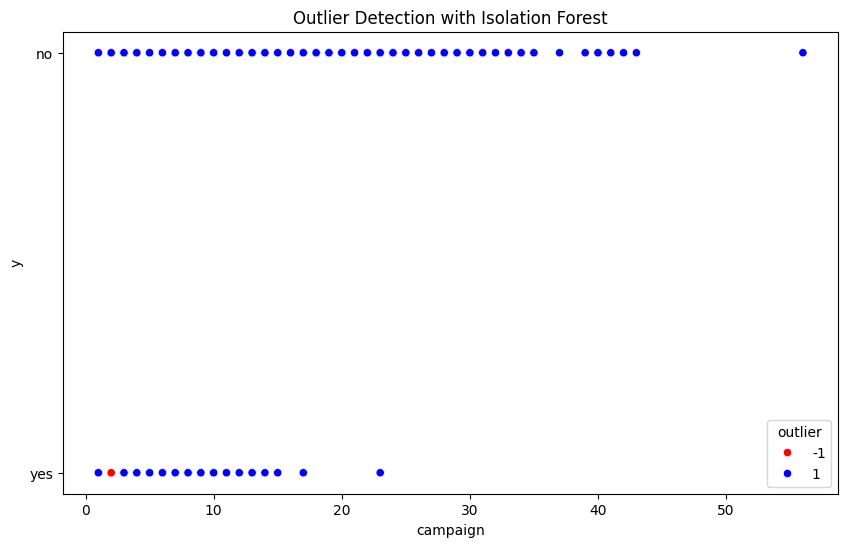

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


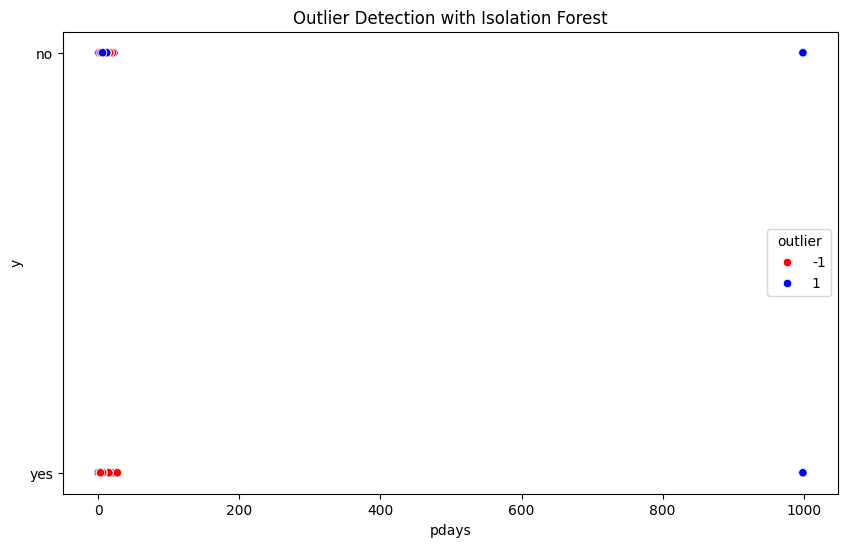

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


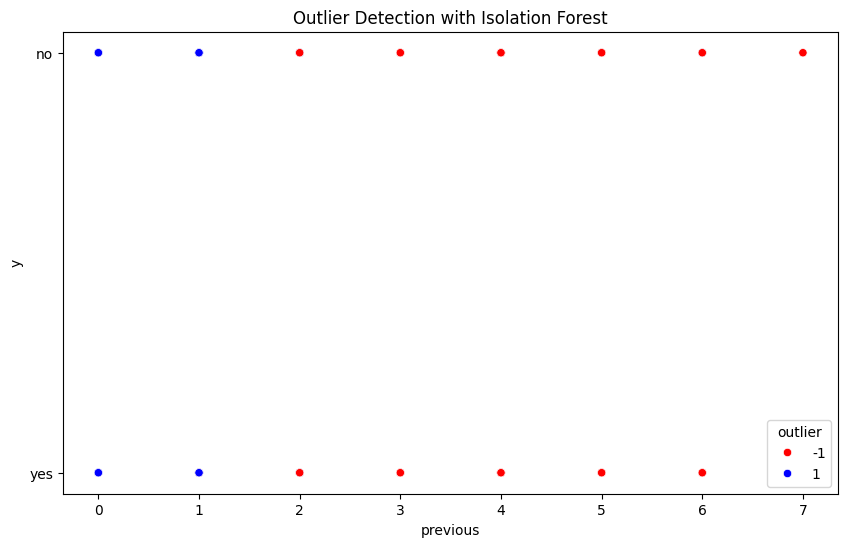

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


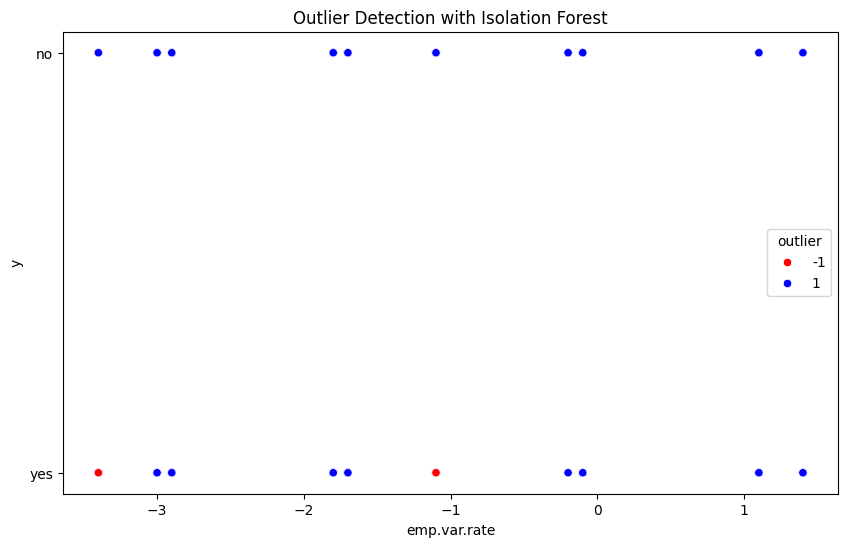

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


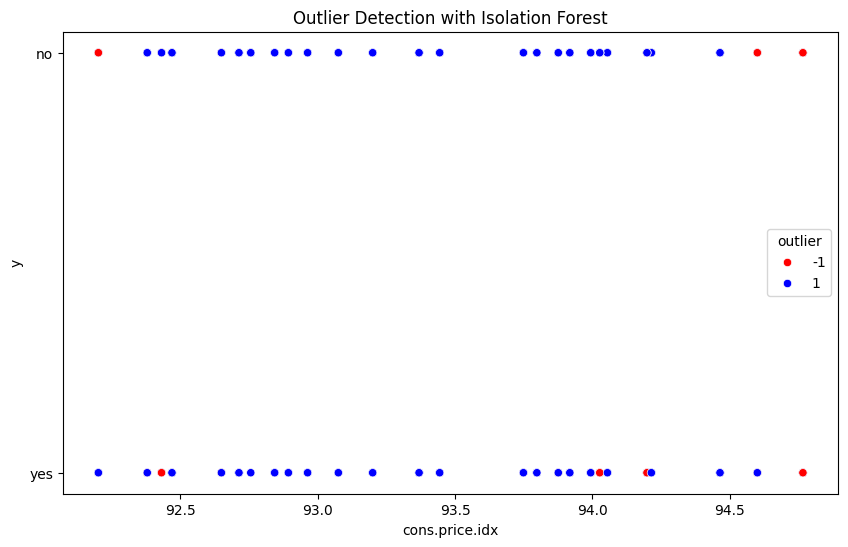

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


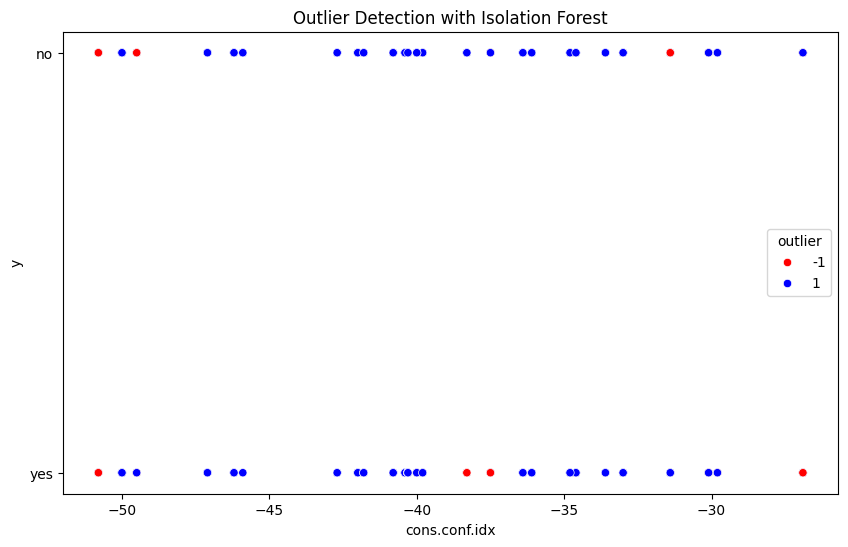

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


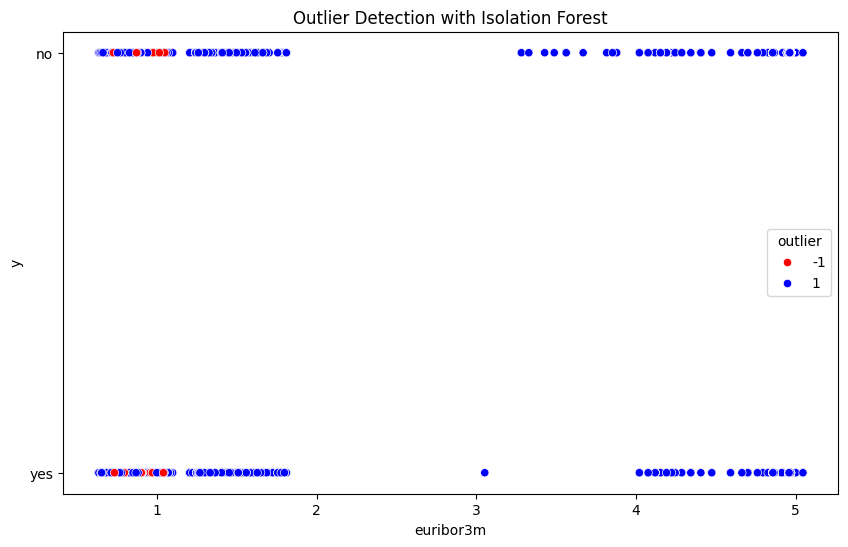

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


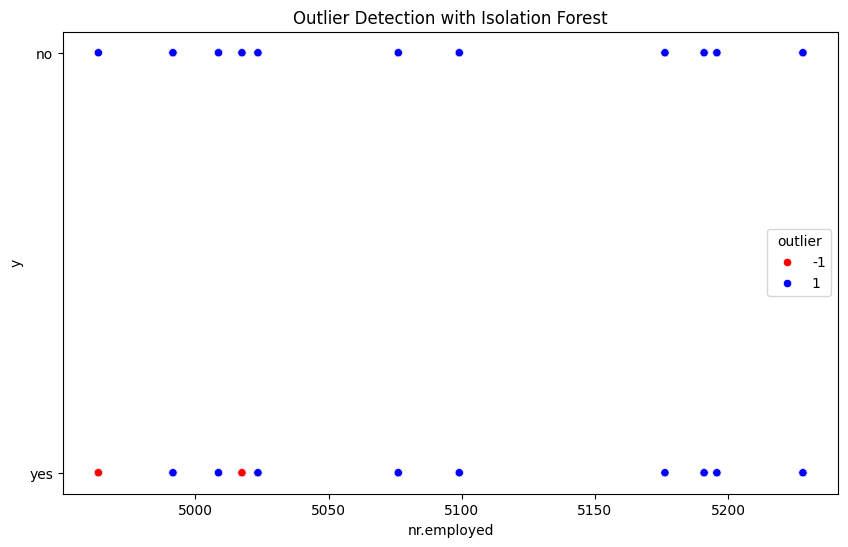

4-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


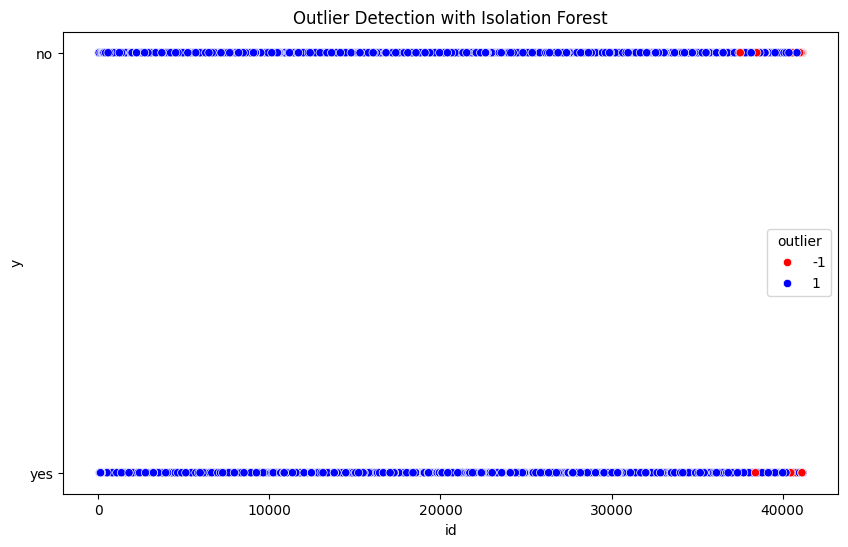

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


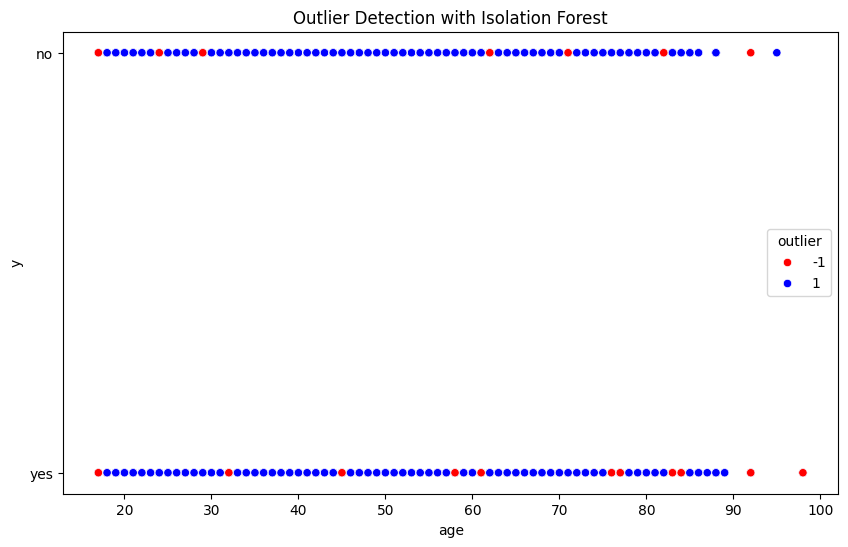

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


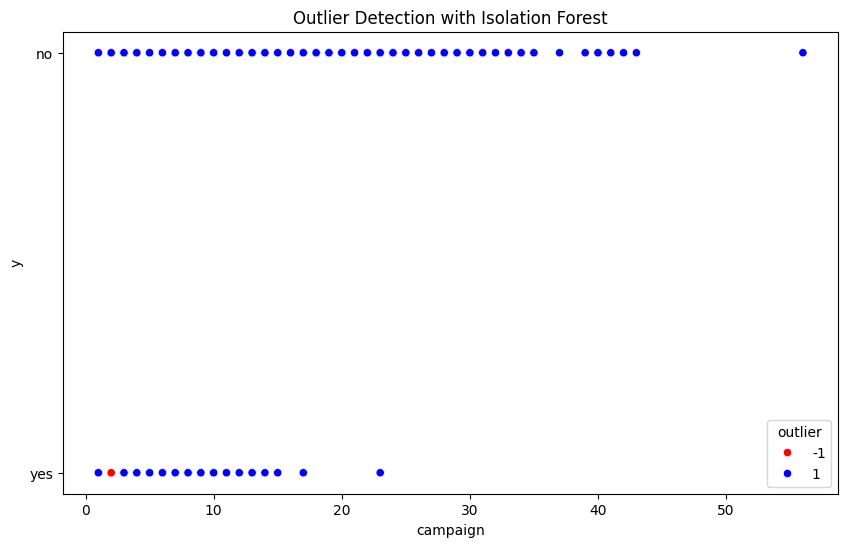

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


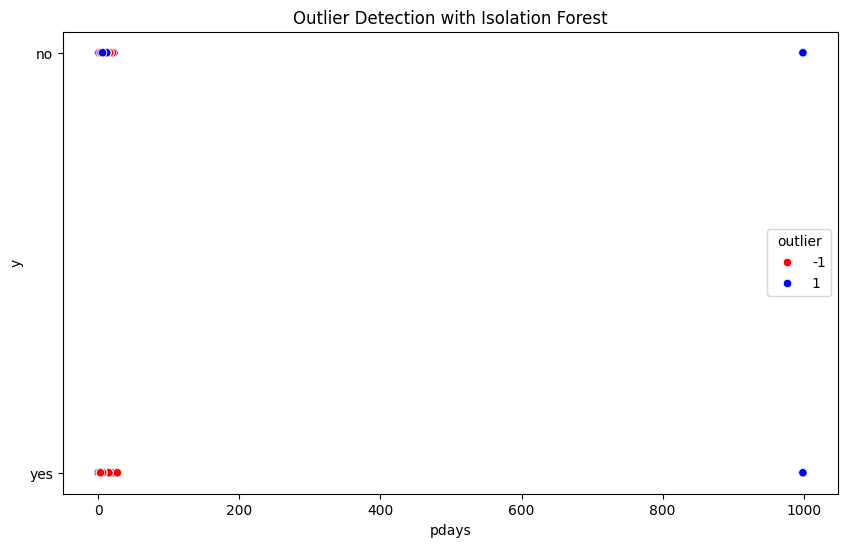

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


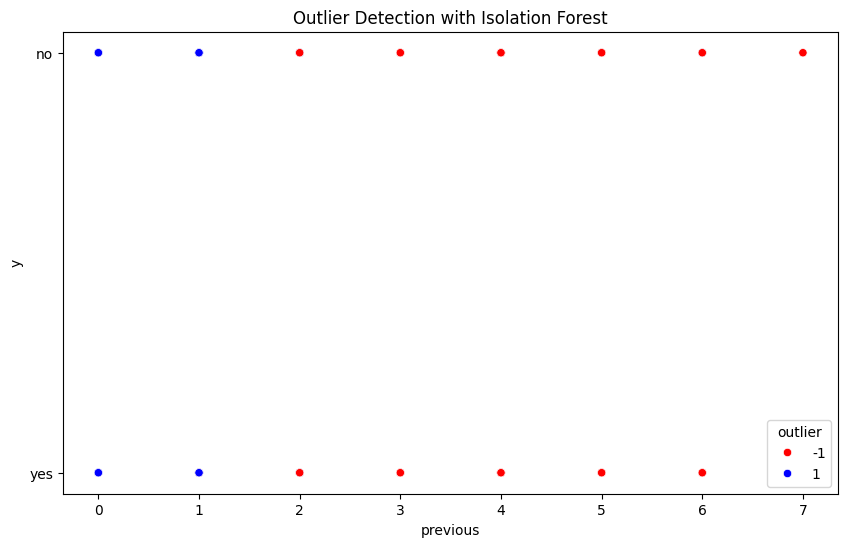

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


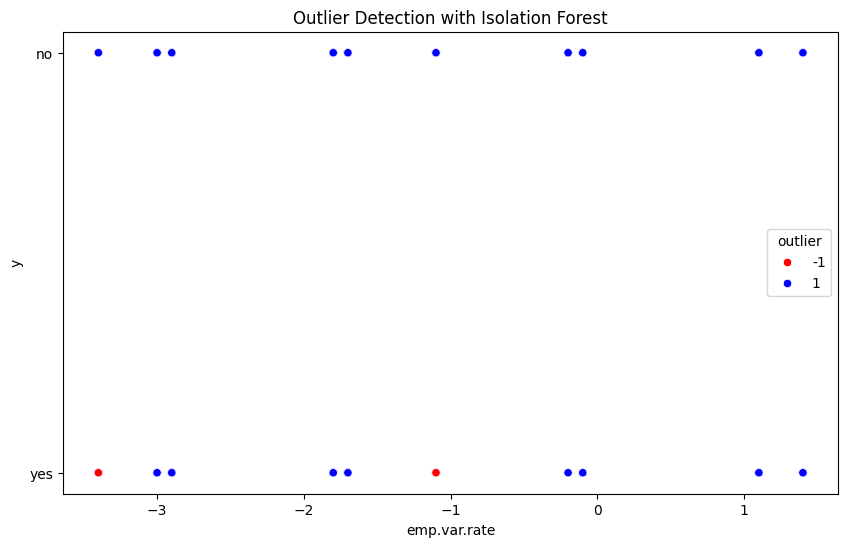

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


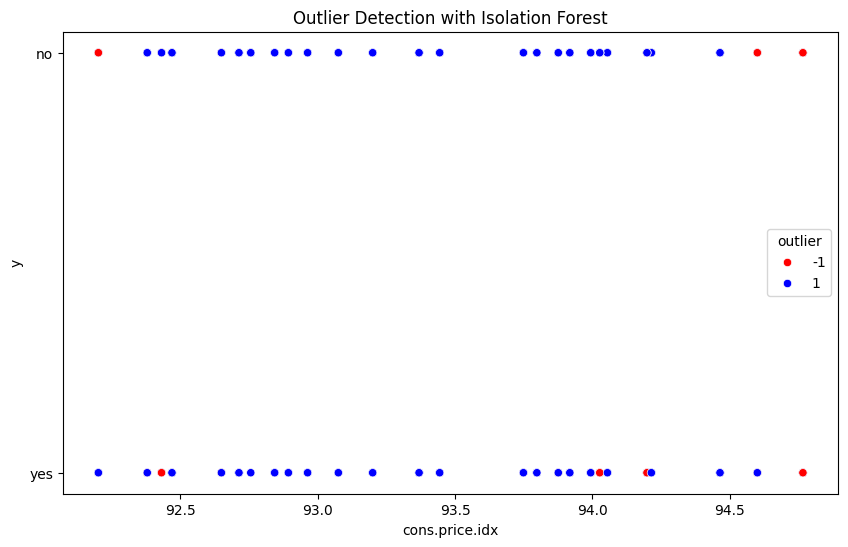

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


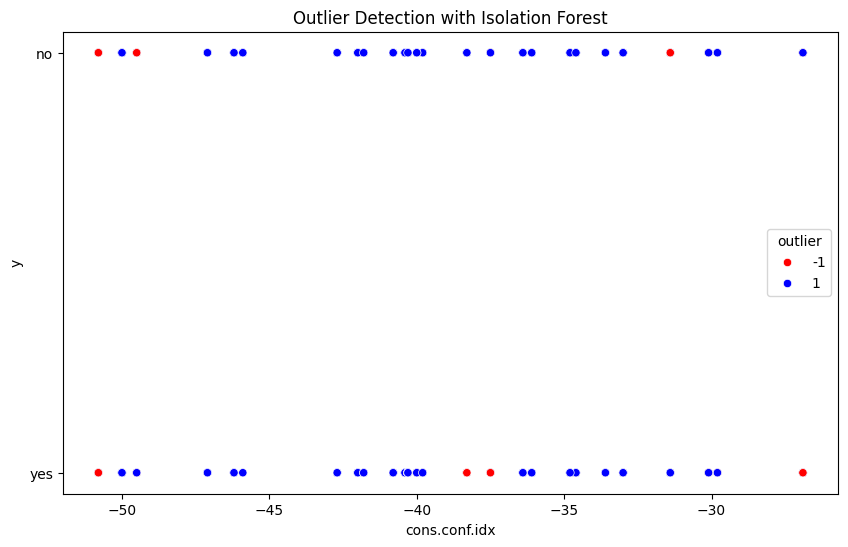

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


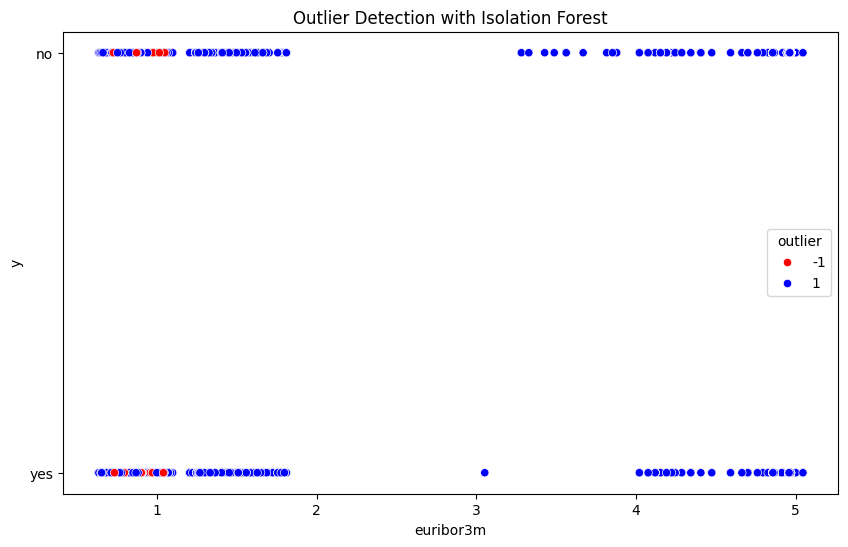

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


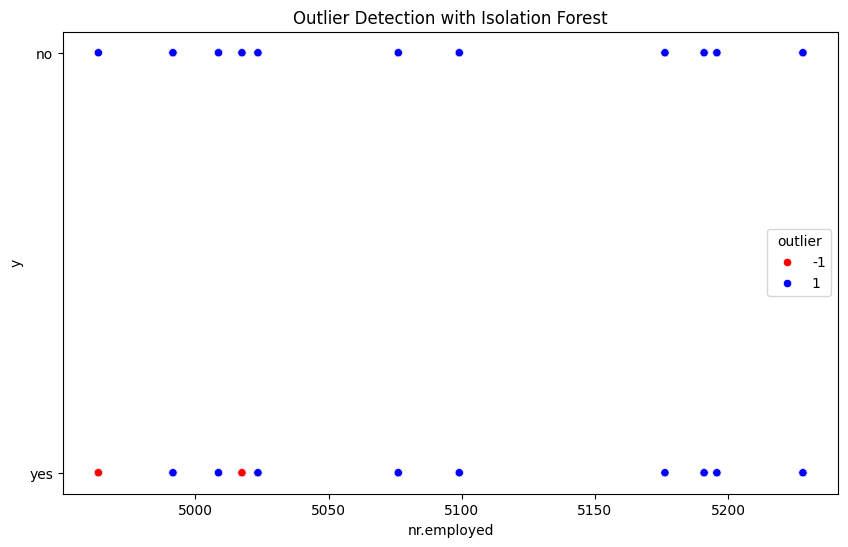

5-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


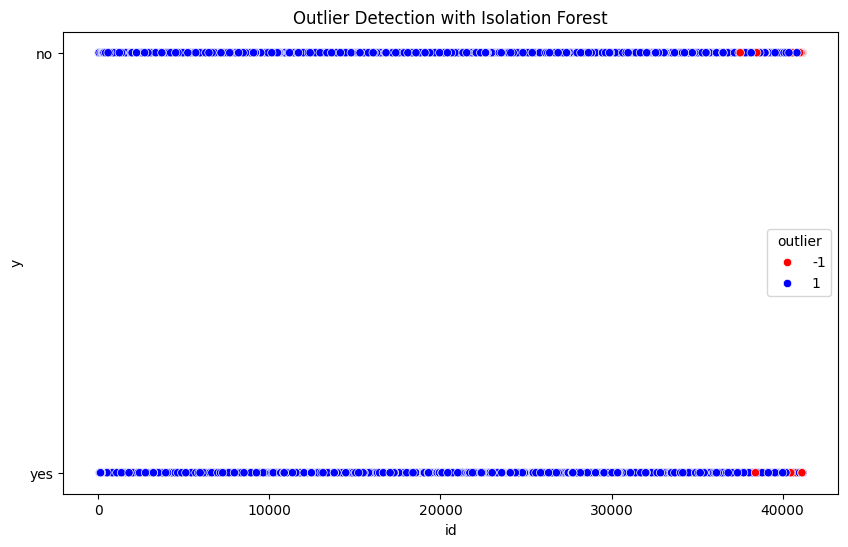

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


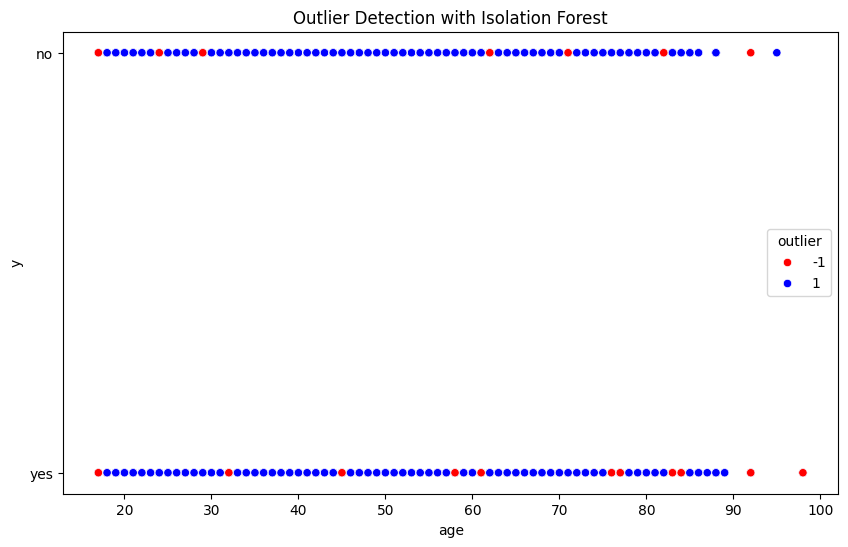

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


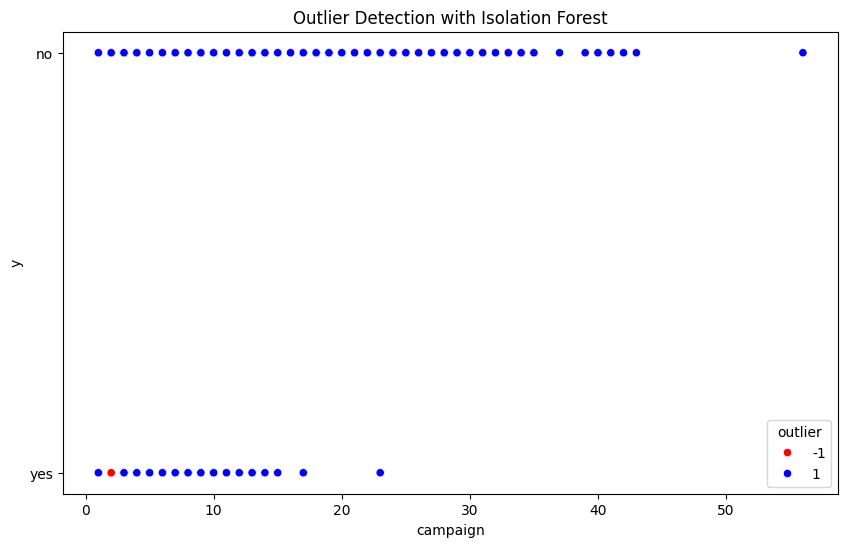

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


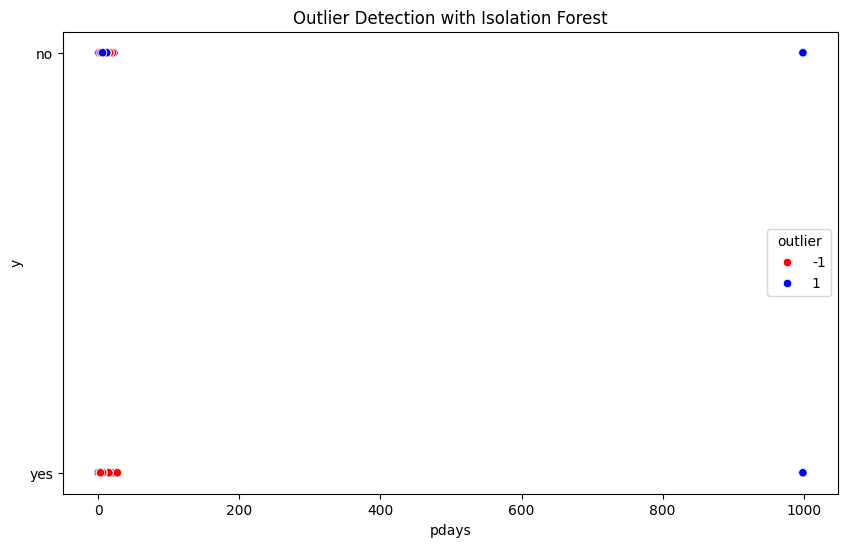

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


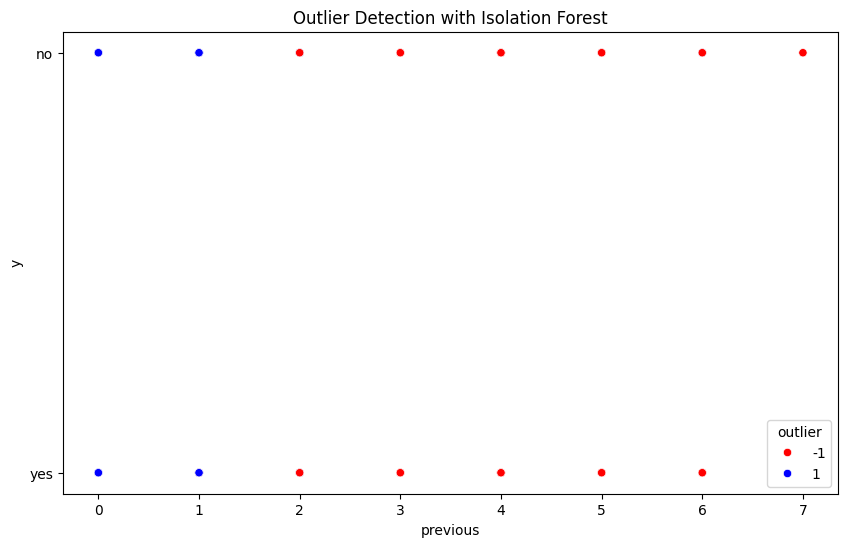

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


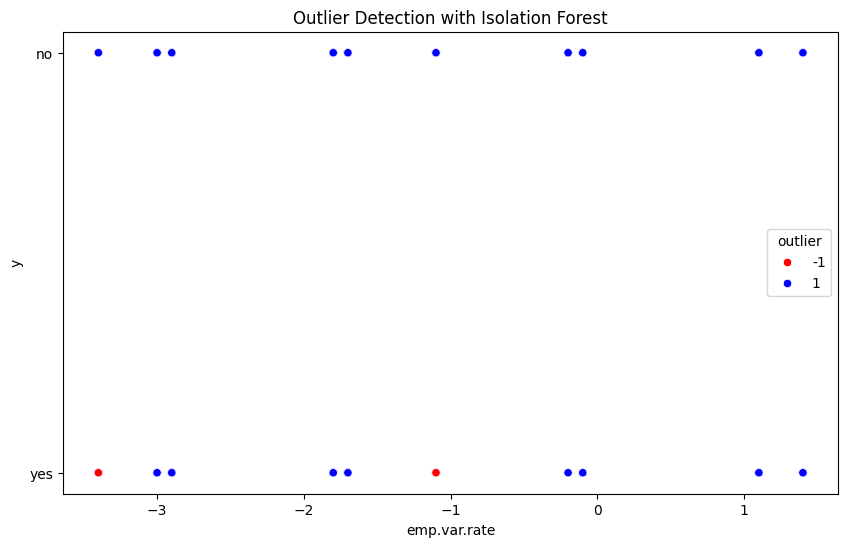

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


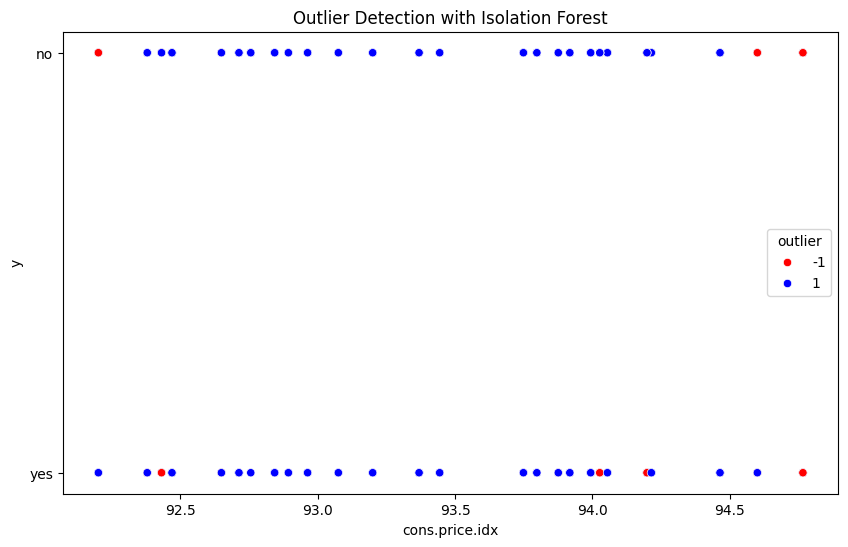

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


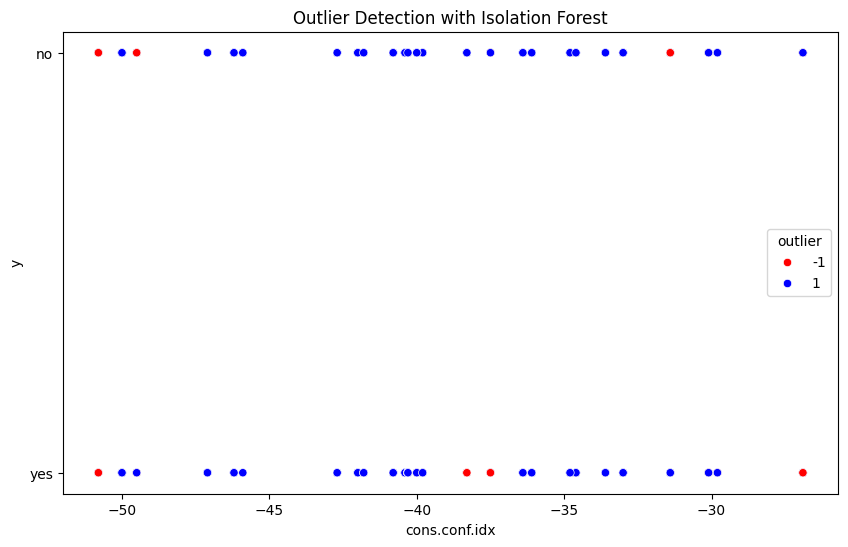

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


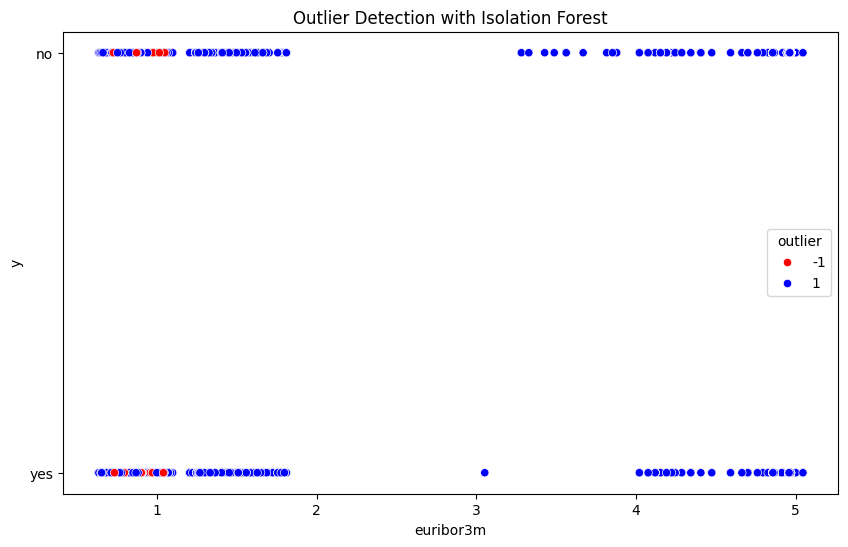

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


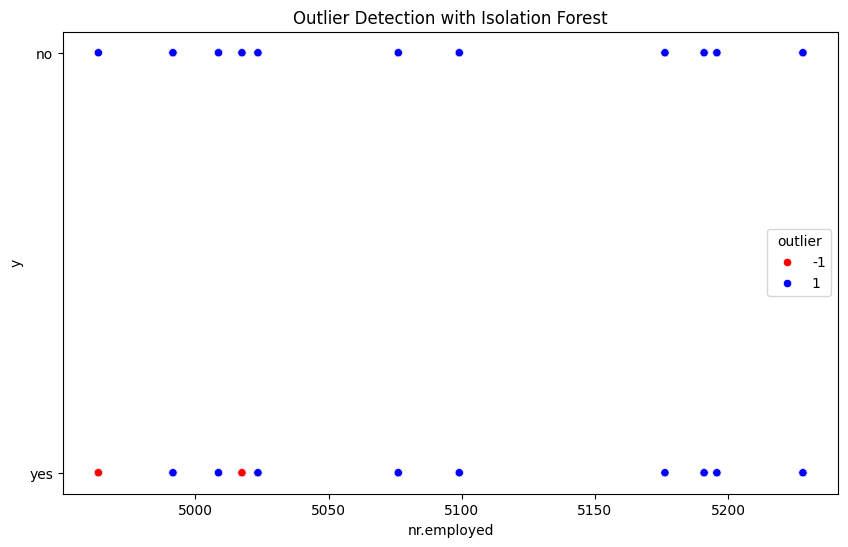

6-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


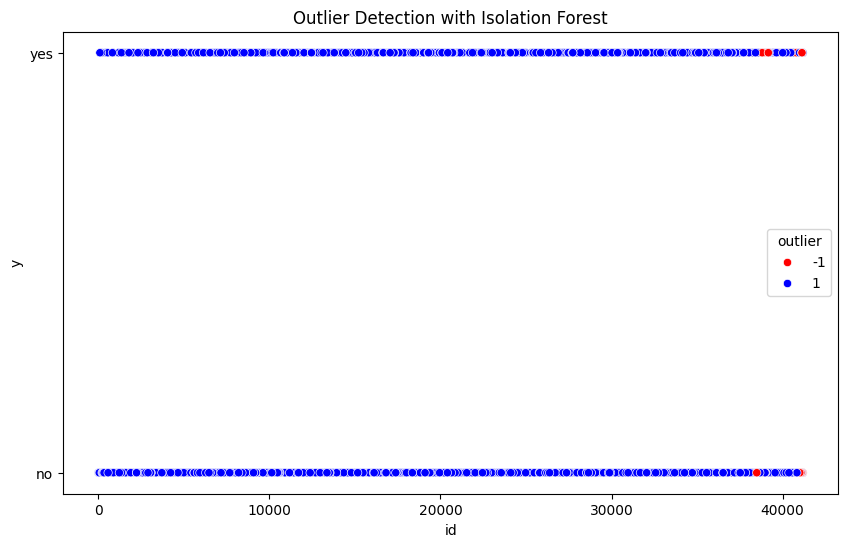

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


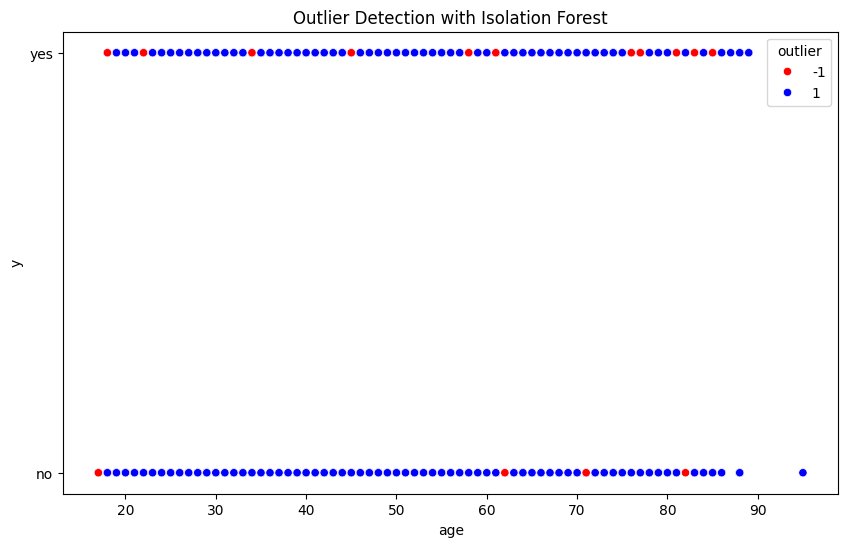

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


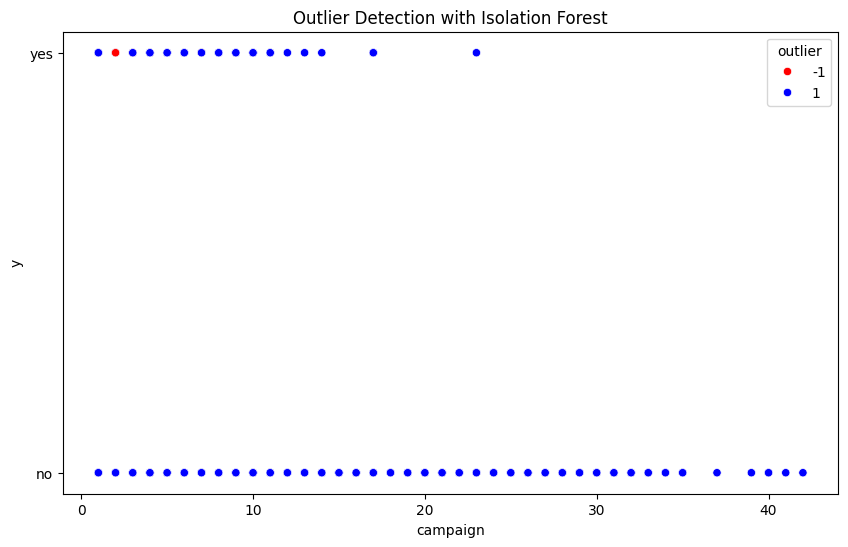

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


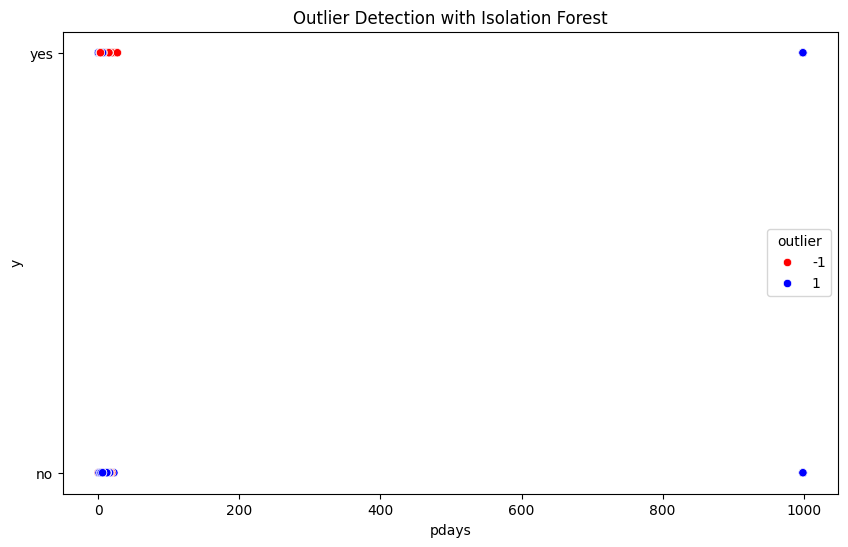

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


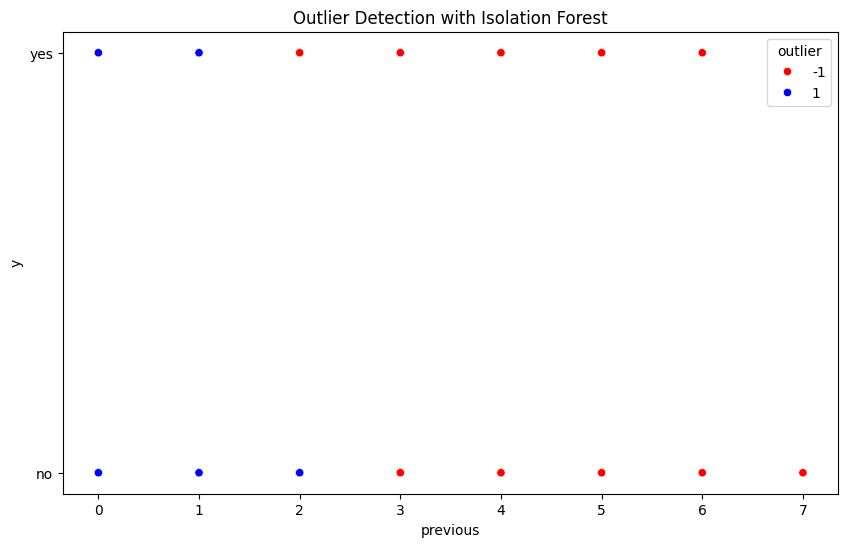

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


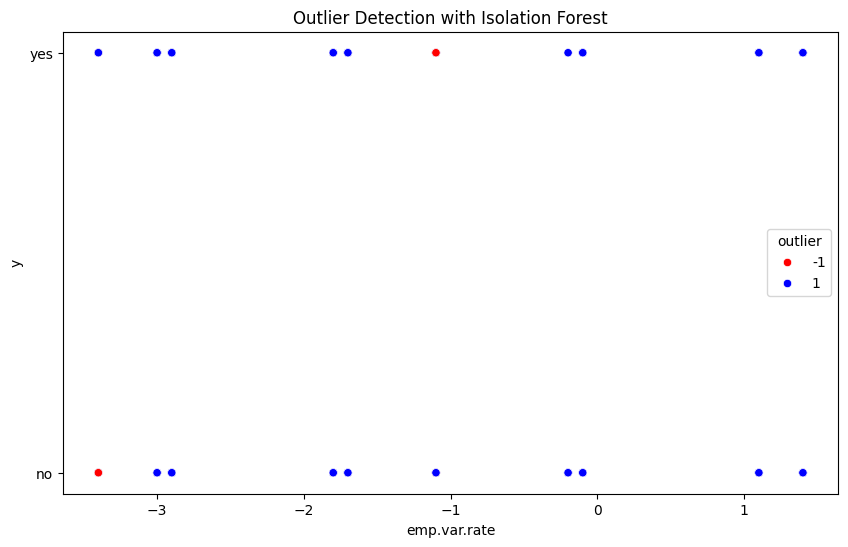

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


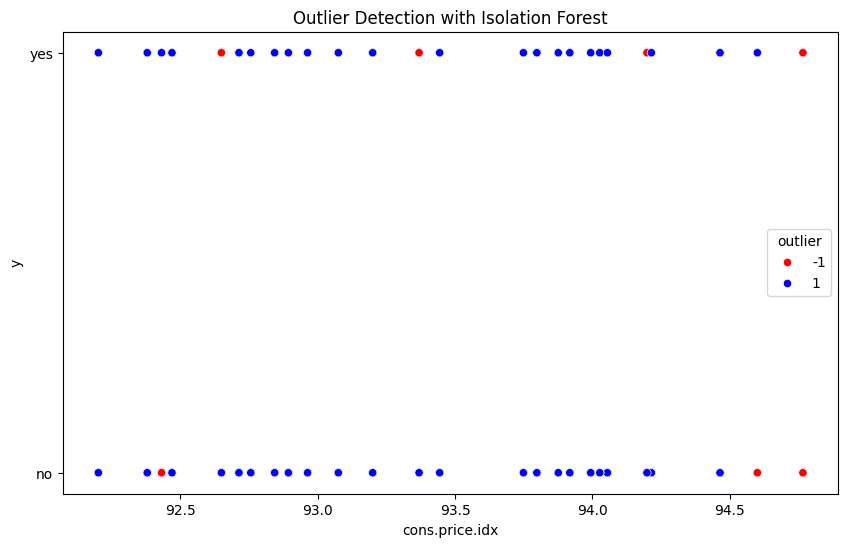

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


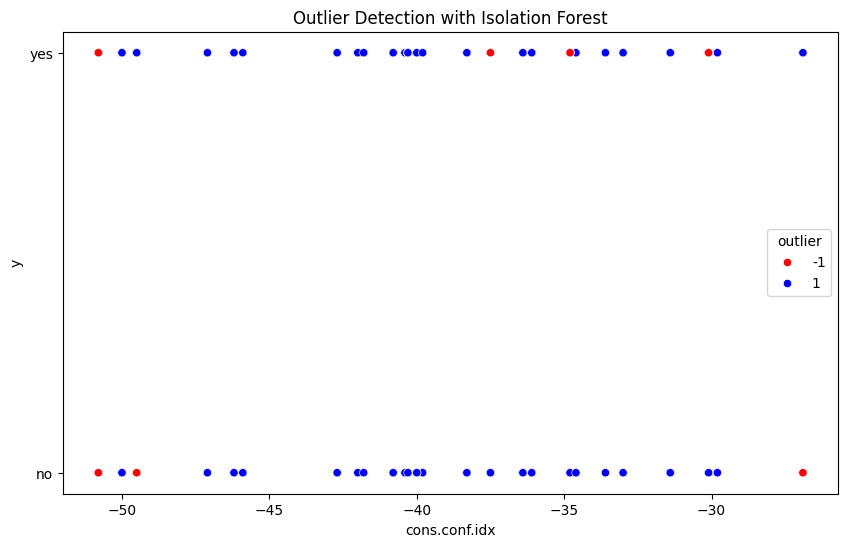

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


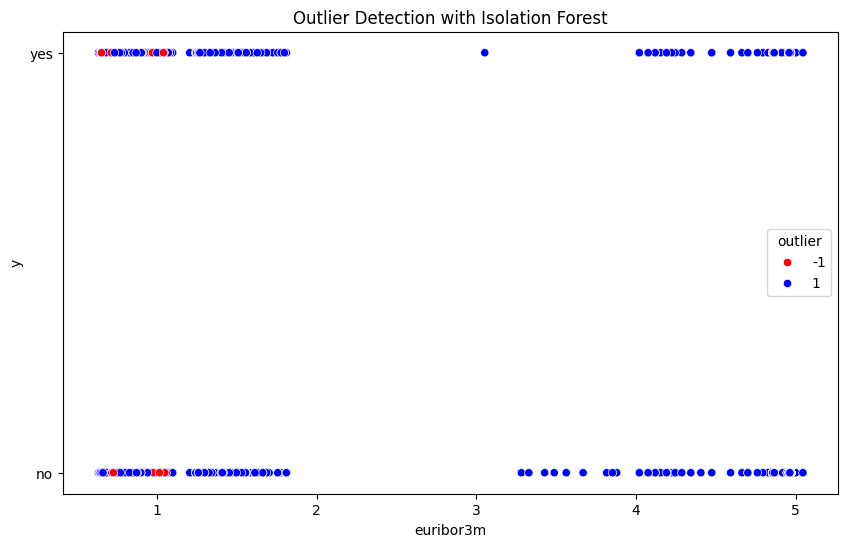

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


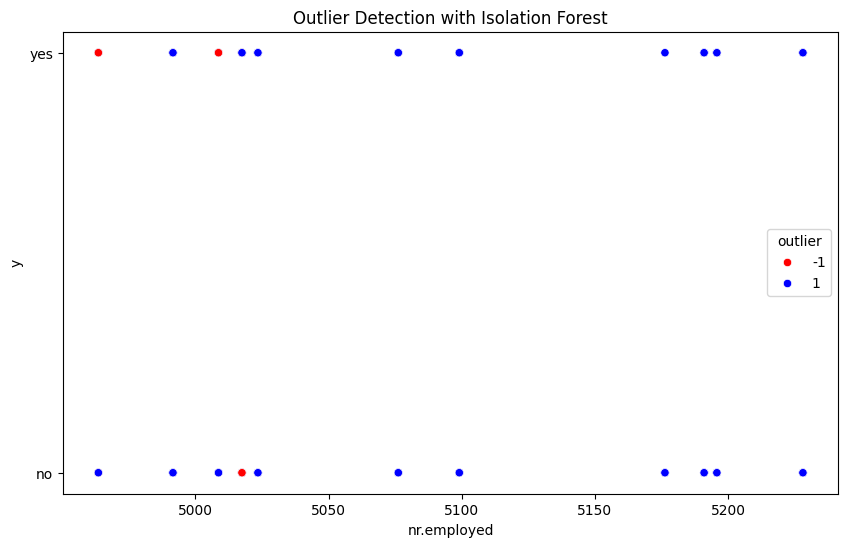

7-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


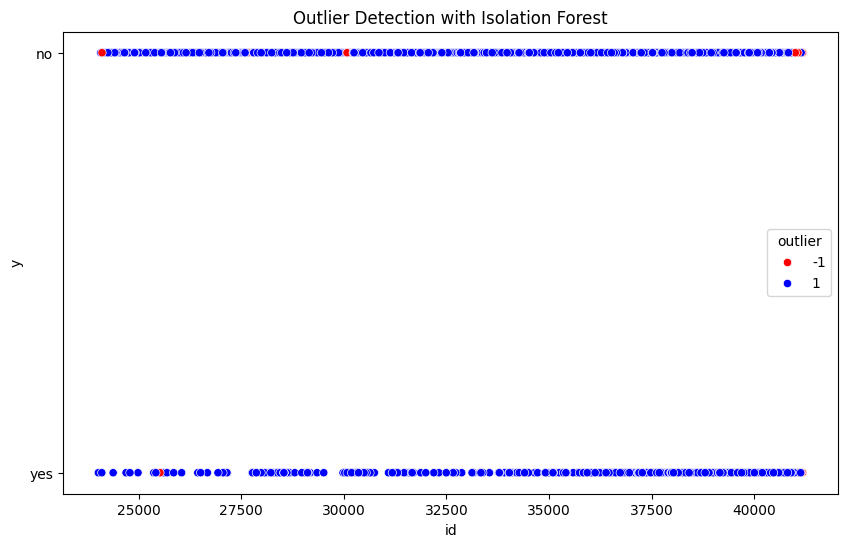

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


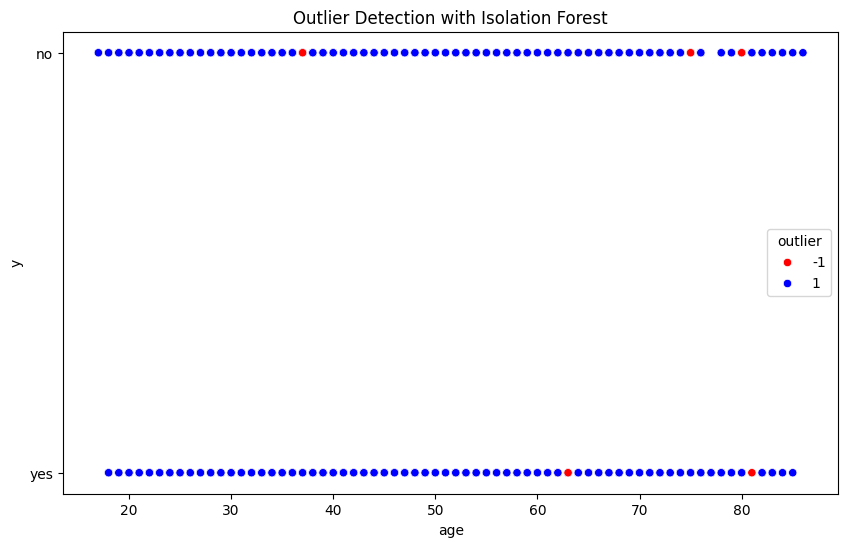

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


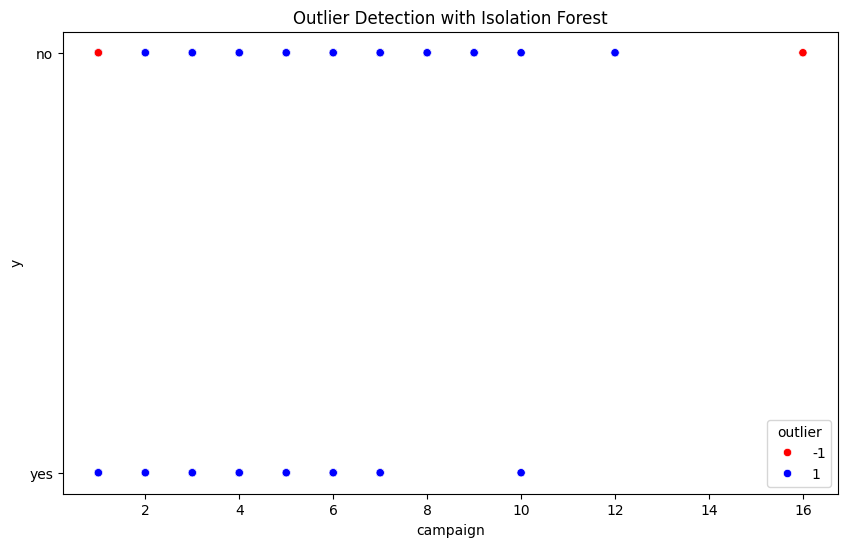

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


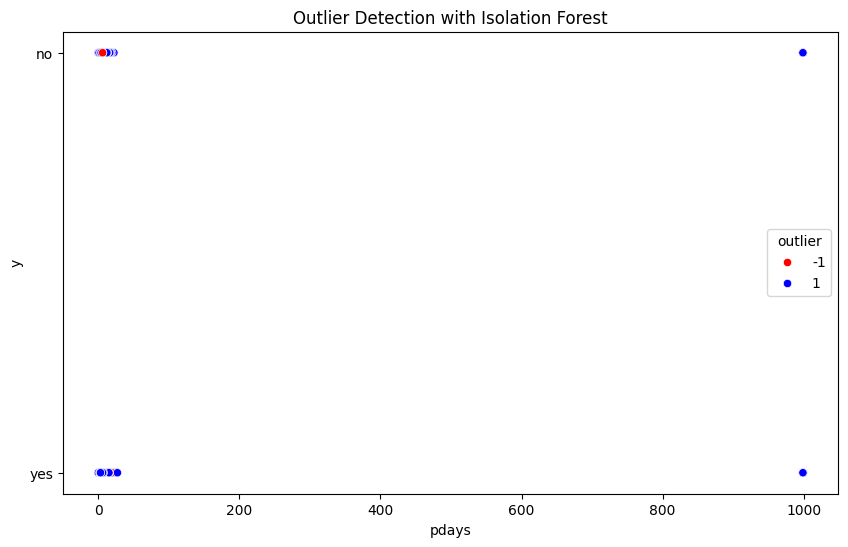

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


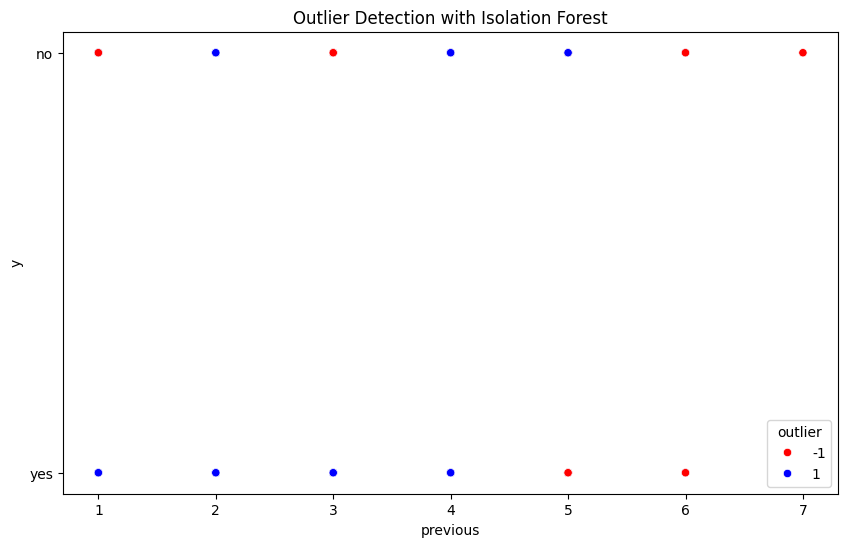

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


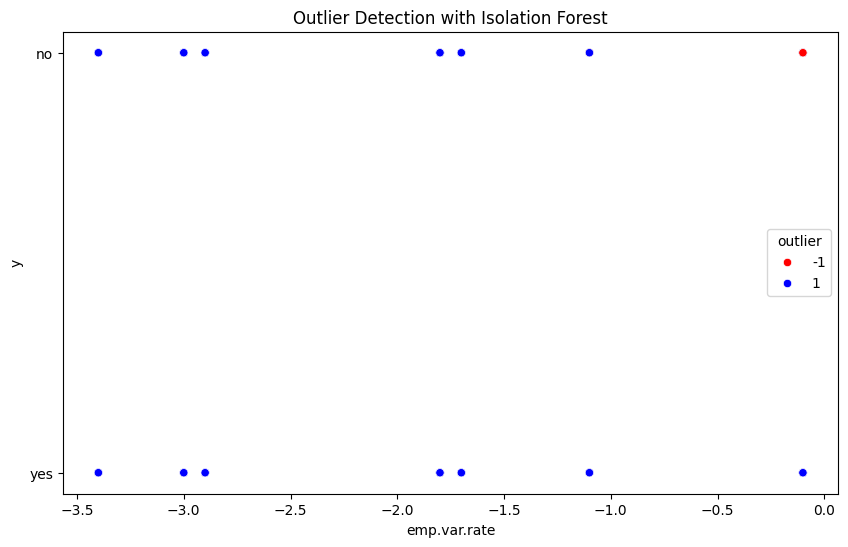

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


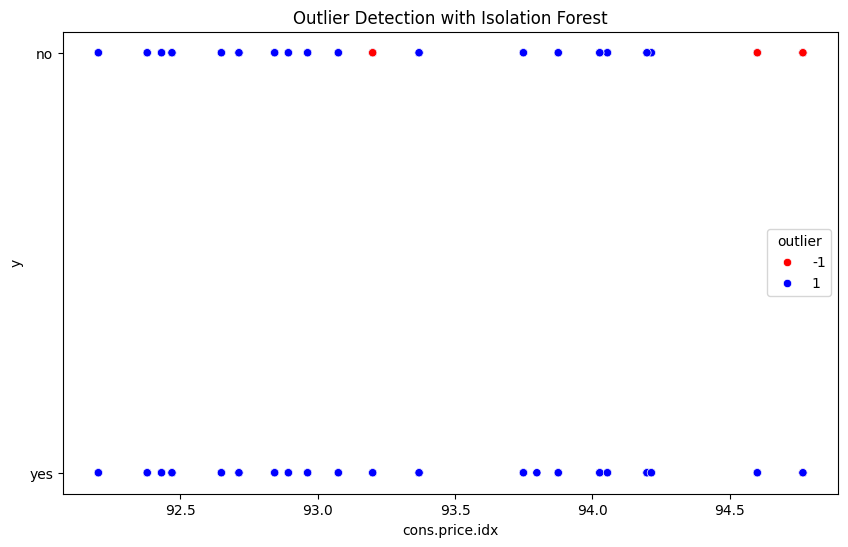

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


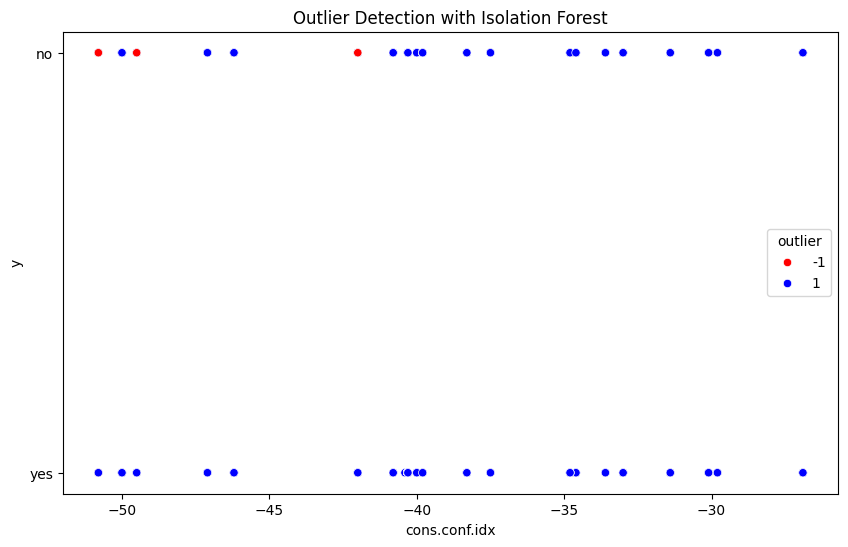

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


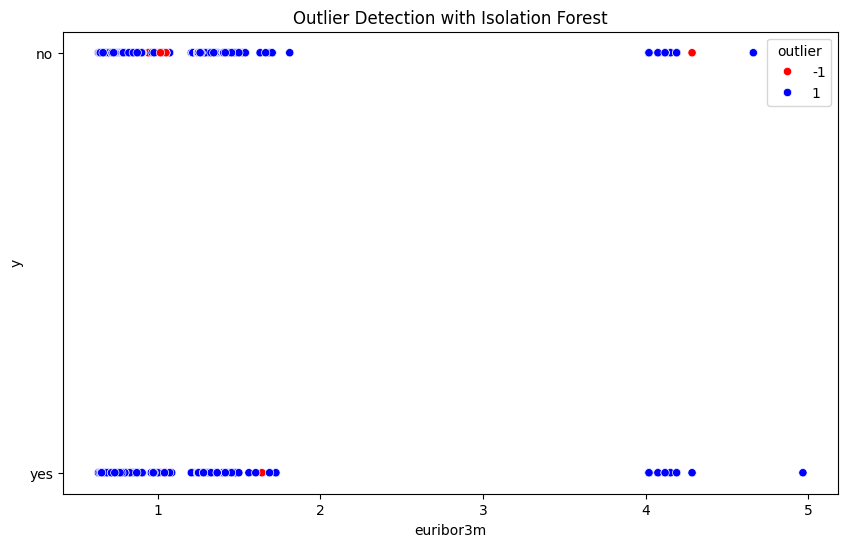

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


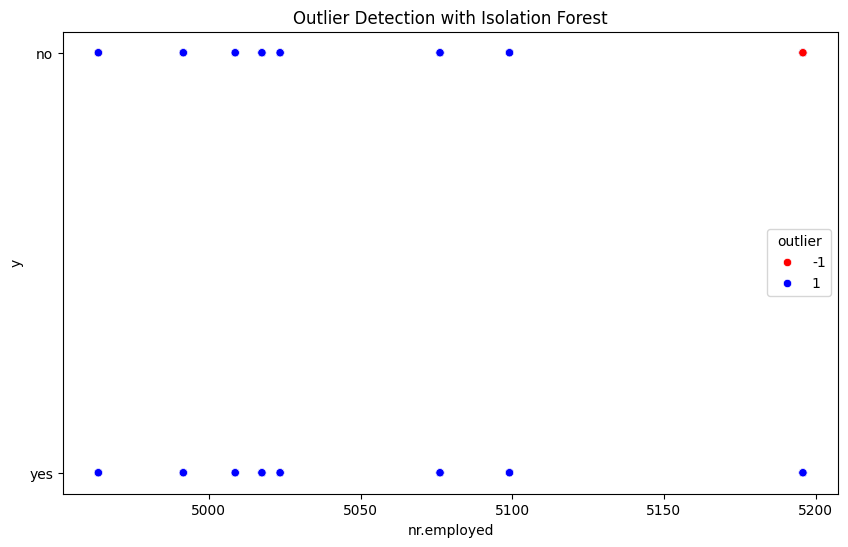

In [ ]:
from sklearn.ensemble import IsolationForest

numeric_cols = ['id', 'age', 'campaign', 'pdays', 'previous',
                'emp.var.rate','cons.price.idx', 'cons.conf.idx',
                'euribor3m', 'nr.employed']

random_state = 100
iso_forest = IsolationForest(n_estimators=100, contamination=0.02, random_state=random_state)

for i in range(len(imputed_group)):
  print(f'{i}-th df에 대한 이상치 확인')

  df_outlier = imputed_group[i].copy()
  for col in df.columns:
    if df_outlier[col].dtype == 'int64' or df_outlier[col].dtype == 'float64':
      outliers = iso_forest.fit_predict(df_outlier[numeric_cols])

      print("Outliers detected:", np.sum(outliers == -1))
      df_outlier['outlier'] = outliers

      plt.figure(figsize=(10, 6))
      sns.scatterplot(x=f'{col}', y='y', hue='outlier', data=df_outlier, palette={-1: 'red', 1: 'blue'})
      plt.title('Outlier Detection with Isolation Forest')
      plt.xlabel(f'{col}')
      plt.ylabel('y')
      plt.show()

0-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


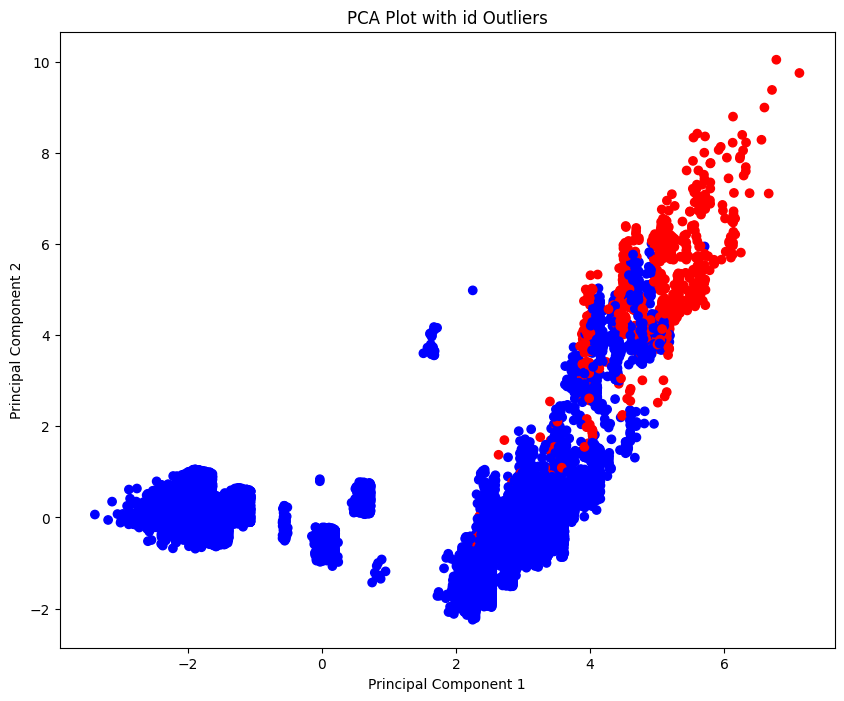

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


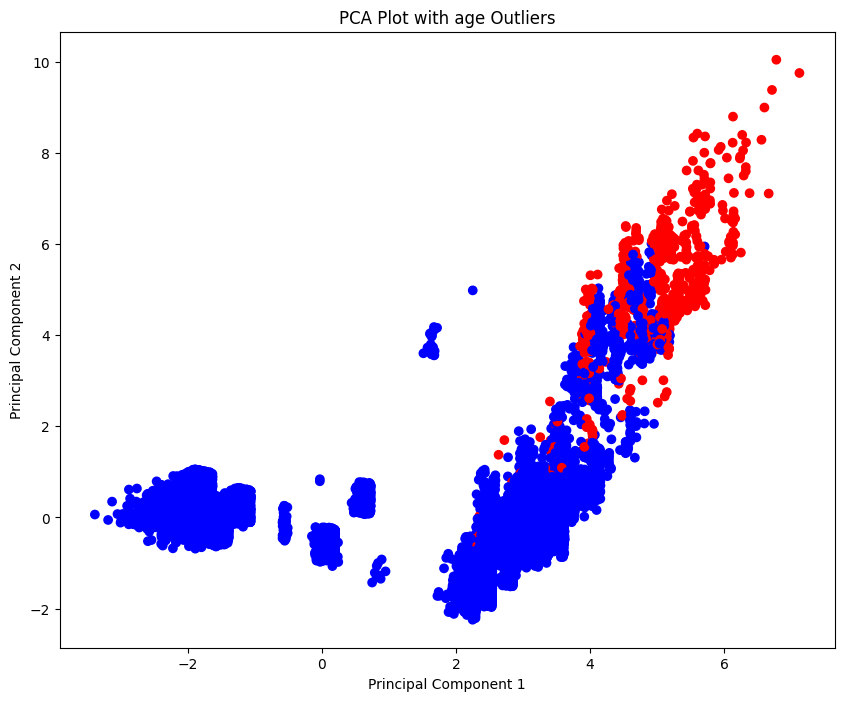

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


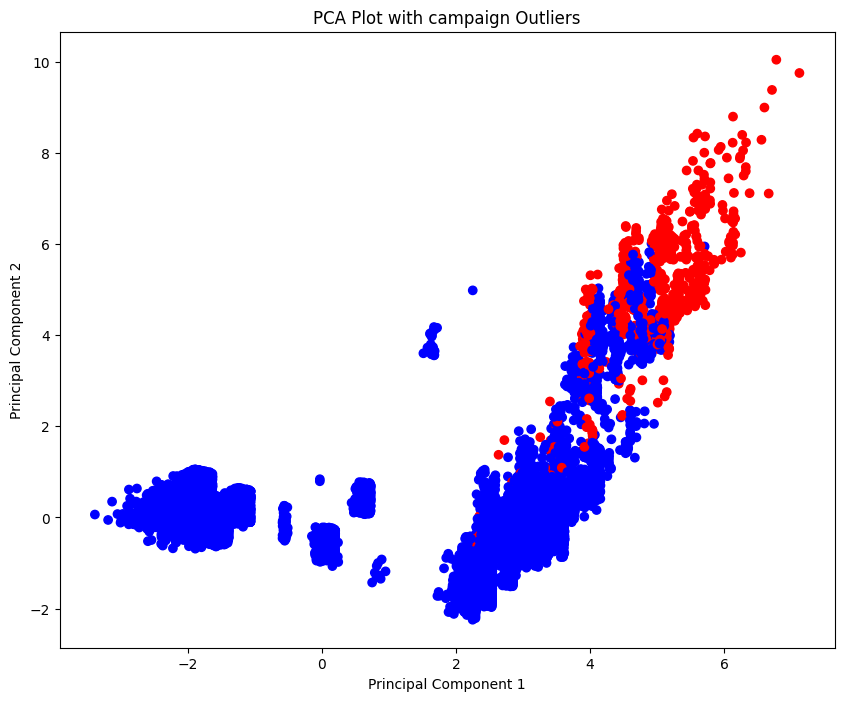

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


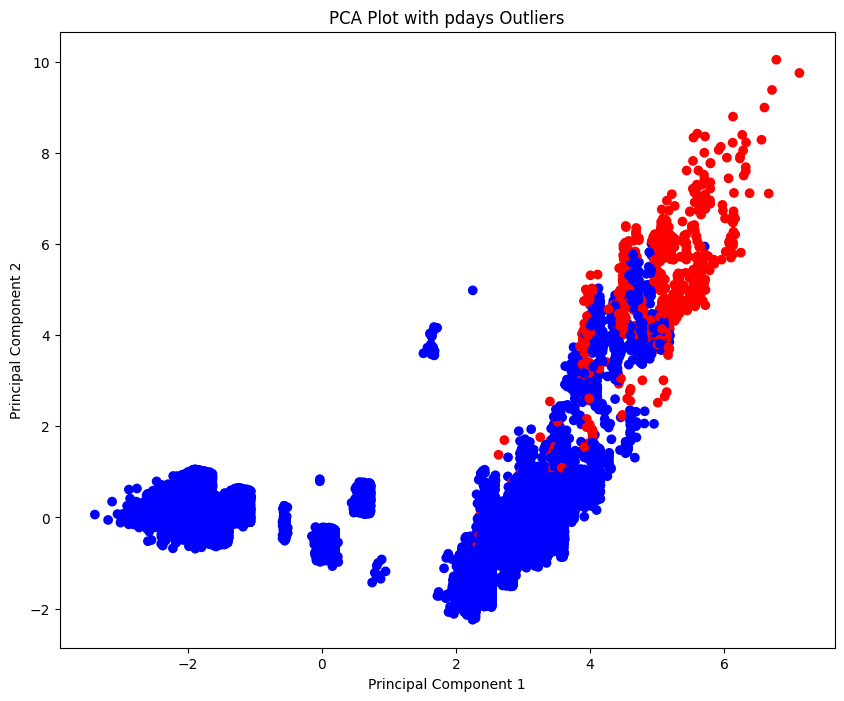

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


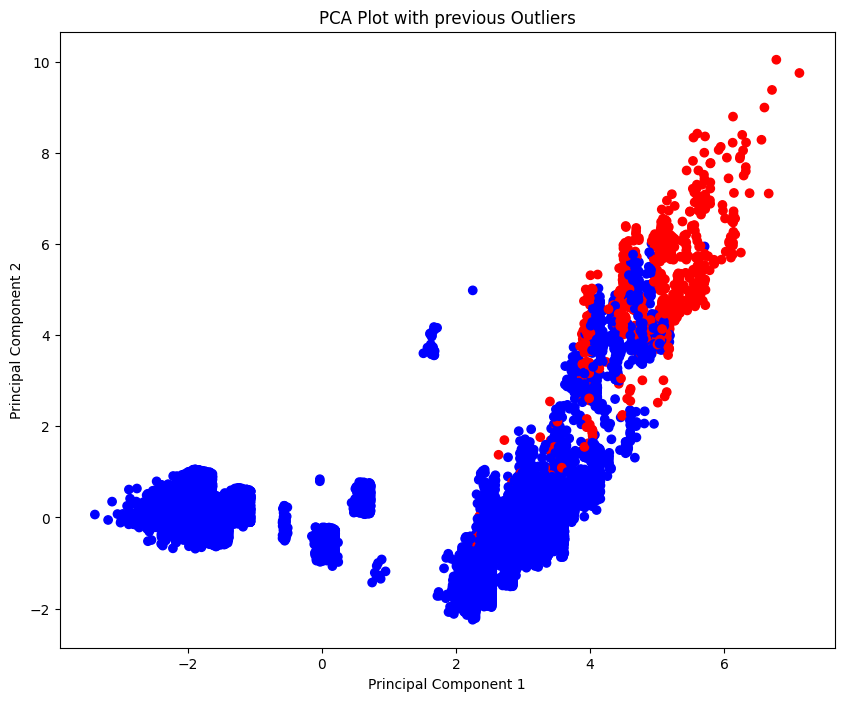

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


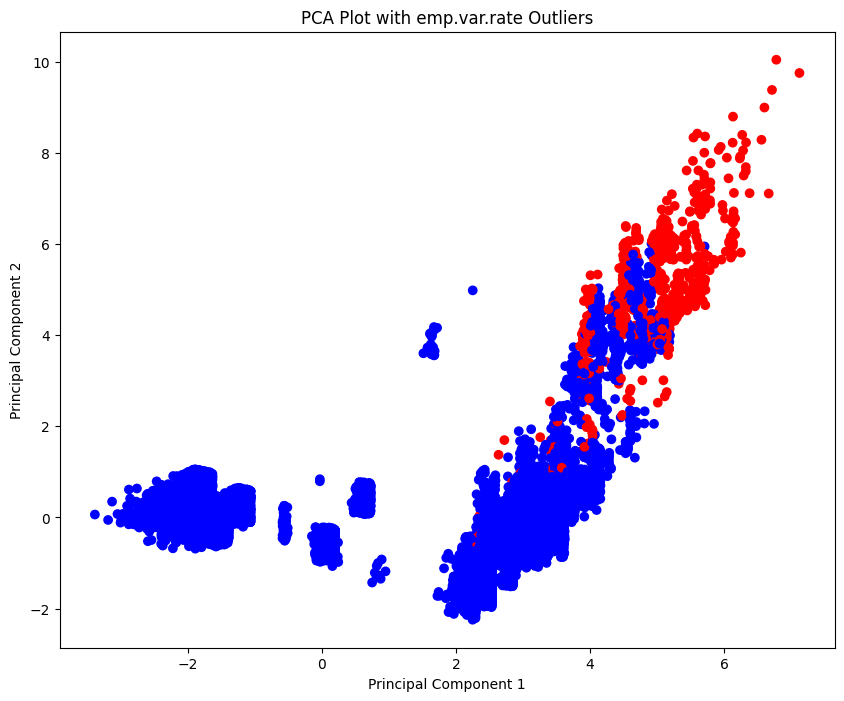

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


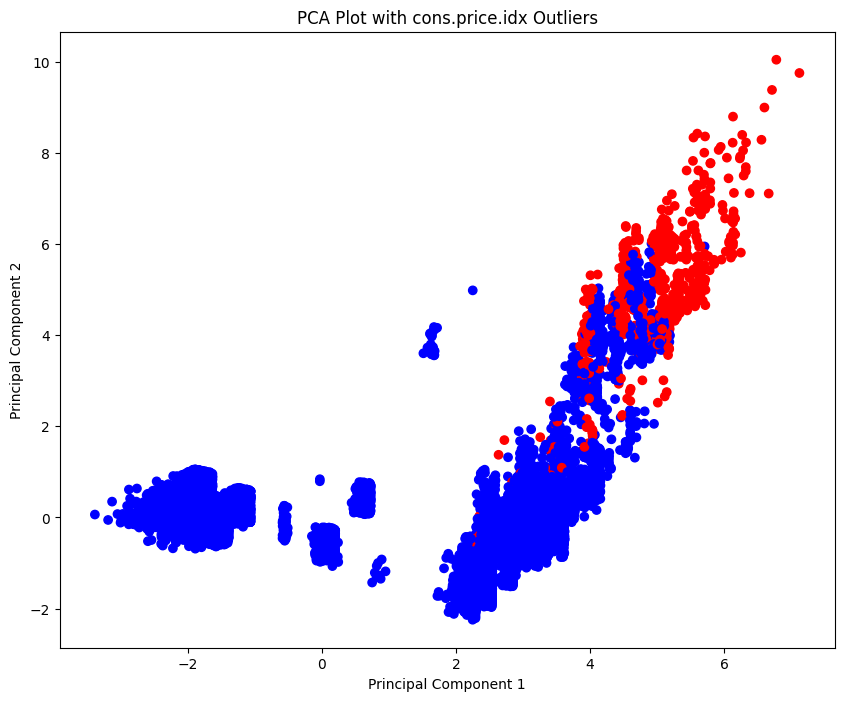

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


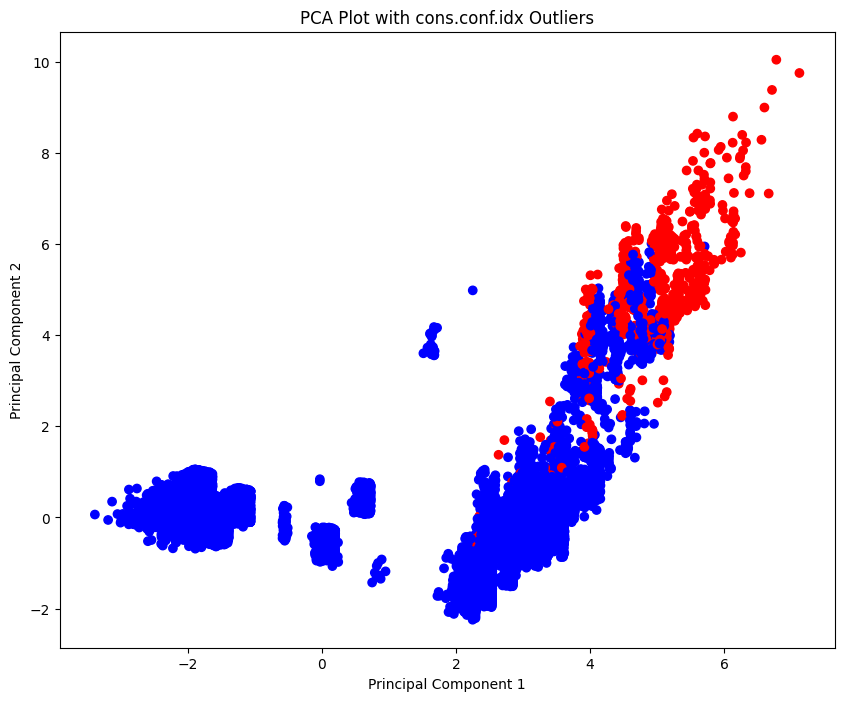

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


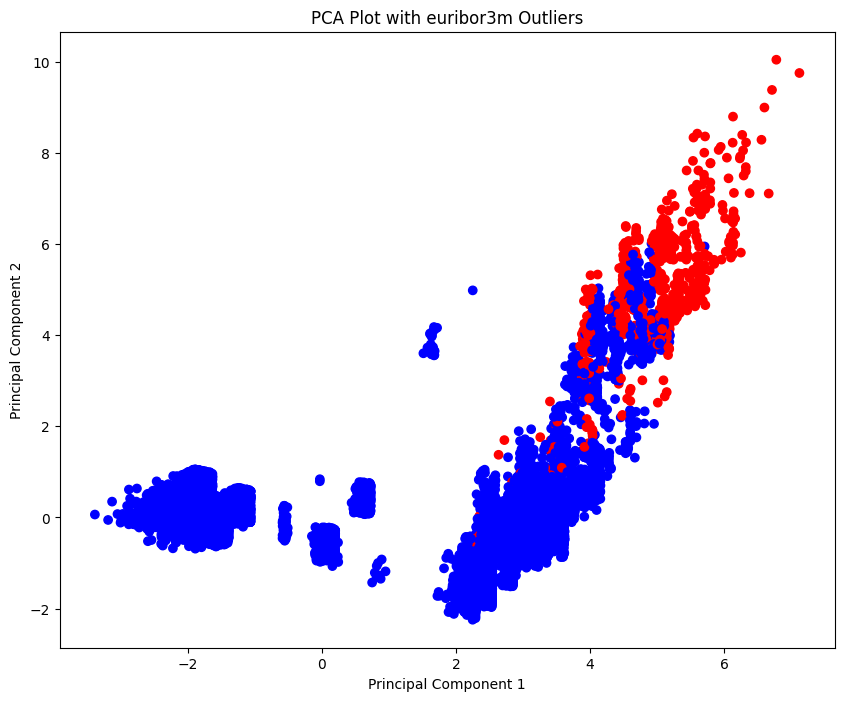

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


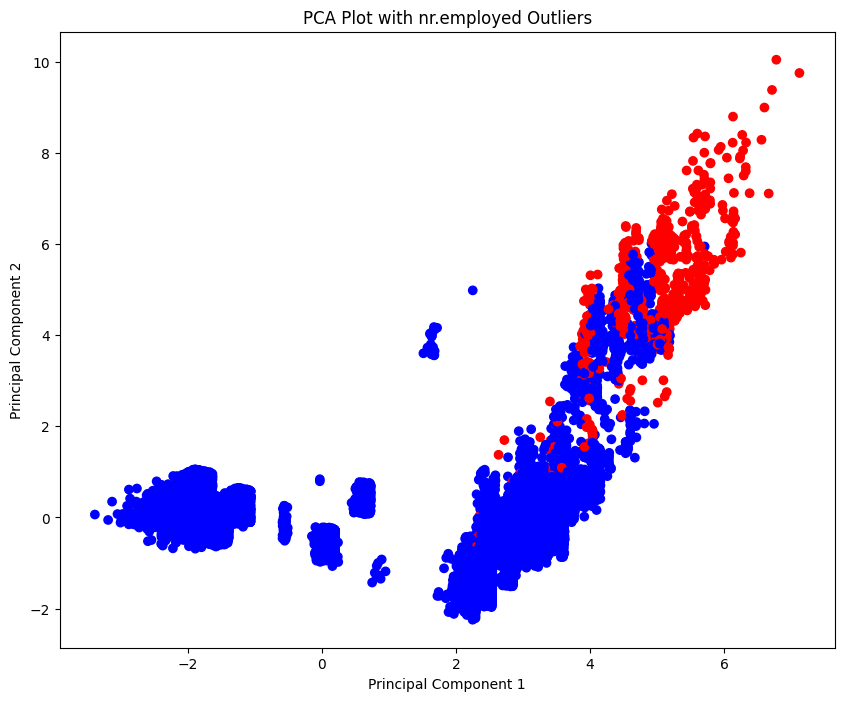

1-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


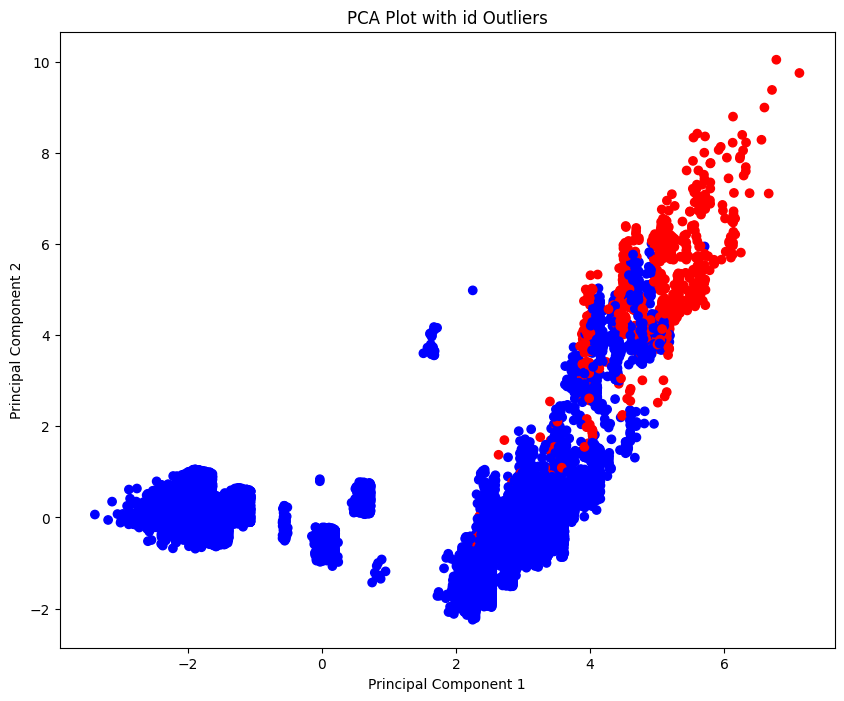

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


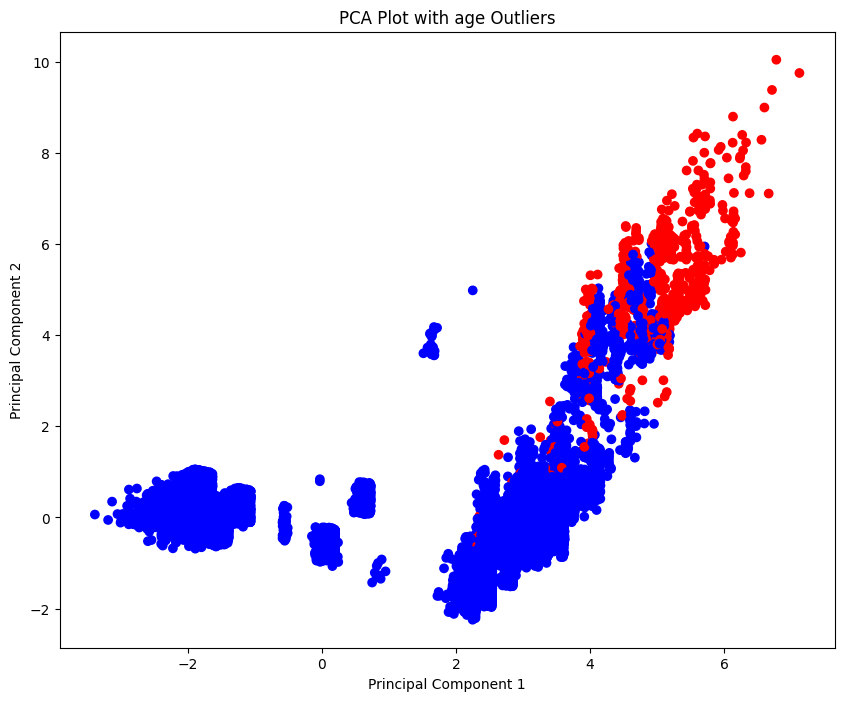

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


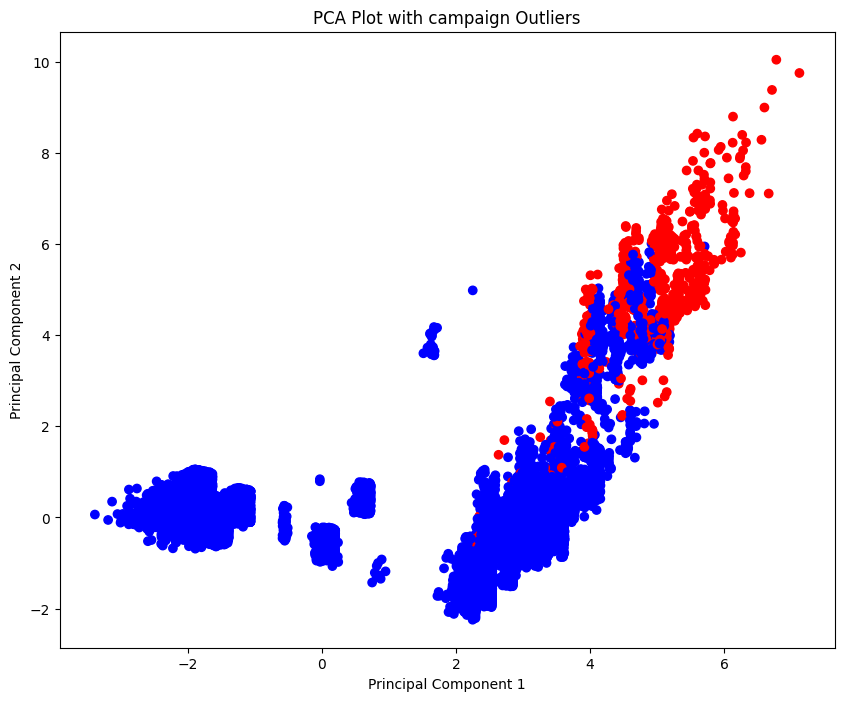

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


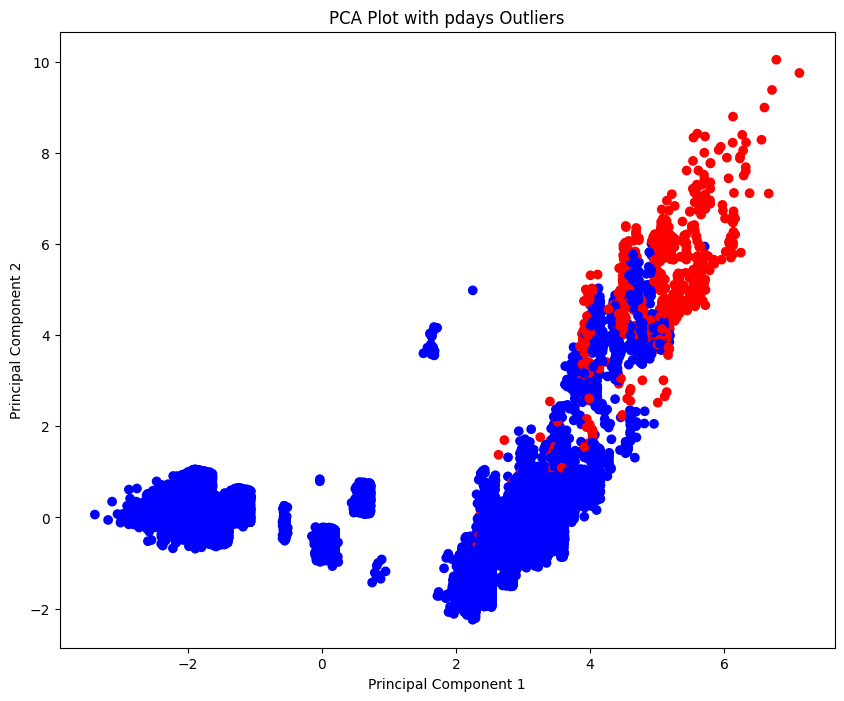

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


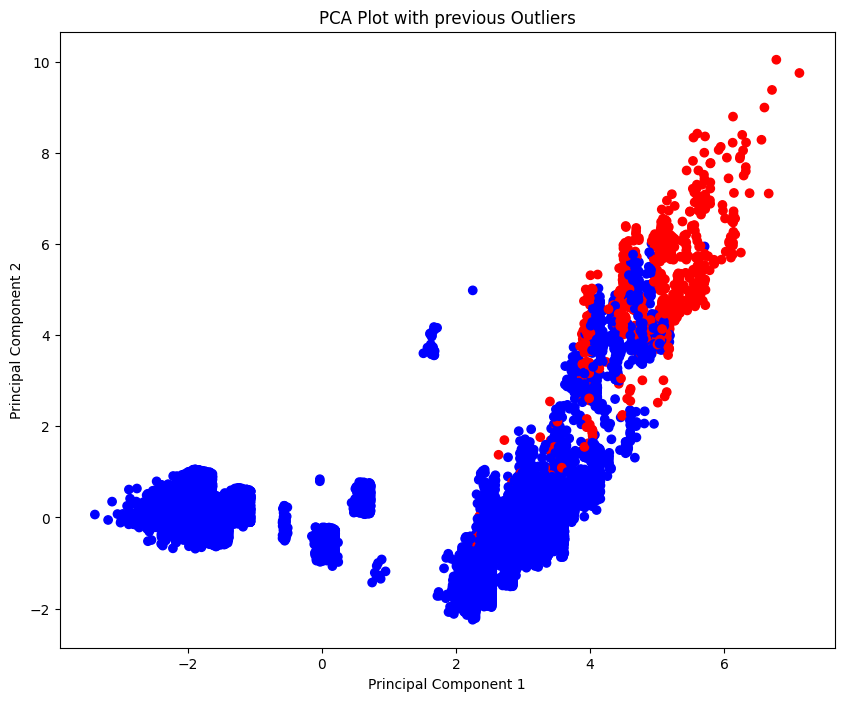

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


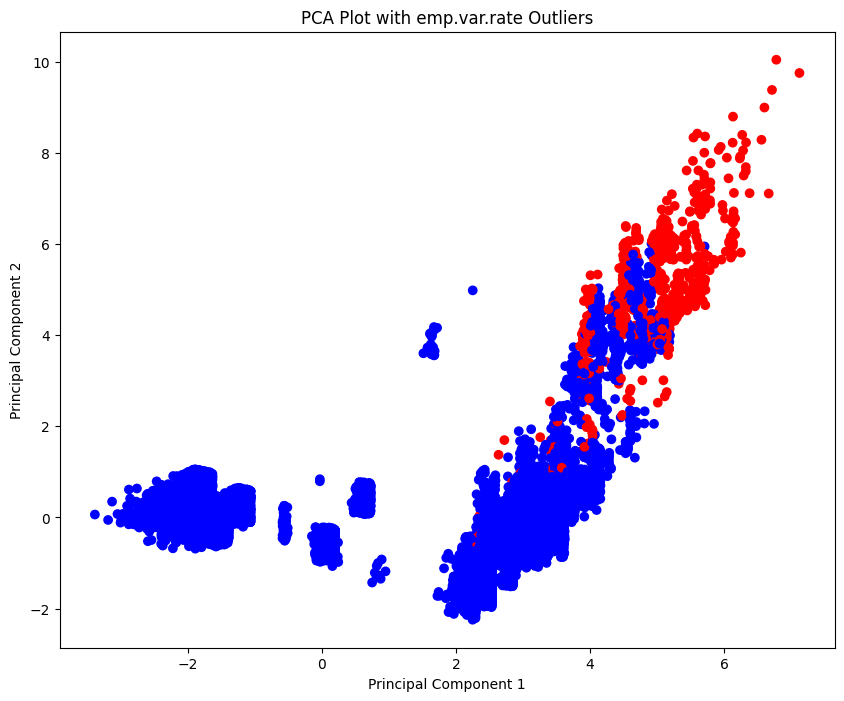

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


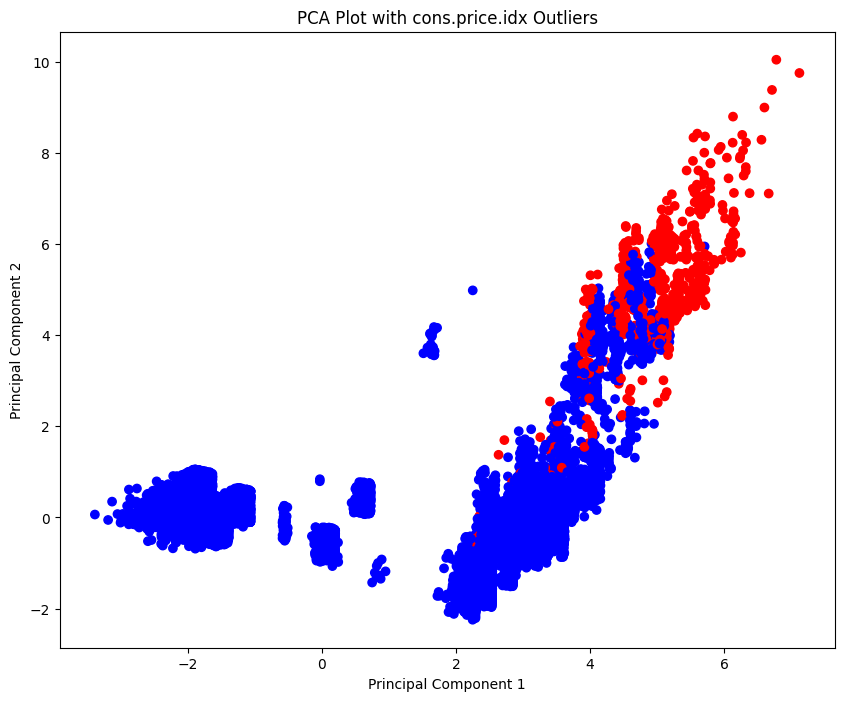

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


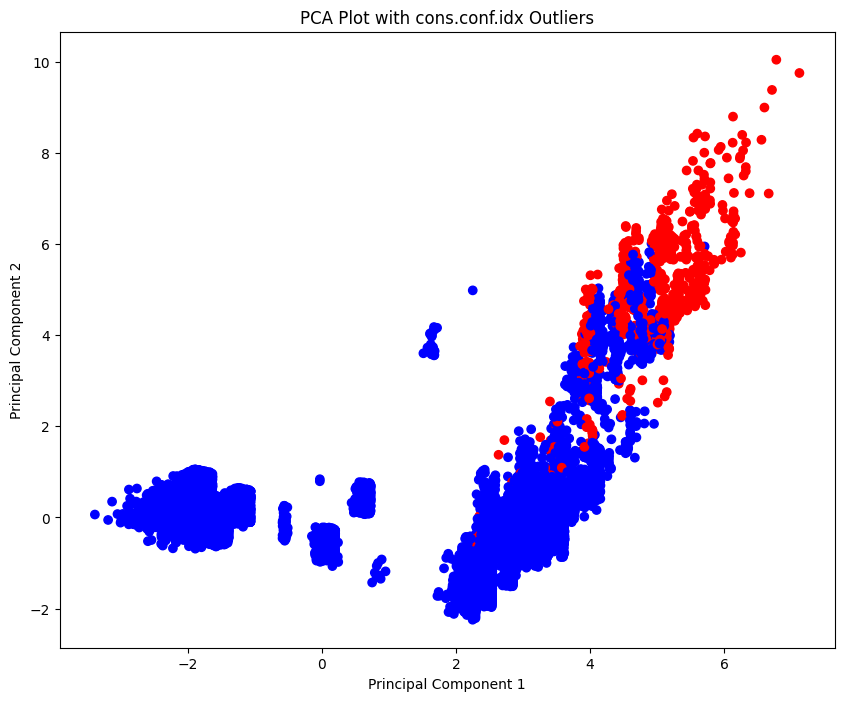

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


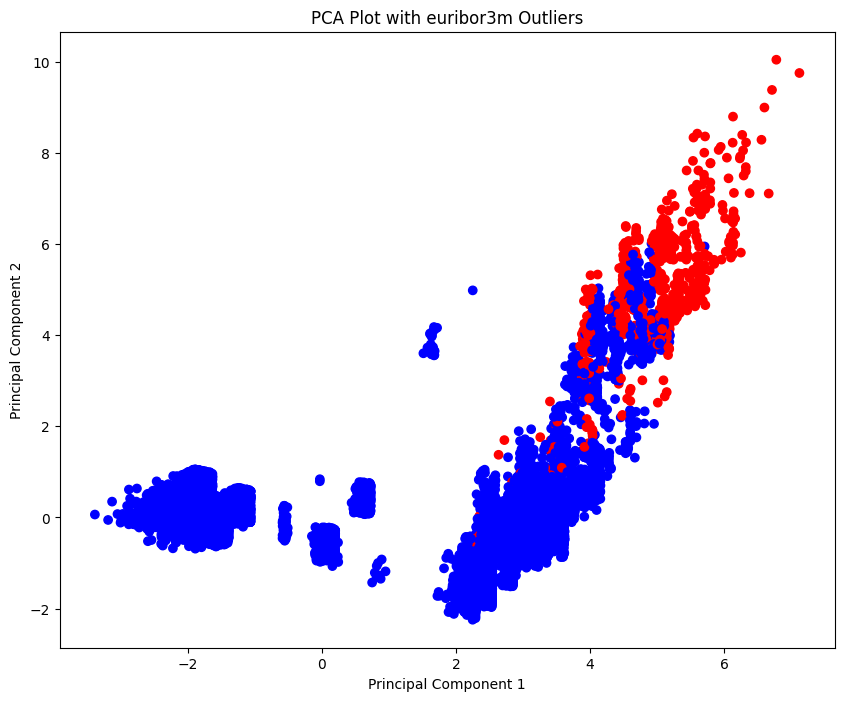

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


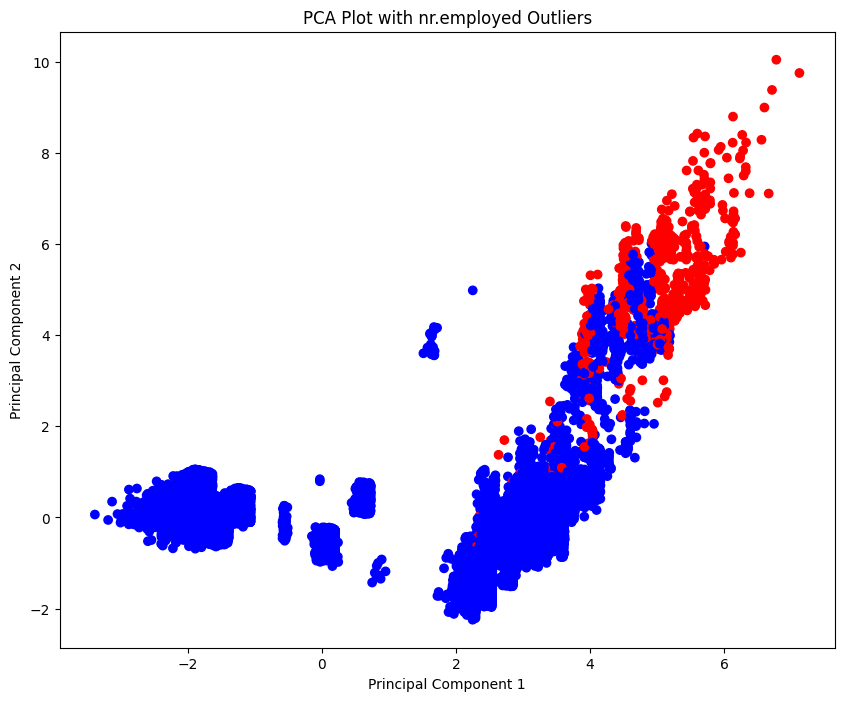

2-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


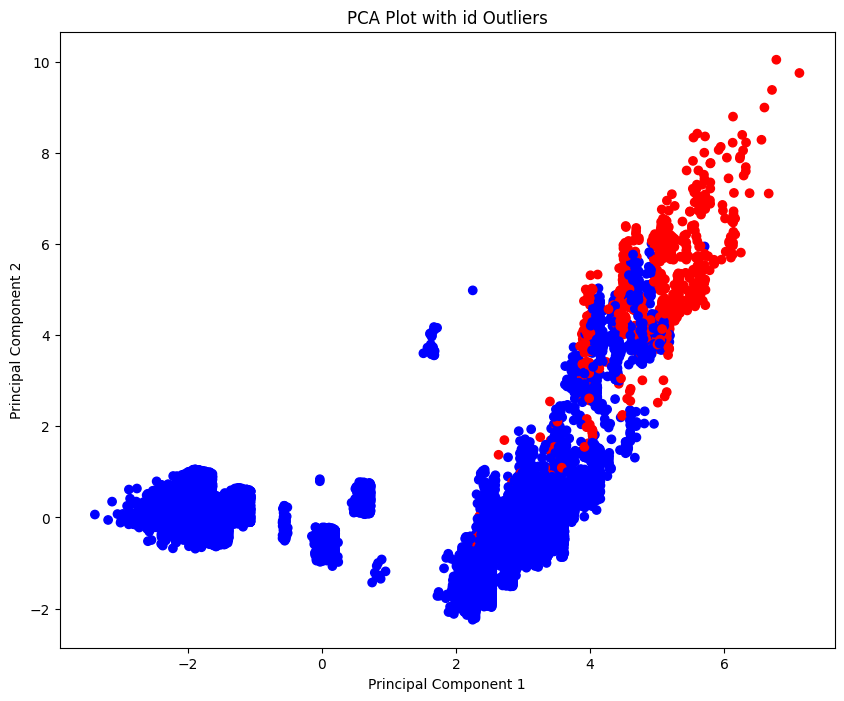

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


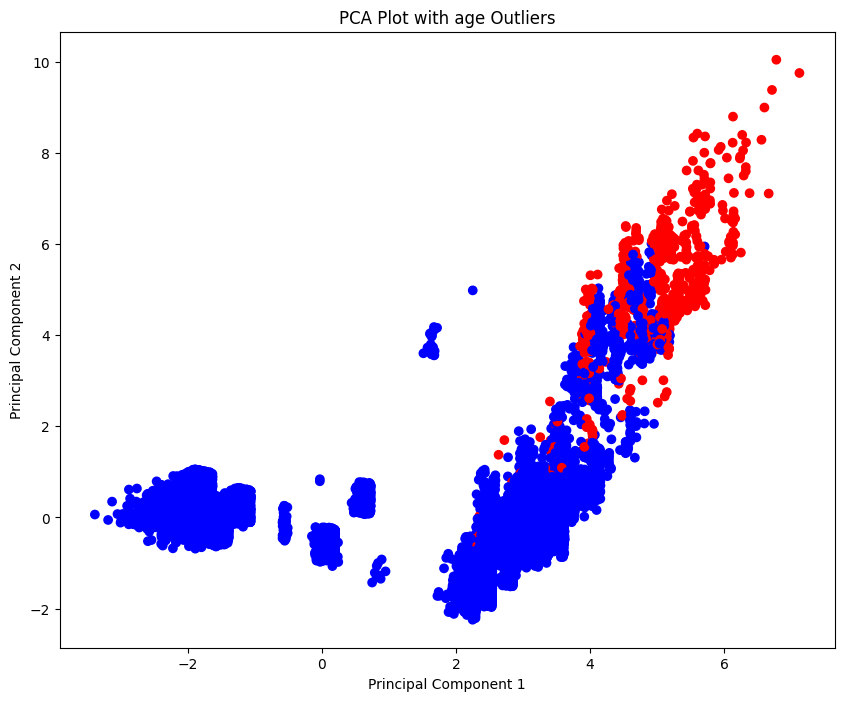

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


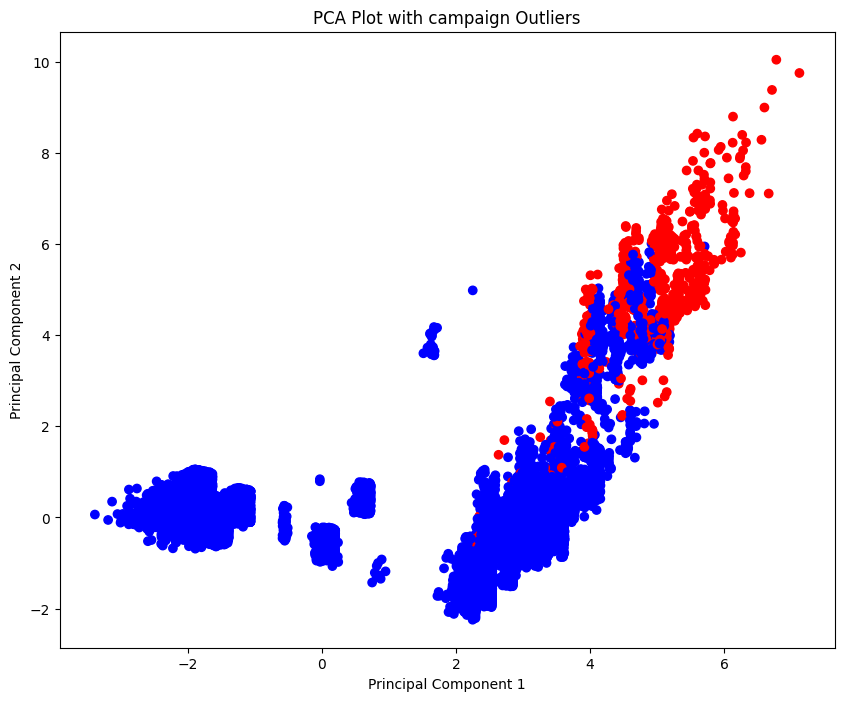

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


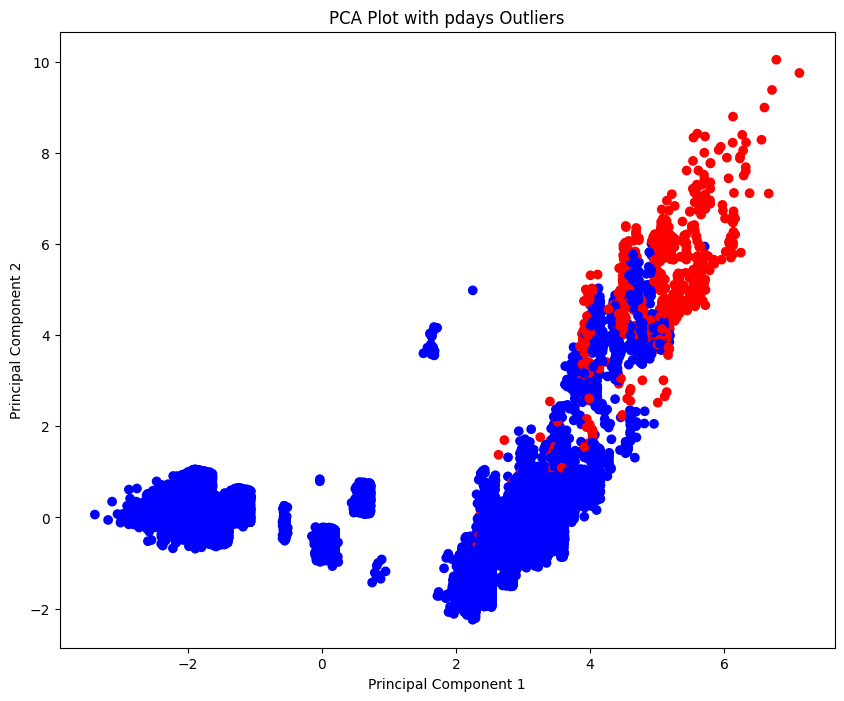

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


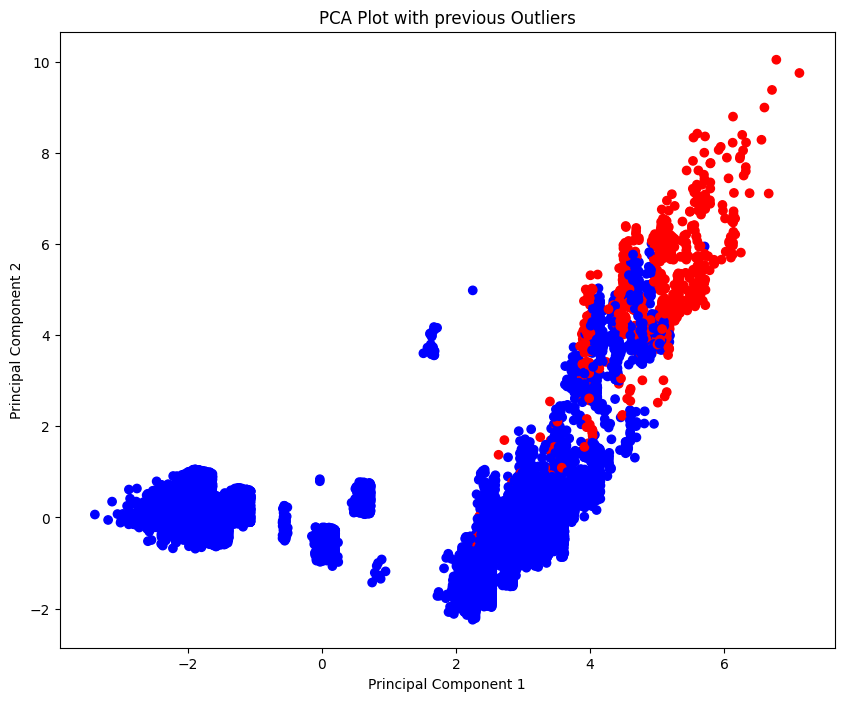

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


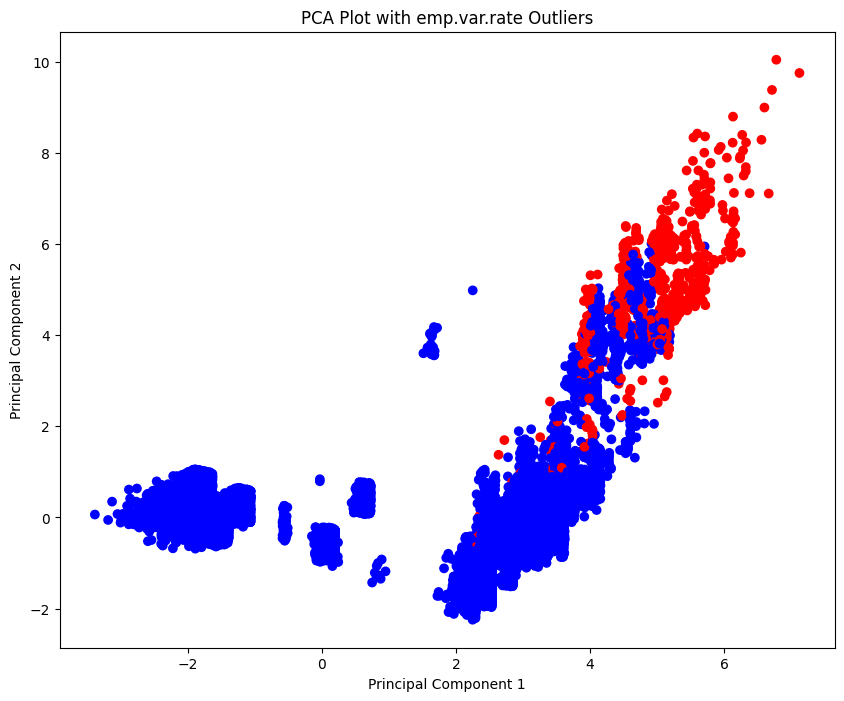

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


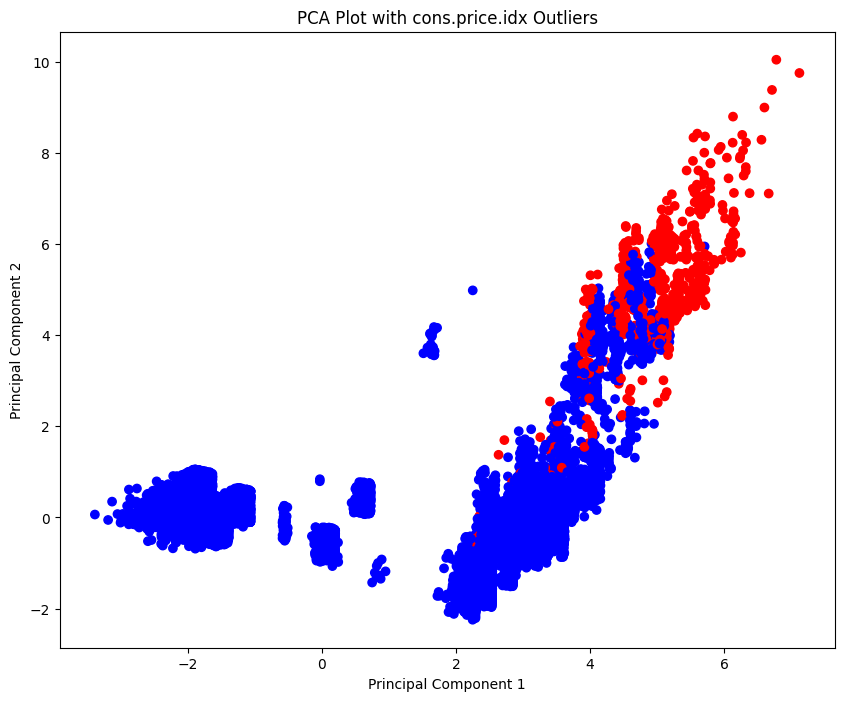

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


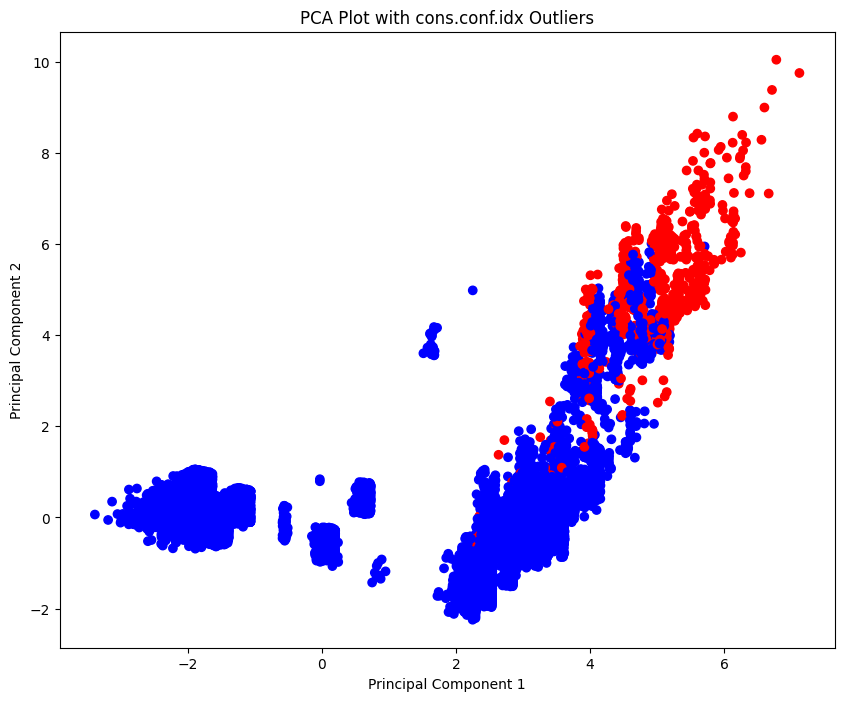

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


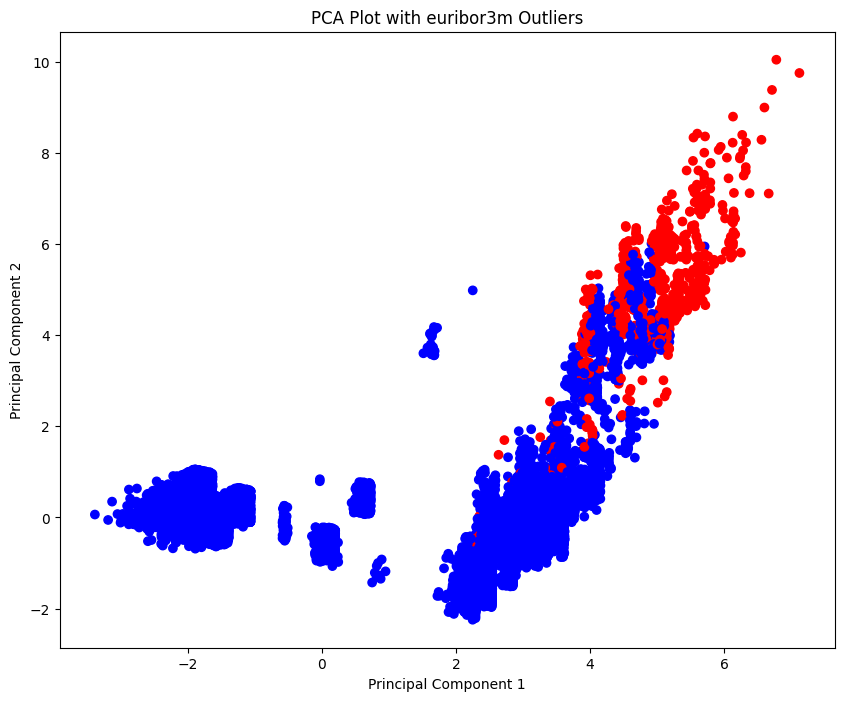

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


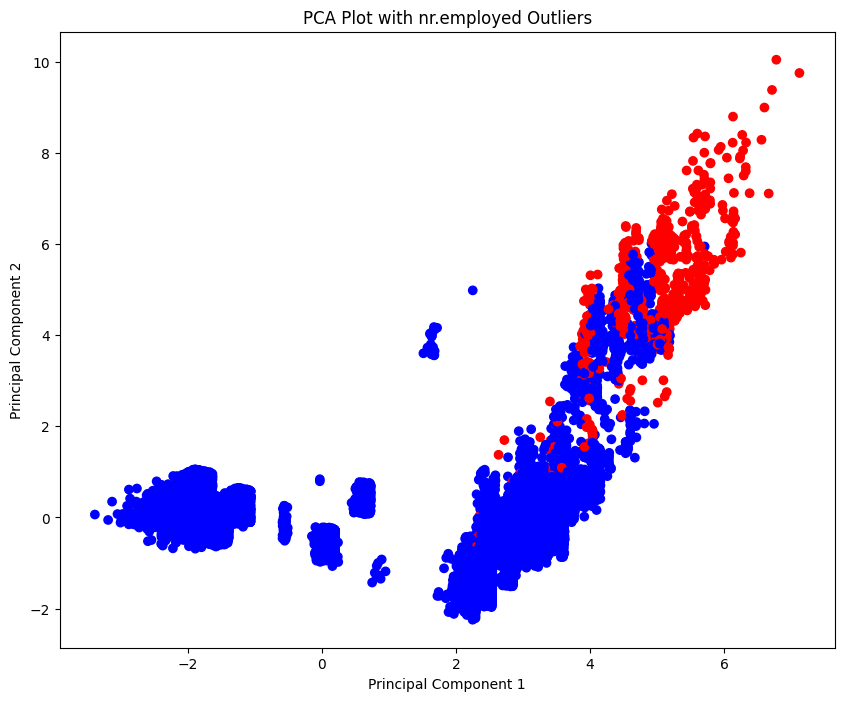

3-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


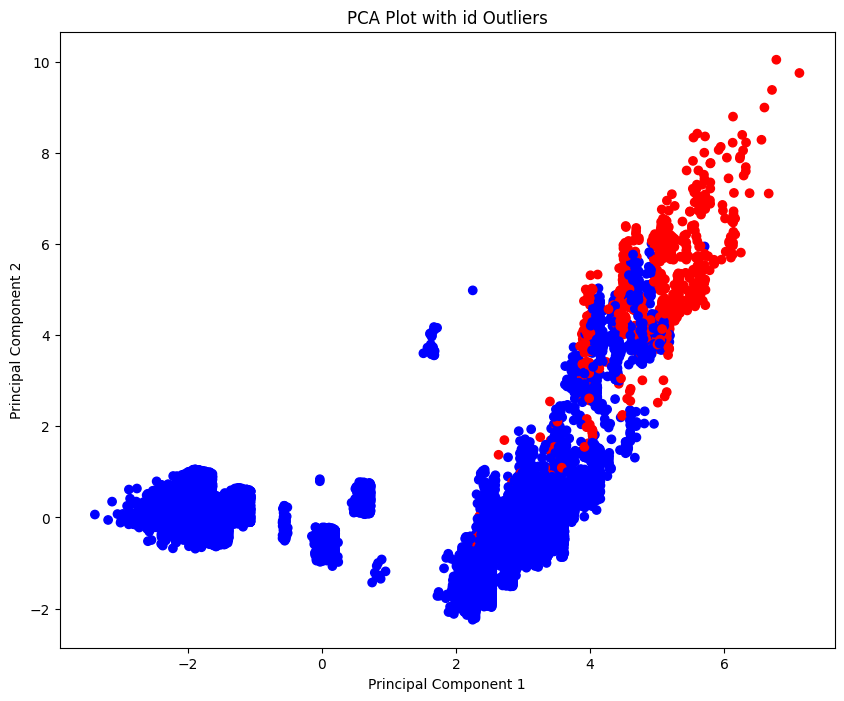

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


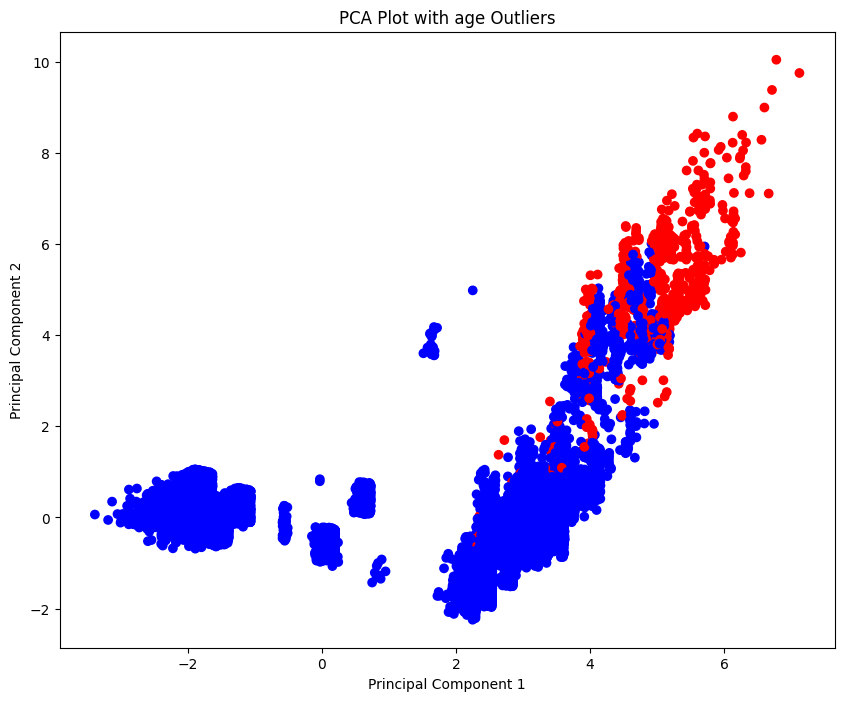

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


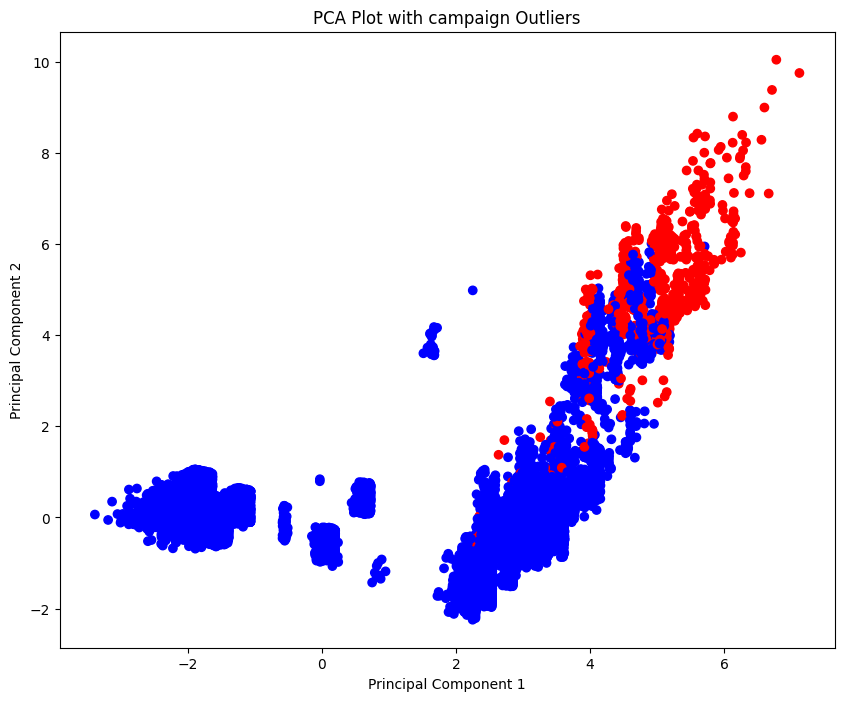

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


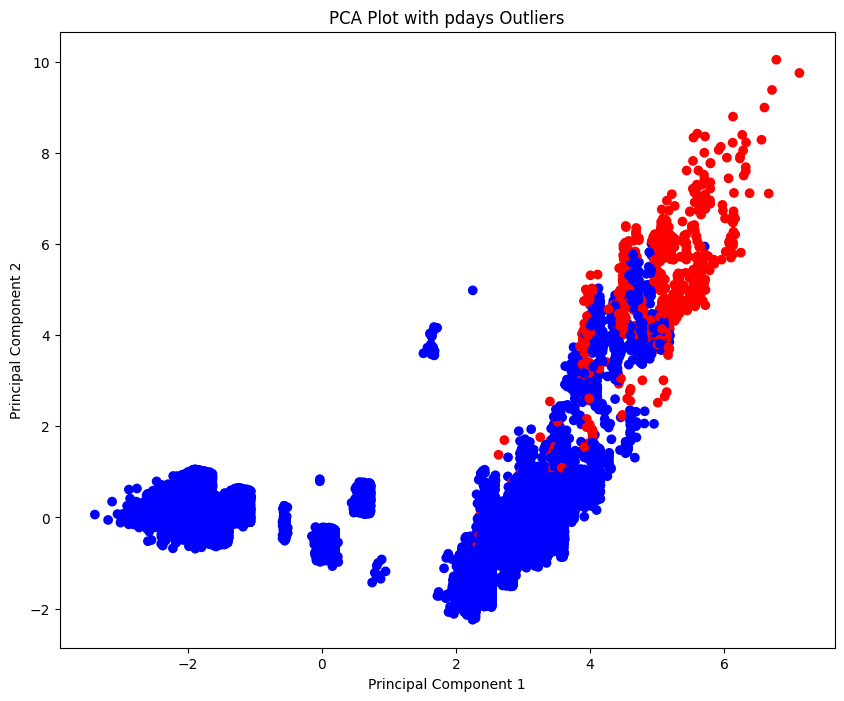

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


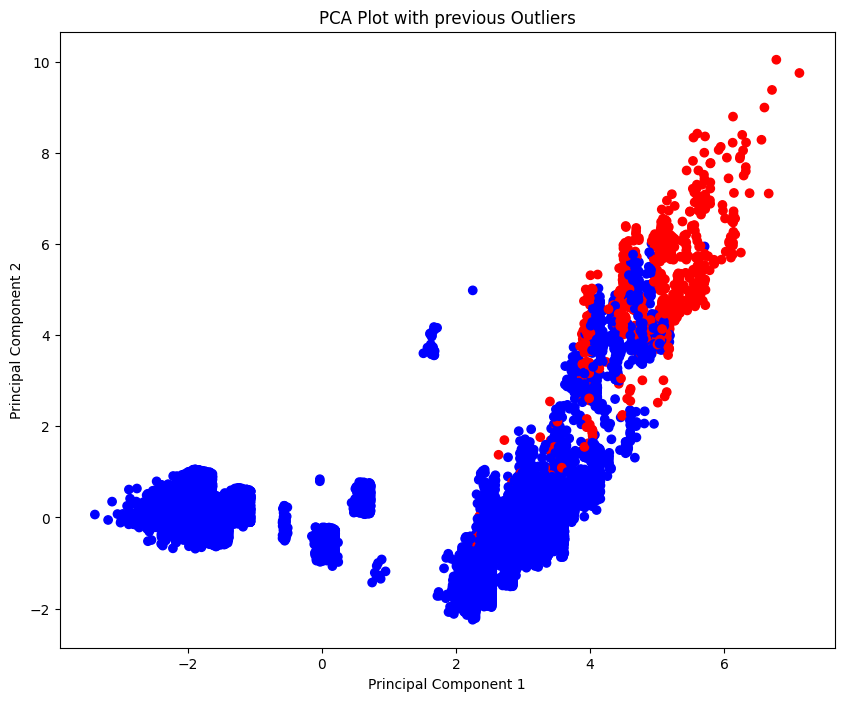

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


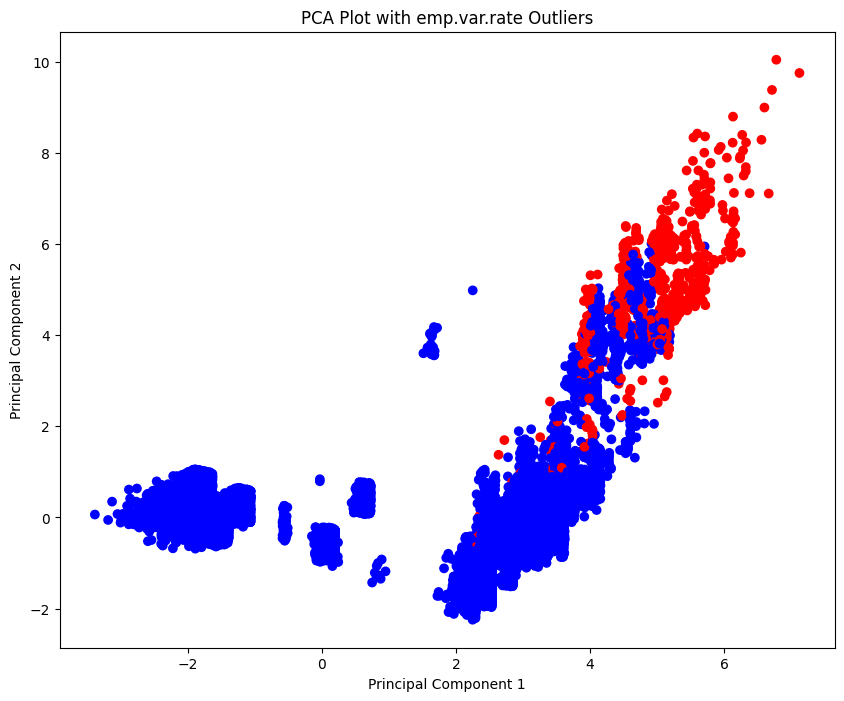

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


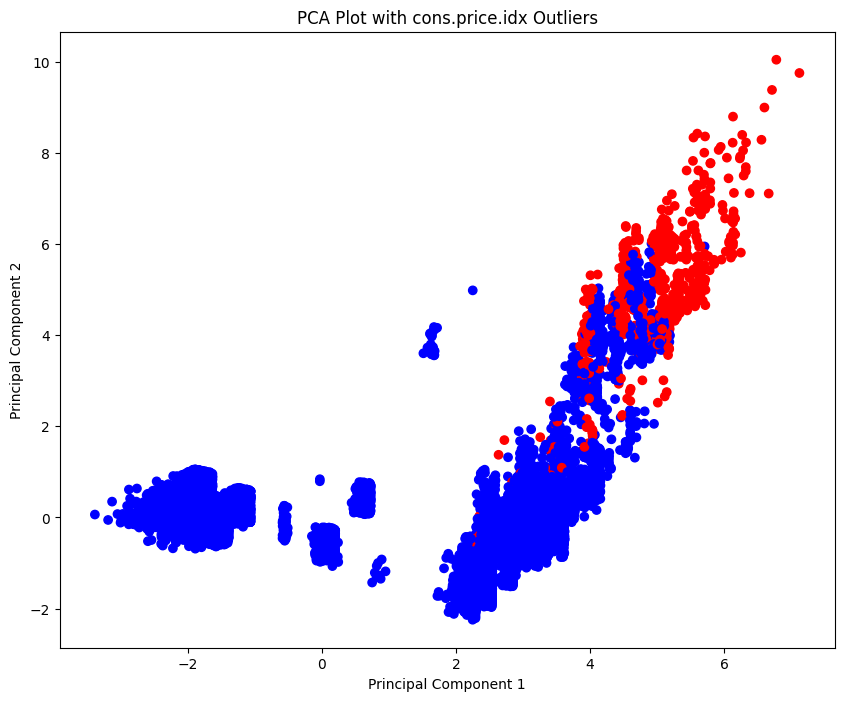

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


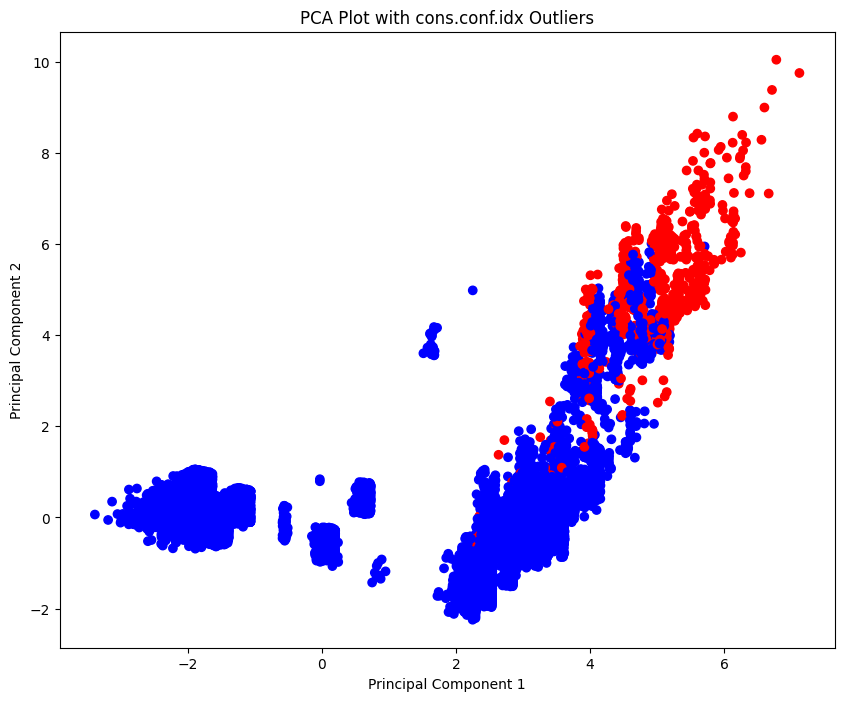

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


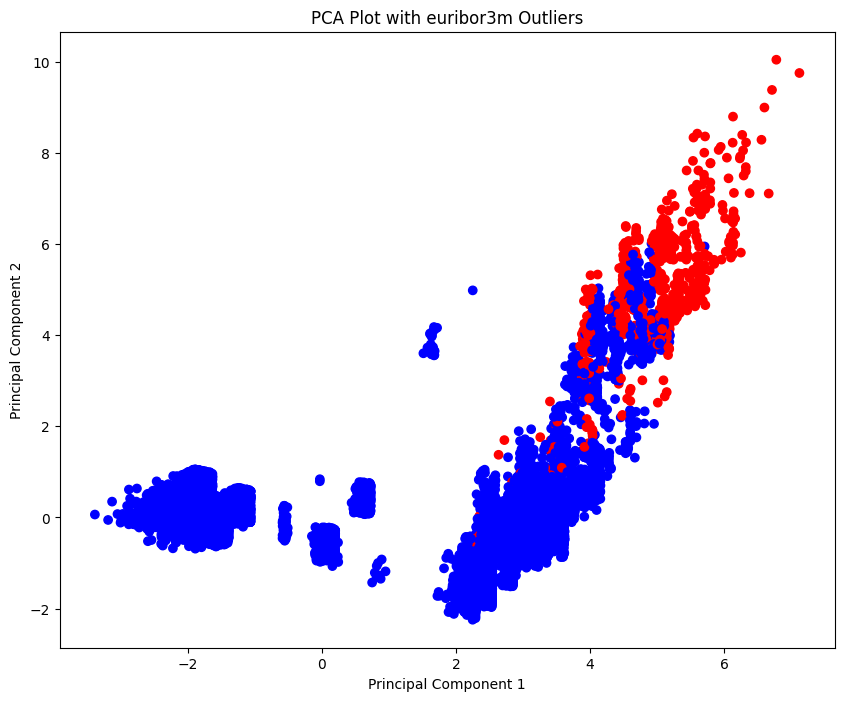

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


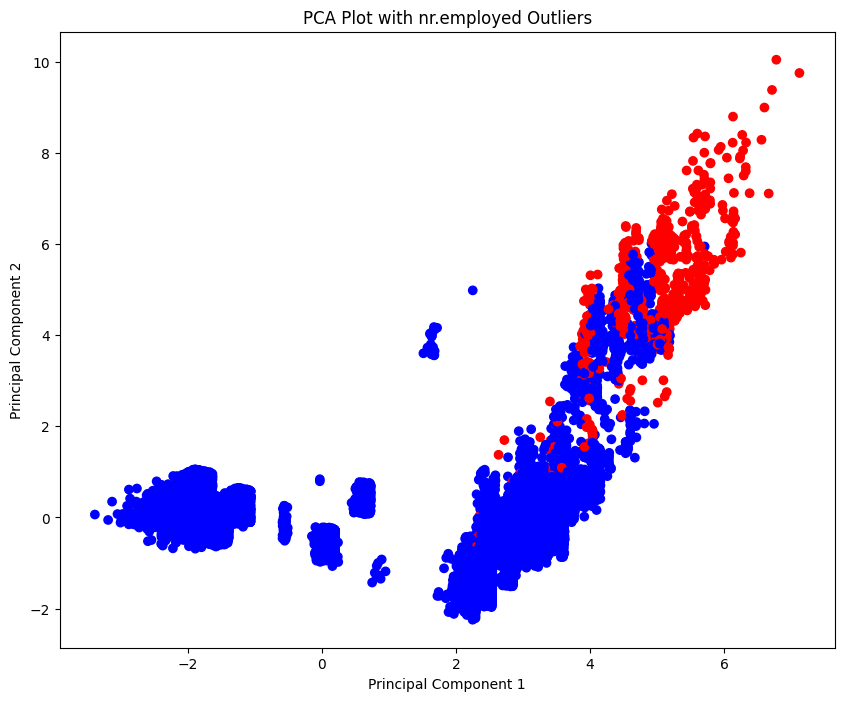

4-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


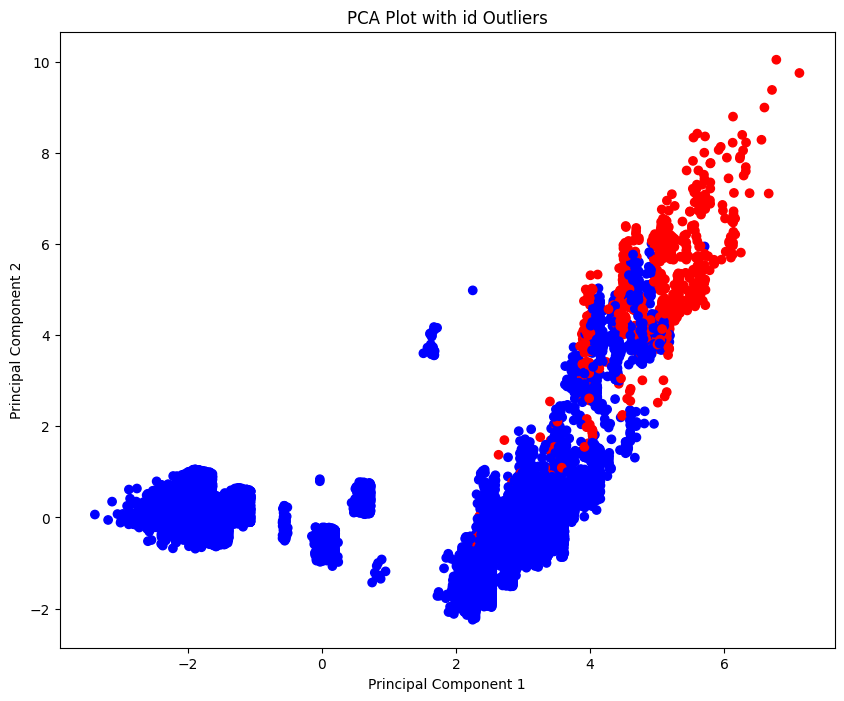

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


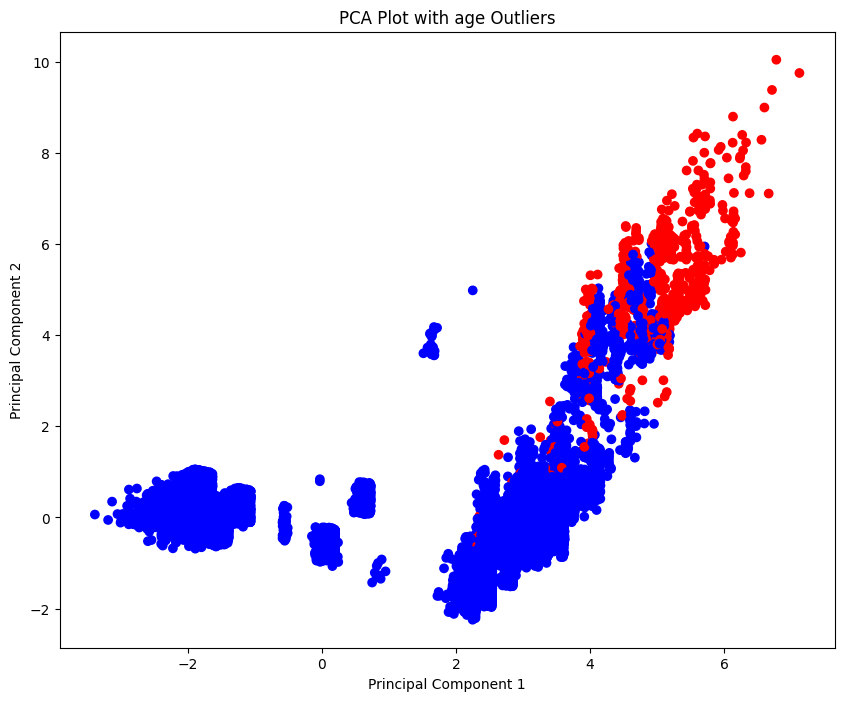

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


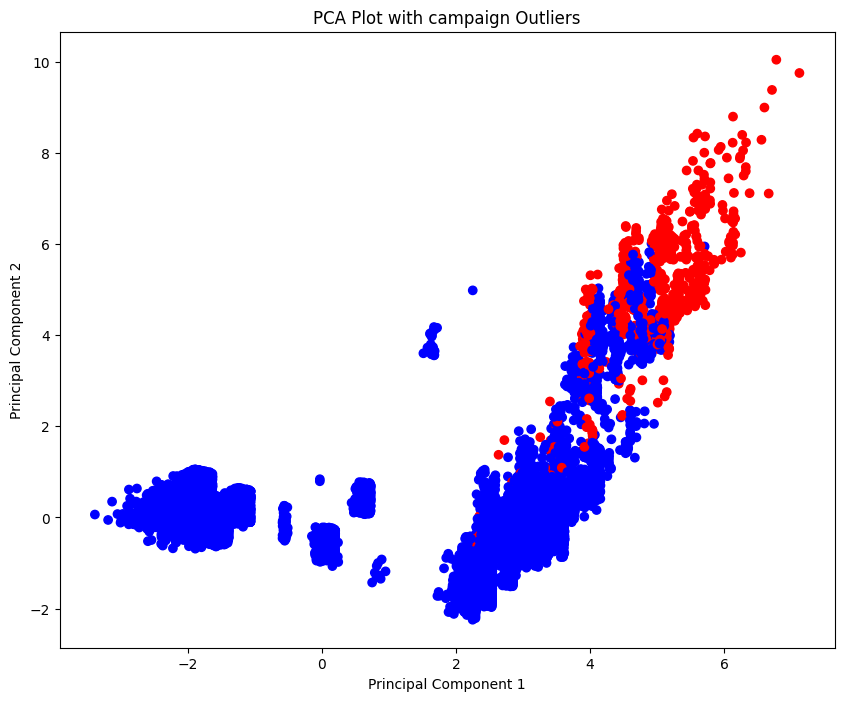

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


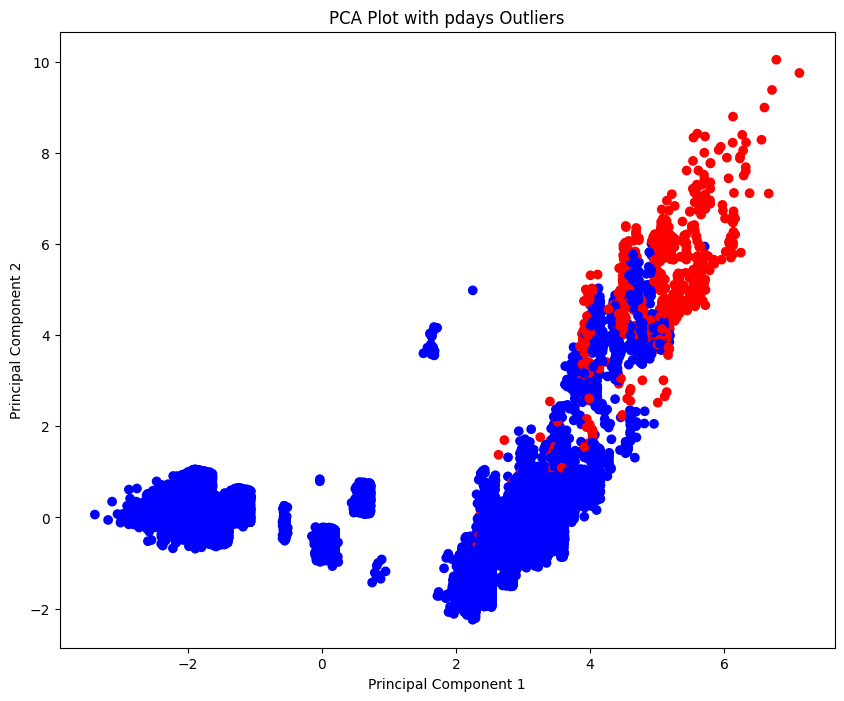

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


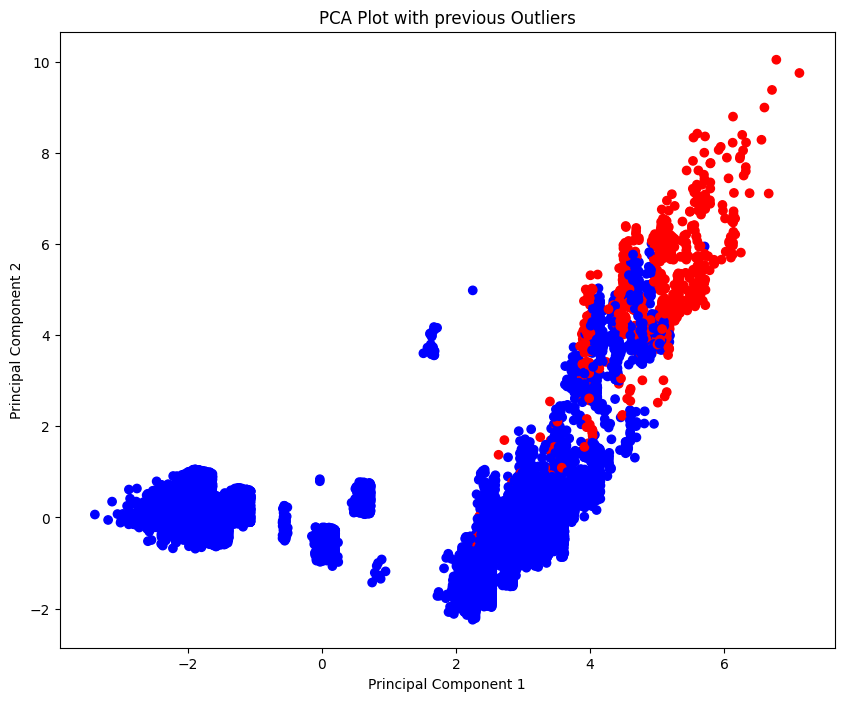

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


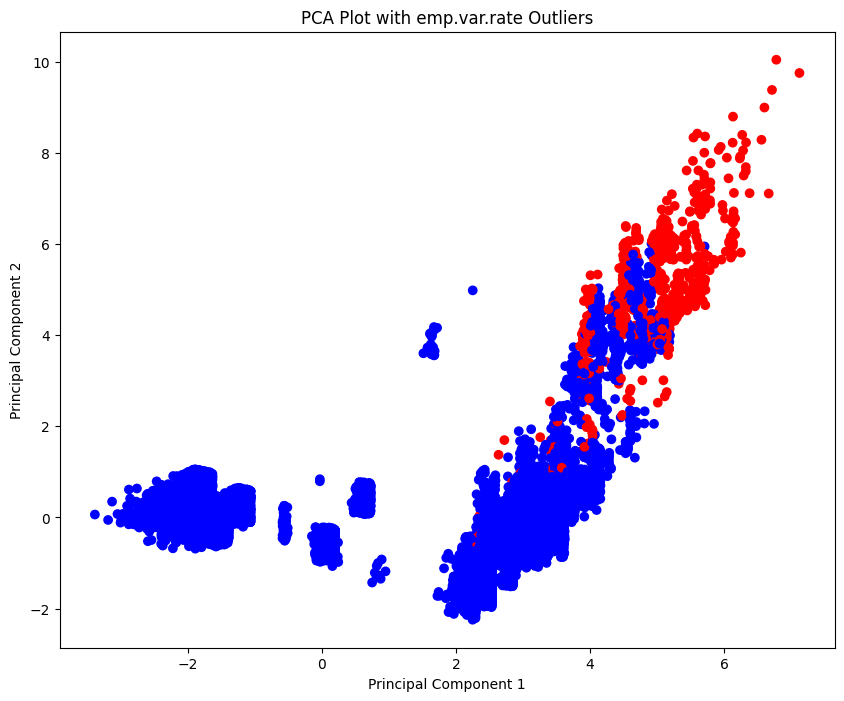

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


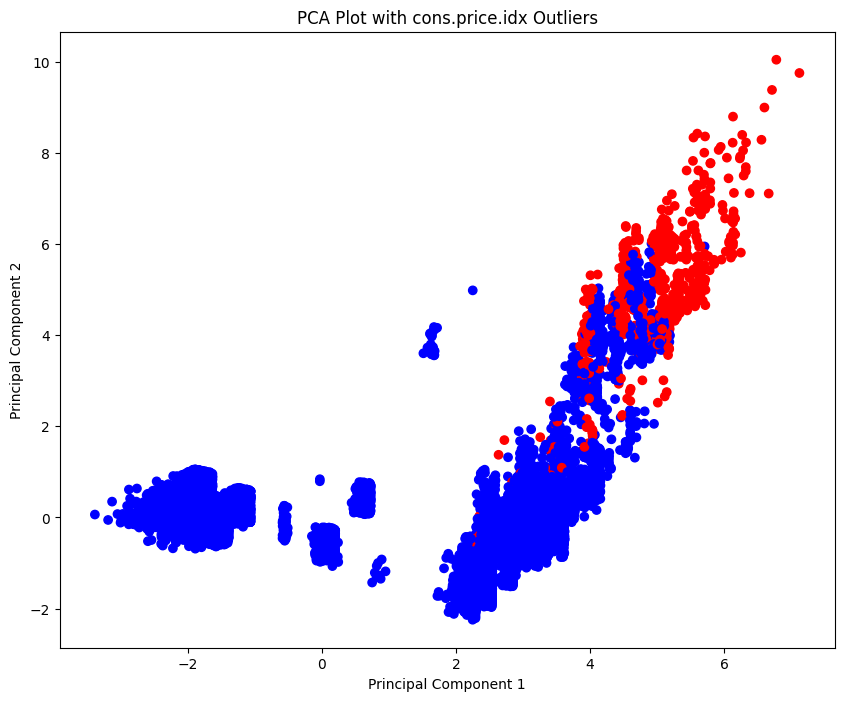

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


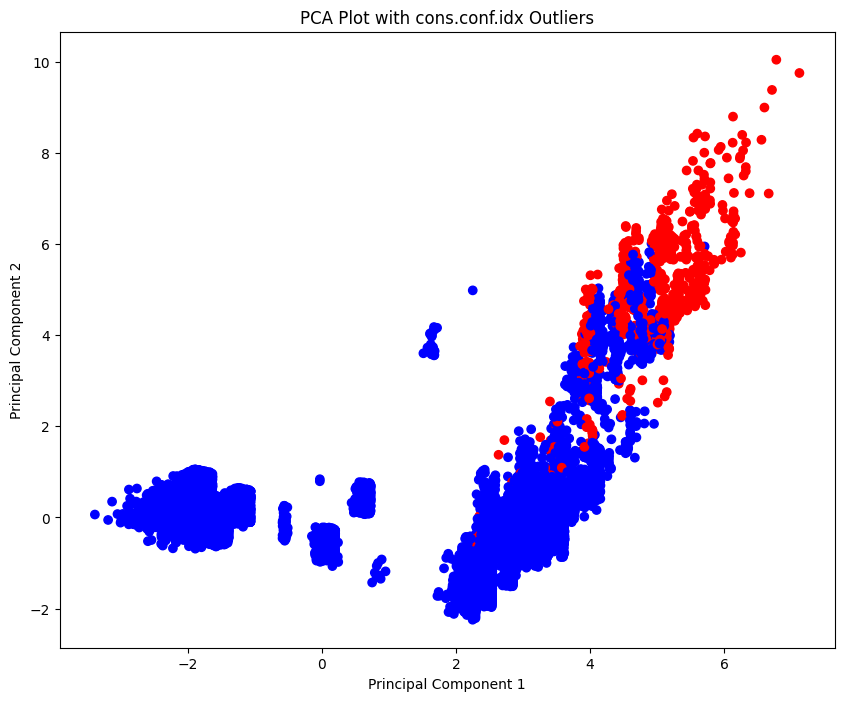

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


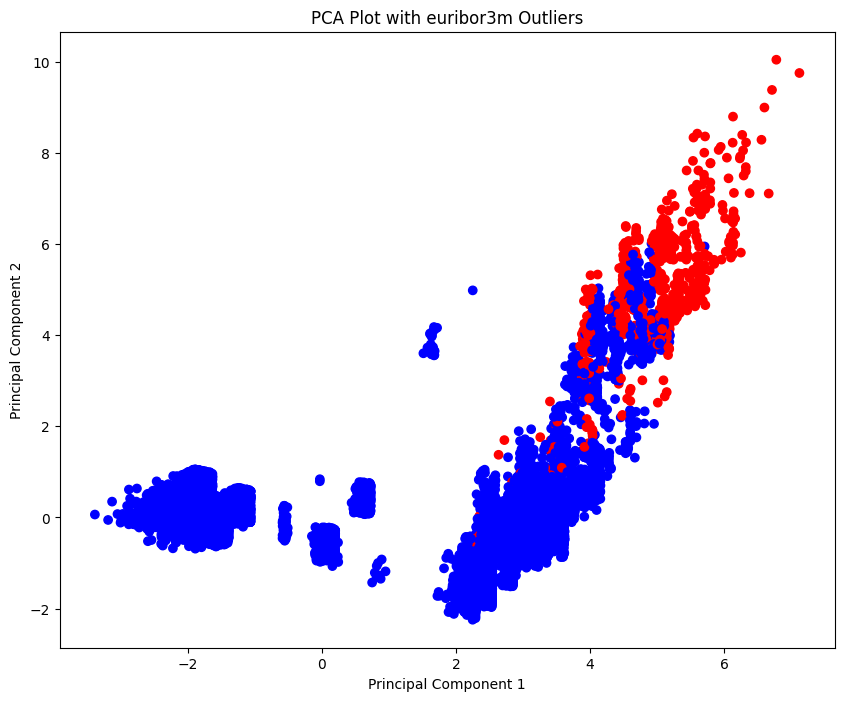

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


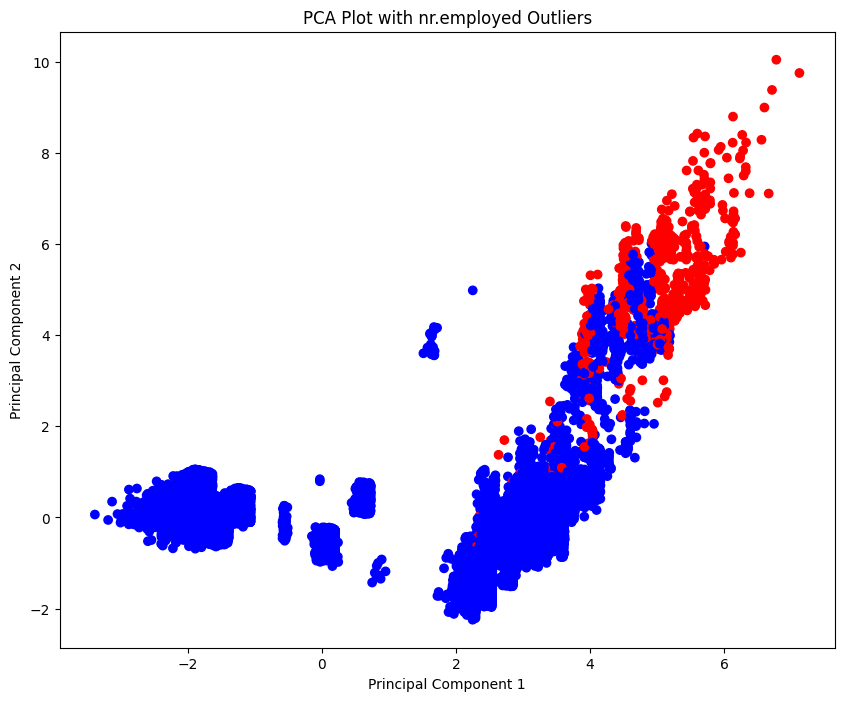

5-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


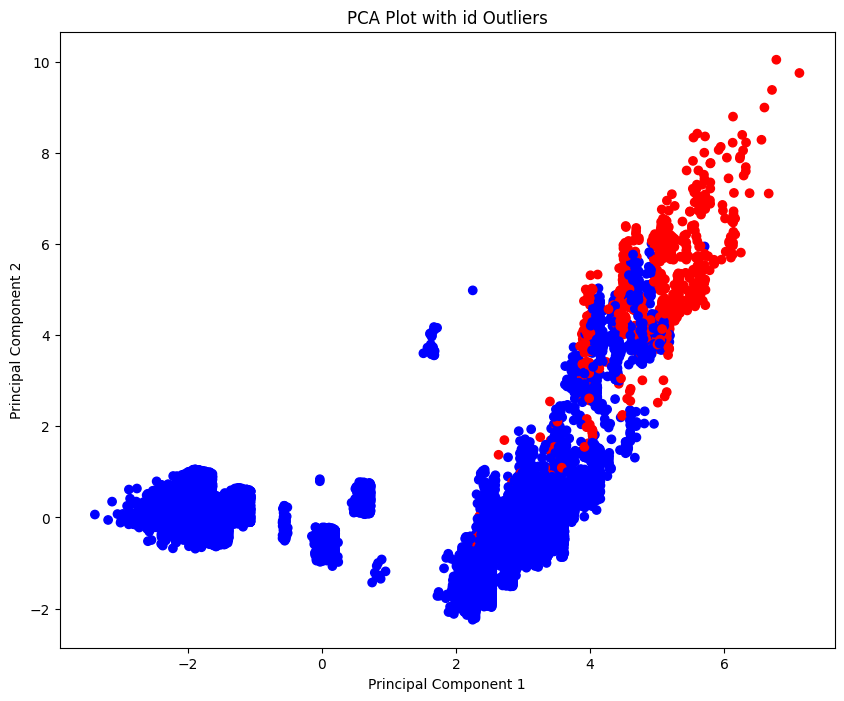

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


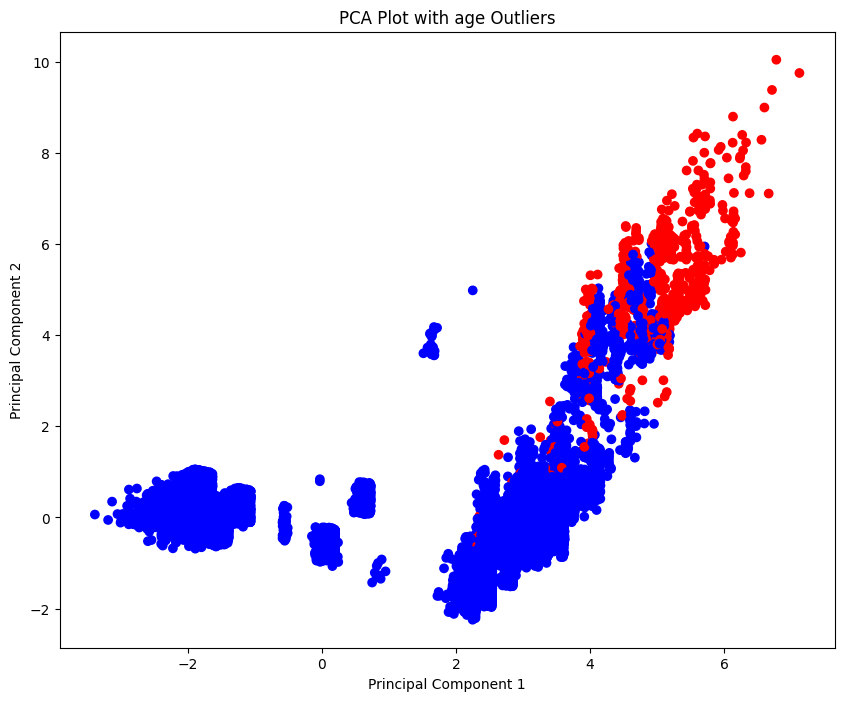

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


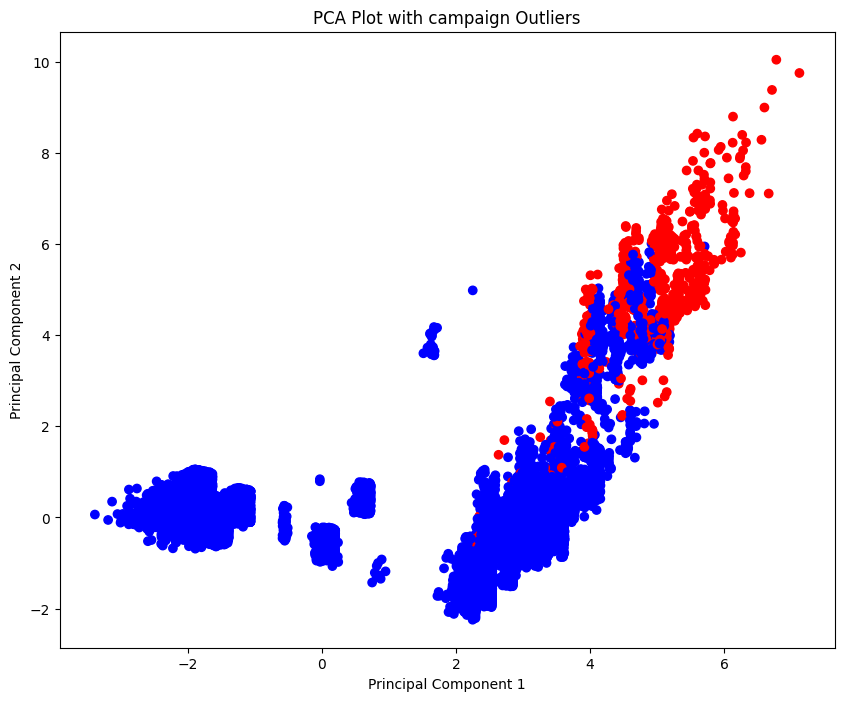

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


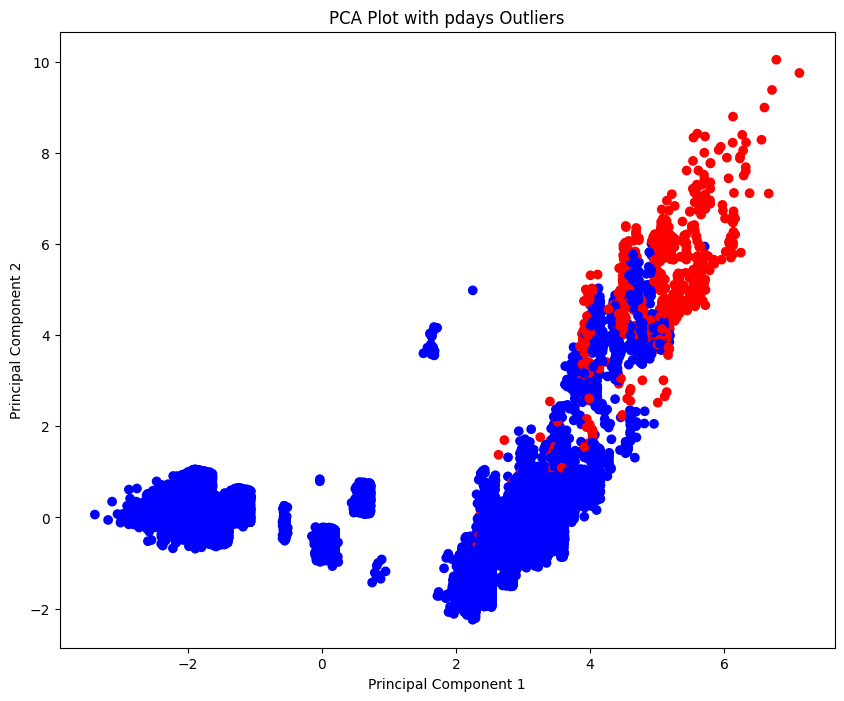

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


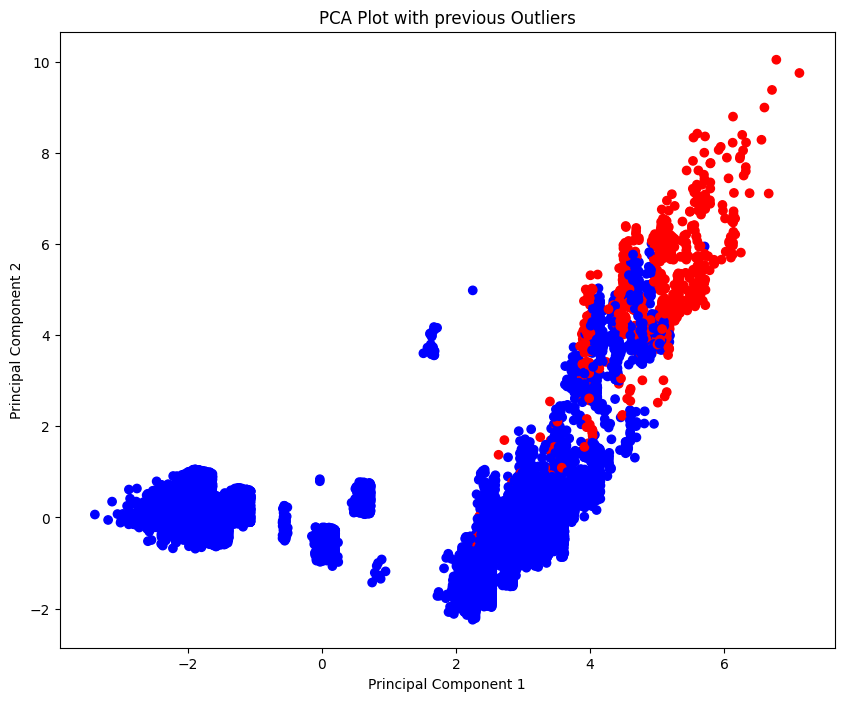

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


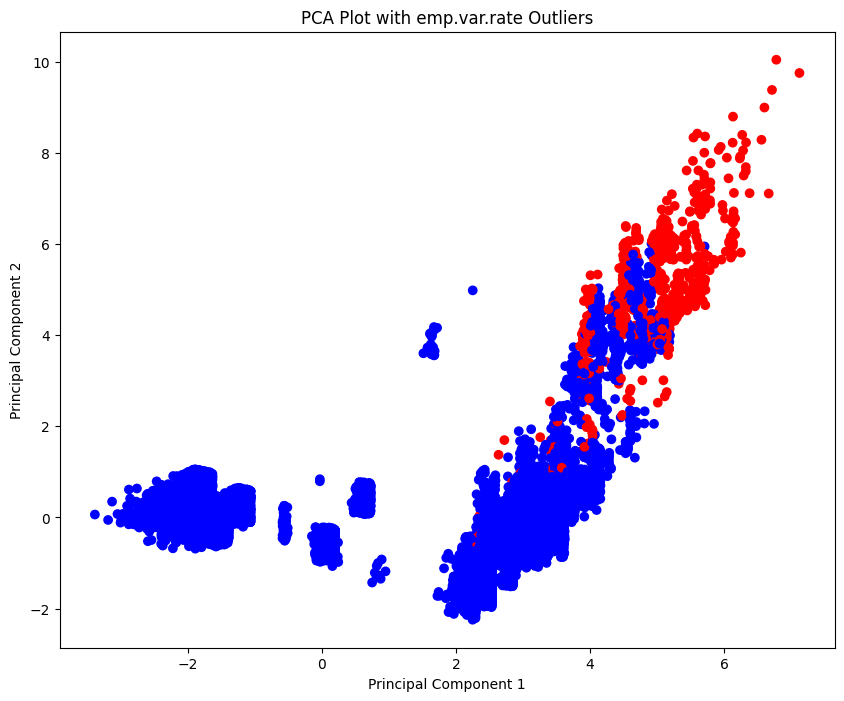

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


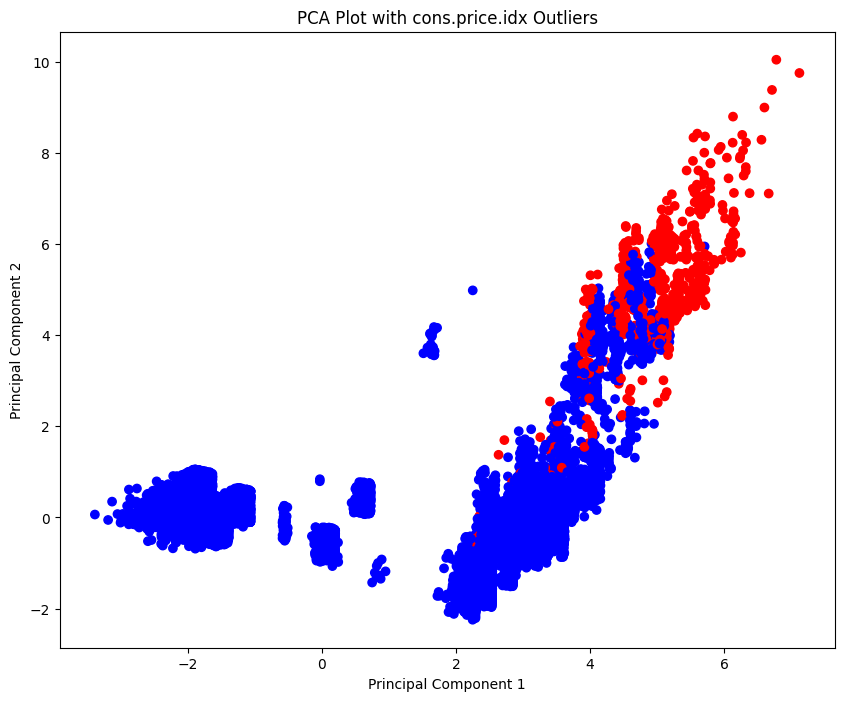

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


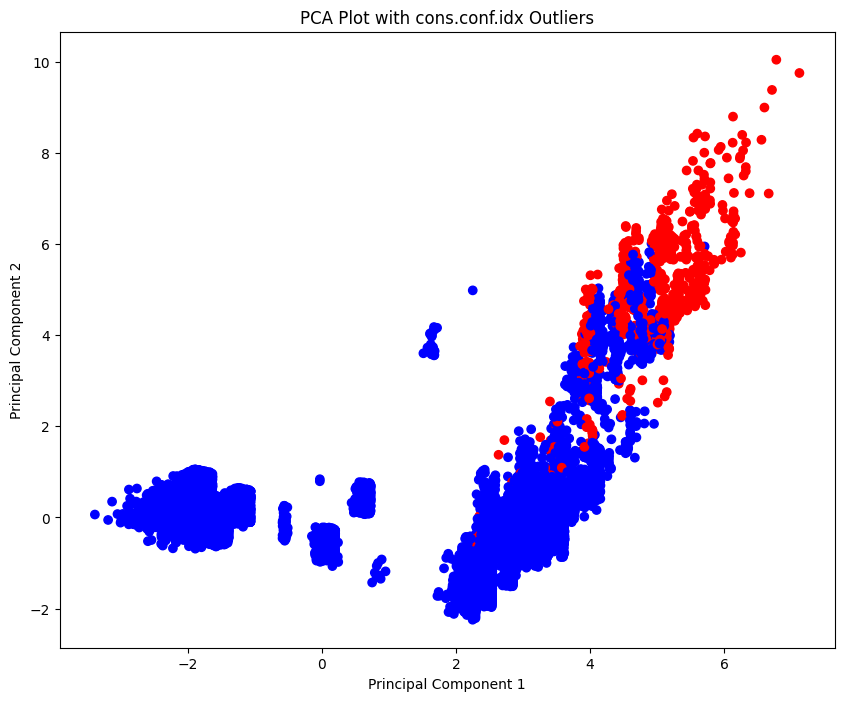

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


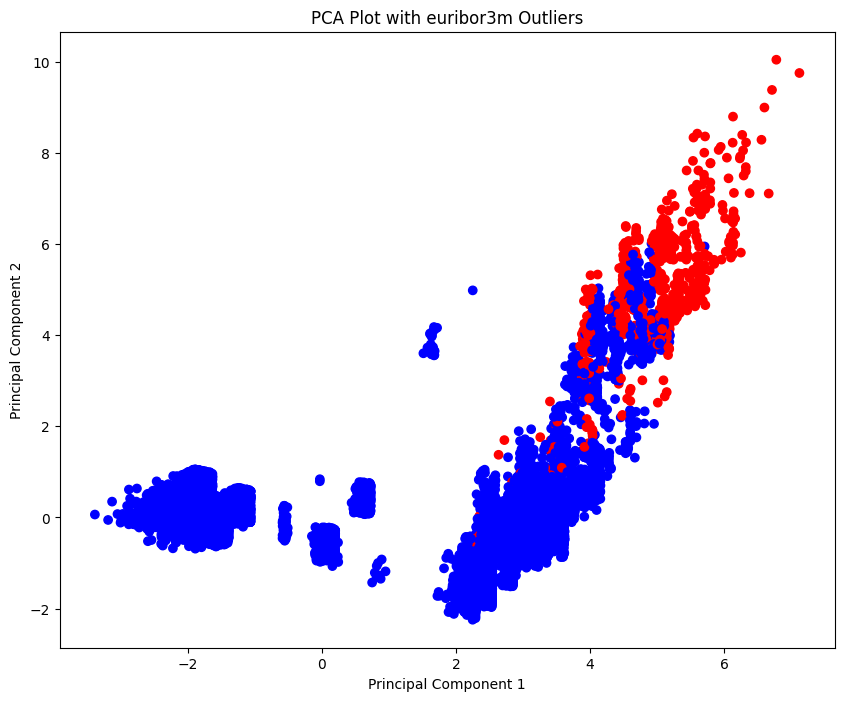

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


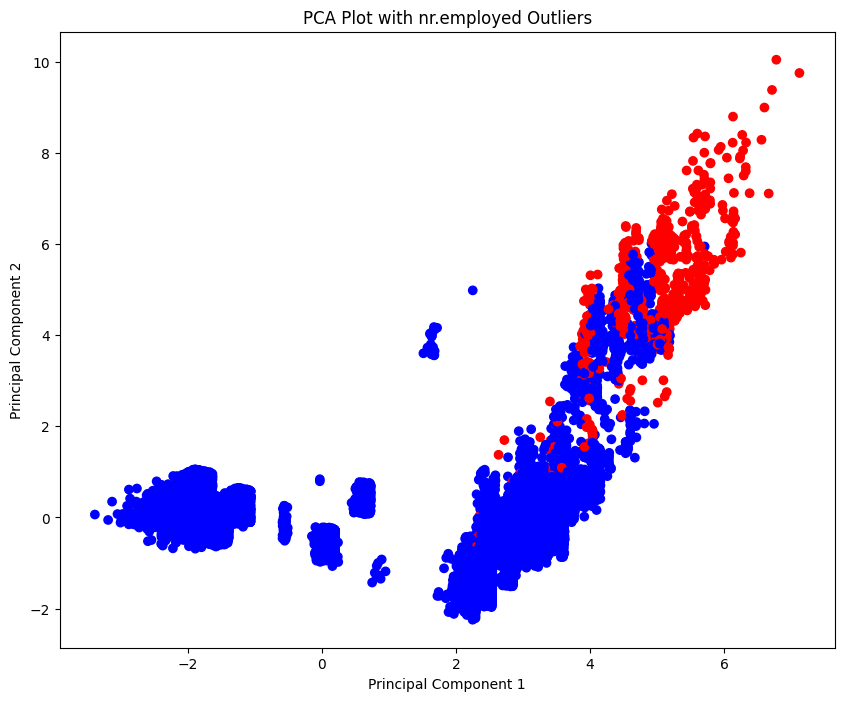

6-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


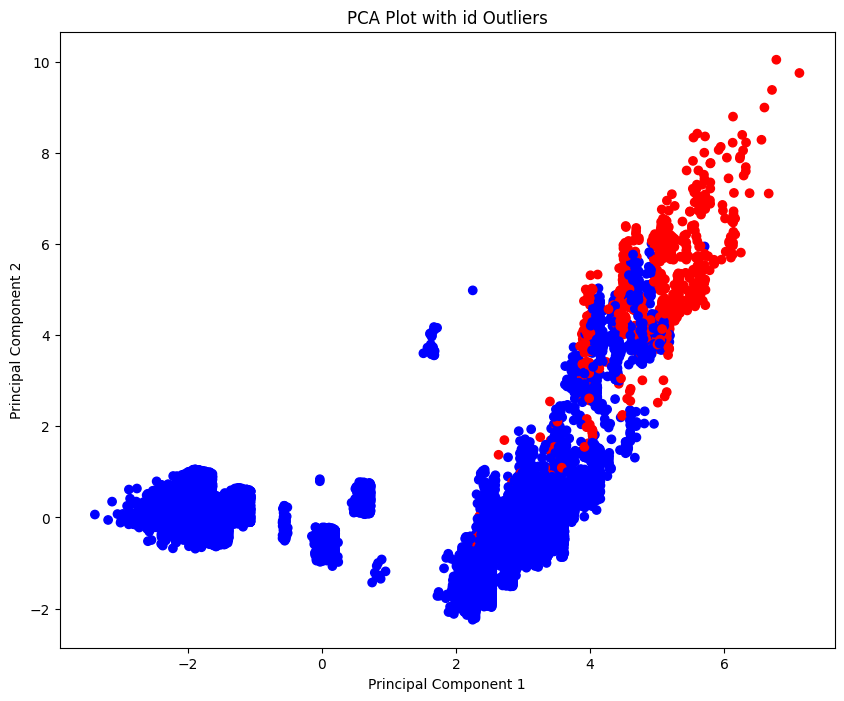

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


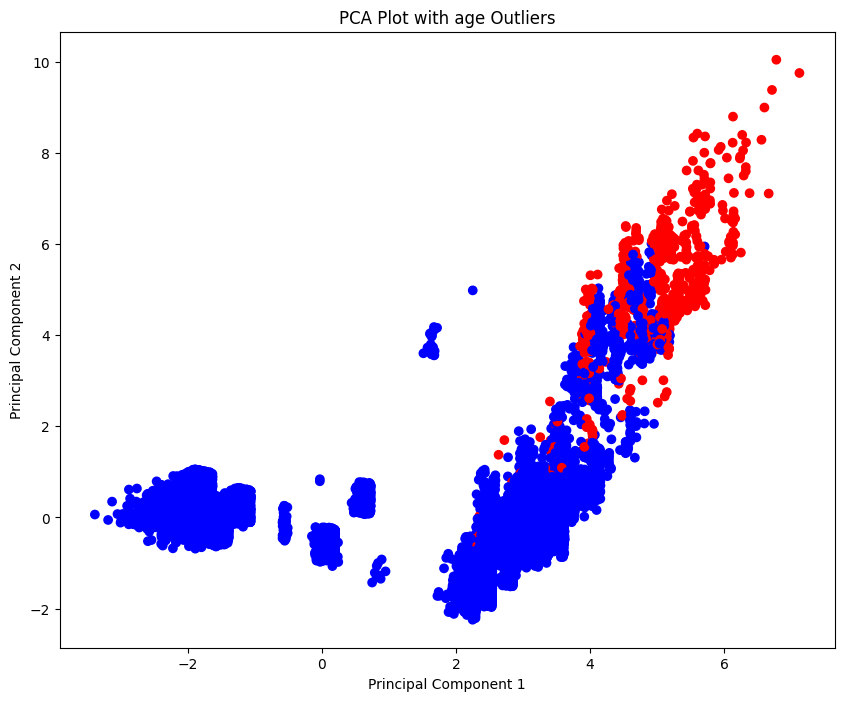

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


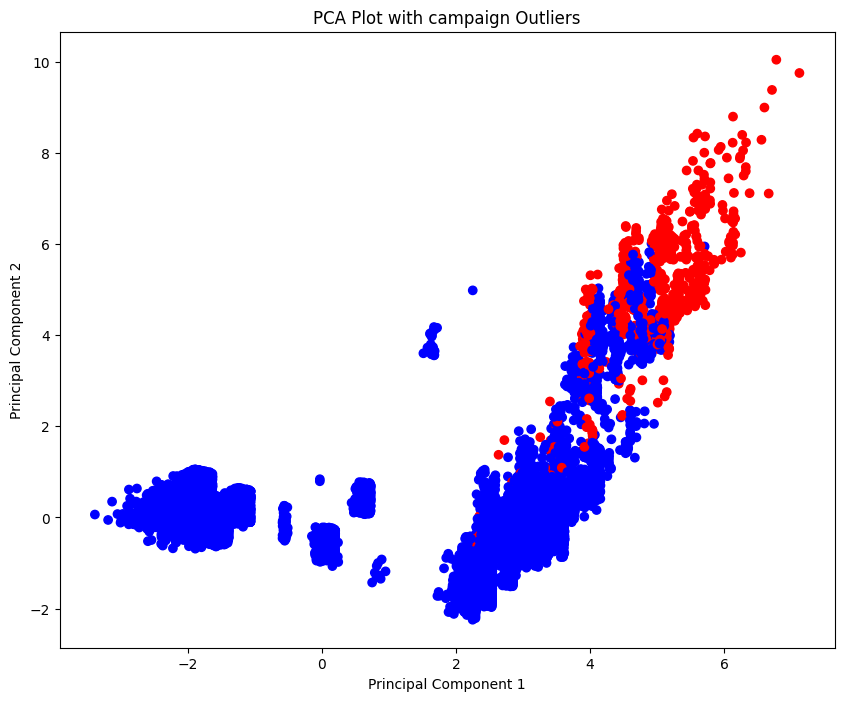

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


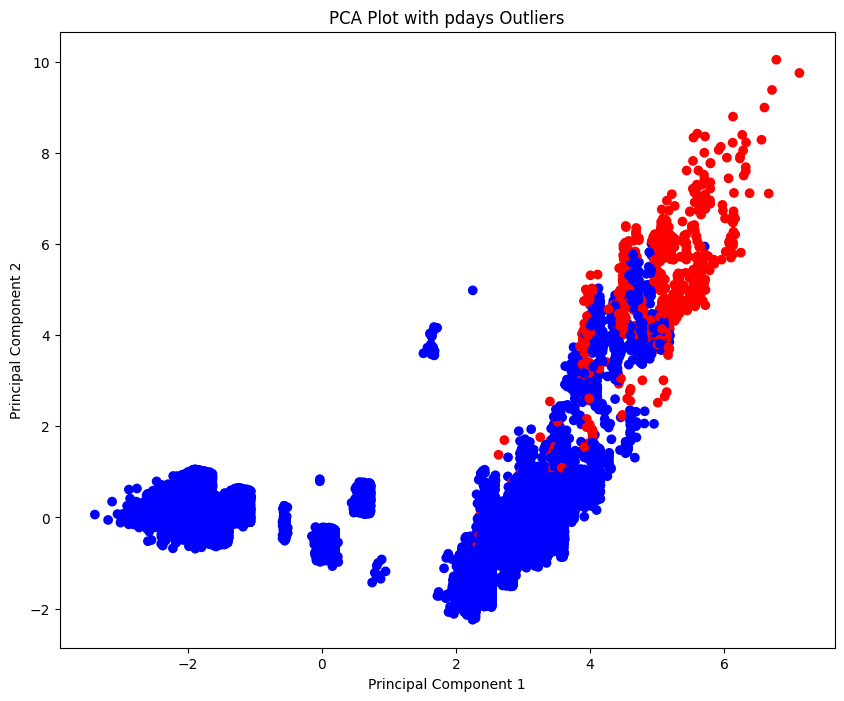

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


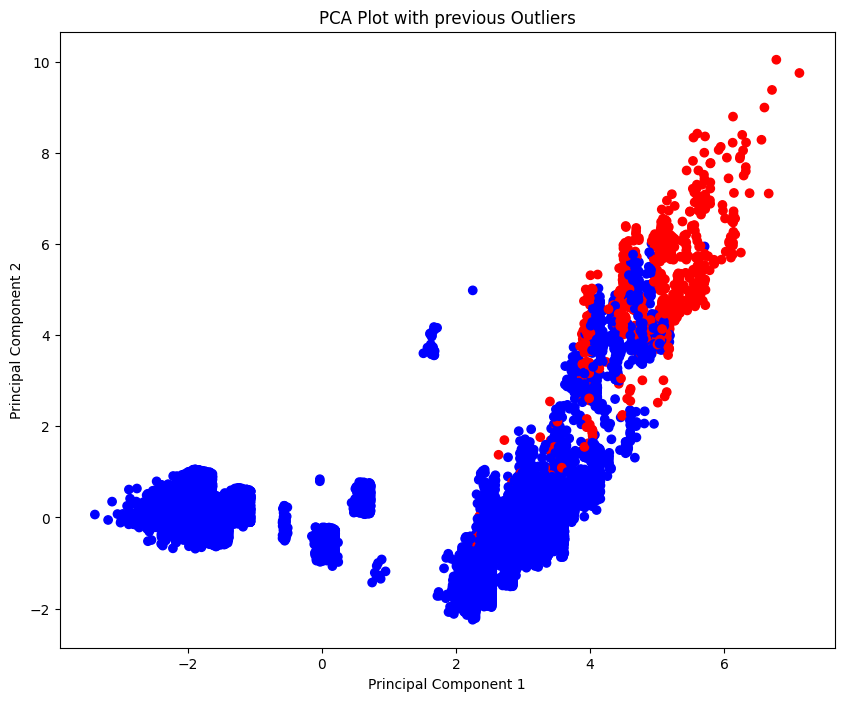

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


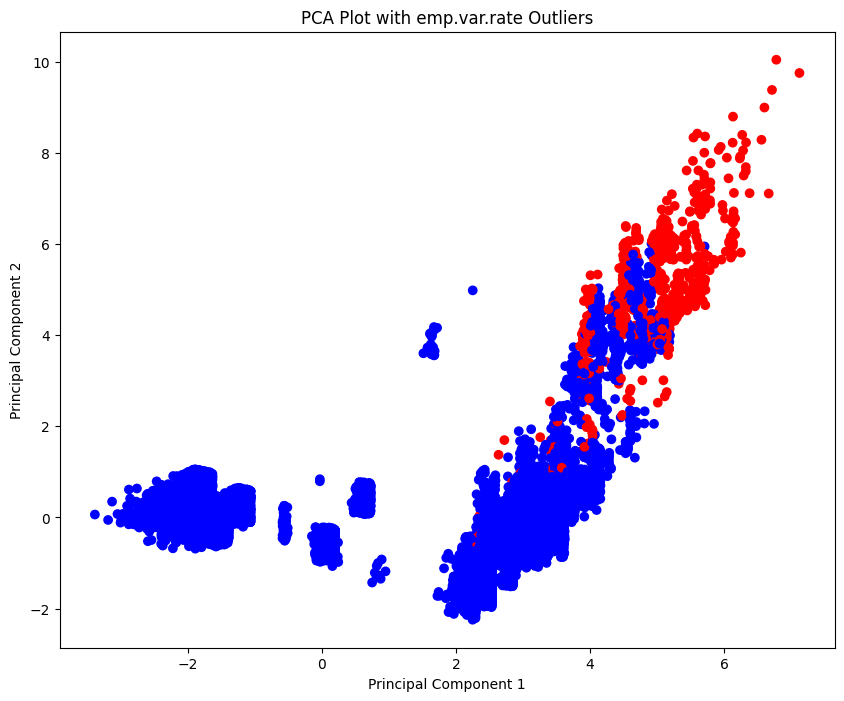

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


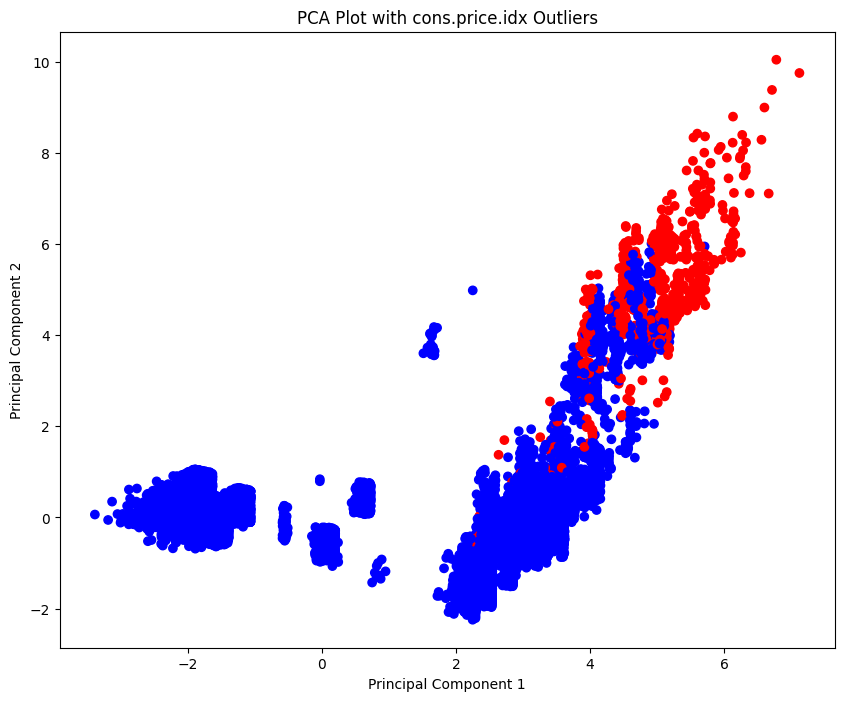

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


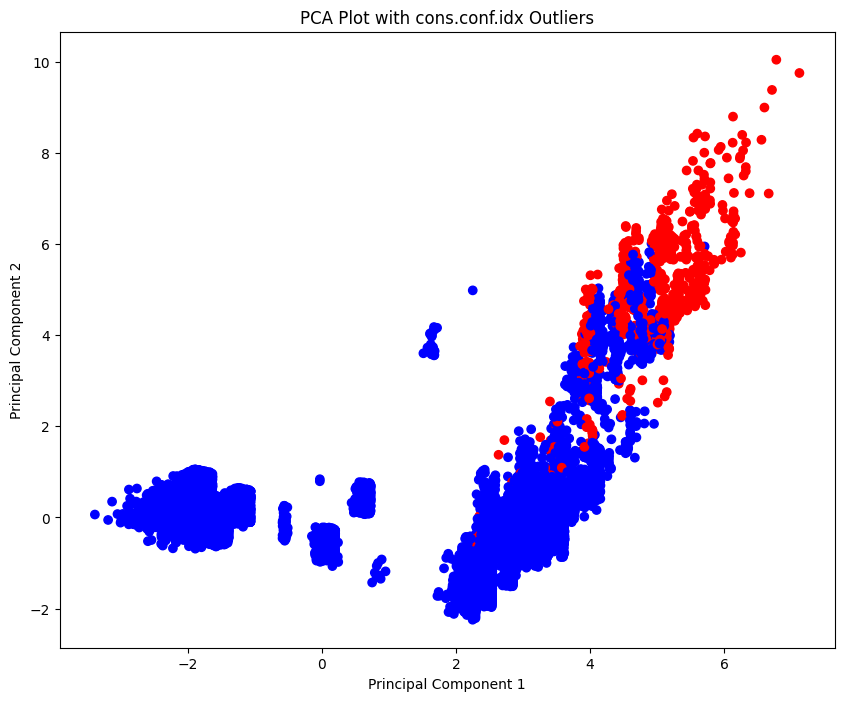

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


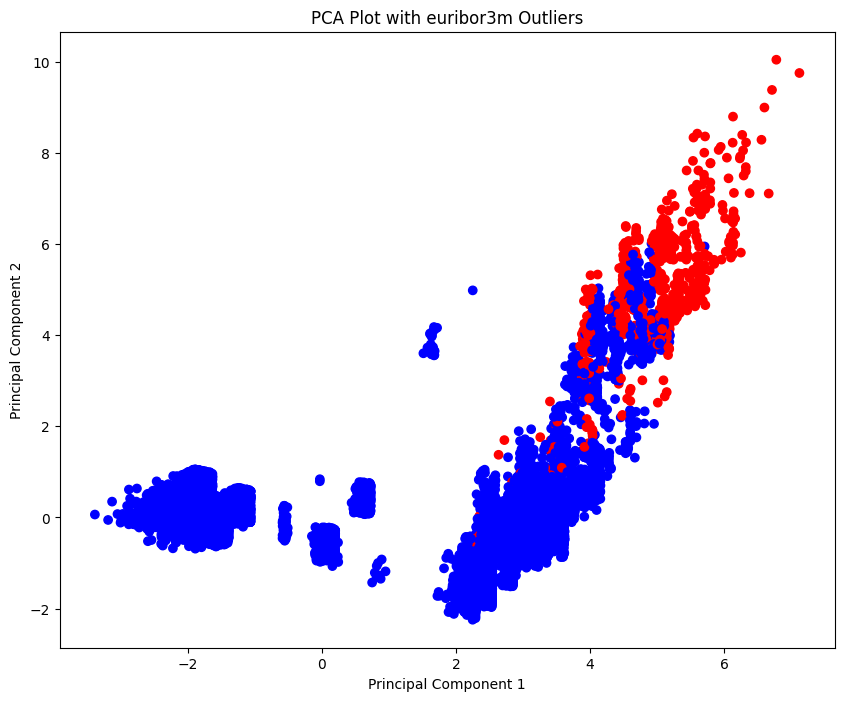

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 659


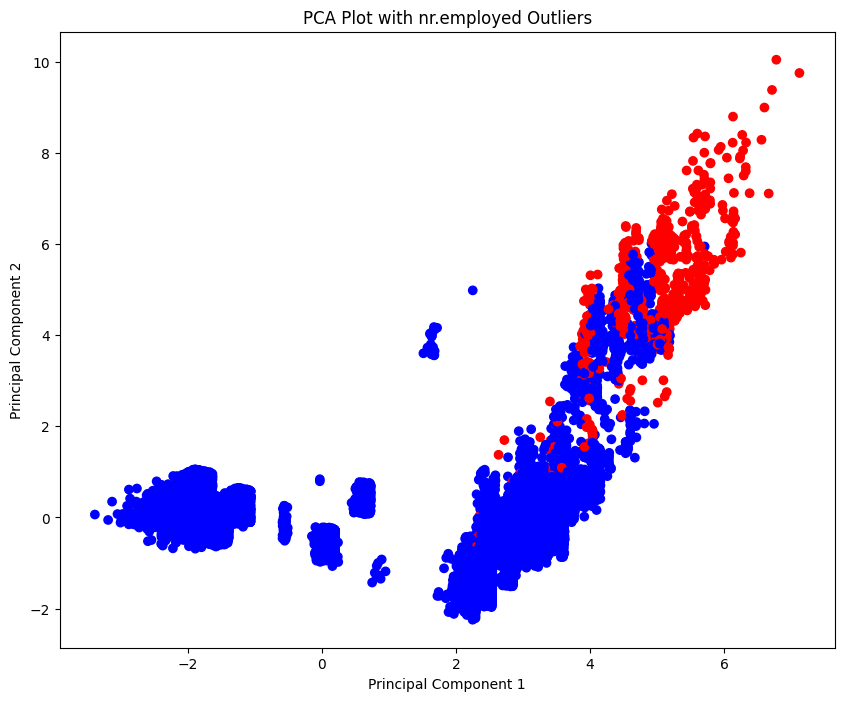

7-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


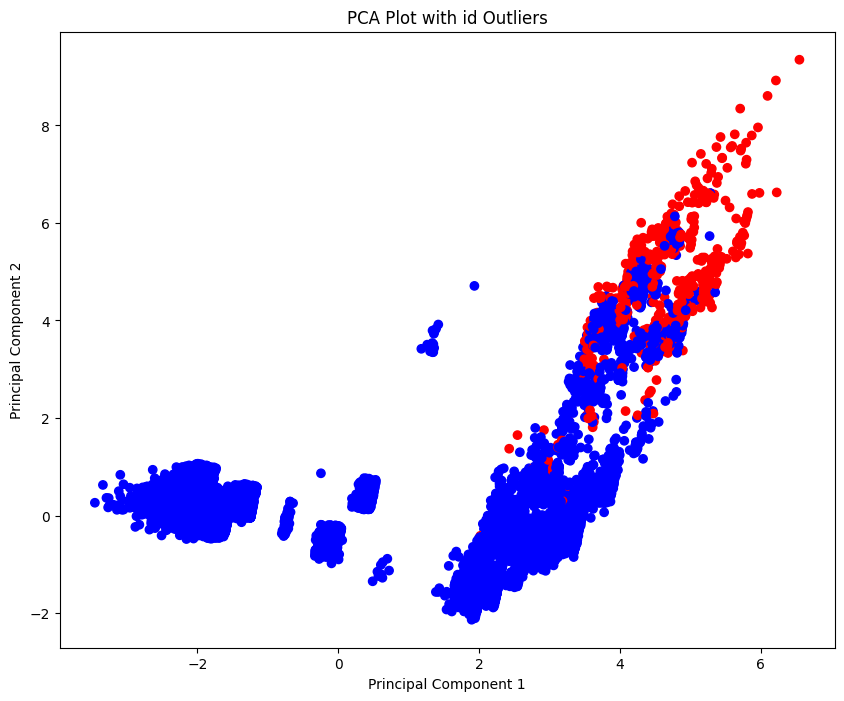

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


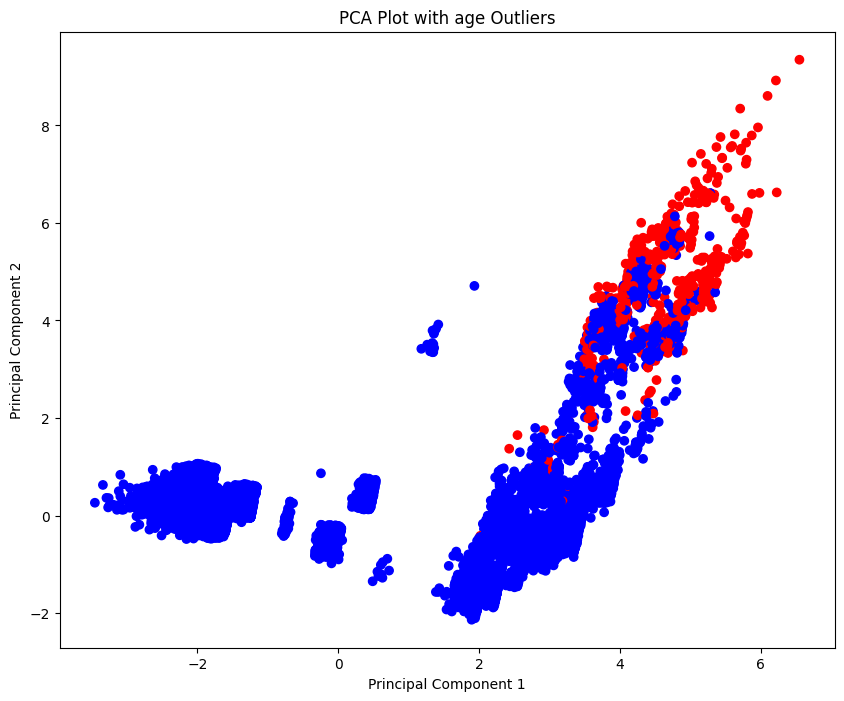

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


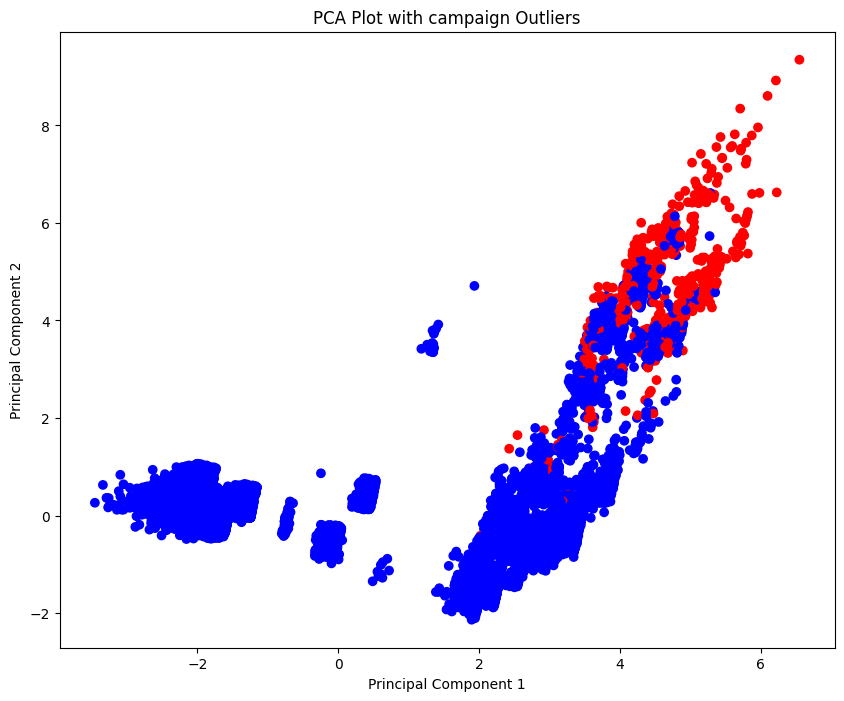

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


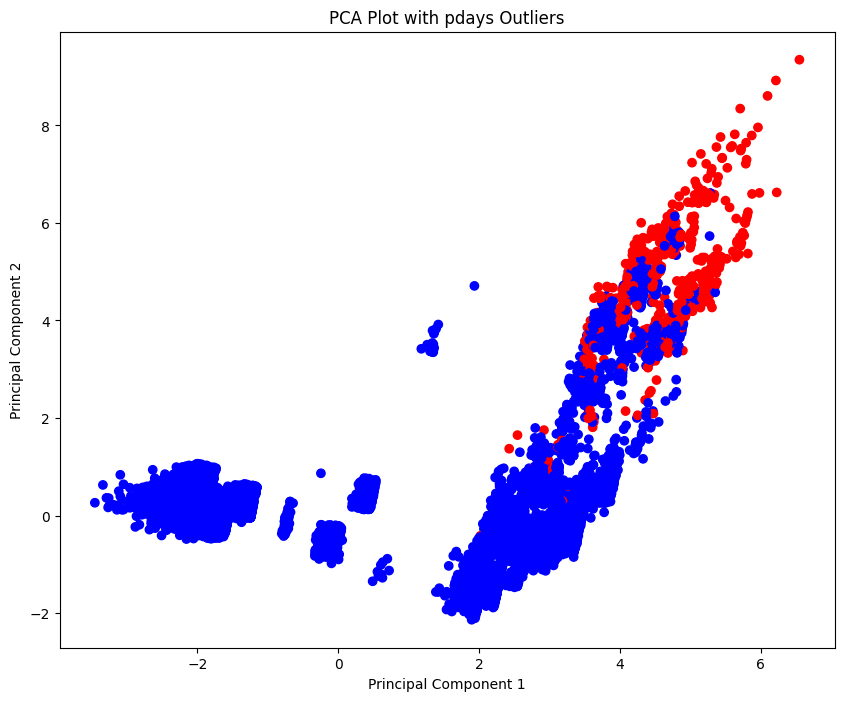

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


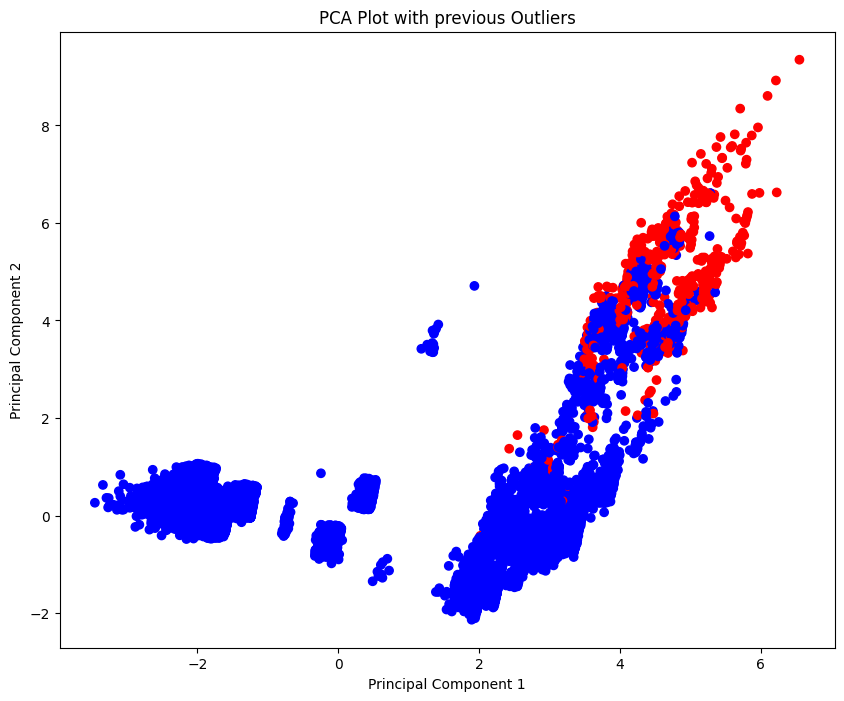

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


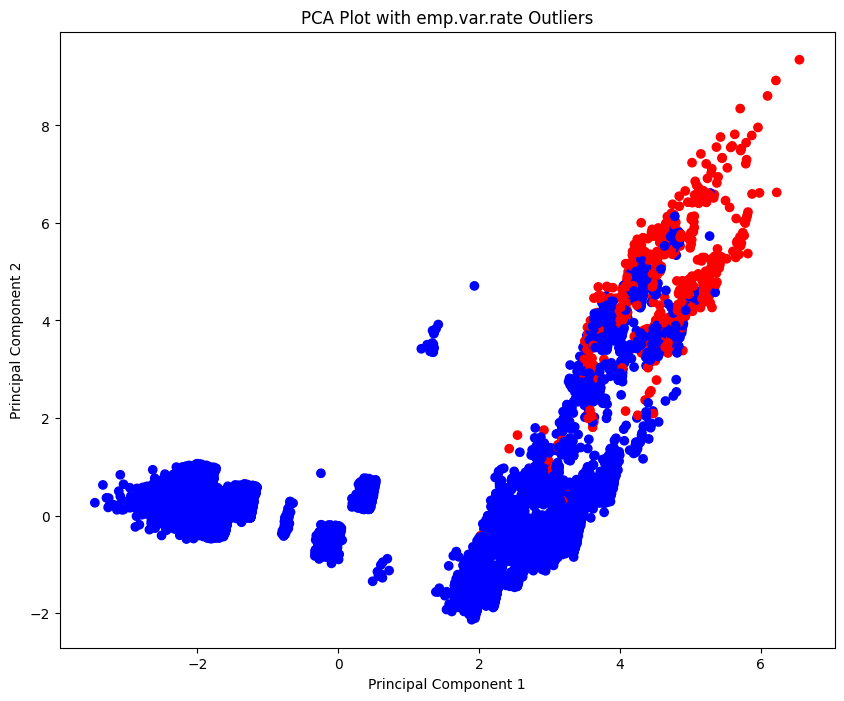

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


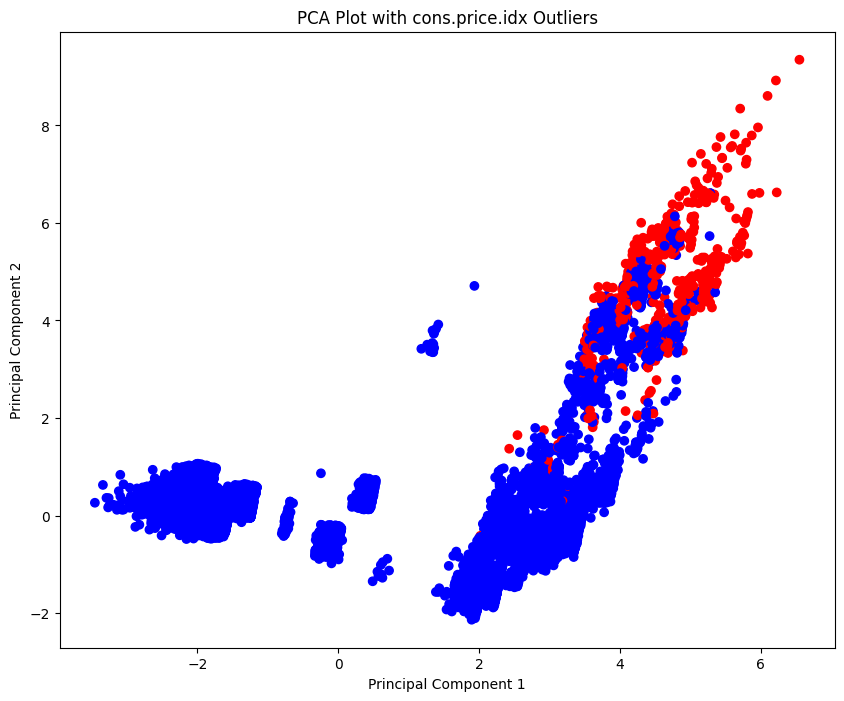

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


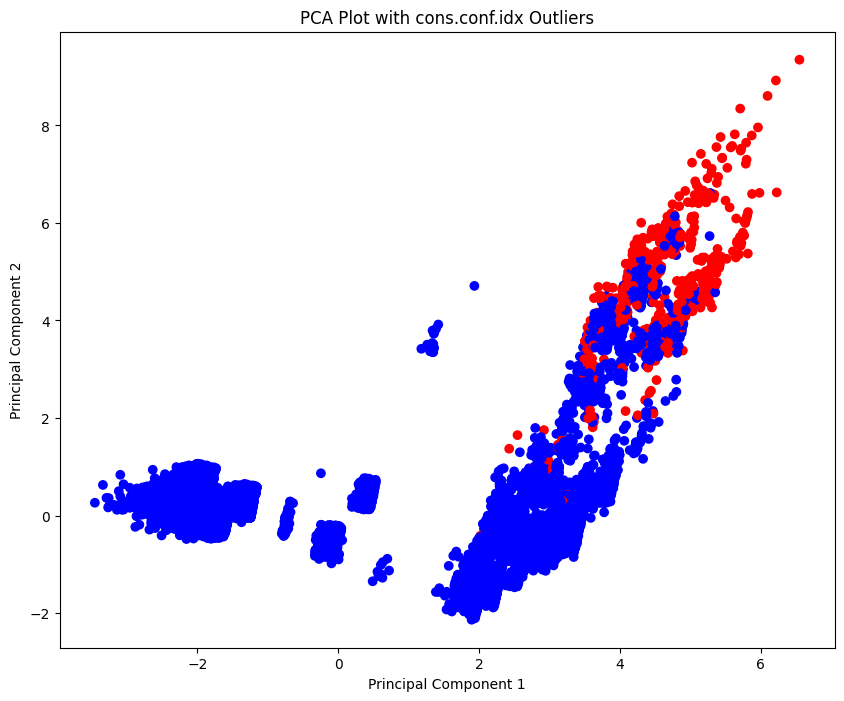

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


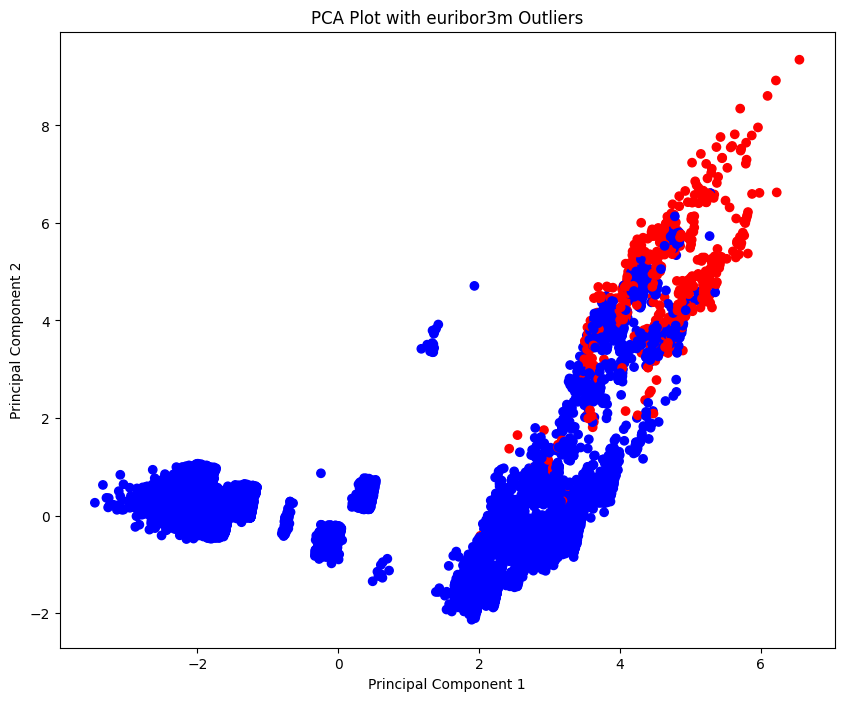

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 488


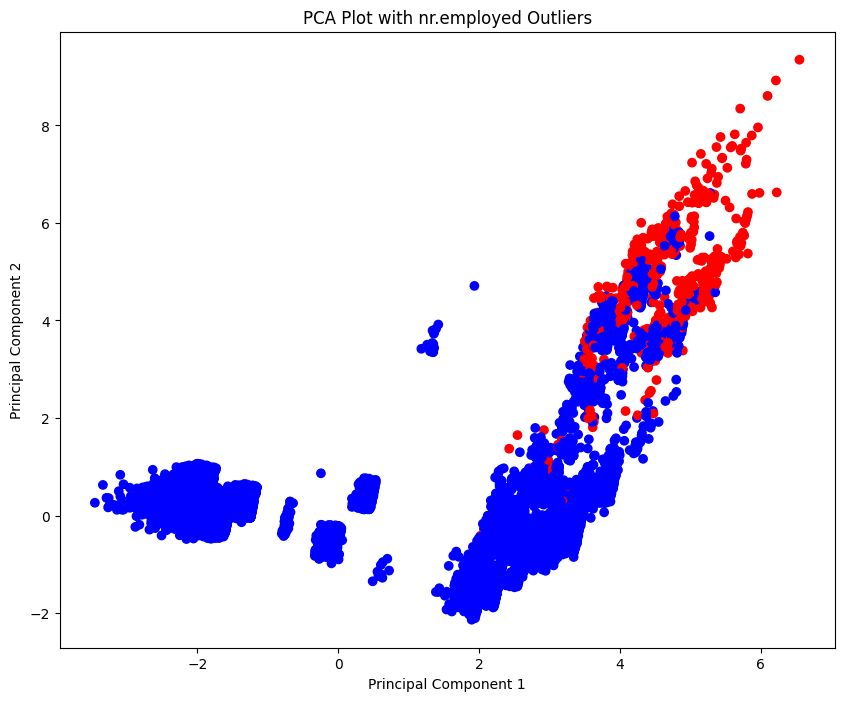

8-th df에 대한 이상치 확인


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


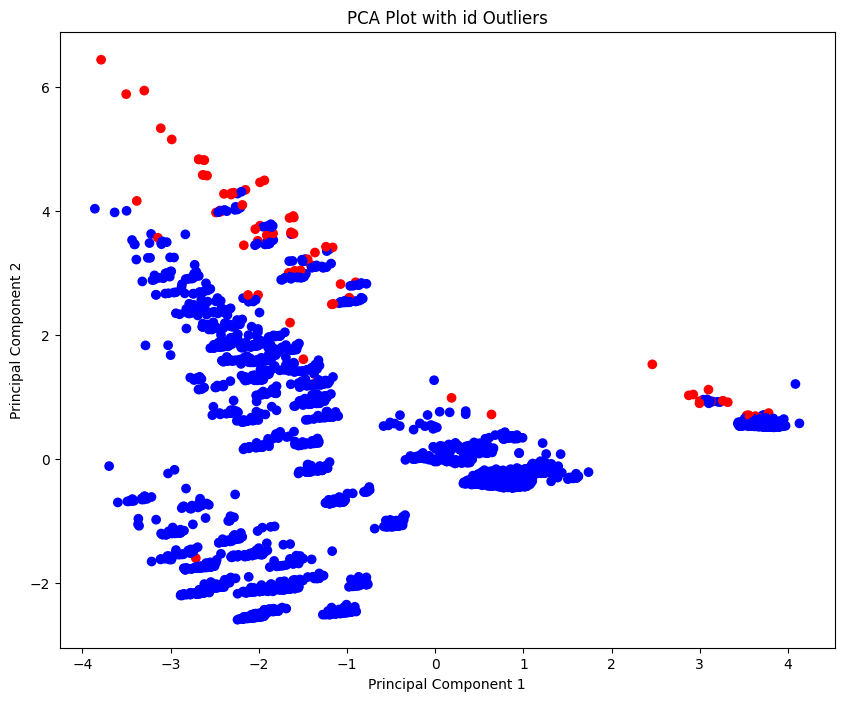

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


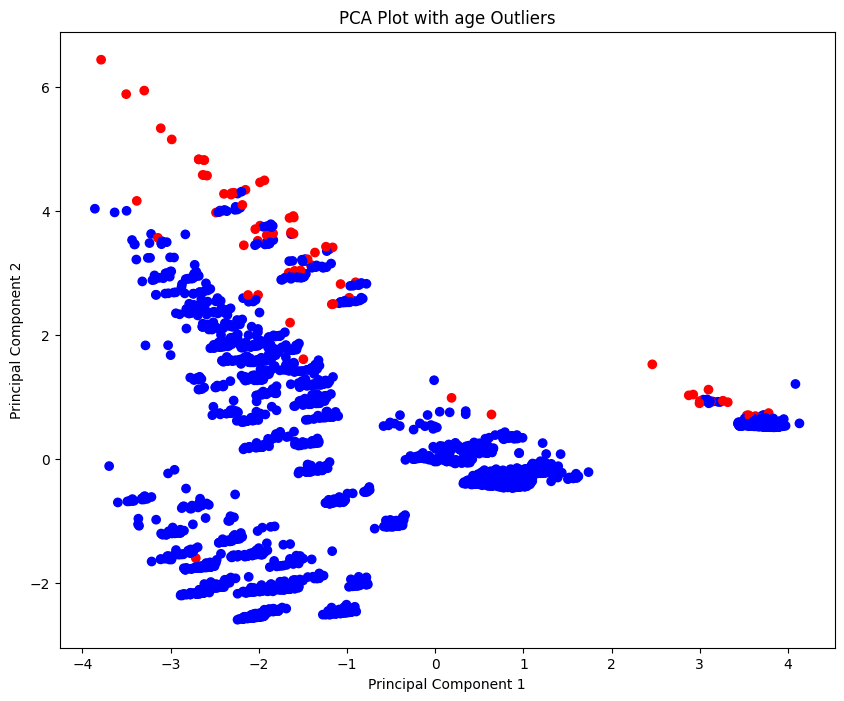

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


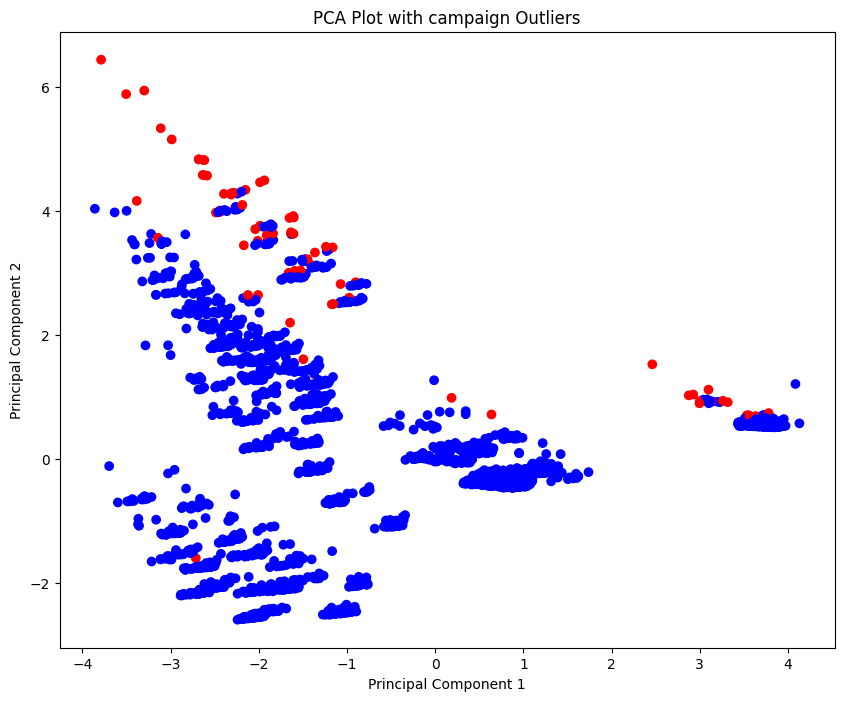

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


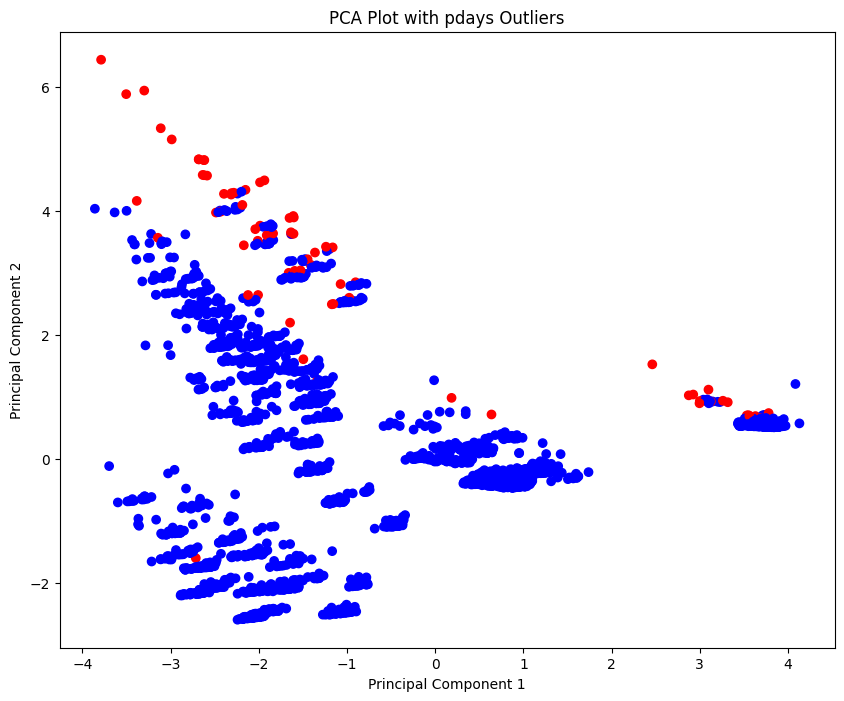

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


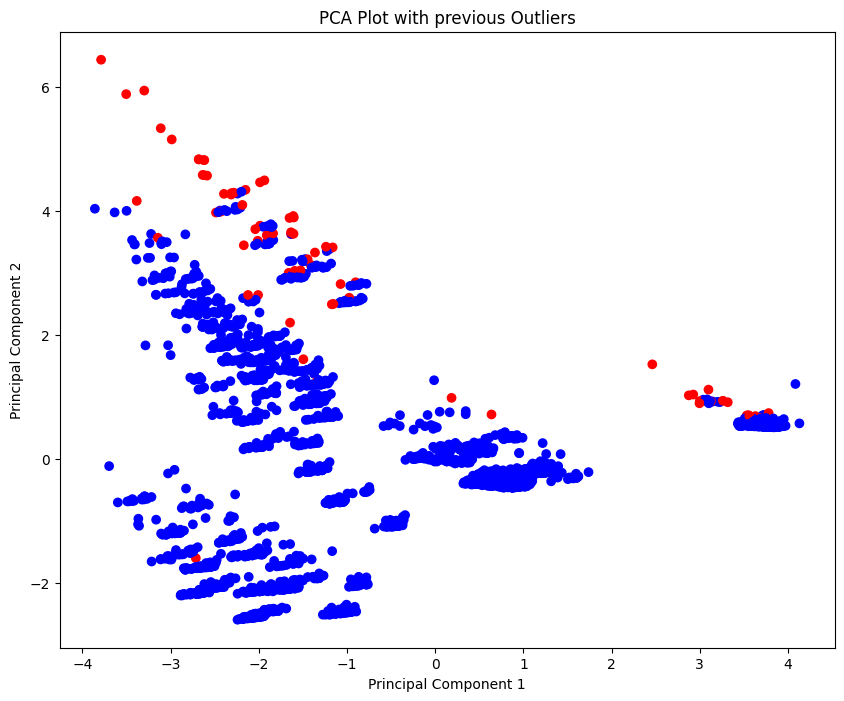

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


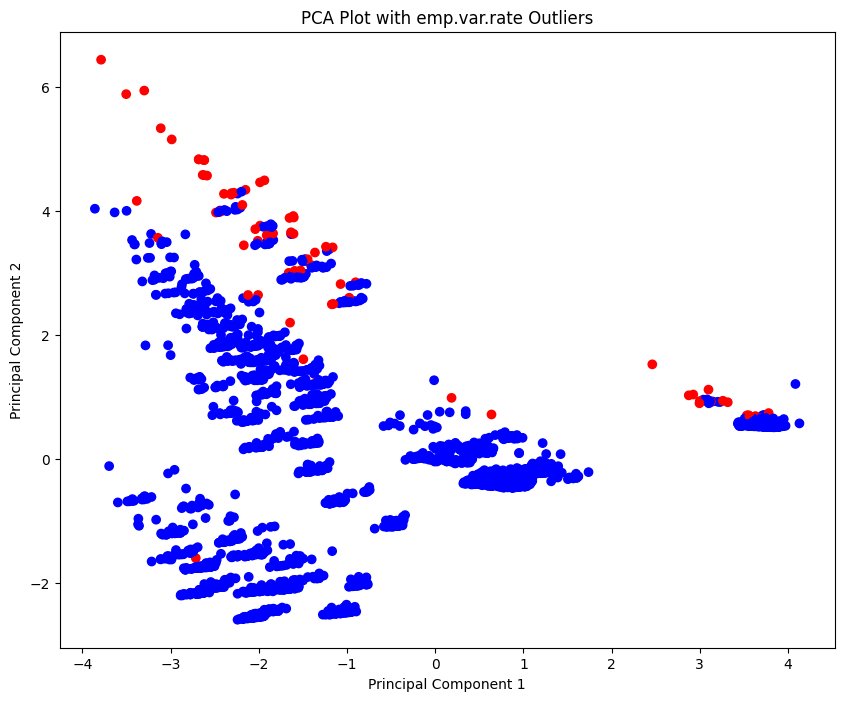

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


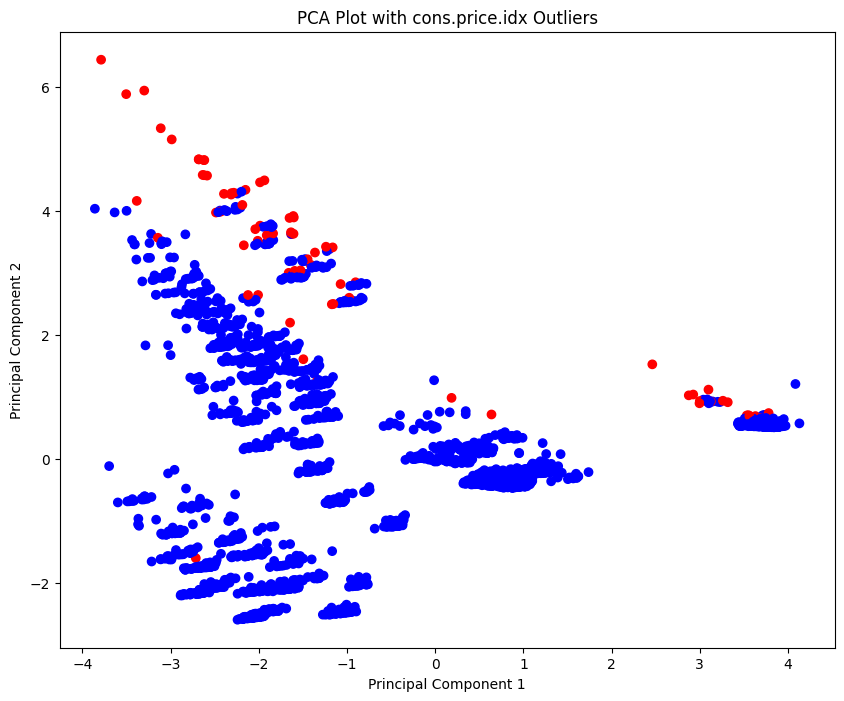

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


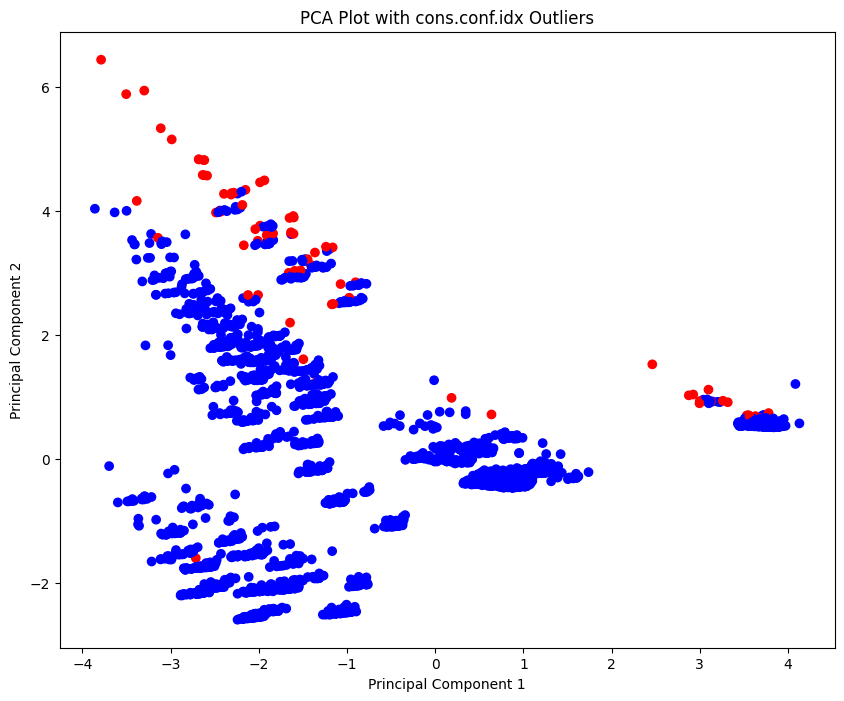

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


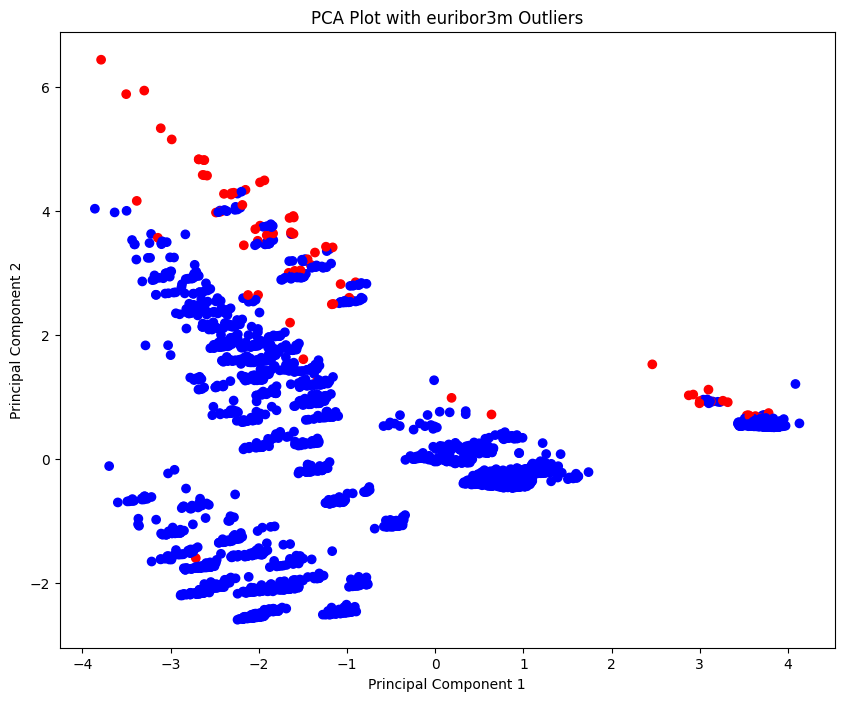

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


Outliers detected: 75


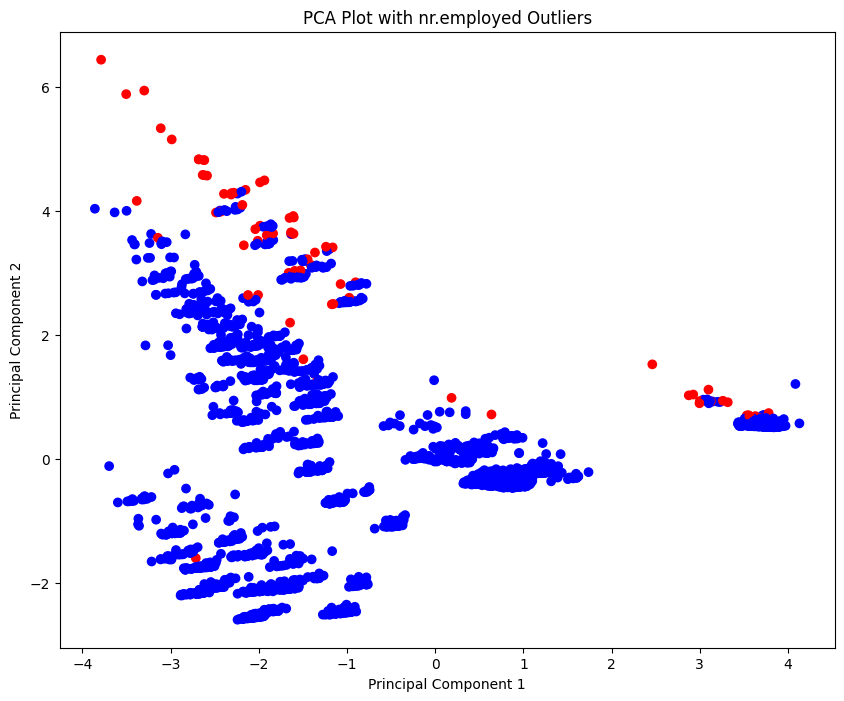

In [ ]:
from sklearn.ensemble import IsolationForest

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D

numeric_cols = ['id', 'age', 'campaign', 'pdays', 'previous',
                'emp.var.rate','cons.price.idx', 'cons.conf.idx',
                'euribor3m', 'nr.employed']

random_state = 100
iso_forest = IsolationForest(n_estimators=100, contamination=0.02, random_state=random_state)

scaler = StandardScaler()

for i in range(len(imputed_group)):
  print(f'{i}-th df에 대한 이상치 확인')

  df_outlier = imputed_group[i].copy()
  for col in df.columns:
    if df_outlier[col].dtype == 'int64' or df_outlier[col].dtype == 'float64':
      outliers = iso_forest.fit_predict(df_outlier[numeric_cols])
      print("Outliers detected:", np.sum(outliers == -1))
      df_outlier['outlier'] = outliers

      X_scaled = scaler.fit_transform(df_outlier[numeric_cols])

      pca = PCA(n_components=2)
      X_pca = pca.fit_transform(X_scaled)

      fig = plt.figure(figsize=(10, 8))

      colors = {1: 'blue', -1: 'red'}
      marker_colors = [colors[label] for label in df_outlier['outlier']]

      plt.scatter(X_pca[:, 0], X_pca[:, 1], c=marker_colors, marker='o')
      plt.xlabel('Principal Component 1')
      plt.ylabel('Principal Component 2')
      plt.title(f'PCA Plot with {col} Outliers')
      plt.show()

## 3. 이상치 처리

In [ ]:
def remove_outliers(df, col):
  # IQR
  Q1=df[col].quantile(0.25)
  Q3=df[col].quantile(0.75)
  IQR=Q3-Q1

  lb = Q1-1.5*IQR
  ub=Q3+1.5*IQR

  # Find Outlier
  outliers_idx = []
  outliers_idx.extend(df[(df[col] < lb) | (df[col] > ub)].index)
  len(outliers_idx)

  # Remove
  df.drop(outliers_idx, inplace=True)

In [ ]:
outlier_group = []

# 수치형
numeric_cols = ['id', 'age', 'campaign', 'pdays', 'previous',
                'emp.var.rate','cons.price.idx', 'cons.conf.idx',
                'euribor3m', 'nr.employed']

# 이상치 처리할만한 컬럼
cols = ['age', 'campaign', 'pdays', 'previous',
                'emp.var.rate','cons.price.idx', 'cons.conf.idx',
                'euribor3m', 'nr.employed']

for i in range(len(imputed_group)):
  print(f'{i}-th df에 대한 이상치 처리')
  df = imputed_group[i].copy()
  outlier_group.append(df)
#  for col in df.columns:
#    if imputed_group[i][col].dtype == 'int64' or imputed_group[i][col].dtype == 'float64':
  for col in cols:
      remove_outliers(df, col)


0-th df에 대한 이상치 처리
1-th df에 대한 이상치 처리
2-th df에 대한 이상치 처리
3-th df에 대한 이상치 처리
4-th df에 대한 이상치 처리
5-th df에 대한 이상치 처리


0-th df에 대한 이상치 확인


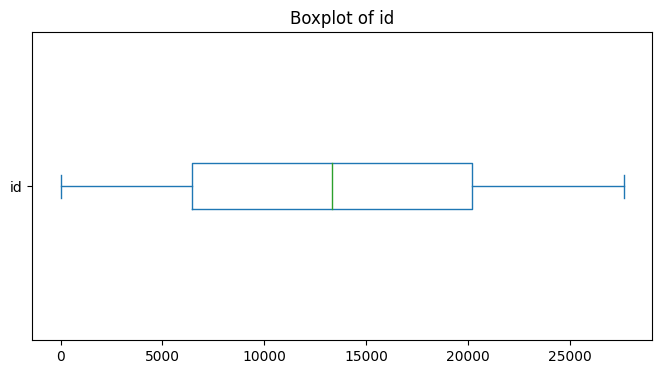

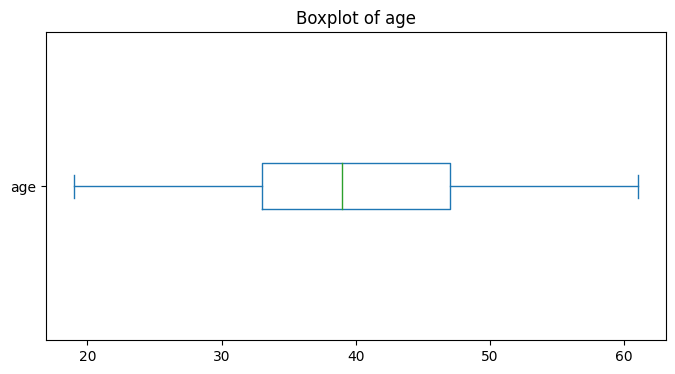

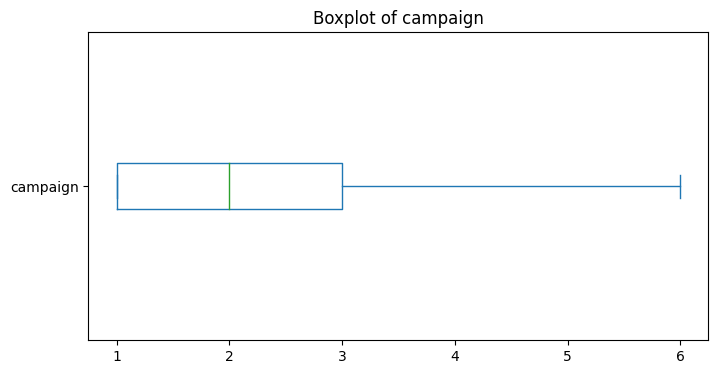

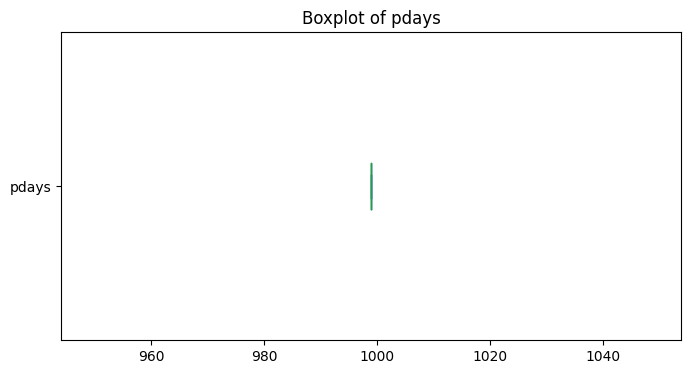

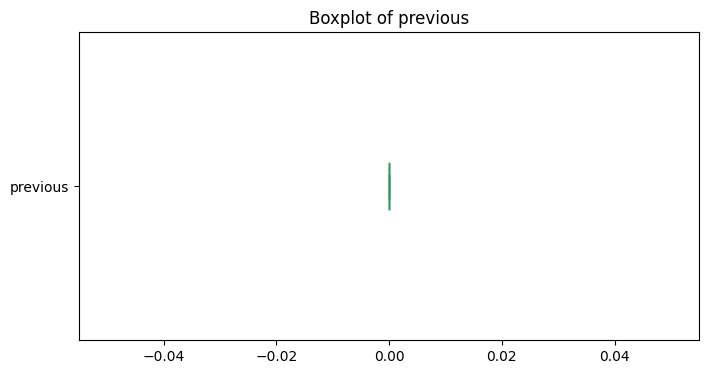

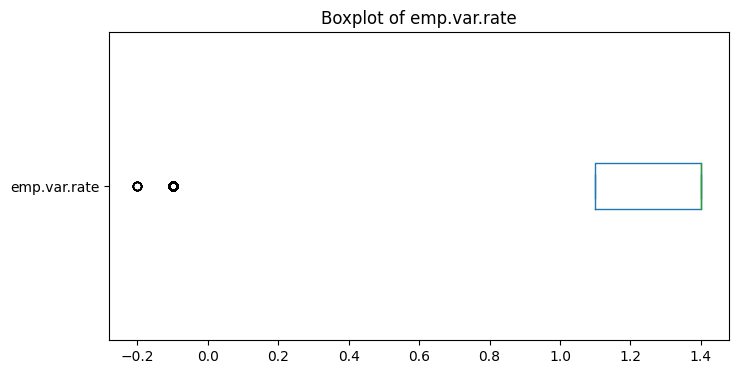

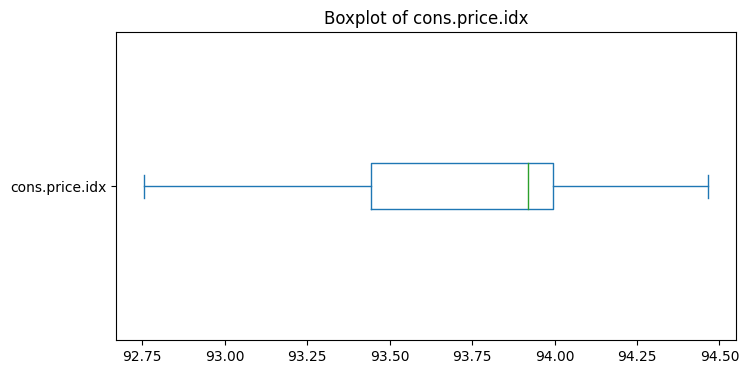

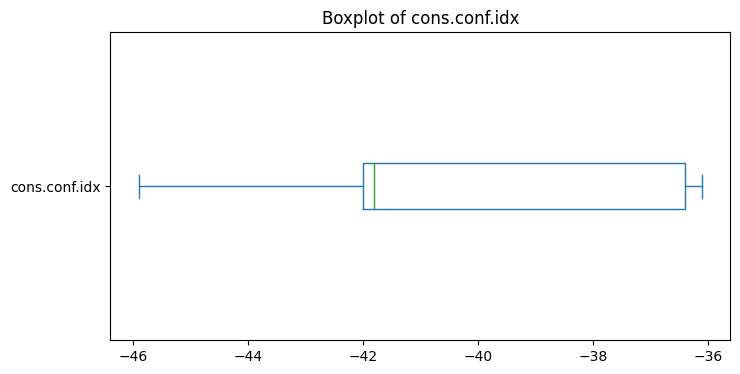

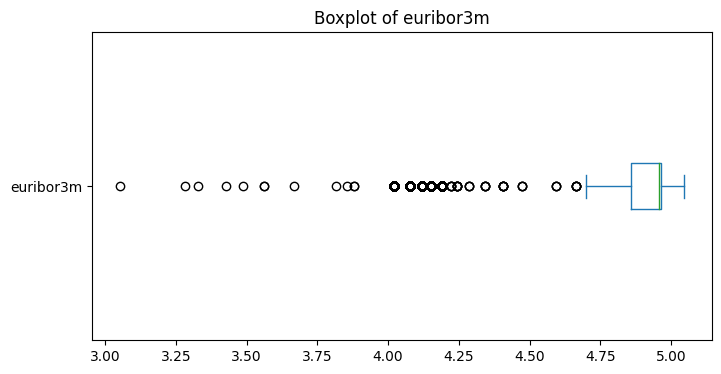

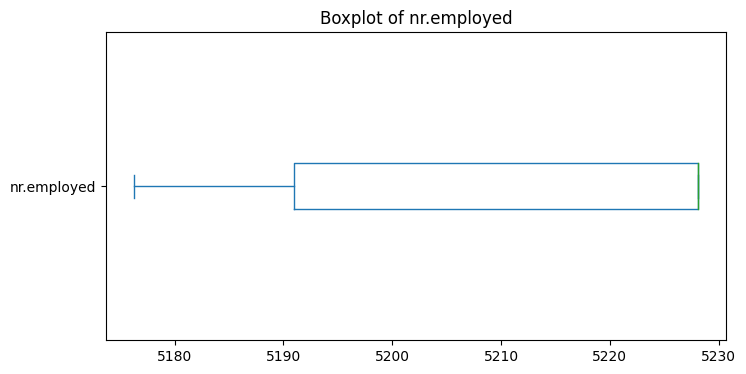

1-th df에 대한 이상치 확인


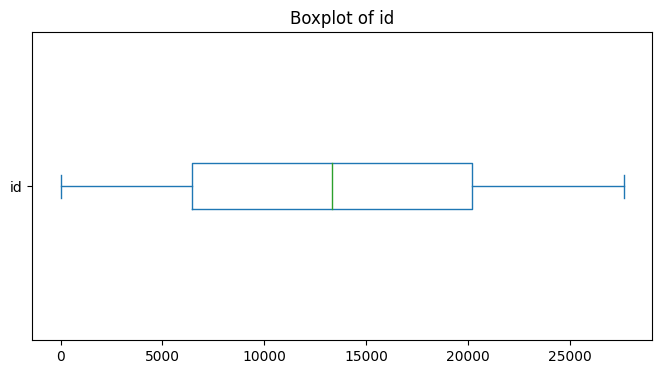

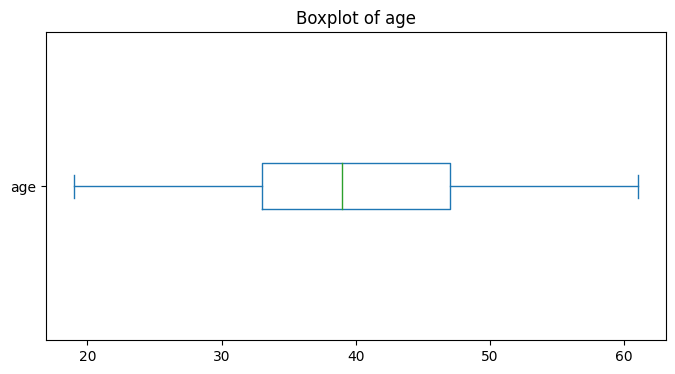

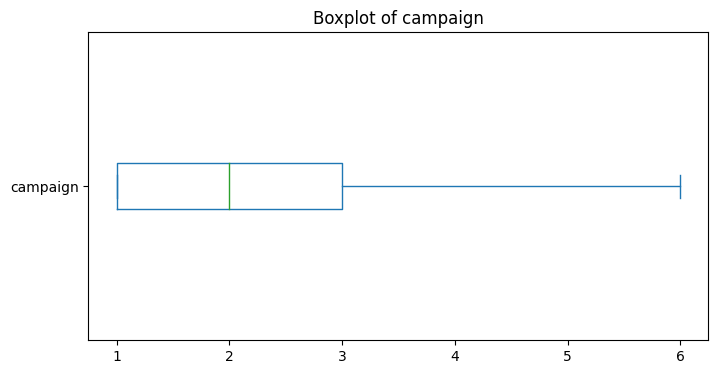

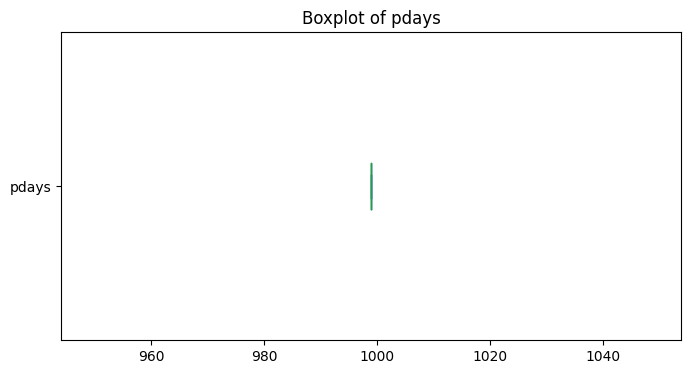

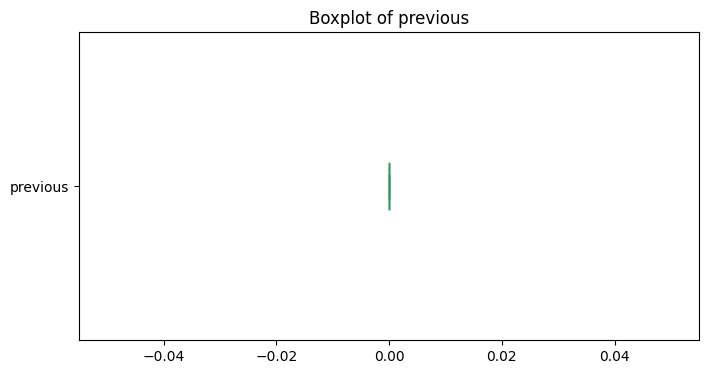

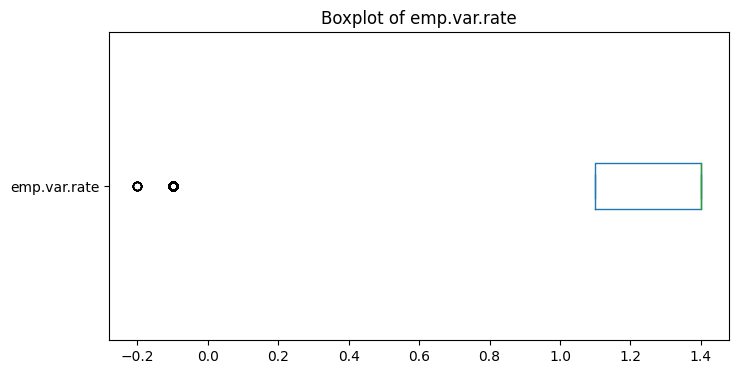

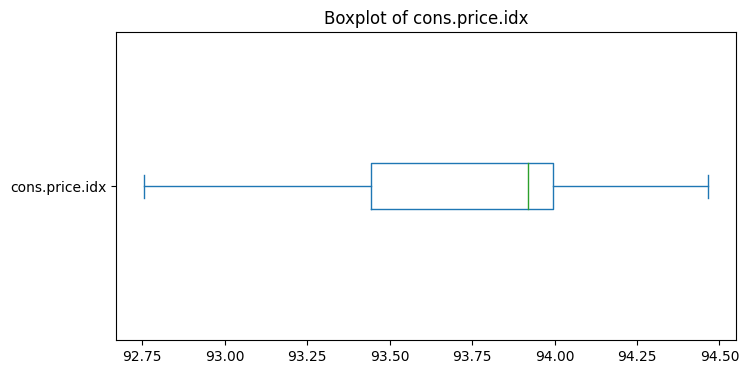

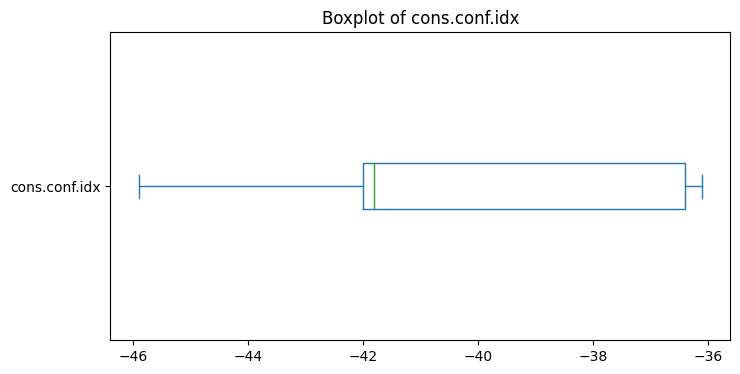

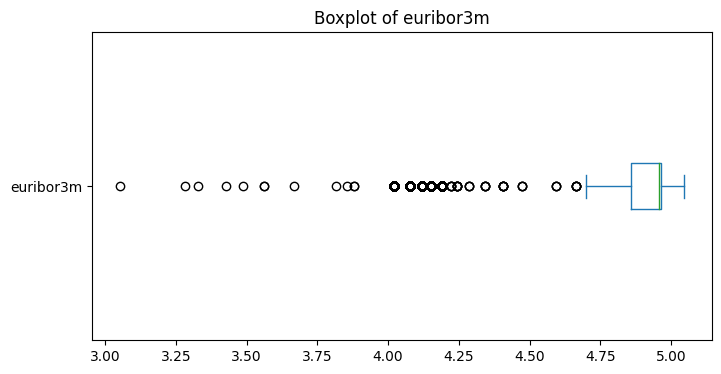

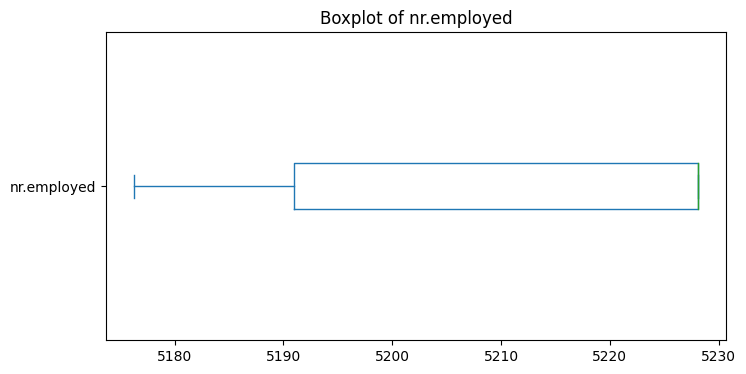

2-th df에 대한 이상치 확인


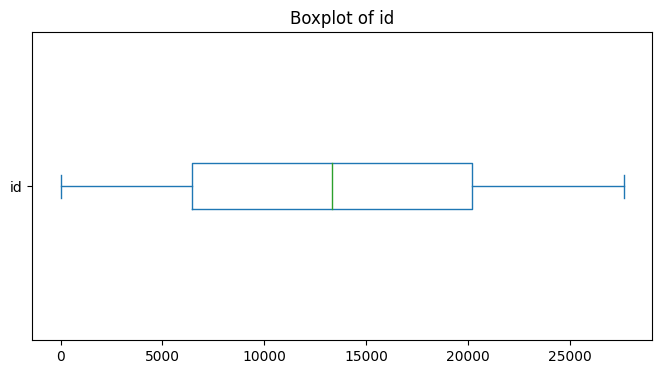

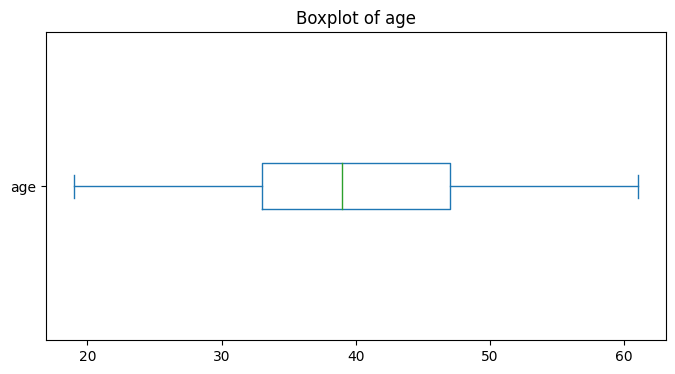

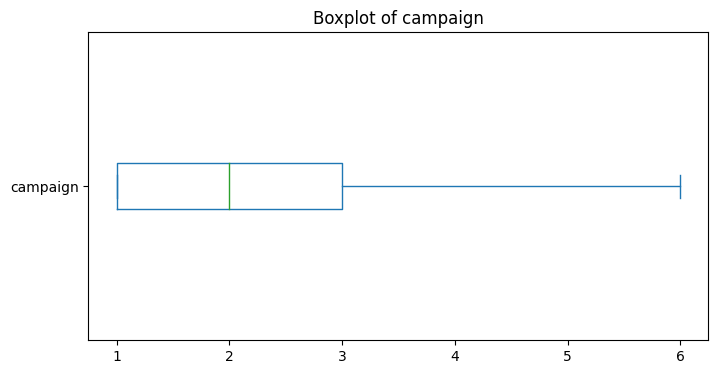

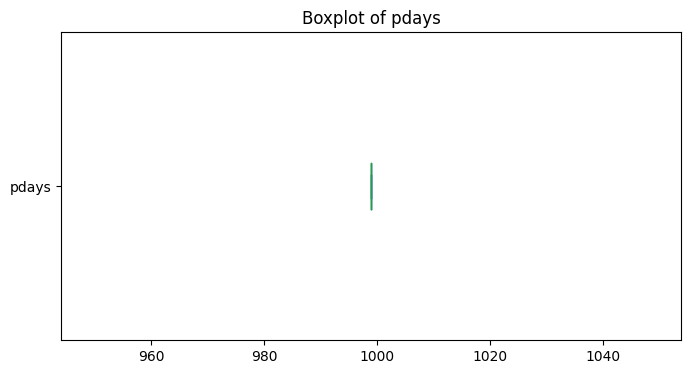

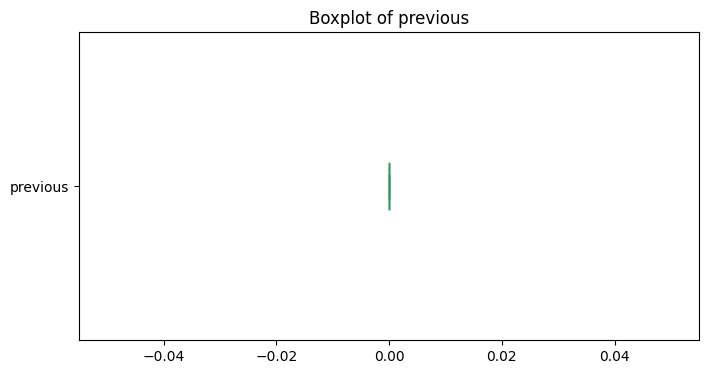

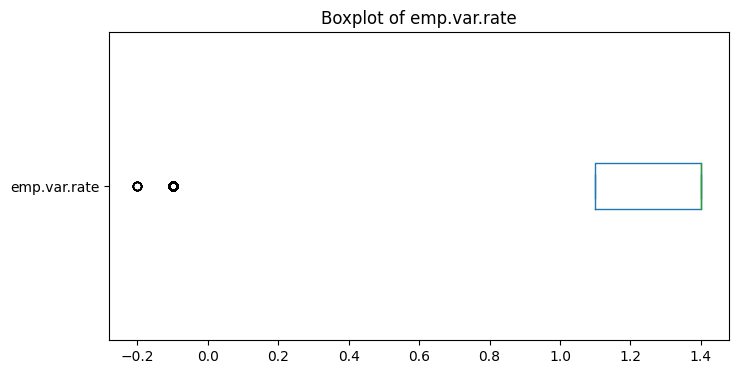

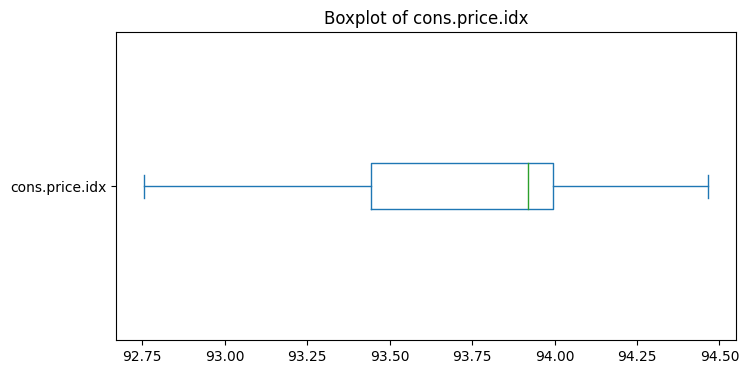

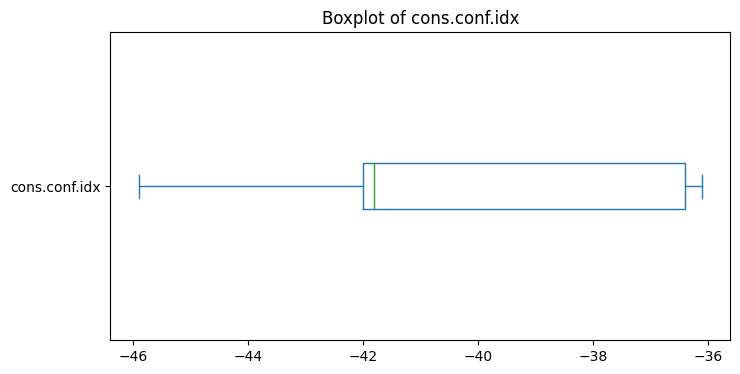

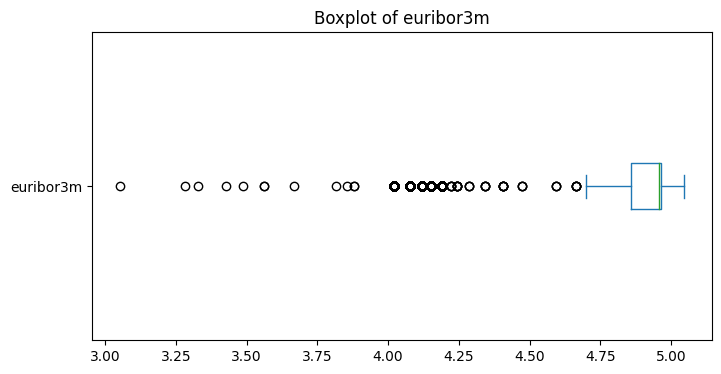

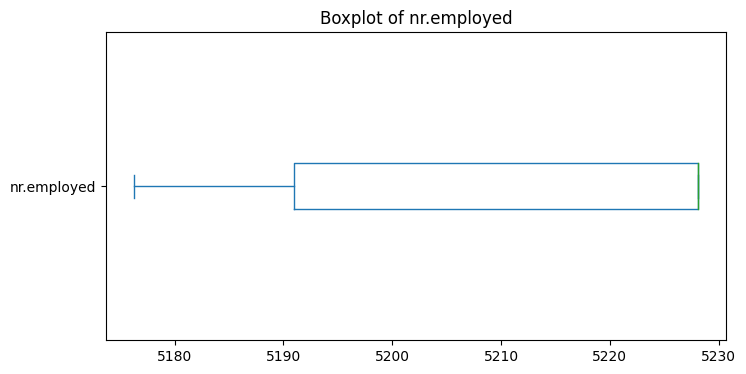

3-th df에 대한 이상치 확인


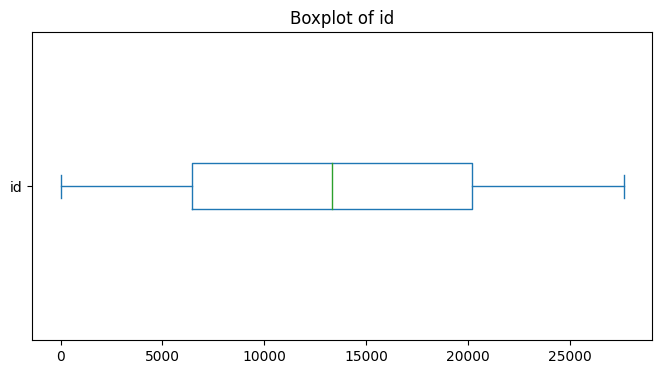

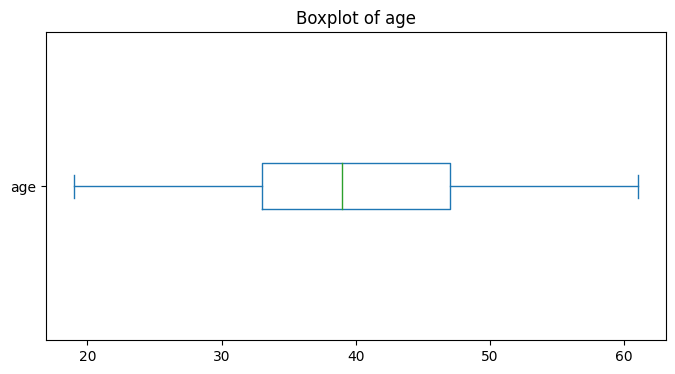

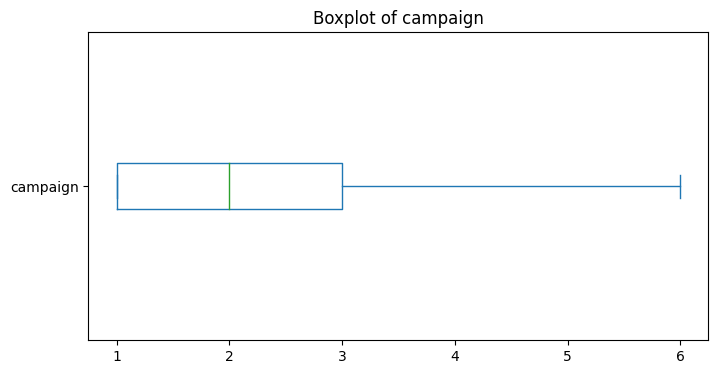

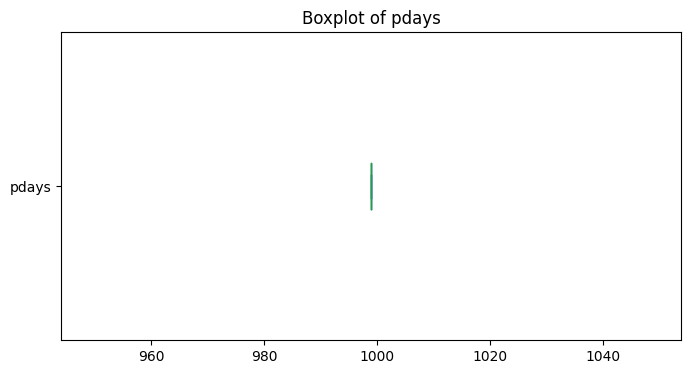

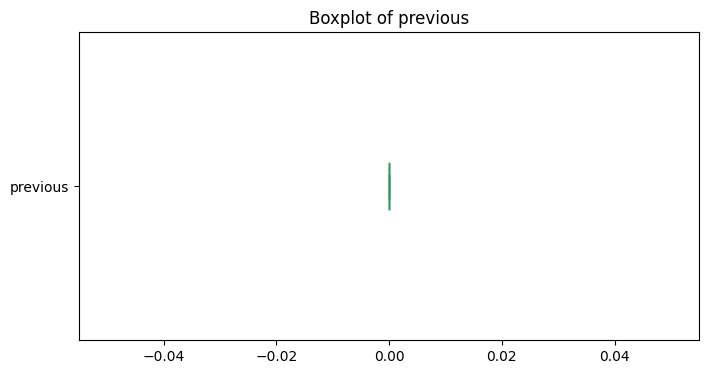

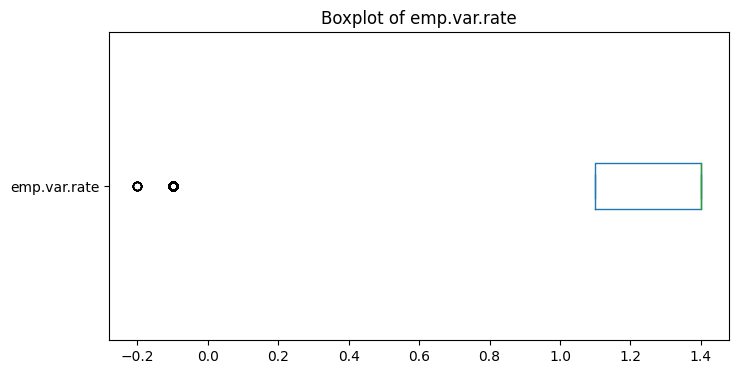

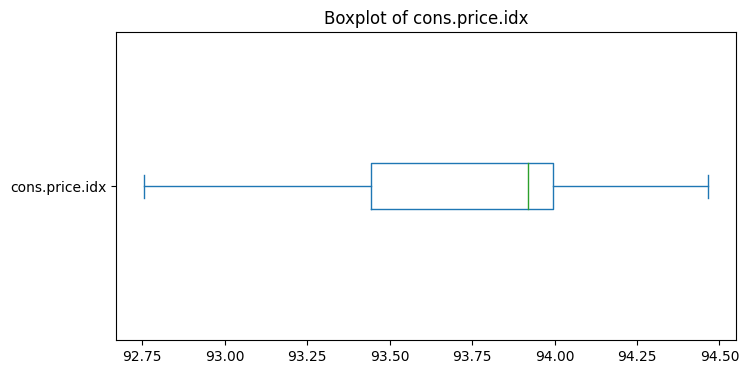

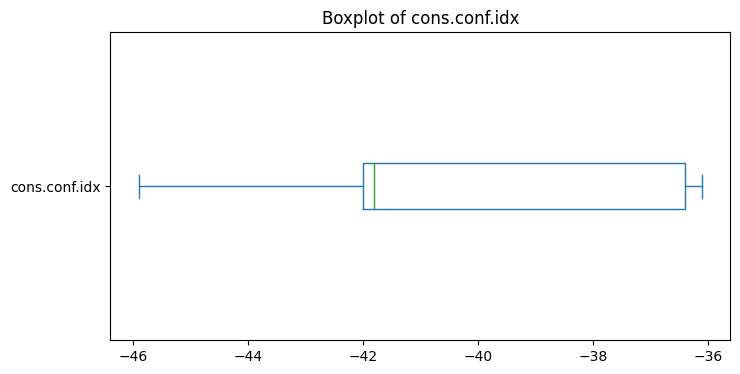

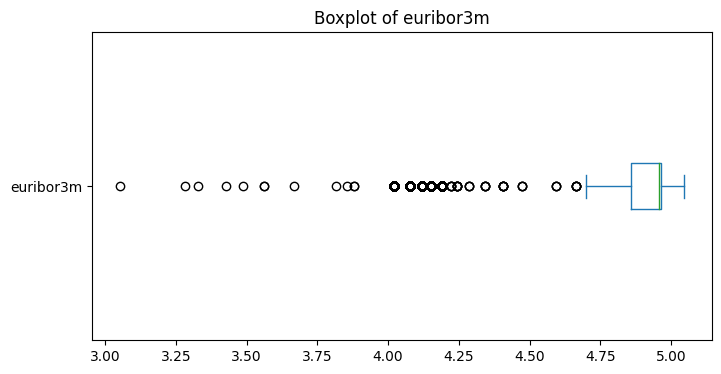

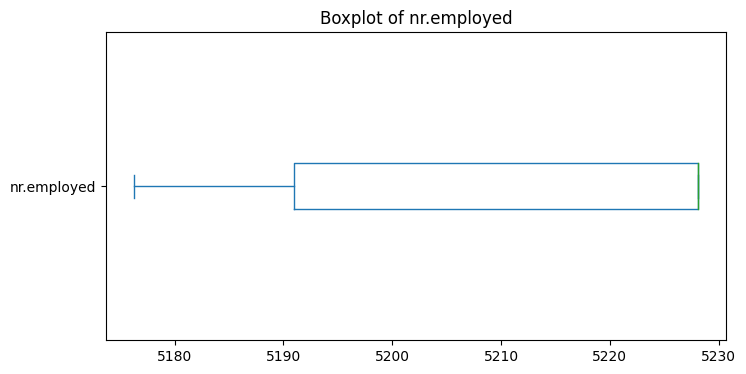

4-th df에 대한 이상치 확인


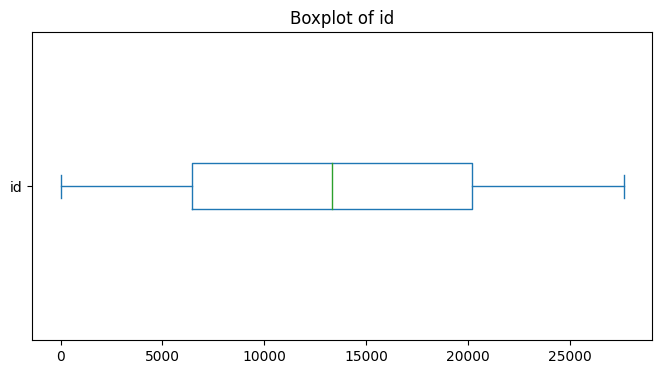

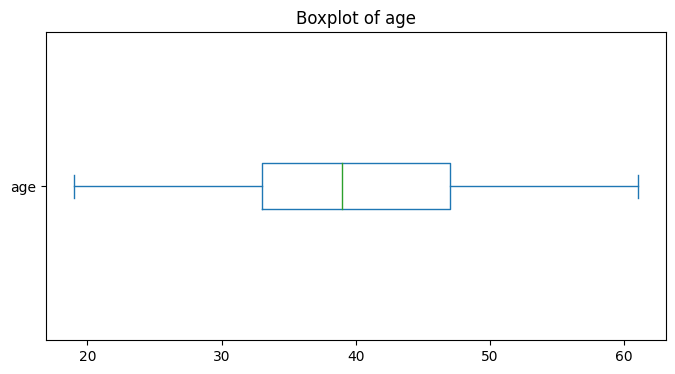

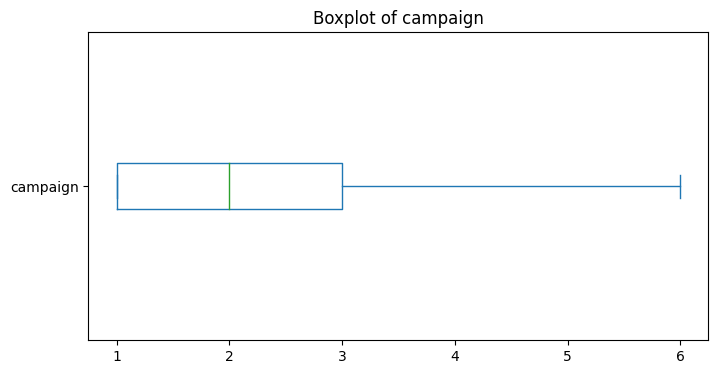

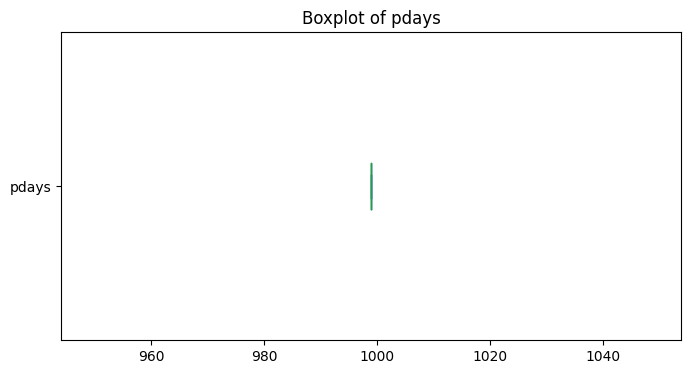

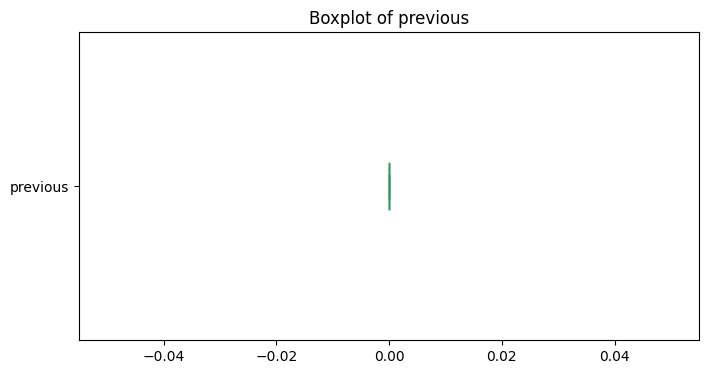

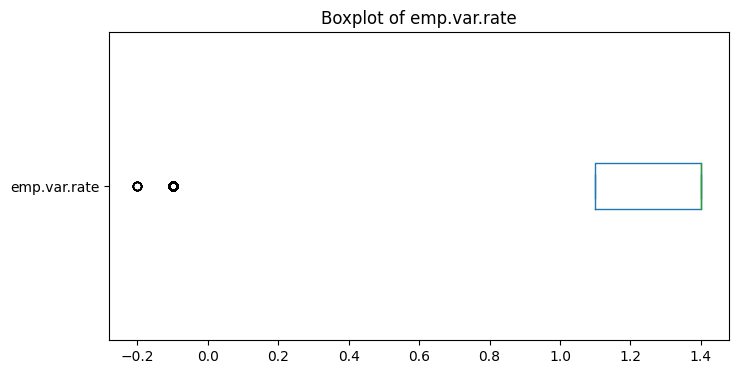

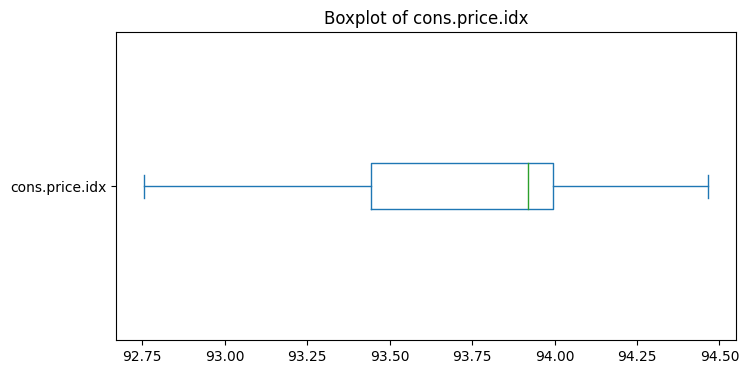

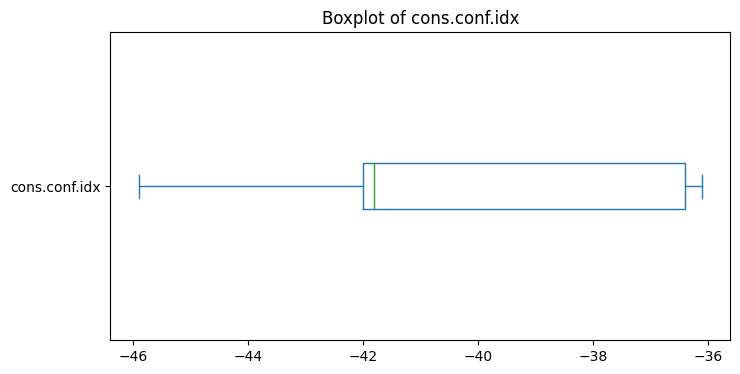

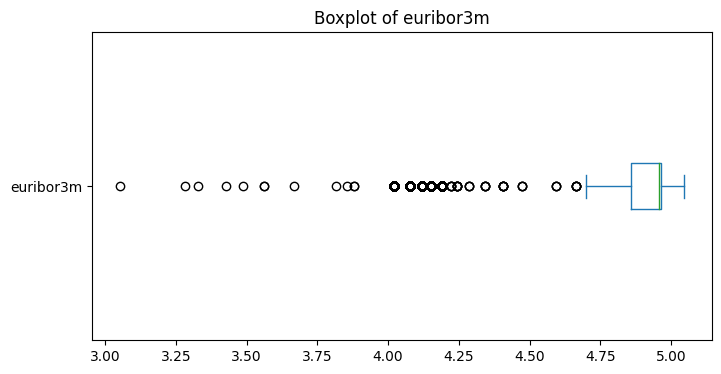

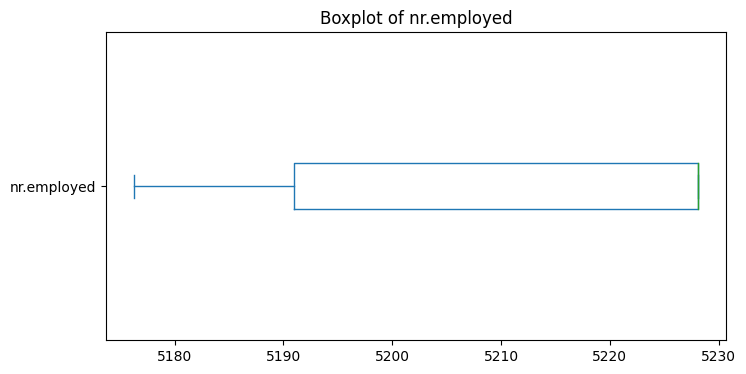

5-th df에 대한 이상치 확인


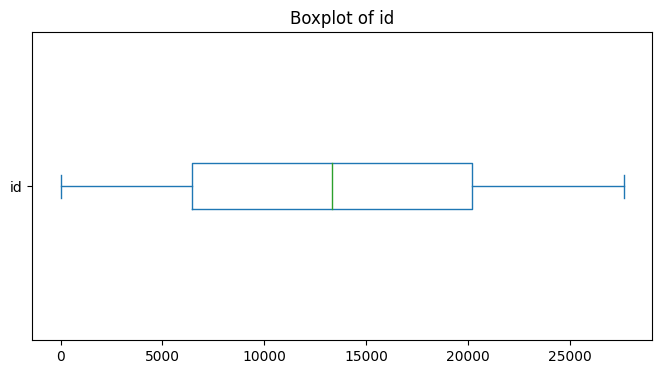

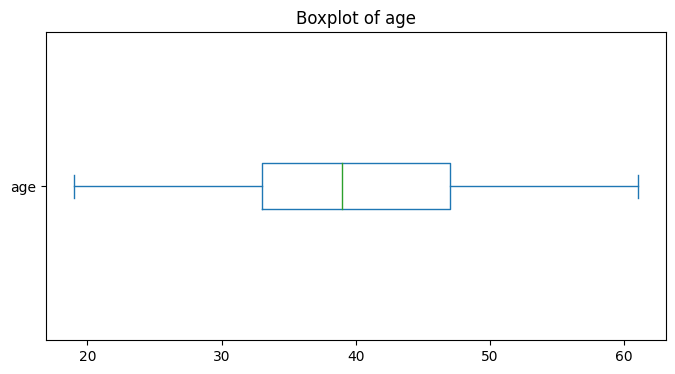

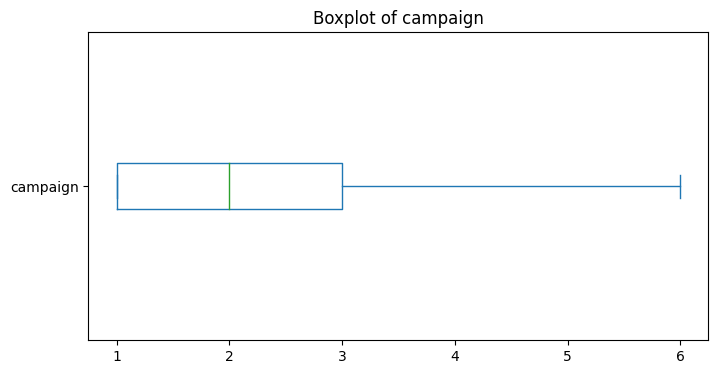

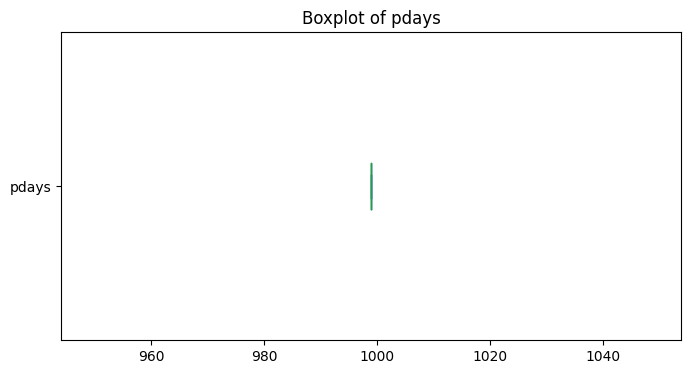

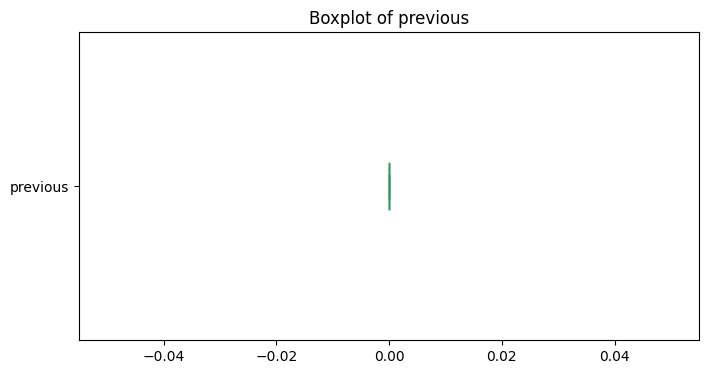

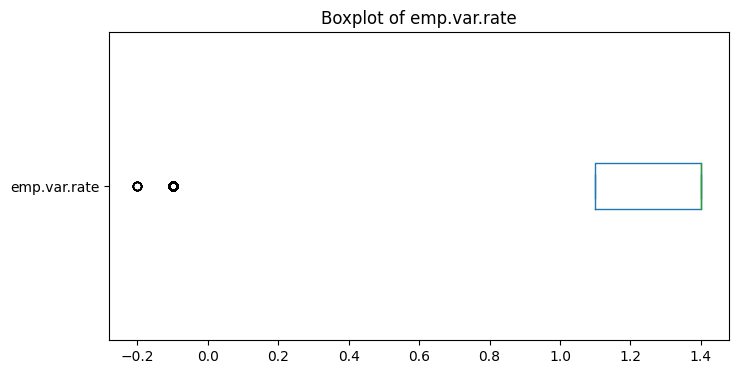

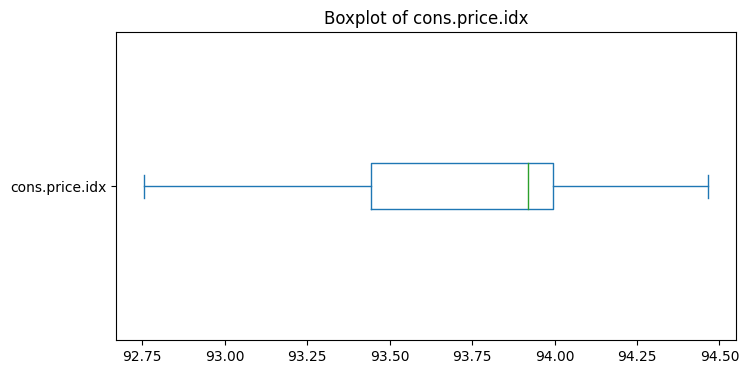

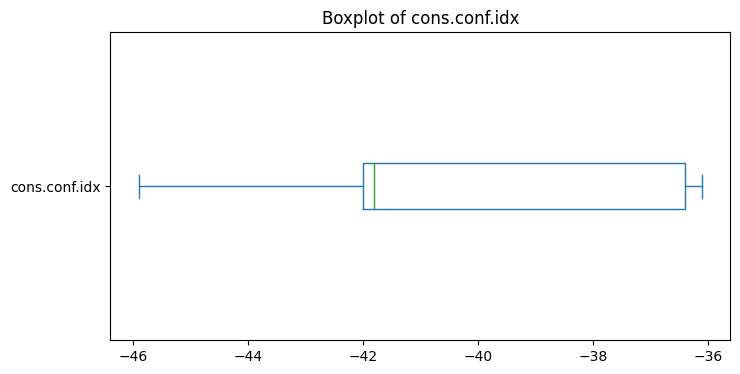

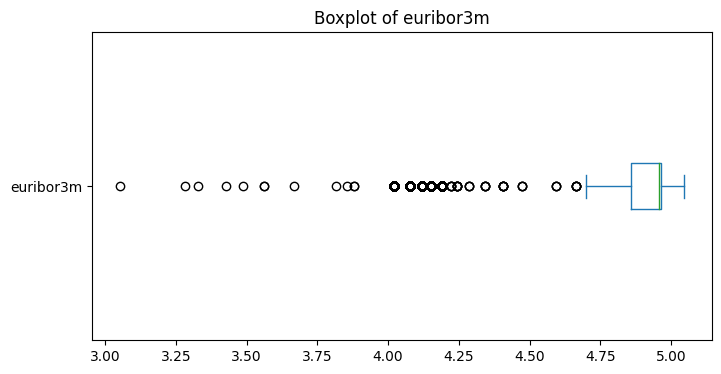

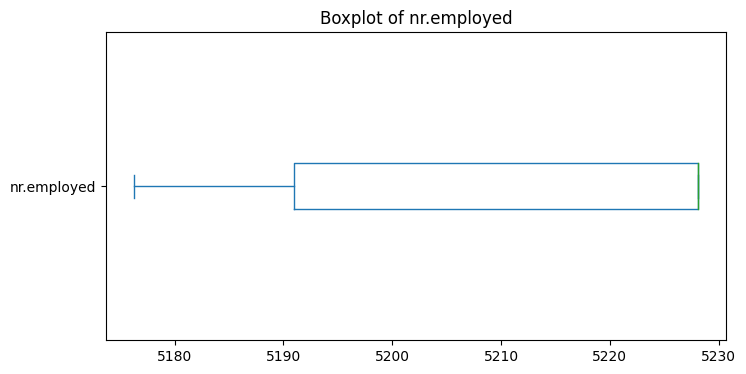

6-th df에 대한 이상치 확인


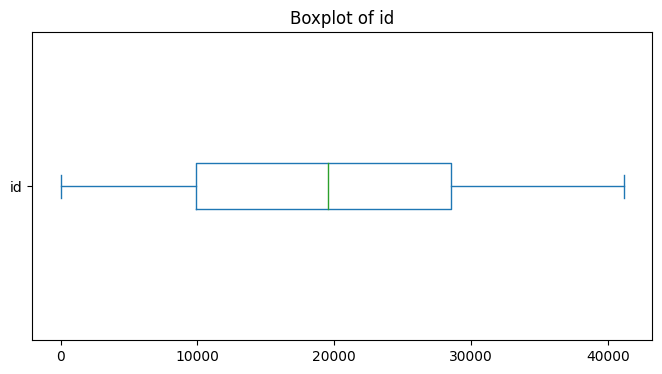

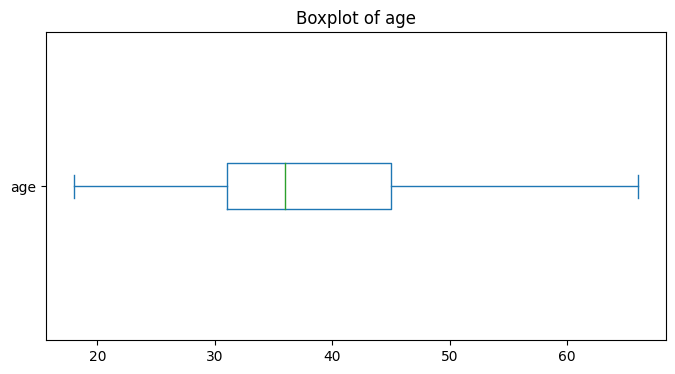

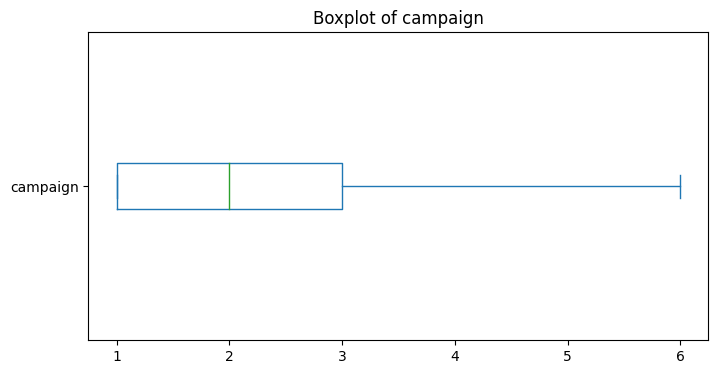

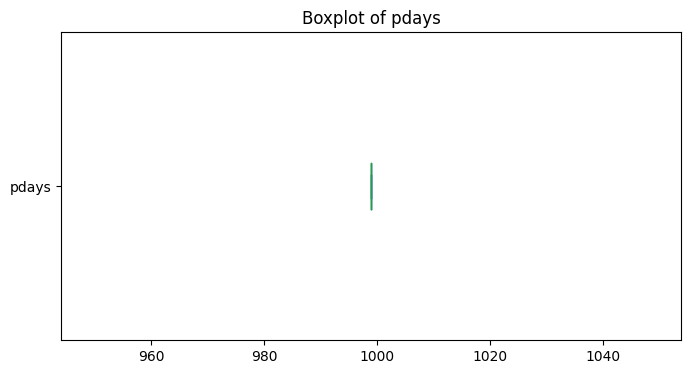

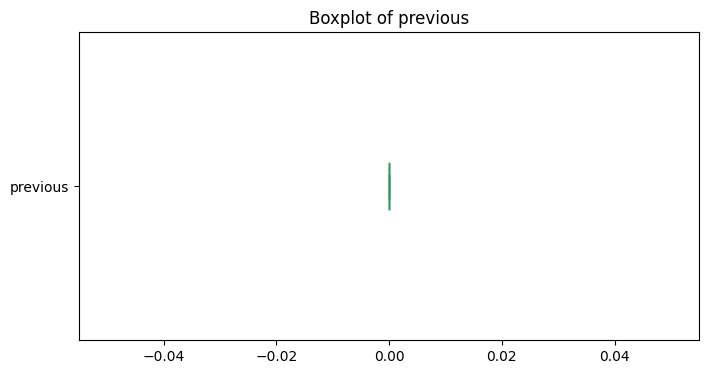

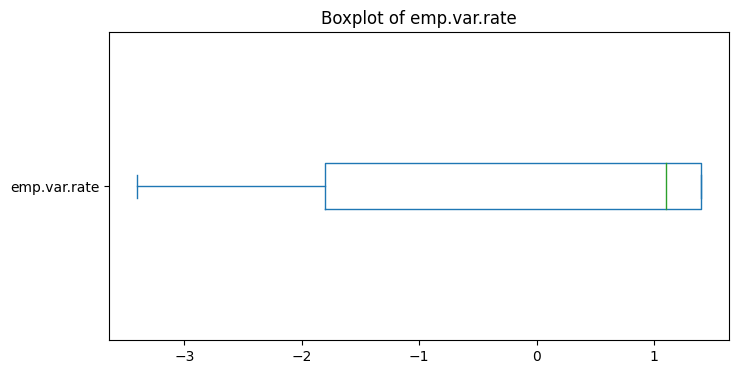

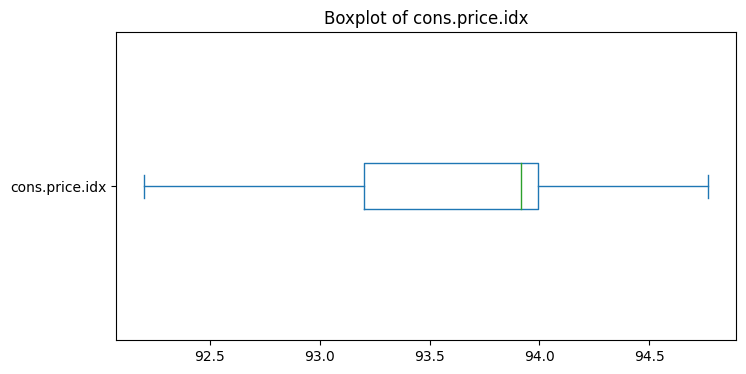

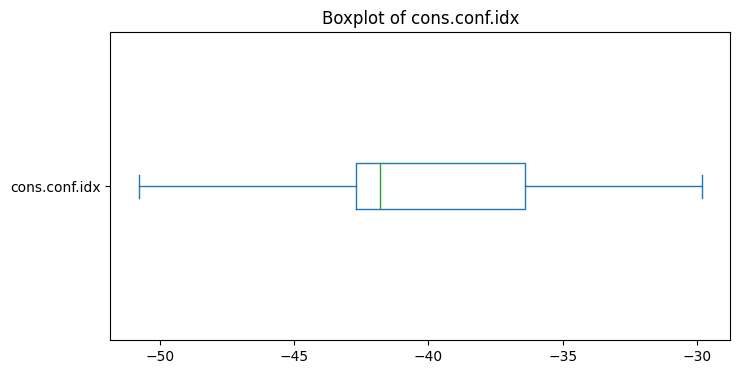

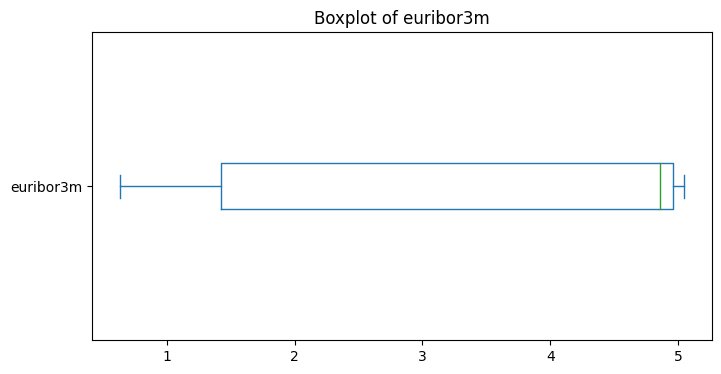

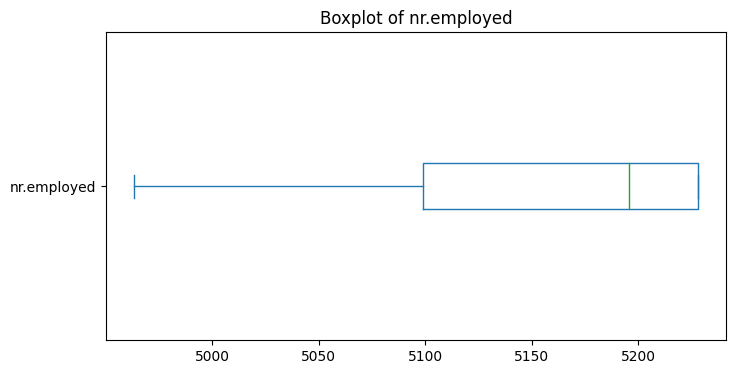

7-th df에 대한 이상치 확인


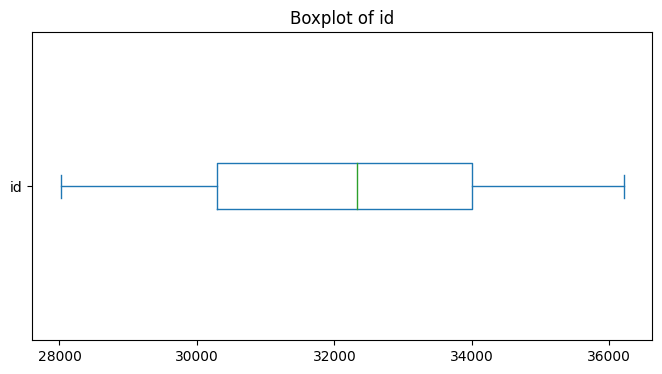

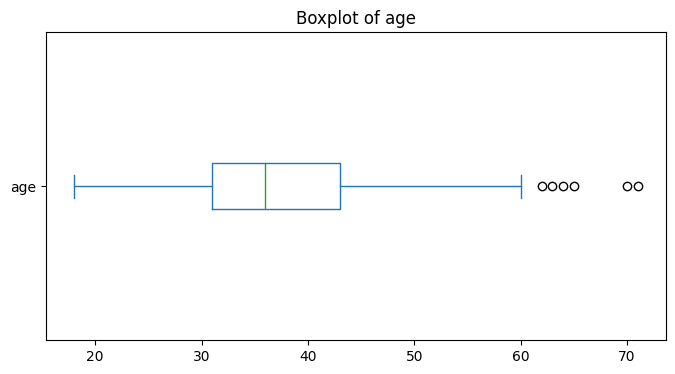

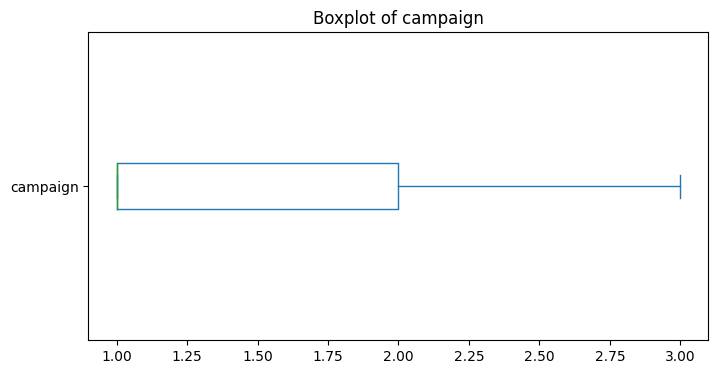

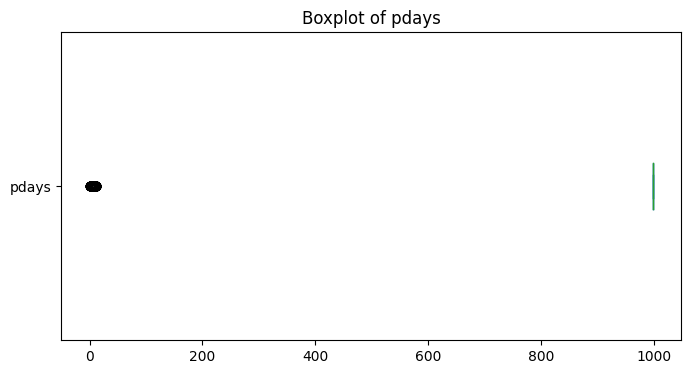

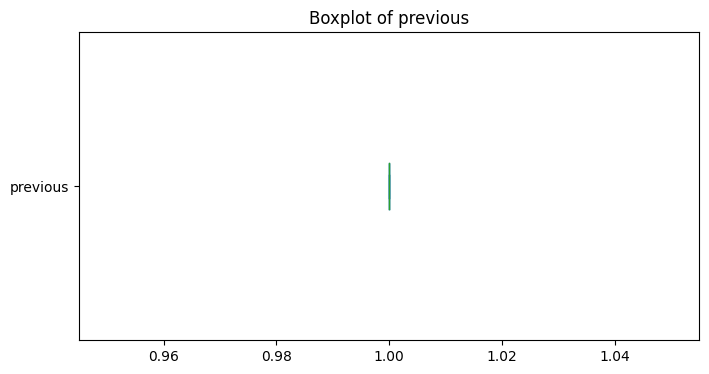

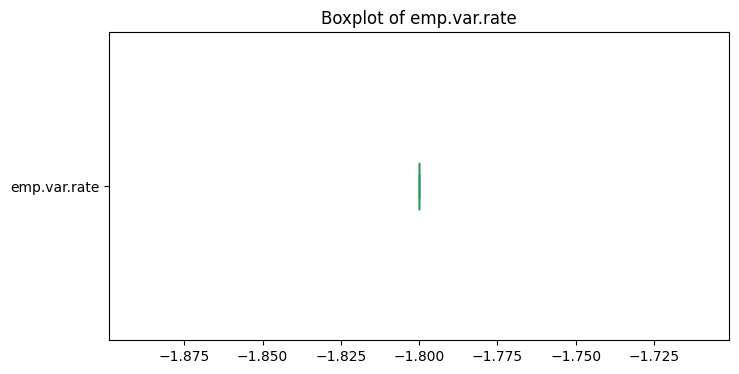

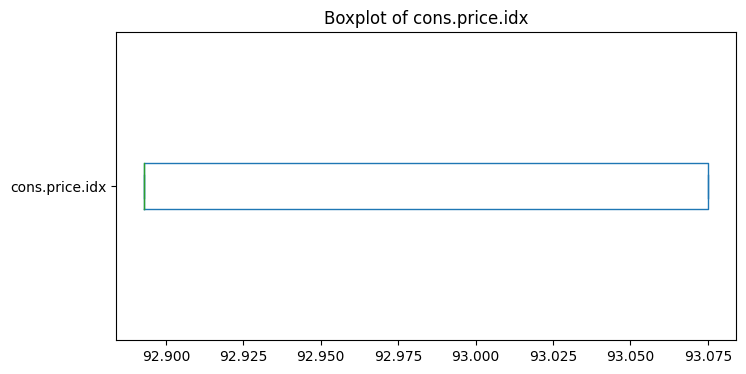

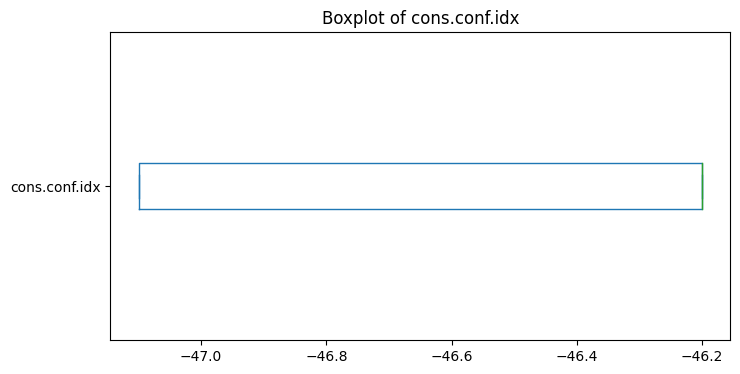

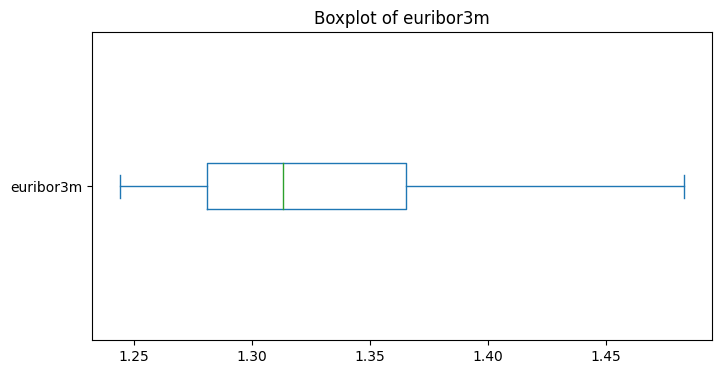

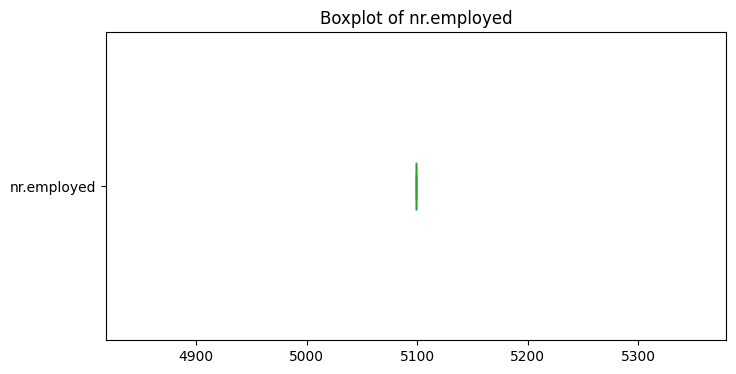

In [ ]:
#이상치 삭제 확인
for i in range(len(outlier_group)):
  print(f'{i}-th df에 대한 이상치 확인')
  df = outlier_group[i]
  for col in df.columns:
    if outlier_group[i][col].dtype == 'int64' or outlier_group[i][col].dtype == 'float64':
      plt.figure()
      df[col].plot(kind='box', vert=False, figsize=(8, 4))
      plt.title(f'Boxplot of {col}')
      plt.show()

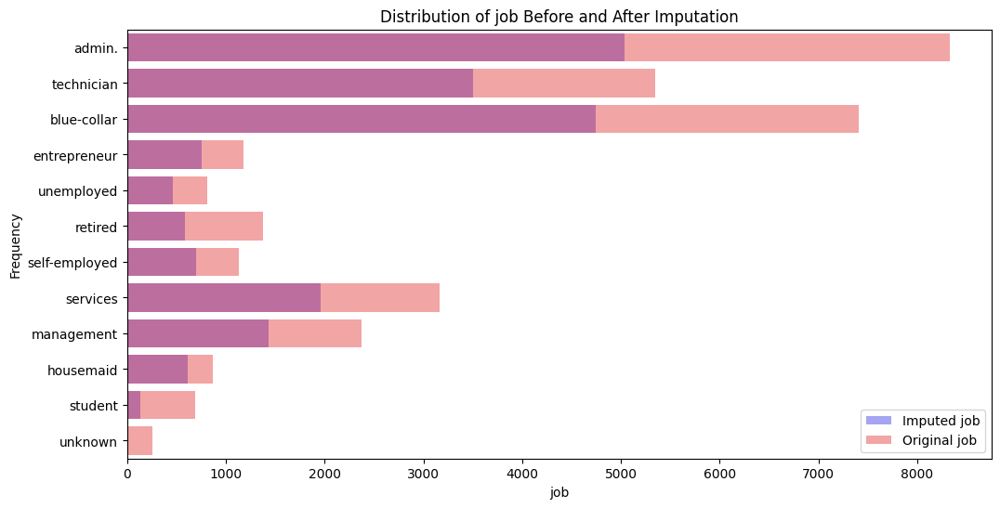

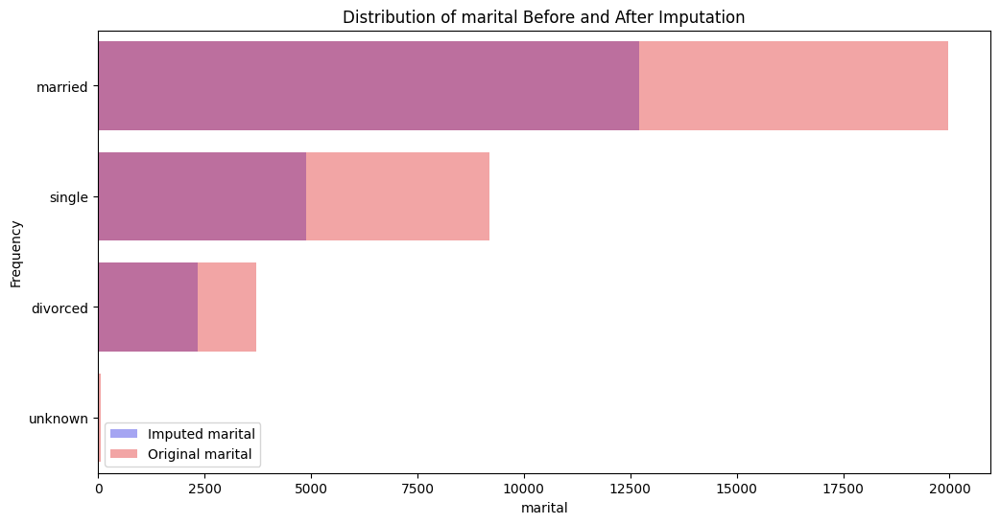

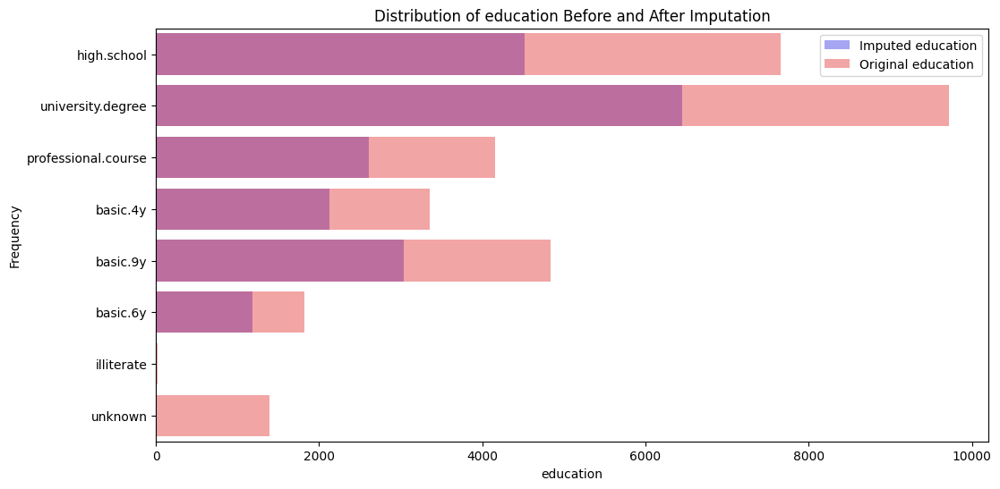

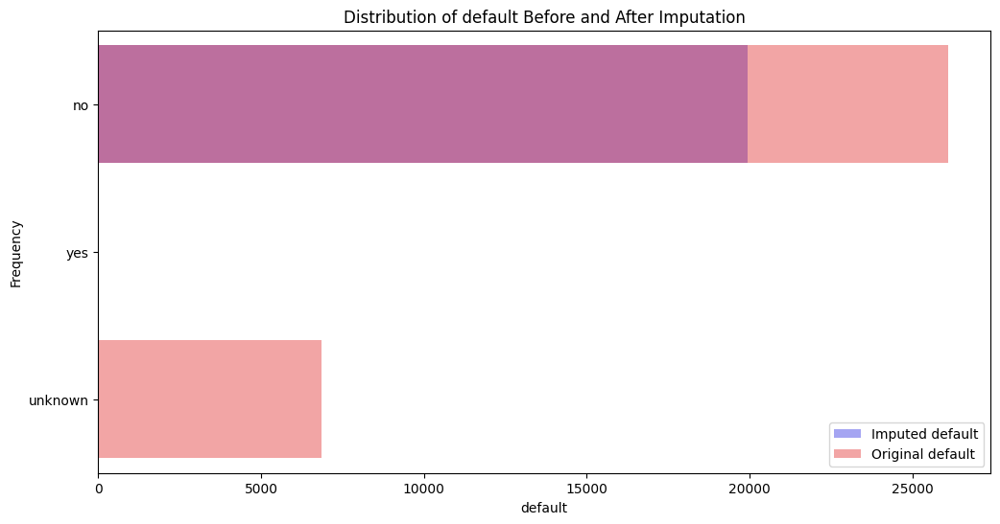

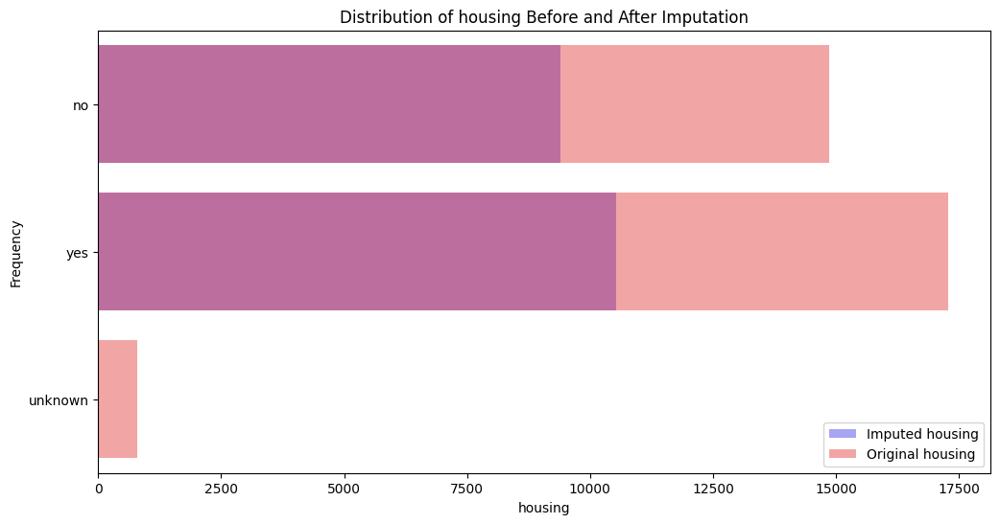

...

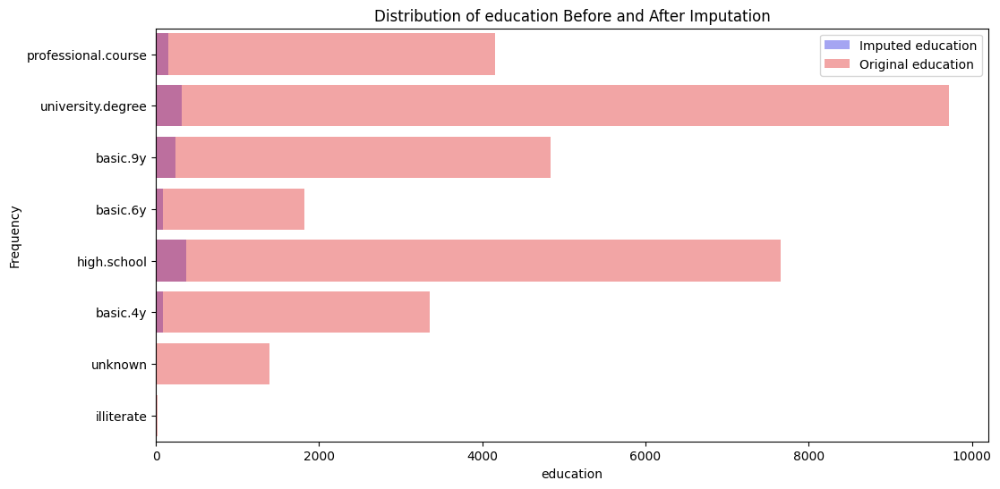

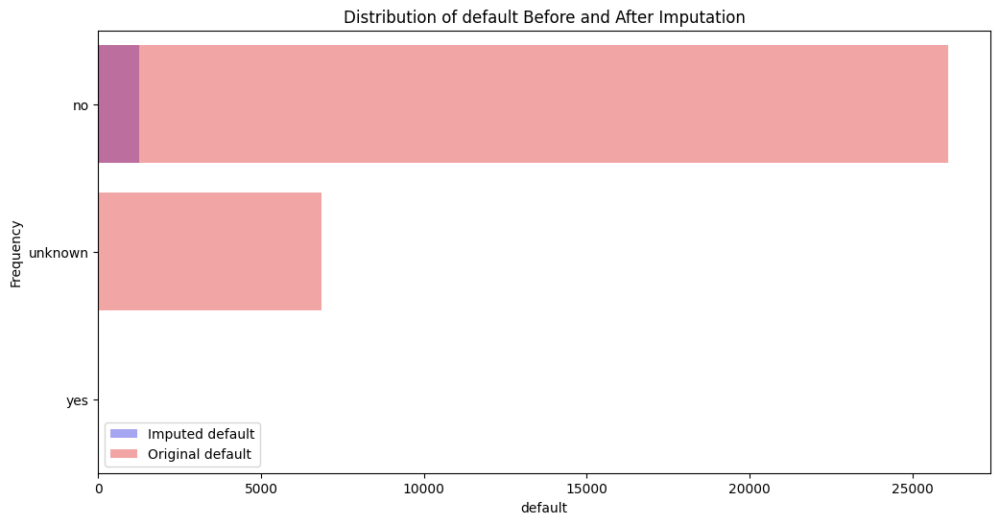

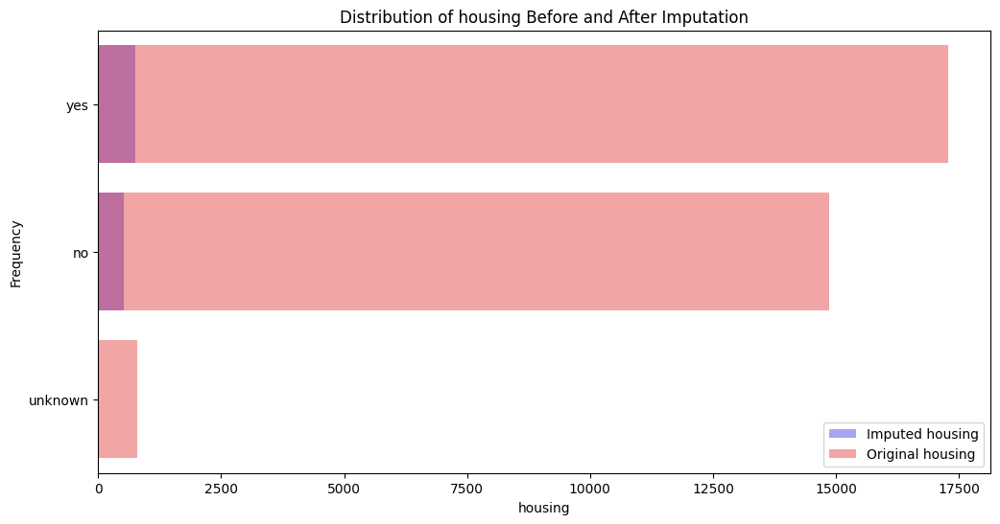

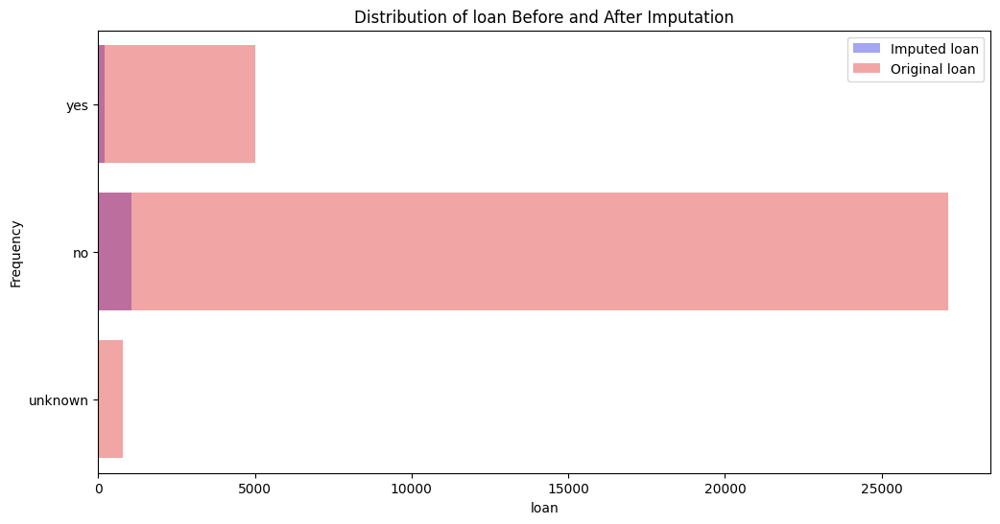

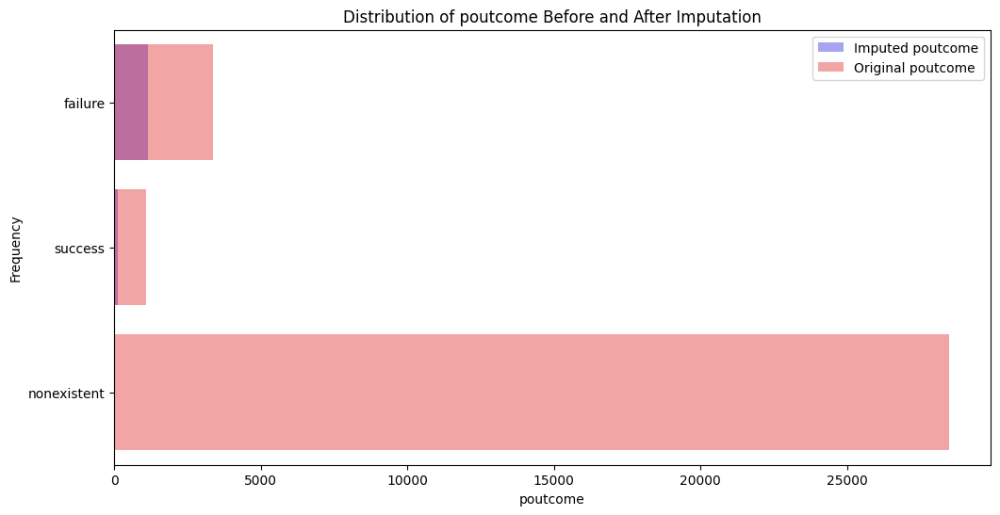

In [ ]:
# 결측치가 있던 컬럼은 피쳐에서 제외 후 실험
cols =  ['job', 'marital', 'education', 'default', 'housing', 'loan', 'poutcome']

import matplotlib.pyplot as plt
import seaborn as sns

for df in outlier_group:
  for col in cols:
    plt.figure(figsize=(12, 6))

    sns.countplot(df[col], color='blue', alpha=0.4, label=f'Imputed {col}')
    sns.countplot(train_df[col], color='red', alpha=0.4, label=f'Original {col}')

    plt.legend()
    plt.title(f'Distribution of {col} Before and After Imputation')
    plt.xlabel(f'{col}')
    plt.ylabel('Frequency')
    plt.show()

- M2.winsorize 이용
- lab5에서 배운 방식

아니다 이 방식은
target이 연속형
데이터일 때 적합한 방식임

0-th


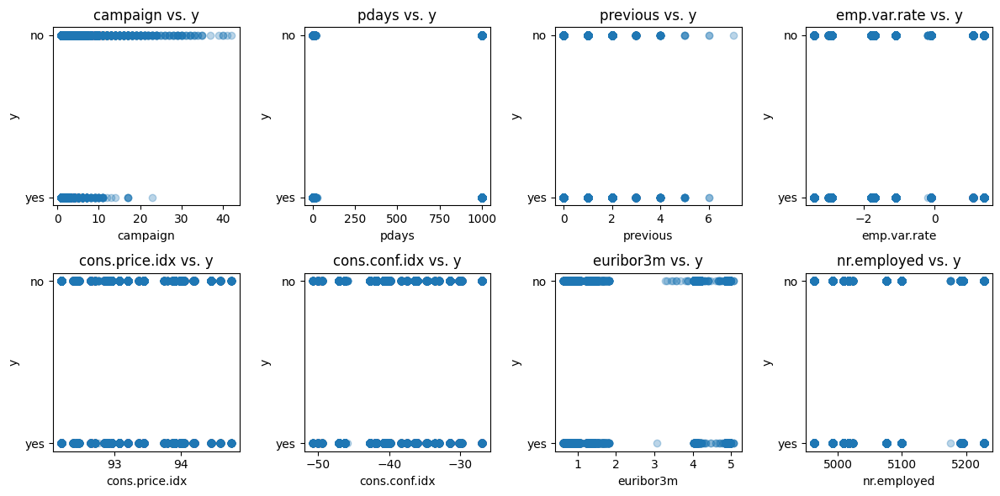

1-th


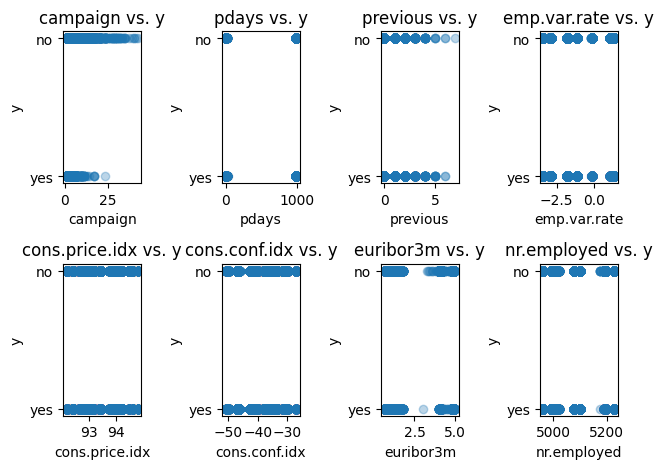

2-th


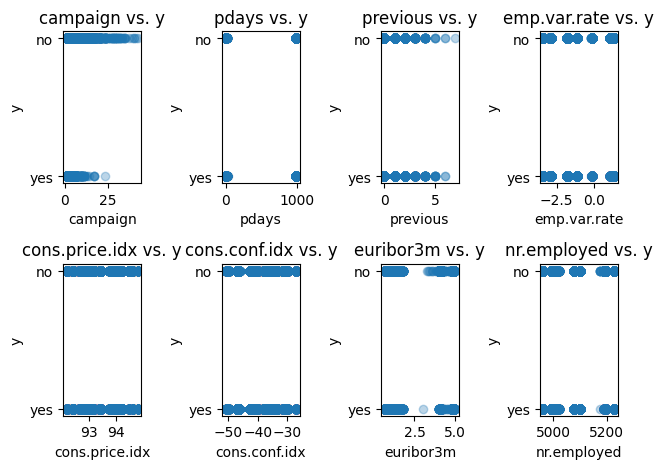

3-th


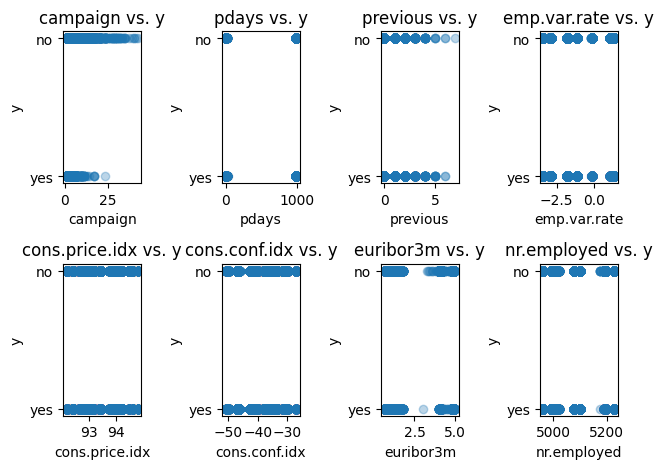

4-th


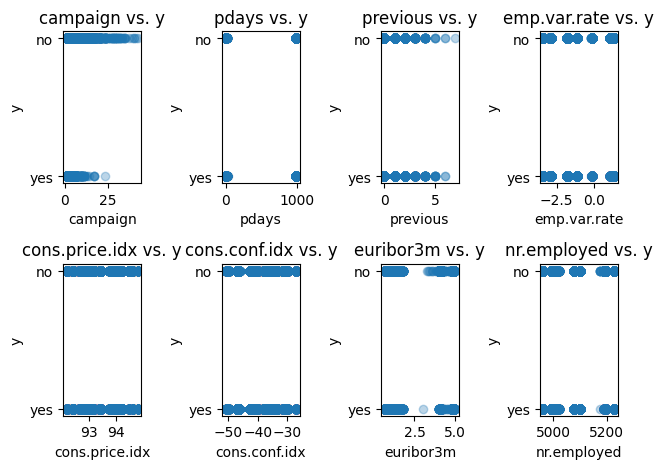

5-th


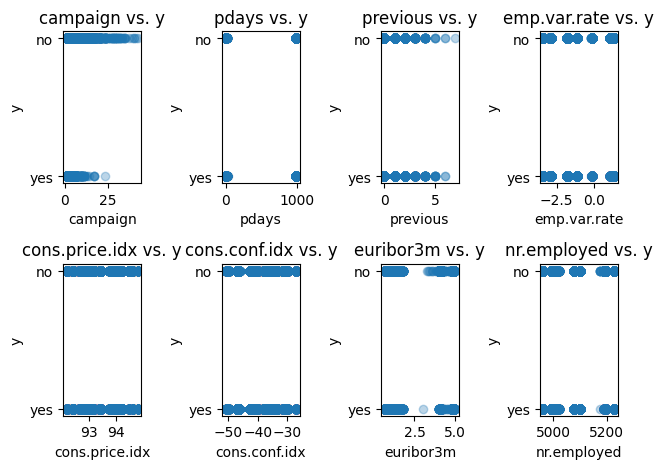

6-th


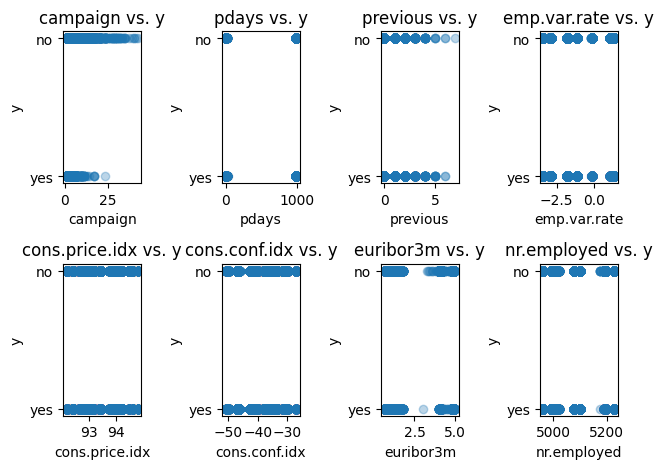

7-th


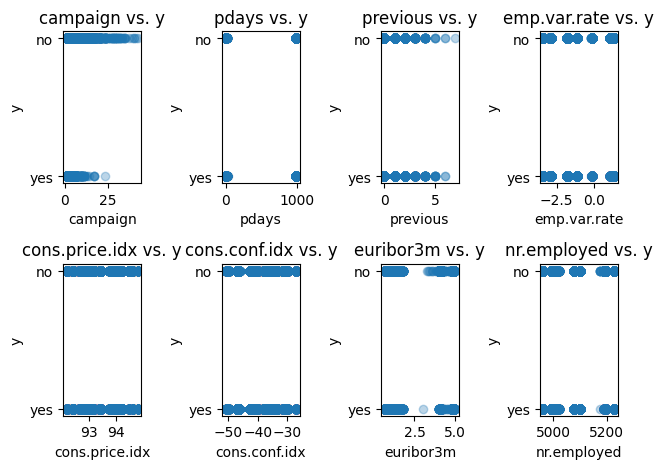

8-th


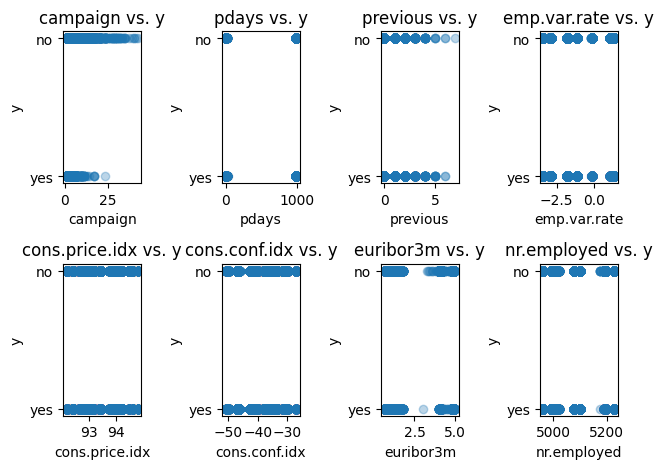

## 상관 분석

train_df


<Axes: >

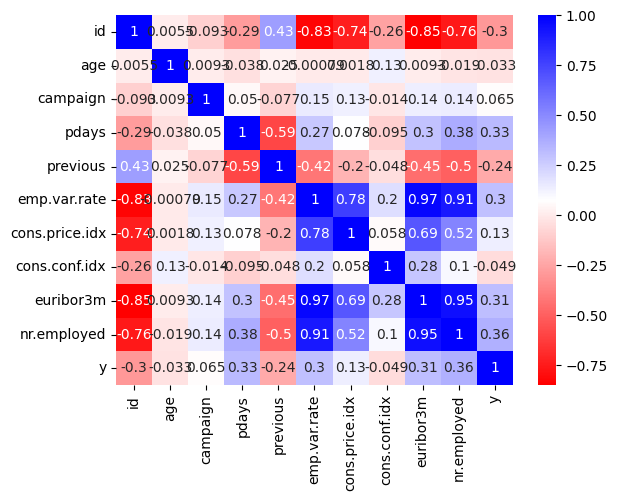

In [ ]:
numeric_df = train_df.copy()
numeric_df['y'] = numeric_df['y'].replace({"yes": 0, "no": 1})
numeric_df = numeric_df.select_dtypes(include=[np.number])

corr = numeric_df.corr()
sns.heatmap(corr, cmap='bwr_r', annot=True)

# 결과: target과 관련 높은 column: 없음.
# 그나마 pdays, emp.var.rate, euribor3m, nr,employed, previous

결측치 제거 df


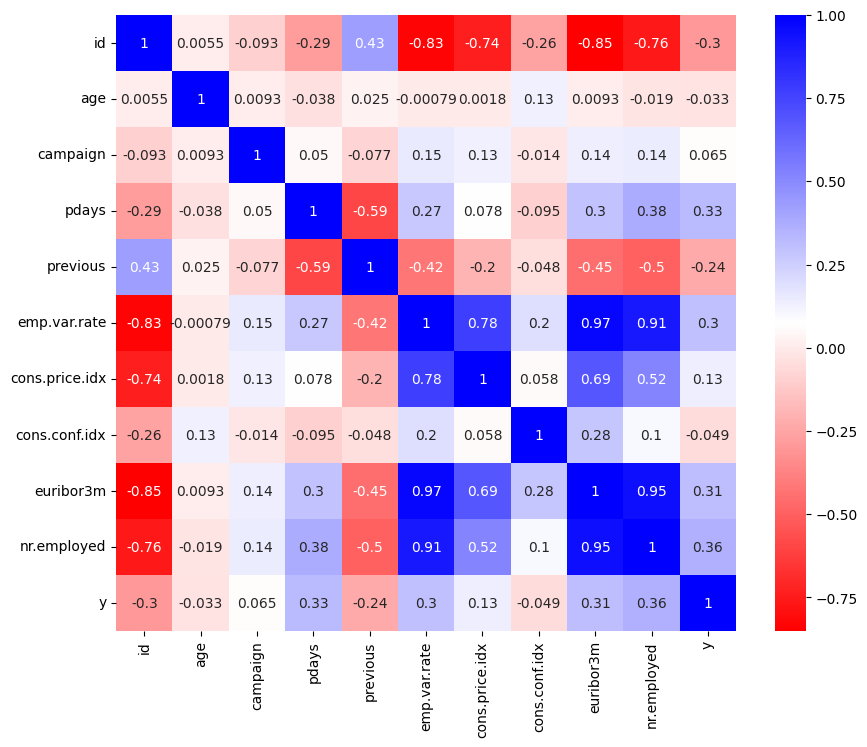

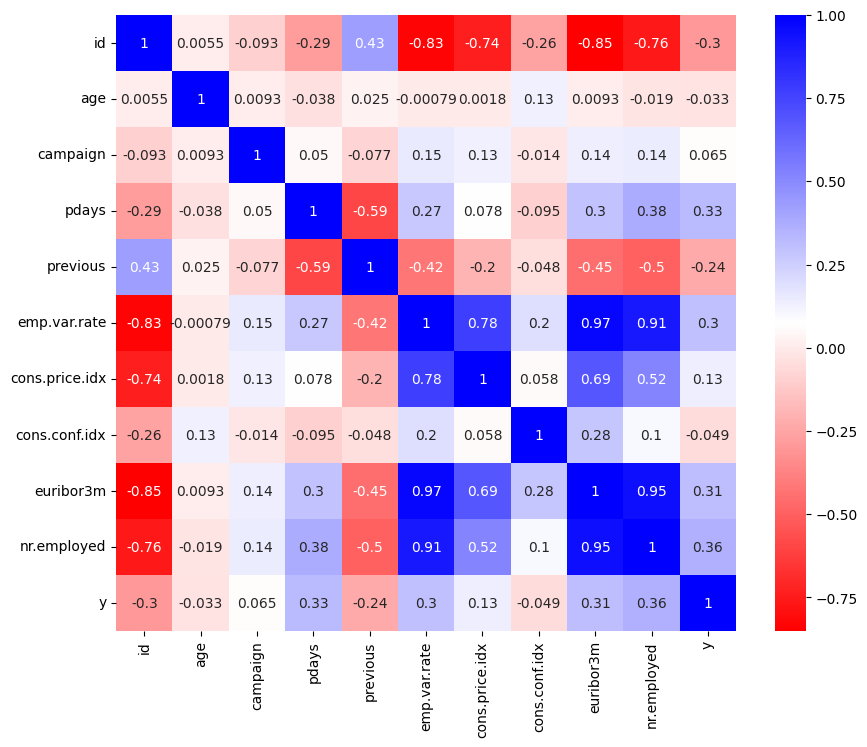

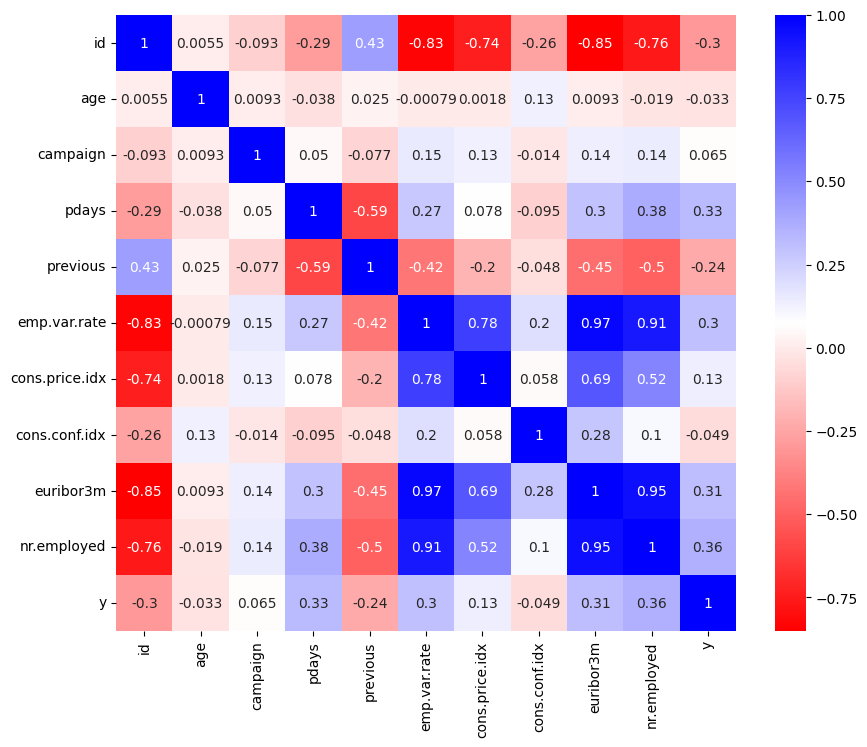

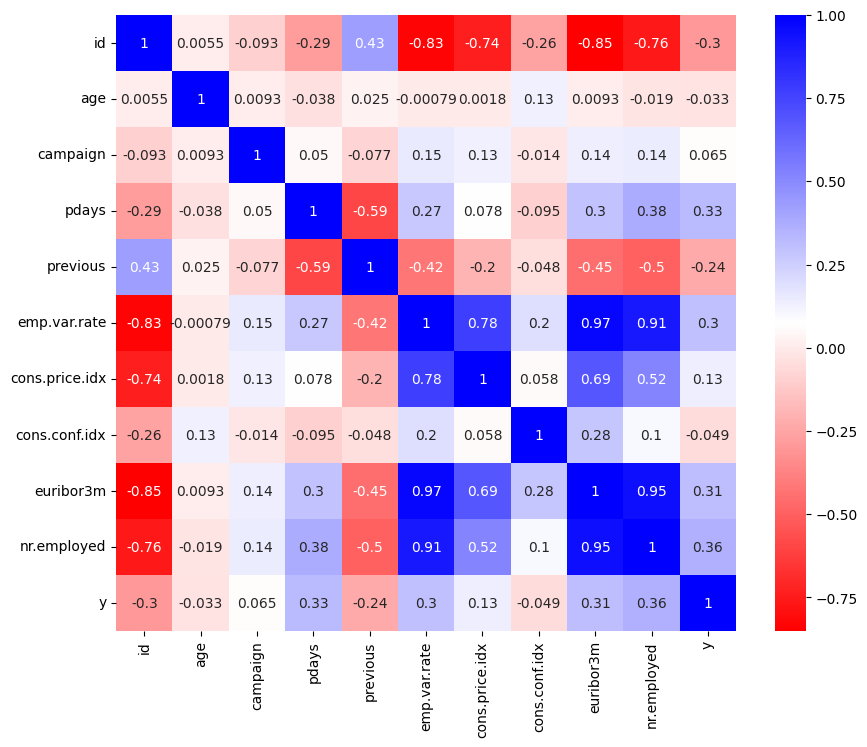

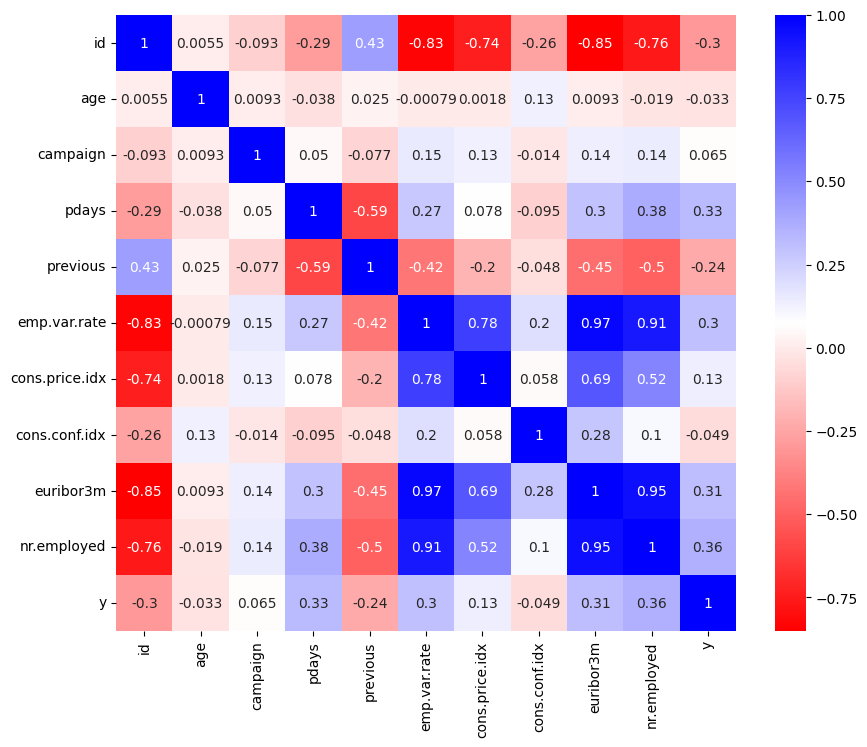

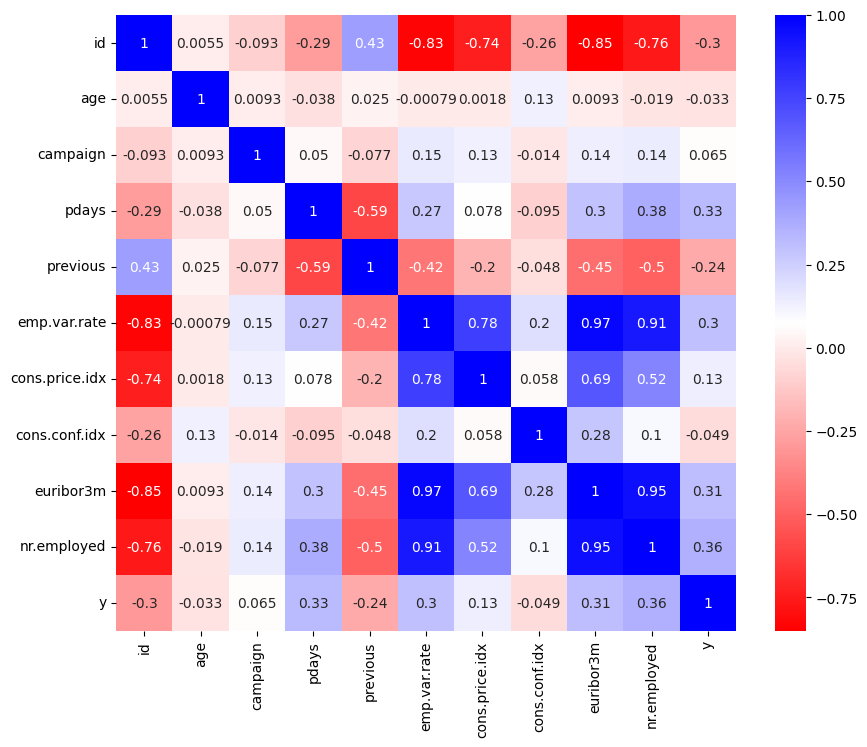

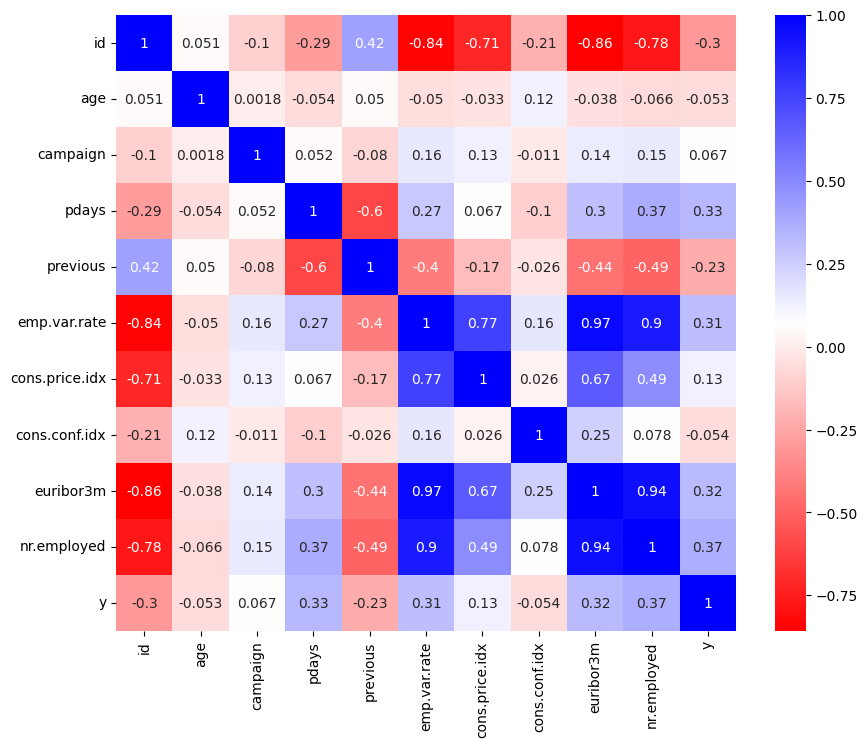

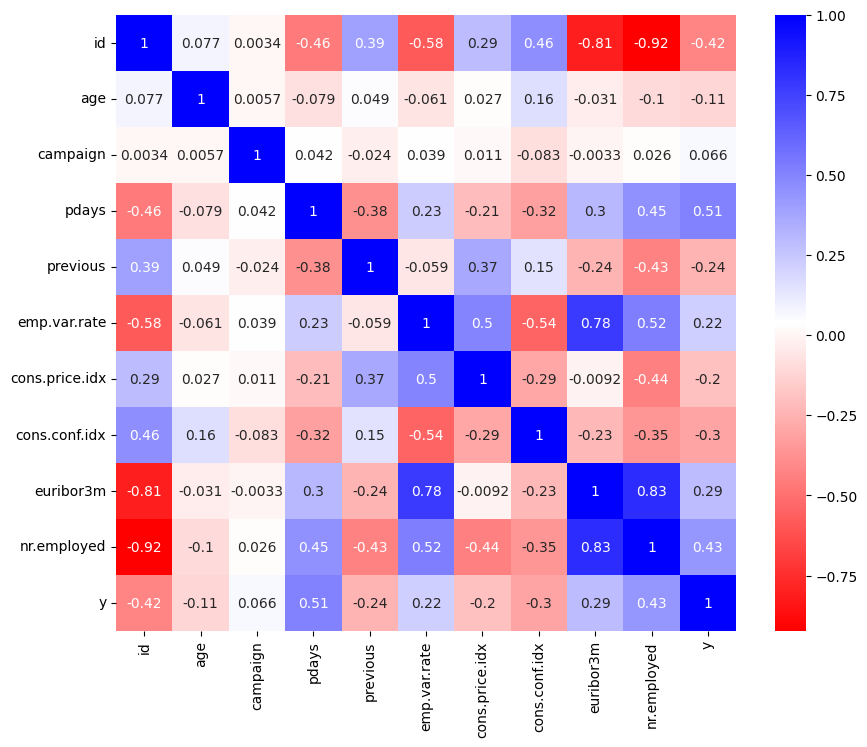

In [ ]:
print('결측치 처리 df')
for df in imputed_group:
  plt.figure(figsize=(10, 8))
  numeric_df = df.copy()
  numeric_df['y'] = numeric_df['y'].replace({"yes": 0, "no": 1})
  numeric_df = numeric_df.select_dtypes(include=[np.number])
  corr = numeric_df.corr()
  sns.heatmap(corr, cmap='bwr_r', annot=True)
  plt.show()

결측치, 이상치 제거 df


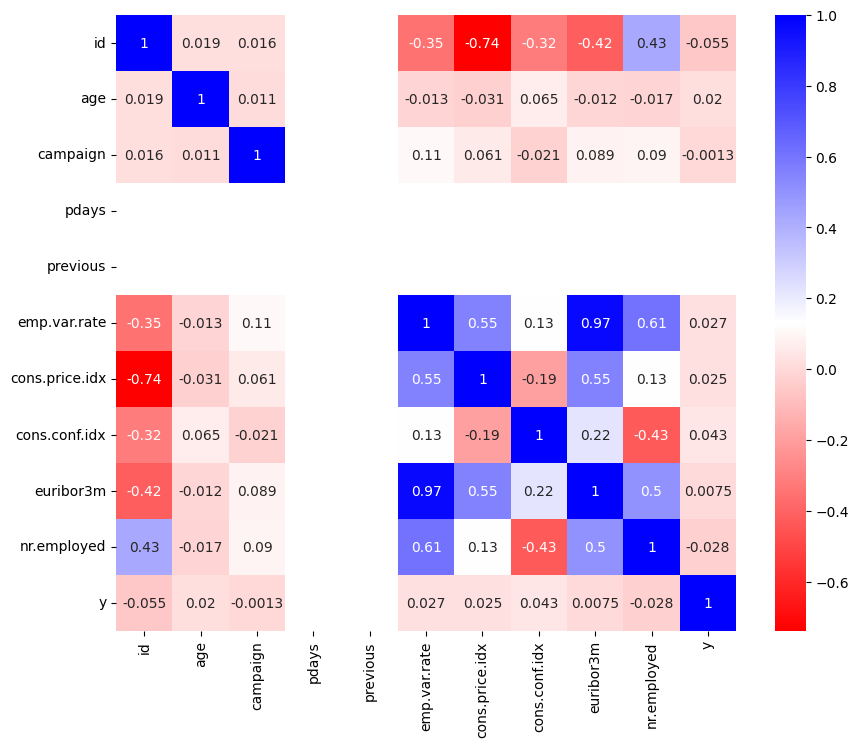

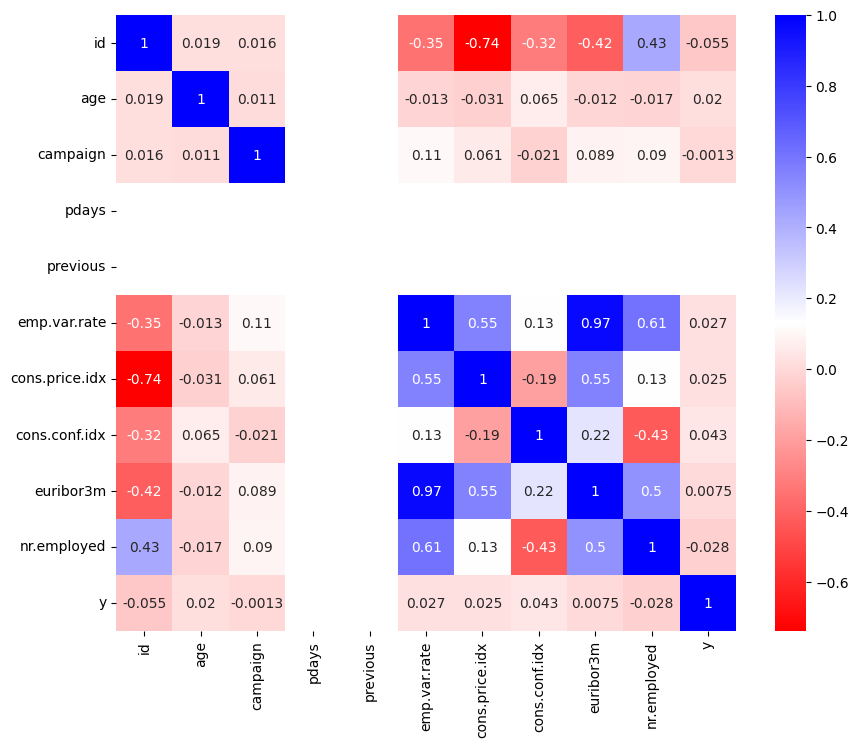

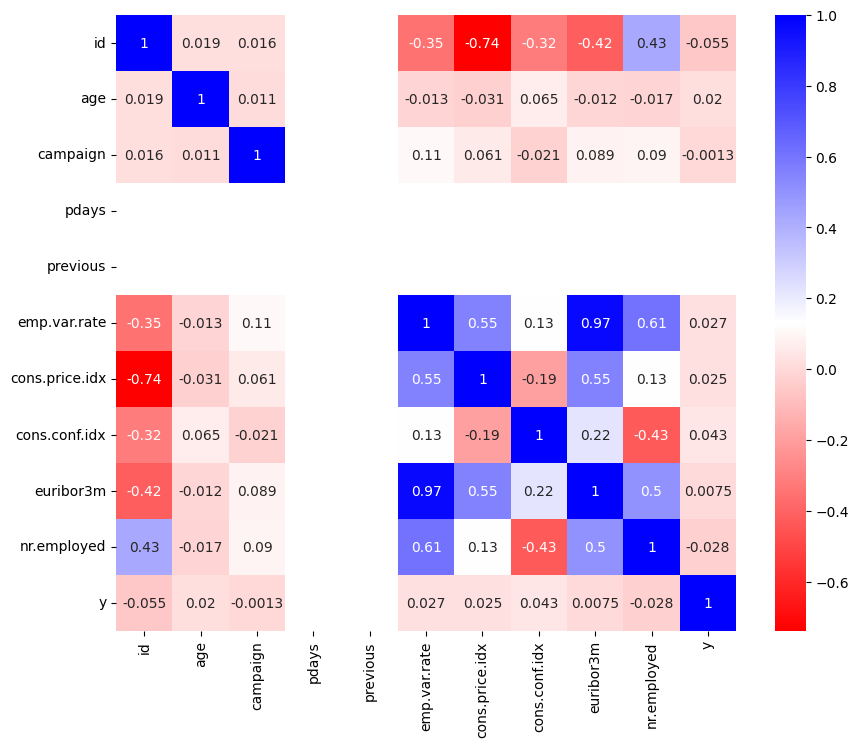

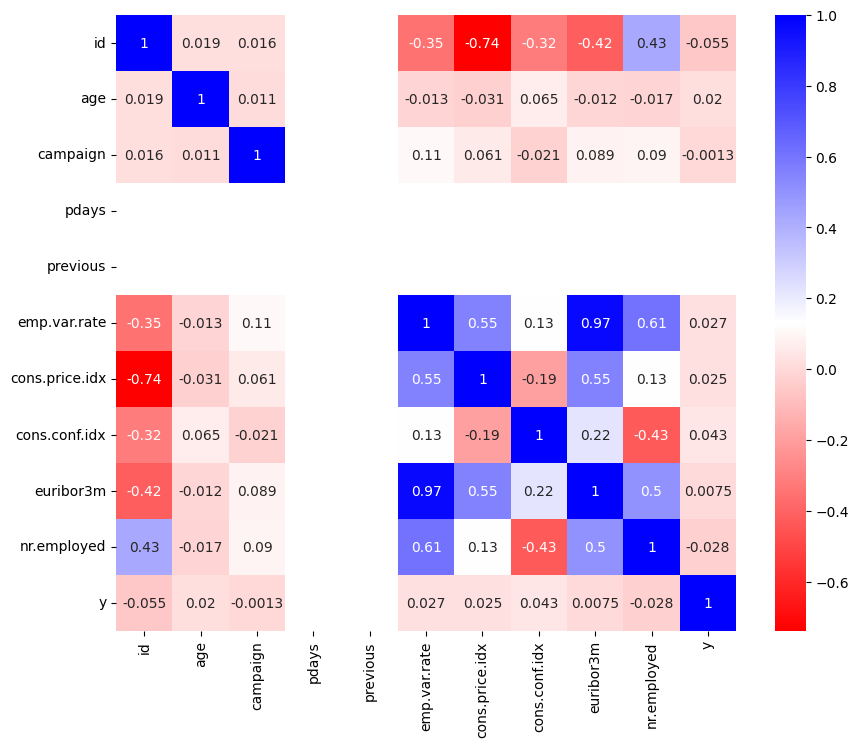

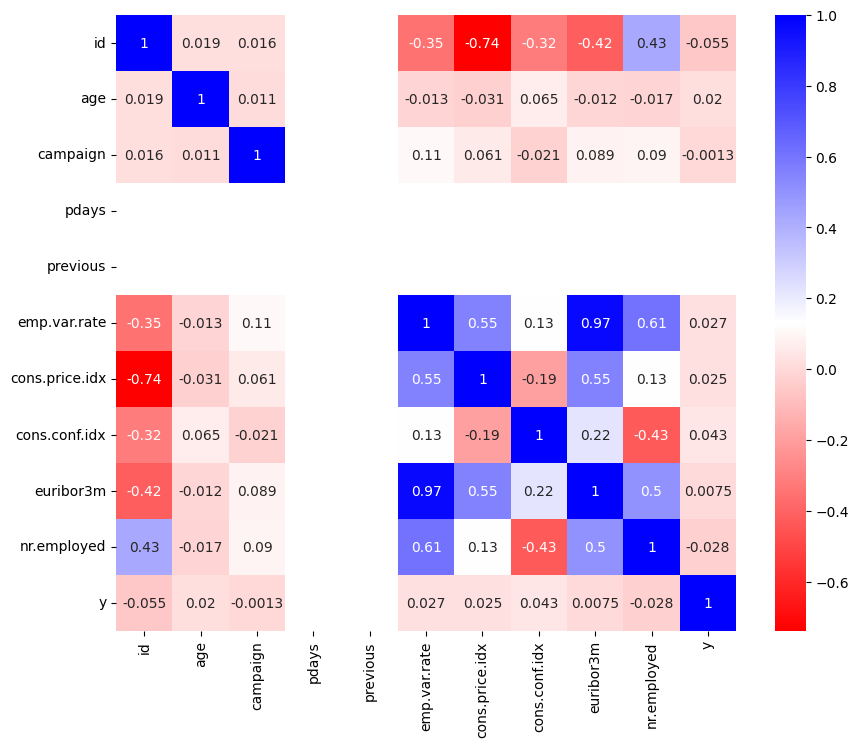

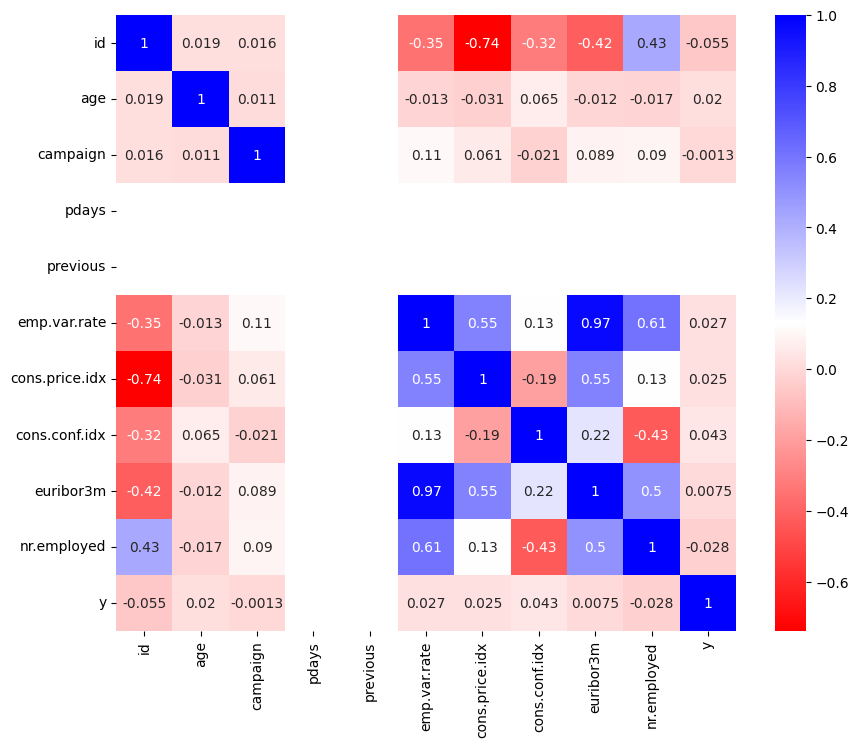

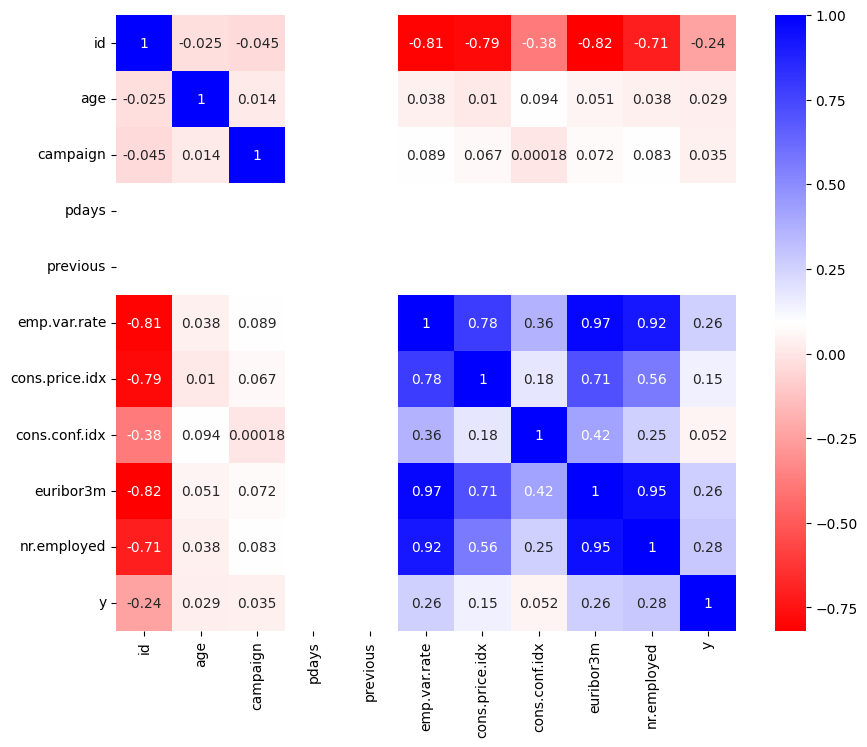

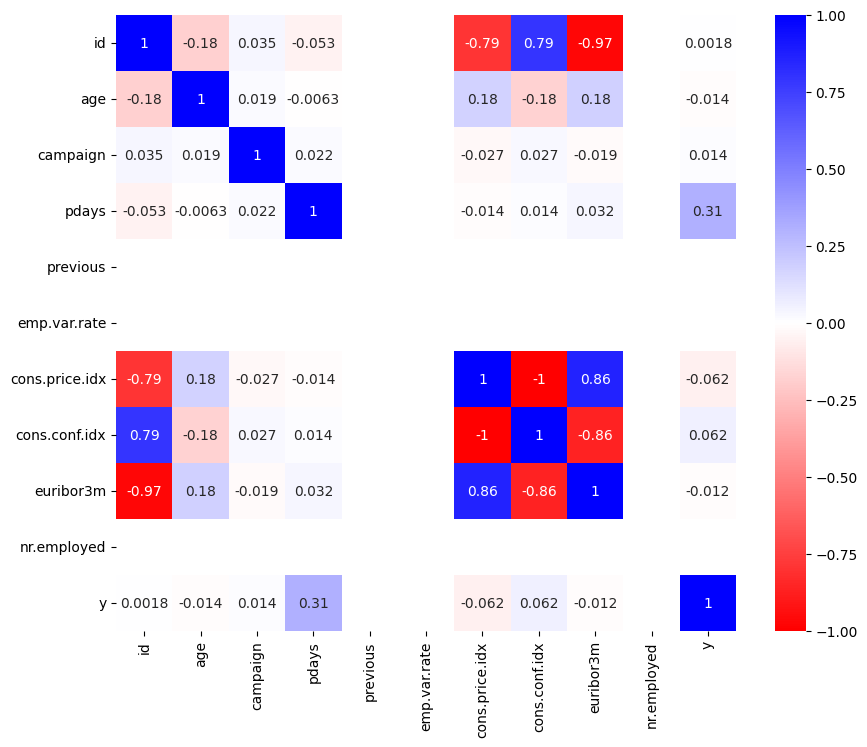

In [ ]:
# 이상치 제거해서 뻥뻥 뚫린 게 많음
for df in outlier_group:
  plt.figure(figsize=(10, 8))
  numeric_df = df.copy()
  numeric_df['y'] = numeric_df['y'].replace({"yes": 0, "no": 1})
  numeric_df = numeric_df.select_dtypes(include=[np.number])
  corr = numeric_df.corr()
  sns.heatmap(corr, cmap='bwr_r', annot=True)
  plt.show()

- 범주형: 모자이크 플롯
```
from statsmodels.graphics.mosaicplot import mosaic
mosaic(df, ['y', ''])
plt.axhline(1-df['y'].mean(), color='r')
plt.show()
```

- 범주형: 카이 제곱 검정
- 결과: poutcome이 연관 높음
```
import scipy.stats as spsst
# 관련이 높을수록 수치가 내려감
table = pd.crosstab(df['y'], df[''])
result = spst.chi2_contingency(table)
print(f'카이제곱통계량: {result[0]}, p-value: {result[1]}, 기대빈도: {result[2]}')
```

In [ ]:
import scipy.stats as spst

for col in category_cols:
  table = pd.crosstab(df['y'], df[col])
  result = spst.chi2_contingency(table)
  print(f'{col}, 카이제곱통계량: {result[0]}, p-value: {result[1]}, 기대빈도: {result[2]}')

job, 카이제곱통계량: 823.0874915297363, p-value: 2.087375569442555e-169, 기대빈도: 11
marital, 카이제곱통계량: 100.38300753967457, p-value: 1.2857026675812702e-21, 기대빈도: 3
education, 카이제곱통계량: 172.13222152734033, p-value: 8.91492073972669e-34, 기대빈도: 7
default, 카이제곱통계량: 327.20759030255596, p-value: 8.866955876990686e-72, 기대빈도: 2
housing, 카이제곱통계량: 3.587222436418947, p-value: 0.1663583274079916, 기대빈도: 2
loan, 카이제곱통계량: 0.4567525706806522, p-value: 0.7958247463022096, 기대빈도: 2
contact, 카이제곱통계량: 681.6945442347649, p-value: 2.8603615989122265e-150, 기대빈도: 1
month, 카이제곱통계량: 2471.9753029779276, p-value: 0.0, 기대빈도: 9
day_of_week, 카이제곱통계량: 14.016539791662586, p-value: 0.007242454207338837, 기대빈도: 4
poutcome, 카이제곱통계량: 3437.5825261569544, p-value: 0.0, 기대빈도: 2
y, 카이제곱통계량: 32939.99718482027, p-value: 0.0, 기대빈도: 1


In [ ]:
import scipy.stats as spst

# 결측치, 이상치 처리 df
# 이상치 제거로 인해 데이터가 없어서 에러나네 ㅎㅎ
for catego_df in outlier_group:
  df = catego_df.copy()
  df = df.drop(columns=numeric_cols)
  for col in category_cols:
    table = pd.crosstab(df['y'], df[col])
    result = spst.chi2_contingency(table)
    print(f'{col}, 카이제곱통계량: {result[0]}, p-value: {result[1]}, 기대빈도: {result[2]}')
  print()

job, 카이제곱통계량: 11.912977163092924, p-value: 0.2909228512660108, 기대빈도: 10
marital, 카이제곱통계량: 6.188049149979793, p-value: 0.04531919638529088, 기대빈도: 2
education, 카이제곱통계량: 7.705485838479446, p-value: 0.26048386915604554, 기대빈도: 6
default, 카이제곱통계량: 0.0, p-value: 1.0, 기대빈도: 1
housing, 카이제곱통계량: 1.4602741015111125, p-value: 0.22688651337413118, 기대빈도: 1
loan, 카이제곱통계량: 0.0727658274725991, p-value: 0.7873515005048225, 기대빈도: 1
contact, 카이제곱통계량: 36.45922876376264, p-value: 1.5589325342323825e-09, 기대빈도: 1
month, 카이제곱통계량: 483.3446139724924, p-value: 3.2513854927828646e-101, 기대빈도: 6
day_of_week, 카이제곱통계량: 11.371888937861236, p-value: 0.02268759484337769, 기대빈도: 4
poutcome, 카이제곱통계량: 0.0, p-value: 1.0, 기대빈도: 0
y, 카이제곱통계량: 19914.38098806355, p-value: 0.0, 기대빈도: 1

job, 카이제곱통계량: 11.912977163092924, p-value: 0.2909228512660108, 기대빈도: 10
marital, 카이제곱통계량: 6.188049149979793, p-value: 0.04531919638529088, 기대빈도: 2
education, 카이제곱통계량: 7.705485838479446, p-value: 0.26048386915604554, 기대빈도: 6
default, 카이제곱통계량: 0.0, p

ValueError: No data; `observed` has size 0.

## Feature 추출

- features 선택: group 별로 돌려보고 젤 성능 좋은 features 추출
- 매 분석마다 다르게 나와서 여러 feature group 도출
- 일단 y는 지우지말기
- split은 뒤에서 할거라서

In [ ]:
feature_group = []

In [ ]:
# 1) 결측치가 있던 컬럼은 피쳐에서 제외 후 실험
# 추가적으로 target인 'y'도 featuer에서는 지워주는 게 맞는데 일단 ㄴㄴ
list1 = train_df.columns
list2 = ['job', 'marital', 'education', 'default', 'housing', 'loan', 'poutcome']
# list1 - list2
feature = [item for item in list1 if item not in list2]
feature_group.append(feature)
print(feature)

['id', 'age', 'contact', 'month', 'day_of_week', 'campaign', 'pdays', 'previous', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'y']


In [ ]:
# 2) 결측치가 많았던 poutcome을 제외 후 실험
list2 = ['poutcome']
feature = [item for item in list1 if item not in list2]
feature_group.append(feature)

In [ ]:
# 3) 상관분석이 높았던 컬럼만 가지고 실험
# 연속형: pdays, emp.var.rate, euribor3m, nr.employed, previous
# 범주형: poutcome (고정)
feature = ['pdays', 'emp.var.rate', 'euribor3m', 'nr.employed', 'previous', 'poutcome', 'y']
feature_group.append(feature)

# 연속형: pdays, emp.var.rate, euribor3m, nr.employed
feature = ['pdays', 'emp.var.rate', 'euribor3m', 'nr.employed', 'poutcome', 'y']
feature_group.append(feature)


# 연속형: pdays, cons.conf.idx, euribor3m, nr.employed
feature = ['pdays', 'cons.conf.idx', 'euribor3m', 'nr.employed', 'y']
feature_group.append(feature)

# 연속형: emp.var.rate, euribor3m, nr.employed
feature = ['emp.var.rate', 'euribor3m', 'nr.employed', 'y']
feature_group.append(feature)


# 연속형: cons.conf.idx, nr.employed
feature = ['cons.conf.idx', 'nr.employed', 'y']
feature_group.append(feature)

# 연속형: pdays
feature = ['pdays', 'y']
feature_group.append(feature)

- train_df, imputed_df, outlier_df를 묶자

In [ ]:
train_group = []

In [ ]:
# feature 별로 재결합한 dataset 수집
def add_dataset_by_feature(df):
  for feature in feature_group:
    new_df = df.copy()
    train_group.append(new_df)

In [ ]:
add_dataset_by_feature(train_df)

for df in imputed_group:
  add_dataset_by_feature(df)

for df in outlier_group:
  add_dataset_by_feature(df)

In [ ]:
train_group[0].columns

Index(['id', 'age', 'job', 'marital', 'education', 'default', 'housing',
       'loan', 'contact', 'month', 'day_of_week', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [ ]:
train_group[130].columns

Index(['id', 'age', 'job', 'marital', 'education', 'default', 'housing',
       'loan', 'contact', 'month', 'day_of_week', 'campaign', 'pdays',
       'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx',
       'cons.conf.idx', 'euribor3m', 'nr.employed', 'y'],
      dtype='object')

In [ ]:
len(train_group)

136

In [ ]:
train_group[133].head(2)

,emp.var.rate,euribor3m,nr.employed,y
28,-1.8,1.365,5099.1,yes
47,-1.8,1.281,5099.1,no


In [ ]:
# 피쳐 그룹별로 세분화 후
# 결측치 없는 지 확인
for df in train_group:
  print(df.isnull().sum())

id                0
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64
id                0
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype: int64
id                0
age               0
job               0
marital           0
education         0
default           0
housing       

## 4. 인코딩
- 범주형 -> 수치형
- target label인 'y'는 제외하고 진행
#### OneHotEncoding


In [ ]:
df = train_df.copy()
for col in df.columns:
  print(df[col].dtype)

int64
int64
object
object
object
object
object
object
object
object
object
int64
int64
int64
object
float64
float64
float64
float64
float64
object


In [ ]:
def encode(orginal_df):
  df = orginal_df.copy()

  for col in df.columns:
    if df[col].dtype == 'object' and col != 'y':
      addition = pd.get_dummies(df[col], prefix=col)
      #print(addition.columns)

      #df.drop(columns=[col], inplace=True)
      #df = pd.concat([df, addition])

      df = pd.concat([df, addition], axis=1).drop([col], axis=1)

      #print(df.columns)

    # y를 맨 뒤로 이동
    y = df['y']
    df = df.drop(['y'], axis=1)
    df = pd.concat([df, y], axis=1)

  return df

In [ ]:
encoded_df_group = []

# 위에서 feature 추출하냐고 머지해버림
for df in train_group:
  df = encode(df)
  encoded_df_group.append(df)

In [ ]:
# 원핫인코딩 후 결측치 없는 지 확인
for df in encoded_df_group:
  print(df.isnull().sum())

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
marital_married                  0
marital_single                   0
education_basic.4y               0
education_basic.6y               0
education_basic.9y               0
education_high.school            0
education_illiterate             0
education_professional.course    0
education_university.degree      0
default_no                       0
default_yes                      0
housing_no                       0
housing_yes                      0
loan_no                          0
loan_yes                         0
contact_cellular                 0
contact_telephone                0
month_apr                        0
month_aug                        0
month_dec                        0
month_jul                        0
month_jun                        0
month_mar                        0
month_may                        0
month_nov                        0
month_oct                        0
month_sep                        0
day_of_week_fri    

In [ ]:
# 원핫인코딩 후 결측치 없는 지 확인
for df in encoded_df_group[:50]:
  print(df.isnull().sum())

id                               0
age                              0
campaign                         0
pdays                            0
previous                         0
emp.var.rate                     0
cons.price.idx                   0
cons.conf.idx                    0
euribor3m                        0
nr.employed                      0
job_admin.                       0
job_blue-collar                  0
job_entrepreneur                 0
job_housemaid                    0
job_management                   0
job_retired                      0
job_self-employed                0
job_services                     0
job_student                      0
job_technician                   0
job_unemployed                   0
job_unknown                      0
marital_divorced                 0
marital_married                  0
marital_single                   0
marital_unknown                  0
education_basic.4y               0
education_basic.6y               0
education_basic.9y  

In [ ]:
# 원핫인코딩 후 결측치 없는 지 확인
for df in encoded_df_group[50:]:
  print(df.isnull().sum())

id                               0
age                              0
campaign                         0
pdays                            0
previous                         0
emp.var.rate                     0
cons.price.idx                   0
cons.conf.idx                    0
euribor3m                        0
nr.employed                      0
job_admin.                       0
job_blue-collar                  0
job_entrepreneur                 0
job_housemaid                    0
job_management                   0
job_retired                      0
job_self-employed                0
job_services                     0
job_student                      0
job_technician                   0
job_unemployed                   0
marital_divorced                 0
marital_married                  0
marital_single                   0
education_basic.4y               0
education_basic.6y               0
education_basic.9y               0
education_high.school            0
education_illiterate

## 5. 정규화
#### StandardScaler
- 표준화를 쉽게 지원하기 위한 클래스
- 즉, 개별 피처를 평균이 0이고, 분산이 1인 값으로 변환
- 사이킷런 RBF 커널 SVM, 선형회귀, 로지스틱 회귀: 데이터의 가우시안 반포 가정 → 표준화를 적용하는 것은 예측 성능 향상에 중요한 요소
```
from sklearn.preprocessing import StandardScaler
# Normalize the data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
```

In [ ]:
from sklearn.preprocessing import StandardScaler

# Normalize the data
scaler = StandardScaler()

In [ ]:
nomalized_df_group = []

for org_df in encoded_df_group:
  df = org_df.copy()
  arr = df.copy()
  arr = arr.drop('y', axis=1, inplace=False)
  arr = scaler.fit_transform(arr)

  # array -> df화
  arr = pd.DataFrame(imputer.fit_transform(arr))

  # 컬럼명이 index로 변해져있음 -> 원래대로 변경
  arr.columns = org_df.drop('y', axis=1, inplace=False).columns

  # target y 추가
  df = pd.concat([arr, df['y']], axis=1)
  print(df.isnull().sum())
  print()
  for col in df.columns:
    df[col] = df[col].astype(org_df[col].dtype)

  #print(df.info())

  # 리스트에 추가
  nomalized_df_group.append(df)

id                               0
age                              0
campaign                         0
pdays                            0
previous                         0
emp.var.rate                     0
cons.price.idx                   0
cons.conf.idx                    0
euribor3m                        0
nr.employed                      0
job_admin.                       0
job_blue-collar                  0
job_entrepreneur                 0
job_housemaid                    0
job_management                   0
job_retired                      0
job_self-employed                0
job_services                     0
job_student                      0
job_technician                   0
job_unemployed                   0
job_unknown                      0
marital_divorced                 0
marital_married                  0
marital_single                   0
marital_unknown                  0
education_basic.4y               0
education_basic.6y               0
education_basic.9y  

IntCastingNaNError: Cannot convert non-finite values (NA or inf) to integer

## 📌 EDA
- 시각화
- features 선택
- 걍 생략

# 📌 머신러닝을 이용한 클러스터링

- 아래 두 데이터 그룹에 대해 돌려보기
  - encoded data set
  - nomalized data set


#### lab4
- Logistic Regression
- Polynomial Regression
- Decision Tree

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeClassifier

# Cross Validation (모델 평가)
from sklearn.model_selection import KFold, cross_val_score

In [ ]:
max_iter = 10000

# 모든 모델들을 dictionary 형태로 넣어서 각각 학습
models = {
  "Baseline": LogisticRegression(solver="saga", max_iter=max_iter, penalty=None),
  "L2": LogisticRegression(solver="saga", max_iter=max_iter, penalty="l2", C=1.0),
  "L1": LogisticRegression(solver="saga", max_iter=max_iter, penalty="l1", C=1.0),
  "Polynomial": Pipeline([("poly_features", PolynomialFeatures(degree=2)),
                          ("softmax_reg", LogisticRegression(solver="saga", max_iter=max_iter, penalty=None))]),
  "DecisionTree": DecisionTreeClassifier(criterion="gini", max_depth=5, min_samples_split=2, min_impurity_decrease=0.0)
}


## 머신러닝 모델 평가
# n_splites = number of k  (default: 5)
random_state = 100
kf = KFold(n_splits=5, shuffle=True, random_state=random_state)

# 머신러닝으로 분류한 k개의 samples에 대해서 score를 확인하기
# cross validation 방식으로 train set을 가지고 모델을 평가하기
# scoring은 5가지 방식
'''
1) accuracy: Accuracy (default)
2) roc_auc: Area under the receiver operating characteristic (ROC) curve
3) f1: F1 score
4) precision: Precision
5) recall: Recal
'''

'''
scores = cross_val_score(model, X_train, y_train, cv=kf, scoring="roc_auc")

# k개 samples의 score를 각각 배열(list)로 확인
print("Scores from each iteration:", scores)
# k개 samples의 score를 평균내기
print("Average score:", scores.mean())
'''

- 일단 인코딩 안 한 train_group으로 진행해보자

In [ ]:
# for문을 이용해 각각의 모델에 대해 모델 평가 수행 및 ROC 값을 프린트해서 성능 비교
scores = {}
for name, model in models.items():
    for df in encoded_df_group:
     # print(df.columns)
      X_train = df.drop('y', axis=1, inplace=False).values
      y_train = df['y'].values
      _scores = cross_val_score(model, X_train, y_train, cv=kf, scoring="roc_auc")
      print(X_train.head(2))
      print(_scores)
      print("{}: {}".format(name, _scores))
      scores[name] = _scores.mean()

In [ ]:
print(scores)

{}


- Evaluation

In [ ]:
from sklearn.metrics import accuracy_score, f1_score, roc_auc_score

# 현재 분류 문제에 제일 좋은 성능을 보인 Decision Tree 모델로
# 본격적인 학습을 하고 test data로 예측을 하고
# 최종적인 평가를 진행해보자.
model = DecisionTreeClassifier(criterion="entropy",
                               max_depth=5,
                               min_samples_split=2,
                               min_impurity_decrease=0.0)

model.fit(X_train, y_train)

y_prob = model.predict_proba(X_test)
print("Estimated probs:", y_prob[:10])

y_cls = model.predict(X_test)
print("Estimated classes:", y_cls[:10])
print()

# 3가지 평가 지표 (evalution metrics)
print("Accuracy:", accuracy_score(y_test, y_cls))
print("F1:", f1_score(y_test, y_cls))
print("ROC AUC:", roc_auc_score(y_test, y_prob[:, 1]))

In [ ]:
# TP, FP, FN, TN에 대해 혼동행렬 출력
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(y_test, y_cls)
conf_matrix_df = pd.DataFrame(
    conf_matrix,
    columns=["Predicted Not-Survived", "Predicted Survived"],
    index=["Actual Not-Survived", "Actual Survived"]
)
print(conf_matrix_df)

In [ ]:
# ROC Curve 출력
from sklearn.metrics import confusion_matrix

conf_matrix = confusion_matrix(y_test, y_cls)
conf_matrix_df = pd.DataFrame(
    conf_matrix,
    columns=["Predicted Not-Survived", "Predicted Survived"],
    index=["Actual Not-Survived", "Actual Survived"]
)
print(conf_matrix_df)

#### Lab5. Ensemble

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

from sklearn.model_selection import KFold, GridSearchCV

In [ ]:
# 성능 측정 방식은 Negative MSE로 할 것임
# 다른 방식으로 해도 됨
kf = KFold(n_splits=5, shuffle=True, random_state=random_state)
scoring = "neg_mean_squared_error"

models = {}

- Decision Tree

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# 예측
processed_test_df = test_df.copy()
processed_test_df = encode(processed_test_df)
processed_test_df = scaler.transform(processed_test_df)

# 📌 Results